<a href="https://colab.research.google.com/github/907Resident/caldera-gases/blob/fluxes/site_differentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Site Differentation
How are the sites similar and/or different?

The diffuse gas measurements collected at both calderas highlight spatial trends at the caldera scale and provide an avenue of insight that differs from the previously published point source emission studies. Furthermore, these data will be compared against previous diffuse CO$_{2}$ fluix and carbon isotope measurements and introduce novel diffuse CH$_{4}$ data as well.

## Import necessary libraries

Import the needed generic libraries

In [1]:
# Import KS test for normality from statsmodels
from statsmodels.stats.diagnostic import kstest_normal
# Import the KW test from scipy
from scipy.stats import kruskal

# Import FK test for unequal variance from `scipy` module
from scipy.stats import fligner, ks_2samp, wilcoxon
from scipy import stats

# Import Standard Error of Mean from `scipy` module
from scipy.stats import sem

# Import regression tools
import statsmodels.api as sm
from statsmodels.sandbox.regression.predstd import wls_prediction_std

# Import notebook aid packages
from IPython.core.pylabtools import figsize
from natsort import index_natsorted

# Import packages needed for connecting to google drive (Colab only)
try:
    from google.colab import drive
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

# Import tools for working with enumerated data
import itertools, copy

# Import fundamental packages
from pandas.core.arrays.categorical import Categorical
from matplotlib import cm

from matplotlib.ticker import MaxNLocator
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import pandas as pd
import numpy as np

# Import axis formatting package
import matplotlib.ticker as ticker

# Import other essential python packages
import matplotlib
import zipfile
import fnmatch
import h5py
import time
import glob
import math
import re
import os


In [2]:
# Helper: save figure as both PNG and SVG in separate subdirectories
def save_fig(obj, path, dpi=300, **kwargs):
    """Save a figure as PNG (figures/png/) and SVG (figures/svg/)."""
    import os
    dir_part = os.path.dirname(path) or "."
    name = os.path.splitext(os.path.basename(path))[0]
    png_path = os.path.join(dir_part, "png", f"{name}.png")
    svg_path = os.path.join(dir_part, "svg", f"{name}.svg")
    os.makedirs(os.path.join(dir_part, "png"), exist_ok=True)
    os.makedirs(os.path.join(dir_part, "svg"), exist_ok=True)
    obj.savefig(png_path, dpi=dpi, **kwargs)
    obj.savefig(svg_path, **kwargs)


Install the non-generic libraries through `pip` and then import.

In [3]:
from scikit_posthocs import posthoc_conover as conover
from janitor import clean_names, rename_columns
from joypy import joyplot
from tqdm import tqdm

import probscale
import utm

Establish the basics for visualizations. Through the `plt.style.available`, all of the styles available for creating the plots. More information on plotting styles can be found [here](https://matplotlib.org/stable/gallery/style_sheets/style_sheets_reference.html).

In [4]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'petroff10',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

In this case, we will use a version of `seaborn-paper` so that the figures will be presentable for a written documnent.

In [5]:
# Establish plot paramters
custom_params = {
    "axes.spines.right": False,
    "axes.spines.top": False,
    "xtick.labelsize":16,
    "ytick.labelsize":16,
    "font.size": 18,
    "grid.alpha": 0.25,
    "legend.title_fontsize": 16,
    "legend.fontsize": 15
}

# plt.style.use(['seaborn-paper'])
sns.set_theme(
    style="whitegrid",
    context="paper",
    rc=custom_params
)

Establish colors for plots

| Color        | Caldera            | Gas                | Hex Code |
| ----         | -----              | ---                | -------  |
| Dark Blue    | YC                 | CH<sub>4</sub>     | #66b3ff  |
| Light Blue   | VC                 | CH<sub>4</sub>     | #b3daff  |
| Dark Magenta | YC                 | CO<sub>2</sub>     | #d966ff  |
| Light Magenta| VC                 | CO<sub>2</sub>     | #ffb3ff  |
| Black        | East YC / North VC | Both gases         | #ffffff  |
| Gray         | West YC / South VC | Both gases         | #737373  |
| Goldenrod    | YC                 | Both gases         | #ffe51c  |
| Light Pink   | VC                 | Both gases         | #f5dae3  |


In [6]:
# Establish the color for CH4 (blue) and CO2 (magenta) with hexdecimal codes

# YC and VC colors
CH4_color1 = "#66b3ff"
CO2_color1 = "#d966ff"
CH4_color2 = "#b3daff"
CO2_color2 = "#f59cff"
# East-North caldera side YC-VC
caldera_side_color_en = "#488485"
# West-South caldera side YC-VC
caldera_side_color_ws = "#00f8fc"
# Yellowstone
yc_color = "#ffe51c"
# Valles
vc_color = "#f5dae3"


Lists of markers for scatterplots

In [7]:
markers_4 = ["^", "o", "*", "*"]
markers_8 = ["^", "o", "*", "*", "D", "+", "8", "X"]

Set the format for date tick labels for all plots

In [8]:
# set the datetime format
_datetick_format = mdates.DateFormatter("%Y-%m-%d %H:%M")

## Import Data

### Mount Google Drive

In [9]:
# Connect to Google Drive (Colab only)
if IN_COLAB:
    drive.mount('/content/gdrive')


In [10]:
# Set working directory
if IN_COLAB:
    os.chdir('/content/gdrive/My Drive/Colab Notebooks/caldera-gases/src/notebooks')
# When running locally, the CWD is already src/notebooks/


### Understand the Directory

The notebook(s) attached to this project will be located within the `src/notebooks` directory. To help users understand the relative paths used in this project, the image below shows the folders affiliated with `caldera-gases`:

In [11]:
!tree ../../ -I tokenizers -d

../../
├── docs
├── figures
│   ├── png
│   └── svg
├── pertinent-data
│   ├── calibration-data
│   │   ├── 20180404-dat
│   │   ├── 20180412-dat
│   │   ├── 20180420-dat
│   │   └── 20190523-h5
│   │       └── Picarro
│   │           └── G2000
│   │               └── Log
│   │                   └── DataLogger
│   │                       └── DataLog_Private
│   ├── dat-files
│   ├── egm-data
│   ├── inferential-stats-output
│   │   ├── valles
│   │   └── yellowstone
│   ├── mat-files
│   ├── other-data
│   ├── summary-data
│   │   └── archive
│   └── xlsx-files
│       ├── clpd
│       ├── cstl
│       ├── disy
│       ├── gbsn
│       ├── gvnt
│       ├── mdvc
│       ├── prcn
│       └── yslk
└── src
    ├── custom-package
    │   └── calderas
    ├── data-webapp
    │   └── pages
    ├── matlab
    │   └── MATLAB-functions
    └── notebooks

41 directories


/opt/homebrew/Cellar/python@3.12/3.12.10_1/Frameworks/Python.framework/Versions/3.12/lib/python3.12/pty.py:95: DeprecationWarning: This process (pid=2775) is multi-threaded, use of forkpty() may lead to deadlocks in the child.
  pid, fd = os.forkpty()


### Programmatically Upload Summary Data
Assuming the files are up to date, they can be uploaded into the workspace programmatically

#### Google Drive |  Yellowstone - Programmatically Import Data

In [12]:
# Upload Yellowstone Summary Data
df_2018_YC = pd.read_excel(
    "../../pertinent-data/summary-data/YNP_SummaryData.xlsx",
    sheet_name="2018",
    header=0,
  )
# Delete first row that contains secondary data information
df_2018_YC.drop([0], inplace=True)

# Reset index
df_2018_YC.reset_index(drop=True, inplace=True)

In [13]:
# Upload Yellowstone Summary Data
df_2019_YC = pd.read_excel(
    "../../pertinent-data/summary-data/YNP_SummaryData.xlsx",
    sheet_name="2019",
    header=0,
  )
# Delete first row that contains secondary data information
df_2019_YC.drop([0], inplace=True)

# Reset index
df_2019_YC.reset_index(drop=True, inplace=True)

#### Google Drive |  Valles Caldera - Programmatically Import data

In [14]:
# Import file into workspace
df_2017_VC = pd.read_excel(
    "../../pertinent-data/summary-data/VC_SummaryData.xlsx",
    sheet_name="2017",
    header=0,
  )
# Delete first row that contains secondary data information
df_2017_VC.drop([0], inplace=True)

# Reset index
df_2017_VC.reset_index(drop=True, inplace=True)

In [15]:
# Import file into workspace
df_2019_VC = pd.read_excel(
    "../../pertinent-data/summary-data/VC_SummaryData.xlsx",
    sheet_name="2019",
    header=0
  )

# Change the soil chemistry classification of Hummingbird to acid-sulfate
df_2019_VC.loc[df_2019_VC.Group=="Hummingbird", "Soil_Classification"] = "Acid-Sulphate"

# Delete first row that contains secondary data information
df_2019_VC.drop([0], inplace=True)

# Reset index
df_2019_VC.reset_index(drop=True, inplace=True)

### Customized Utilities

This subsection contains functions, classes, and other customized code that builds more efficiency in the notebook.

#### Utility Classes

In [16]:
# define Python user-defined exceptions
class Error(Exception):
  """Base class for other exceptions"""
  pass

class NotADataFrame(Error):
  """Raised when the value is not a dataframe."""
  pass

class NotAColumn(Error):
  """A column requested from the dataframe does not exist."""

#### Utility Functions

In [17]:
def percent_difference(a, b, digits_after_decimal:int=2):

    result = ((b - a) / ((b+a)/2)) * 100
    result = round(result, digits_after_decimal)

    return result

In [18]:
def basic_preprocessing(df):
  # Set dictionary for correct data types
  data_types = {
      "Group":"category",
      "Location":"object",
      "Soil_Classification":"category",
      "Latitude":"float64","Longitude":"float64",
      "Date_of_Measurement":"datetime64[ns]",
      "Start_Time_of_Chamber_Enclosure":"datetime64[ns]",
      "End_Time_of_Chamber_Enclosure":"datetime64[ns]",
      "Duration_of_Total_Chamber_Enclosure":"float64",
      "Start_Time_Flux":"datetime64[ns]",
      "End_Time_Flux":"datetime64[ns]",
      "CH4_Flux":"float64",
      "LowerBound_CH4_Flux":"float64",
      "UpperBound_CH4_Flux":"float64",
      "KP_d13CH4_source":"float64",
      "KP_LowerBound_d13CH4_source":"float64",
      "KP_UpperBound_d13CH4_source":"float64",
      "d13CH4_source":"float64",
      "d13CH4_LowerBound_source":"float64",
      "d13CH4_UpperBound_source":"float64",
      "CO2_Flux":"float64",
      "LowerBound_CO2_Flux":"float64",
      "UpperBound_CO2_Flux":"float64",
      "d13CO2_source":"float64",
      "KP_d13CO2_source":"float64",
      "KP_LowerBound_d13CO2_source":"float64",
      "KP_UpperBound_d13CO2_source":"float64",
      "d13CO2_source":"float64",
      "d13CO2_LowerBound_source":"float64",
      "d13CO2_UpperBound_source":"float64",
      "Horita_Geothermometer_Temperature_at_Formation":"float64",
      "Ambient_Temperature":"float64",
      "Barometric_Pressure":"float64",
      "Soil_Tempeature_at_Surface":"float64"
    }
  # Set data types accordingly
  df = df.astype(data_types)
  # Drop unnecessary columns
  df.drop(df.columns[30:33], axis=1, inplace=True)
  df.drop(df.columns[-1], axis=1, inplace=True)

  # Return data frame
  return df

In [19]:
# Quantify the number of measurements lost due to removing fluxes less than zero
def perc_diff(val1, val2):
  '''
  Using the number of rows from the original concatenated dataframe and the
  trimmed dataframe, quantify the percent difference between the number of
  rows lost
  '''
  diff = val1 - val2
  diff = np.absolute(diff)
  sum_val = val1 + val2
  perc_diff = (diff / (sum_val / 2)) * 100

  return perc_diff

In [20]:
# Function to fit and assess parameters of distributions against observed data
def assess_fit_params(data):
  '''
  This function quantifies and ranks the best distribution to fit the input,
  data. It examines several distributions (see 'list_of_dists') and fits them to
  the data to estimate the parameters using the maximum likelihood estimate
  (MLE) algorithm. After the parameters have been approximated, a
  Kolmogorov-Smirnov (KS) test is employed to measure which of the
  distributions had the lowest test statistic. The user must check that the
  p-value is appropriate as well.

  INPUT: `data` is a 1-D series or array
  OUTPUT: `df` is a 9x3 dataframe that contains results from fit and KS test
  '''
  # Import stats package from scipy
  # Establish list of distributions to be tested against observed data
  list_of_dists = ["beta", "burr12", "chi2", "expon","fisk", "gamma",
                   "genlogistic","genpareto", "genexpon", "genextreme",
                   "invgamma", "loggamma", "lognorm", "maxwell",  "norm",
                   "pareto","pearson3", "powerlaw", "rayleigh", "t", "vonmises",
                   "weibull_min"]
  # Establish an empty array to hold MLE parameters
  mle_param_estimates = []
  # Loop through list of distributions to get MLE parameter estimates
  for i in list_of_dists:
    dist = getattr(stats, i)
    param = dist.fit(data)
    a = stats.kstest(data, i, args=param)
    mle_param_estimates.append((i,a[0],list(param),a[1]))
  # Sort results by p-value
  mle_param_estimates.sort(key=lambda x:float(x[3]), reverse=True)
  # Organize results into dataframe
  df = pd.DataFrame(
      mle_param_estimates,
      columns=[
          "distribution",
          "statistic",
          "params",
          "p_value"
        ]
    )
  df = df.sort_values(by="p_value", ascending=False)
  # Return results
  return df

In [21]:
def plot_theoretical_dist(
    data,
    # params,
    dist_name="norm",
    n_bins=20
):

  sz = len(data)
  h = plt.hist(data, bins=range(n_bins))

  dist = getattr(stats, dist_name)
  params = dist.fit(data)
  arg = params[:-2]
  loc = params[-2]
  scale = params[-1]
  if arg:
      pdf_fitted = dist.pdf(data, *arg, loc=loc, scale=scale) #* sz
  else:
      pdf_fitted = dist.pdf(data, loc=loc, scale=scale) #* sz
  plt.plot(pdf_fitted, label=dist_name)

  plt.xlim(0,np.max(data))
  plt.legend(loc="upper right")
  plt.show()

In [22]:
def group_egm_data(egm_df, caldera="YNP"):

  # Yellowstone
  if (re.search("YNP", caldera, re.IGNORECASE)) or (re.search("Yellowstone", caldera, re.IGNORECASE)):
    if "Site" in egm_df.columns:

      egm_df["Group"] = pd.Series(index=range(len(egm_df)))

      # convert this loop into a function using _group as an argument
      for i in range(len(egm_df)):

        _site = egm_df["Site"].iloc[i]

        # upper gb
        if (_site == "CSTL") or (_site == "GRND") or (_site == "DISY"):
          egm_df["Group"].iloc[i] = "Upper GB"
        # lower gb
        elif (_site == "CLPD") or (_site == "GFTN"):
          egm_df["Group"].iloc[i] = "Lower GB"
        # terrace springs
        elif (_site == "GBSN"):
          egm_df["Group"].iloc[i] = "Terrace Springs"
        # norris gb
        elif (_site == "NGBN"):
          egm_df["Group"].iloc[i] = "Norris GB"
        # north of norris
        elif (_site == "PRCN"):
          egm_df["Group"].iloc[i] = "North of Norris GB"
        # mammoth hot springs
        elif (_site == "MMTH"):
          egm_df["Group"].iloc[i] = "Mammoth HS"
        # west thumb gb
        elif (_site == "WTHB"):
          egm_df["Group"].iloc[i] = "West Thumb GB"
        # gas vents
        elif (_site == "GVNT"):
          egm_df["Group"].iloc[i] = "Gas Vents (Solfatara Springs)"
        # mud volcano
        elif (_site == "MDVC"):
          egm_df["Group"].iloc[i] = "Mud Volcano"
        # eastern yellowstone
        elif (_site == "EETR") or (_site == "NEER") or (_site == "YSLK"):
          egm_df["Group"].iloc[i] = "Eastern Yellowstone"

      # ensure the groups will be in west to east order
      ordered_groups_egm_YC = [
          "Upper GB",
          "Lower GB",
          "Terrace Springs",
          "Norris GB",
          # "North of Norris GB",
          "Mammoth HS",
          "West Thumb GB",
          "Gas Vents (Solfatara Springs)",
          "Mud Volcano",
          "Eastern Yellowstone"
      ]

      # convert to categories and order appropriately
      egm_df["Group"] = egm_df["Group"].astype("category")
      egm_df["Group"].cat.reorder_categories(
          ordered_groups_egm_YC,
          ordered=True,
          inplace=True
      )

    else:
      print(
          "A column named 'Site' could not be found within the dataframe submitted to this function."
      )
  # Valles
  elif (re.search("VCNP", caldera, re.IGNORECASE)) or (re.search("Valles", caldera, re.IGNORECASE)):
    if "Site" in egm_df.columns:

      egm_df["Group"] = pd.Series(index=range(len(egm_df)))

      # convert this loop into a function using _group as an argument
      for i in range(len(egm_df)):

        _site = egm_df["Site"].iloc[i]

        # sulphur springs
        if (_site == "VCSS"):
          egm_df["Group"].iloc[i] = "Sulphur Springs"
        # hummingbird
        elif (_site == "VCHB"):
          egm_df["Group"].iloc[i] = "Hummingbird"
        # alamo canyon
        elif (_site == "VCAC"):
          egm_df["Group"].iloc[i] = "Alamo Canyon"

      # ensure the groups will be in north to south order
      ordered_groups_egm_VC = [
          "Alamo Canyon",
          "Sulphur Springs",
          # "Redondo Peak",
          "Hummingbird",
          # "Soda Dam"
        ]

      # convert to categories and order appropriately
      egm_df["Group"] = egm_df["Group"].astype("category")
      egm_df["Group"].cat.reorder_categories(
          ordered_groups_egm_VC,
          ordered=True,
          inplace=True
      )

    else:
      print(
          "A column named 'Site' could not be found within the dataframe submitted to this function."
      )
  # no appropriate caldera was selected in the original argument
  else:
    print("Please select an appropriate caldera.")

  return egm_df

In [23]:
# Compare egm data and crds data using the non-parametric kruskal-wallis test
def egm_crds_kw_test(egm_df, crds_df):

  # assert to ensure the dataframes have been formatted properly and contain the pertinent information
  egm_df_bool = isinstance(egm_df, pd.DataFrame)
  crds_df_bool = isinstance(crds_df, pd.DataFrame)
  if (not egm_df_bool) or (not crds_df_bool):
    raise NotADataFrame

  if ("Group" not in egm_df):
    print("EGM DataFrame is missing column, 'Group'")
    raise NotAColumn
  elif ("Group" not in crds_df):
    print("CRDS DataFrame is missing column, 'Group'")
    raise NotAColumn

  # get the lists of the groups and make sure they match
  egm_grp_lst = egm_df.Group.unique().tolist()
  crds_grp_lst = crds_df.Group.unique().tolist()

  # get intersection items in two lists
  all_grp_lst = list(set(egm_grp_lst) & set(crds_grp_lst))

  for _group in all_grp_lst:
    # extract data and execute kw test
    egm = egm_df[egm_df["Group"] == _group]["fCO2"]
    crds= crds_df[crds_df["Group"] == _group]["CO2_Flux"]
    # conduct ks test

    # conduct fk test

    # conduct kw test

    # conover-imam test


  egm = df_egm_all[df_egm_all["Group"] == "Eastern Yellowstone"]["fCO2"].to_list()

  crds = df_all[df_all["Group"] == "Eastern Yellowstone"]["CO2_Flux"].to_list()


In [24]:
# Function to add "n= ##" to horizontal boxplots
## Does not work quite right yet [31 Mar 2021]
def add_nobvs_hboxplt(df, group, metric, palatte):
  fig, ax = plt.subplots(figsize = (10, 8))
  ax = sns.boxplot(y=group, x=metric, hue="Caldera", data=df_all,
                   palette=palatte)
  ax.set_xlim(-150,)
  medians = df.groupby([group])[metric].min().values-60
  nobs = df[metric].value_counts().values
  nobs = [str(x) for x in nobs.tolist()]
  nobs = ["n= " + i for i in nobs]
  pos = range(len(nobs))
  for tick,label in zip(pos,ax.get_yticklabels()):
    ax.text(medians[tick], tick, nobs[tick], size="x-small",
            color='black', verticalalignment = "bottom",
            horizontalalignment="center", rotation=0)
  return ax

In [25]:
def utm_to_lat_lon(row):
  easting = row["easting"]
  northing = row["northing"]
  zone_number = 12
  zone_letter = "N"
  lat, lon = utm.to_latlon(easting, northing, zone_number, zone_letter)
  return lat, lon

In [26]:
def quantify_enclosure_perc_diff(
    path_to_xlsx_file:str,
    sheet_name_list:list,
    col_name:str="hp_ch4_dry_chamon",
    gas_type:str="CH4",
    save_output:bool=False,
    output_dir:str="../../figures/"
):

    # initiate an empty list to contain results
    location = []
    percent_diff_num = []
    percent_diff_str = []

    # loop through the list of sheet names
    for sheet in tqdm(sheet_name_list):
      # load the dataframe from storage
      df = (
          pd.read_excel(
              path_to_xlsx_file,
              sheet_name=sheet,
              usecols="A:K",
              header=0,
              skiprows=[1],
              parse_dates=["Date_ChamON"]
          )
          .pipe(clean_names)
      )

      # quantify the percent difference from the maximum value to the minimum value
      perc_diff = percent_difference(
          df[col_name].iloc[0],
          df[col_name].iloc[-1]
      )

      # create output string
      result_string = "At {}, the percent difference of the accumalated {} in the chamber is {}%.".format(sheet, gas_type, perc_diff)

      # visualize the concentration-time curve
      if save_output:
        fig, ax = plt.subplots(figsize=(12,8))

        df.plot(
            x="date_chamon",
            y=col_name,
            linewidth=2.5,
            linestyle="-",
            marker="o",
            markeredgecolor="k",
            ax=ax
        )
        fmt = mdates.DateFormatter("%Y-%m-%d %H:%M")
        ax.xaxis.set_major_locator(MaxNLocator(nbins=8))
        ax.xaxis.set_major_formatter(fmt)
        ax.get_legend().remove()
        ax.set_xlabel("")
        ax.set_ylabel("[{}] (ppm)".format(gas_type), fontsize=16)

        save_fig(fig, os.path.join(output_dir, "{}_conc_time_curve.png"))

        # organize the results from this iteration
        location.append(sheet)
        percent_diff_num.append(perc_diff)
        percent_diff_str.append(result_string)

    # produce an output dataframe
    out_df = pd.DataFrame(
        {
            "location":location,
            "percent_diff_num":percent_diff_num,
            "percent_diff_str":percent_diff_str
        }
    )

    return out_df

#### Color palette for Soil Chemistry Classes

In [27]:
# create a palette
_palette = {
    "Acid-Sulphate":"#d883f7",
    "Travertine":"#fcfc90",
    "Unclassified":"#4fd699",
    "Neutral-Chloride":"#53baed"
}

# create markers list for soil classes
_markers_sclf = {
    "Acid-Sulphate":"v",
    "Travertine":"s",
    "Unclassified":"h",
    "Neutral-Chloride":"P"
}

#### Color palette for calderas

In [28]:
_palette_calderas = {
    "YNP":"#fae493",
    "VCNP":"#f72aba"
}

#### Color palette for significance tests

In [29]:
# Create a new colormap
# bk_wt_cmap = mcolors.ListedColormap(["#111111", "#F5F5F5"])
bk_wt_cmap = cm.get_cmap('Greys_r', 2)
bk_wt_cmap.set_under("#111111")

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1662412836.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  bk_wt_cmap = cm.get_cmap('Greys_r', 2)


## Preprocessing and cleaning
Several cleaning steps are requireed to ensure correct data types, addressing missing data, and other cleaning activities.

In [30]:
# Assess the data types for the dataframe
df_2018_YC.dtypes

Site_Name                                         object
Group                                             object
Location                                          object
Soil_Classification                               object
Latitude                                          object
Longitude                                         object
Date_of_Measurement                               object
Start_Time_of_Chamber_Enclosure                   object
End_Time_of_Chamber_Enclosure                     object
Duration_of_Total_Chamber_Enclosure               object
Start_Time_Flux                                   object
End_Time_Flux                                     object
CH4_Flux                                          object
LowerBound_CH4_Flux                               object
UpperBound_CH4_Flux                               object
KP_d13CH4_source                                  object
KP_LowerBound_d13CH4_source                       object
KP_UpperBound_d13CH4_source    

From visual inspection of the data types, it appears that all columns have been set to `object`. Therefore, it will require a dictionary where, I have mannually set up.

Execute `basic_preprocessing()` to assign the correct data types and get rid of unncessary columns.

In [31]:
# Yellowstone
## 2018
df_2018_YC = basic_preprocessing(df_2018_YC)
## 2019
df_2019_YC = basic_preprocessing(df_2019_YC)

# Valles Caldera
## 2017
df_2017_VC = basic_preprocessing(df_2017_VC)
## 2019
df_2019_VC = basic_preprocessing(df_2019_VC)

In [32]:
# Map Categorical Label for West and East for Yellowstone
mask_west_2018 = (df_2018_YC.Group == "Upper GB") | (df_2018_YC.Group == "Lower GB") | (df_2018_YC.Group == "Terrace Springs") | (df_2018_YC.Group == "Norris GB") | (df_2018_YC.Group == "North of Norris GB") | (df_2018_YC.Group == "Mammoth HS") | (df_2018_YC.Group == "West Thumb GB")
mask_west_2019 = (df_2019_YC.Group == "Upper GB") | (df_2019_YC.Group == "Lower GB") | (df_2019_YC.Group == "Terrace Springs") | (df_2019_YC.Group == "Norris GB") | (df_2019_YC.Group == "Mammoth HS")         | (df_2019_YC.Group == "West Thumb GB")
df_2018_YC["caldera_side"] = pd.Categorical(np.where(mask_west_2018, "west", "east"))
df_2019_YC["caldera_side"] = pd.Categorical(np.where(mask_west_2019, "west", "east"))

In [33]:
# Map Categorical Label for North and South for Valles
mask_north_2017 = (df_2017_VC.Group == "Alamo Canyon") | (df_2017_VC.Group == "Sulphur Springs") | (df_2017_VC.Group == "Redondo Peak")
mask_north_2019 = (df_2019_VC.Group == "Alamo Canyon") | (df_2019_VC.Group == "Sulphur Springs") | (df_2019_VC.Group == "Redondo Peak")
df_2017_VC["caldera_side"] = pd.Categorical(np.where(mask_north_2017, "north", "south"))
df_2019_VC["caldera_side"] = pd.Categorical(np.where(mask_north_2019, "north", "south"))

Concatenate the dataframes from each respective campaign together chronologically. After this process there will be two dataframes, one for Yellowstone and the other for Valles.

In [34]:
# Concatenate 2018 & 2019 dataframes for Yellowstone
df_YC_all = pd.concat([df_2018_YC, df_2019_YC], ignore_index=True)

# Preview dataframe dimensions
YNP_all_shape = df_YC_all.shape
print(YNP_all_shape)

(154, 32)


In [35]:
# Concatenate 2017 & 2019 dataframes for Valles Caldera
df_VC_all = pd.concat([df_2017_VC, df_2019_VC], ignore_index=True)

# Preview dataframe dimensions
VCNP_all_shape = df_VC_all.shape
print(VCNP_all_shape)

(47, 32)


The groups need to be ordered to represent the geography. For Yellowstone, the groups are ordered from west to east, and for Valles, the groups are ordered from north to south.

In [36]:
# List the categories ordered from west to east for Yellowstone
ordered_groups_YC = ["Upper GB", "Lower GB", "Terrace Springs",
                     "Norris GB", "North of Norris GB",
                     "Mammoth HS","West Thumb GB",
                     "Gas Vents (Solfatara Springs)",
                     "Mud Volcano", "Eastern Yellowstone"]
# Create a list to order the sides of the caldera from west to east
ordered_sides_YC = ["west", "east"]

# Order the groups from west to east
df_YC_all["Group"] = df_YC_all["Group"].astype("category")
df_YC_all["Group"].cat.reorder_categories(
    ordered_groups_YC,
    ordered=True,
    inplace=True
  )

# Order the sides of the caldera
df_YC_all["caldera_side"] = df_YC_all["caldera_side"].astype("category")
df_YC_all["caldera_side"].cat.reorder_categories(
    ordered_sides_YC,
    ordered=True,
    inplace=True
  )

TypeError: Categorical.reorder_categories() got an unexpected keyword argument 'inplace'

Preview the the number of non-null values and data types asscociated with the columns of data in the Yellowstone dataframe.

In [37]:
df_YC_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 154 entries, 0 to 153
Data columns (total 32 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Site_Name                            154 non-null    object        
 1   Group                                154 non-null    category      
 2   Location                             154 non-null    object        
 3   Soil_Classification                  154 non-null    object        
 4   Latitude                             153 non-null    float64       
 5   Longitude                            153 non-null    float64       
 6   Date_of_Measurement                  154 non-null    datetime64[ns]
 7   Start_Time_of_Chamber_Enclosure      154 non-null    datetime64[ns]
 8   End_Time_of_Chamber_Enclosure        154 non-null    datetime64[ns]
 9   Duration_of_Total_Chamber_Enclosure  154 non-null    float64       
 10  Start_Time_Flu

In [38]:
# List the categories ordered from north to south at Valles Caldera
ordered_groups_VC = ["Alamo Canyon", "Sulphur Springs", "Redondo Peak",
                     "Hummingbird", "Soda Dam"]
# Order the groups from north to south
df_VC_all["Group"] = df_VC_all["Group"].astype("category")
df_VC_all["Group"].cat.reorder_categories(ordered_groups_VC, ordered=True,
                                          inplace=True)

TypeError: Categorical.reorder_categories() got an unexpected keyword argument 'inplace'

Preview the the number of non-null values and data types asscociated with the columns of data in the Valles dataframe.

In [39]:
df_VC_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47 entries, 0 to 46
Data columns (total 32 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Site_Name                            47 non-null     object        
 1   Group                                47 non-null     category      
 2   Location                             47 non-null     object        
 3   Soil_Classification                  47 non-null     object        
 4   Latitude                             47 non-null     float64       
 5   Longitude                            47 non-null     float64       
 6   Date_of_Measurement                  47 non-null     datetime64[ns]
 7   Start_Time_of_Chamber_Enclosure      47 non-null     datetime64[ns]
 8   End_Time_of_Chamber_Enclosure        47 non-null     datetime64[ns]
 9   Duration_of_Total_Chamber_Enclosure  47 non-null     float64       
 10  Start_Time_Flux 

Add a category _Caldera_ that will be useful when combining data from both locations


In [40]:
# Yellowstone
df_YC_all["Caldera"] = "YNP"
df_YC_all["Caldera"] = df_YC_all["Caldera"].astype("category")
# Valles
df_VC_all["Caldera"] = "VCNP"
df_VC_all["Caldera"] = df_VC_all["Caldera"].astype("category")

Change the units for fluxes are presented in mg CH<sub>4</sub> m<sup>-2</sup> day<sup>-1</sup> and g CO<sub>2</sub>  m<sup>-2</sup> day<sup>-1</sup>.

In [41]:
# Convert Fluxes to mass m-2 per day
## F_CH4: mg m-2 day-1
df_YC_all["CH4_Flux"] = df_YC_all.CH4_Flux * 24
df_YC_all["LowerBound_CH4_Flux"] = df_YC_all.LowerBound_CH4_Flux * 24
df_YC_all["UpperBound_CH4_Flux"] = df_YC_all.UpperBound_CH4_Flux * 24
## F_CO2: g m-2 day-1
df_YC_all["CO2_Flux"] = (df_YC_all.CO2_Flux / 1000) * 24
df_YC_all["LowerBound_CO2_Flux"] = (df_YC_all.LowerBound_CO2_Flux / 1000) * 24
df_YC_all["UpperBound_CO2_Flux"] = (df_YC_all.UpperBound_CO2_Flux / 1000) * 24

In [42]:
# Convert Fluxes to mass m-2 per day
## F_CH4: mg m-2 day-1
df_VC_all["CH4_Flux"] = df_VC_all.CH4_Flux * 24
df_VC_all["LowerBound_CH4_Flux"] = df_VC_all.LowerBound_CH4_Flux * 24
df_VC_all["UpperBound_CH4_Flux"] = df_VC_all.UpperBound_CH4_Flux * 24
## F_CO2: g m-2 day-1
df_VC_all["CO2_Flux"] = (df_VC_all.CO2_Flux / 1000) * 24
df_VC_all["LowerBound_CO2_Flux"] = (df_VC_all.LowerBound_CO2_Flux / 1000) * 24
df_VC_all["UpperBound_CO2_Flux"] = (df_VC_all.UpperBound_CO2_Flux / 1000) * 24

This is a statement plot to highlight the median value for each side of the Yellowstone caldera.

In [43]:
# Groupby caldera side and find the median of the fluxes by caldera side
## yellowstone
caldera_side_yc_ch4_median = df_YC_all.groupby(by=["caldera_side"])["CH4_Flux"].agg(np.nanmedian)
caldera_side_yc_co2_median = df_YC_all.groupby(by=["caldera_side"])["CO2_Flux"].agg(np.nanmedian)

## easy to read print statments
### CH4
print(
    "The median CH4 flux value for the western part of Yellowstone is {:.4f} mg CH4 m-2 day-1\nThe median CH4 flux value for the eastern part of Yellowstone is {:.4f} mg CH4 m-2 day-1".format(
        caldera_side_yc_ch4_median[0],
        caldera_side_yc_ch4_median[1]
    )
)
### CO2
print(
    "The median CO2 flux value for the western part of Yellowstone is {:.4f} g CO2 m-2 day-1\nThe median CO2 flux value for the eastern part of Yellowstone is {:.4f} g CO2 m-2 day-1".format(
        caldera_side_yc_co2_median[0],
        caldera_side_yc_co2_median[1]
    )
)

The median CH4 flux value for the western part of Yellowstone is 7.4314 mg CH4 m-2 day-1
The median CH4 flux value for the eastern part of Yellowstone is -0.5235 mg CH4 m-2 day-1
The median CO2 flux value for the western part of Yellowstone is 98.8721 g CO2 m-2 day-1
The median CO2 flux value for the eastern part of Yellowstone is 3.3115 g CO2 m-2 day-1


/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/390110384.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  caldera_side_yc_ch4_median = df_YC_all.groupby(by=["caldera_side"])["CH4_Flux"].agg(np.nanmedian)
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/390110384.py:3: FutureWarning: The provided callable <function nanmedian at 0x107bfda80> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  caldera_side_yc_ch4_median = df_YC_all.groupby(by=["caldera_side"])["CH4_Flux"].agg(np.nanmedian)
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/390110384.py:4: FutureWarning: The default of observed=False is deprecated and will be chan

This is a grouped statement to highlight the median value for each side of Valles Caldera.

In [44]:
# Groupby caldera side and find the median of the fluxes by caldera side
## valles
caldera_side_vc_ch4_median = df_VC_all.groupby(by=["caldera_side"])["CH4_Flux"].agg(np.nanmedian)
caldera_side_vc_co2_median = df_VC_all.groupby(by=["caldera_side"])["CO2_Flux"].agg(np.nanmedian)

## easy to read print statments
### CH4
print(
    "The median CH4 flux value for the northern part of Valles is {:.4f} mg CH4 m-2 day-1\nThe median CH4 flux value for the southern part of Valles is {:.4f} mg CH4 m-2 day-1".format(
        caldera_side_vc_ch4_median[0],
        caldera_side_vc_ch4_median[1]
    )
)
### CO2
print(
    "The median CO2 flux value for the northern part of Valles is {:.4f} g CO2 m-2 day-1\nThe median CO2 flux value for the southern part of Valles is {:.4f} g CO2 m-2 day-1".format(
        caldera_side_vc_co2_median[0],
        caldera_side_vc_co2_median[1]
    )
)

The median CH4 flux value for the northern part of Valles is 18.1259 mg CH4 m-2 day-1
The median CH4 flux value for the southern part of Valles is 111.9105 mg CH4 m-2 day-1
The median CO2 flux value for the northern part of Valles is 230.9736 g CO2 m-2 day-1
The median CO2 flux value for the southern part of Valles is 275.1822 g CO2 m-2 day-1


/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2747385512.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  caldera_side_vc_ch4_median = df_VC_all.groupby(by=["caldera_side"])["CH4_Flux"].agg(np.nanmedian)
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2747385512.py:3: FutureWarning: The provided callable <function nanmedian at 0x107bfda80> is currently using SeriesGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  caldera_side_vc_ch4_median = df_VC_all.groupby(by=["caldera_side"])["CH4_Flux"].agg(np.nanmedian)
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2747385512.py:4: FutureWarning: The default of observed=False is deprecated and will be c

Merge the Yellowstone and Valles daataframes together on the start time of chamber enclosure

In [45]:
# Merge data from both calderas together
df_all = pd.concat([df_YC_all, df_VC_all], ignore_index=True)
df_all.sort_values(by=["Start_Time_of_Chamber_Enclosure"],
                   key=lambda x: np.argsort(index_natsorted(df_all["Date_of_Measurement"])),
                   inplace=True)
# Reset index
df_all.reset_index(drop=True, inplace=True)
df_all.shape

(201, 33)

In [46]:
# Order "Group" by Yellowstone first and then Valles
ordered_groups_all = ordered_groups_YC + ordered_groups_VC
df_all["Group"] = df_all["Group"].astype("category")
df_all["Group"].cat.reorder_categories(ordered_groups_all, ordered=True,
                                       inplace=True)
# Order "Caldera" by Yellowstone and then Valles
df_all["Caldera"] = df_all["Caldera"].astype("category")
df_all["Caldera"].cat.reorder_categories(["YNP", "VCNP"], ordered=True,
                                         inplace=True)

TypeError: Categorical.reorder_categories() got an unexpected keyword argument 'inplace'

In [47]:
ordered_groups_w_lamar = ordered_groups_all
ordered_groups_w_lamar.insert(6, "Lamar Valley")
ordered_groups_w_lamar

['Upper GB',
 'Lower GB',
 'Terrace Springs',
 'Norris GB',
 'North of Norris GB',
 'Mammoth HS',
 'Lamar Valley',
 'West Thumb GB',
 'Gas Vents (Solfatara Springs)',
 'Mud Volcano',
 'Eastern Yellowstone',
 'Alamo Canyon',
 'Sulphur Springs',
 'Redondo Peak',
 'Hummingbird',
 'Soda Dam']

### Load Werner and Brantley (2003) Data

After contacting Drs. Werner and Brantley directly via email (circa July 2022), we obtained a `.xlsx` file that contains the data recorded in their paper. Here, we load it in the worksapce to be manipulated later in the notebook.

In [48]:
# Load Werner and Brantley Data
df_wb_2003 = (
    pd.read_excel(
        "../../pertinent-data/other-data/Yellowstone_CO2_Fluxes_Werner_and_Brantley_G3_2000.xlsx",
        sheet_name="organized_for_code"
    )
    .pipe(clean_names)
    .astype(
        {
            "region":"category",
            "group":"category",
        }
    )
)

In [49]:
df_wb_2003.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 799 entries, 0 to 798
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   wb_site_name  799 non-null    object  
 1   region        799 non-null    category
 2   group         799 non-null    category
 3   co2_flux      799 non-null    float64 
dtypes: category(2), float64(1), object(1)
memory usage: 14.6+ KB


In [50]:
## Log fluxes
df_wb_2003["co2_flux_log"] = np.log10(df_wb_2003["co2_flux"])
data = df_wb_2003[["co2_flux_log", "group"]]

## Remove nan and/or inf values from log values
data = data[-data.isin([np.nan, np.inf, -np.inf]).any(1)]

## Show the number of measurements per group
print(
    "The number of samples per group for Werner and Brantley (2003):\n {}".format(
        data.groupby(by=["group"]).count()
    )
  )

## CO2
plt.figure()
joyplot(
    data = data,
    by="group",
    alpha=0.8,
    color=[
           "#d966ff",
           "#d966ff",
           "#d966ff",
           "#d966ff",
           "#d966ff"
    ],
    figsize=(12,10)
)
plt.xlabel("log(CO$_2$ g m$^{-2}$ day$^{-1}$)", fontsize=14)
plt.rcParams.update({'font.size': 14})
plt.tight_layout()
save_fig(plt, "../../figures/werner_brantley_CO2_flx_ridge.png")
plt.show()

del(data)

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


TypeError: DataFrame.any() takes 1 positional argument but 2 were given

### Load Sherwood et al. (2017)

This is the [global inventory dataset](https://essd.copernicus.org/articles/9/639/2017/) revised in 2021.

In [51]:
# import ch4 global inventory data
global_inventory_raw = (
    pd.read_excel(
      "../../pertinent-data/other-data/delta-13C-2H_CH4_inventories_global_2021.xlsx",
      sheet_name="Europe data 2021",
      verbose=True
    )
    .pipe(clean_names)
    .astype(
        {
          "country":"category",
          "state_region":"category",
          "group_type":"category",
          "group":"category",
          "category":"category",
          "sub_category":"category"
        }
    )
)

global_inventory_raw.info()

Reading sheet Europe data 2021


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 734 entries, 0 to 733
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   continent         734 non-null    object  
 1   country           734 non-null    category
 2   state_region      729 non-null    category
 3   group_type        734 non-null    category
 4   group             734 non-null    category
 5   category          734 non-null    category
 6   sub_category      596 non-null    category
 7   snap              734 non-null    int64   
 8   long              733 non-null    object  
 9   lat               733 non-null    object  
 10  d13c_ch4_mean     714 non-null    float64 
 11  d13c_ch4_err      652 non-null    float64 
 12  d13c_ch4_n        734 non-null    int64   
 13  d2h_ch4_mean      395 non-null    float64 
 14  d2h_ch4_err       395 non-null    float64 
 15  d2h_ch4_n         734 non-null    int64   
 16  type_uncertainty  734 non-

The following steps were conducted to create a dataframe that can be used to analyze the carbon and hydrogen isopes of methane in this dataset:
- columns that are completely empty are removed
- columns that contain only a single value are removed
- the `snap` column is dropped due to lack of relevance

In [52]:
# remmove empty columns and drop the `snap` column
global_inventory_clean = (
    global_inventory_raw
    .dropna(how="all", axis=1)
    .drop(columns=["snap"], axis=1)
)

In [53]:
# drop columns that contain all identical values
nunique = global_inventory_clean.nunique()
identical_cols_to_drop = nunique[nunique == 1].index
global_inventory_clean = global_inventory_clean.drop(
    identical_cols_to_drop,
    axis=1
)

global_inventory_clean

,country,state_region,group_type,group,category,sub_category,long,lat,d13c_ch4_mean,d13c_ch4_err,d2h_ch4_mean,d2h_ch4_err
0,Poland,Silesia,fossil fuels,exploitation,coal,active coal mine,18.585868,50.002975,-50.49,0.55,NaN,NaN
1,Poland,Silesia,fossil fuels,exploitation,coal,active coal mine,18.614226,49.998235,-58.19,0.60,NaN,NaN
2,Poland,Silesia,fossil fuels,exploitation,coal,active coal mine,18.585868,50.002975,-43.25,1.07,NaN,NaN
3,Poland,Silesia,fossil fuels,exploitation,coal,active coal mine,18.614226,49.998235,-46.71,2.98,NaN,NaN
4,Poland,Silesia,fossil fuels,exploitation,coal,active coal mine,19.154213,49.986549,-47.47,0.69,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
729,Poland,Silesia,fossil fuels,exploitation,coal,active coal mine,18.627664,49.968117,-53.36,0.04,-171.3,5.07
730,Poland,Silesia,fossil fuels,exploitation,coal,active coal mine,18.648178,49.996697,-49.93,0.05,-172.4,3.98
731,Poland,Silesia,fossil fuels,exploitation,coal,active coal mine,18.648178,49.996697,-50.10,0.10,-175.1,1.37
732,Poland,Silesia,fossil fuels,exploitation,coal,active coal mine,18.676131,49.980367,-41.34,0.06,-171.1,2.38


### Load Attribute Table from Geothermal GIS Data

Thermal GIS data reported by the Wyoming Geological Survey has been copied and loaded into an `.xlsx` file. With this file, simple calculations can be made at the polygon level to relate to the fluxes measured in this study.

In [54]:
# load the geothermal wygs data
geothermal_areas_raw = (
    pd.read_excel(
      "../../pertinent-data/other-data/geothermal-attribute-data-wygs.xlsx",
      verbose=True
    )
    .pipe(clean_names)
    .rename(
        {
            "area":"area_m2",
            "old_cat":"old_category"
        }
    )
    .astype(
        {
            "category":"int32",
            "chemistry":"category"
        }
    )
)

geothermal_areas_raw.info()

Reading sheet 0


<class 'pandas.core.frame.DataFrame'>
Index: 658 entries, 0 to 657
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   area        658 non-null    float64 
 1   poly_id     658 non-null    int64   
 2   thermal_ne  658 non-null    int64   
 3   thermal     658 non-null    int64   
 4   category    658 non-null    int32   
 5   location    658 non-null    object  
 6   group       191 non-null    object  
 7   chemistry   658 non-null    category
 8   old_cat     658 non-null    int64   
 9   therm_area  517 non-null    object  
 10  origin_che  243 non-null    object  
 11  origin_cat  658 non-null    int64   
 12  surveyor    331 non-null    object  
 13  survey_met  626 non-null    object  
 14  source      658 non-null    object  
 15  unnamed_15  32 non-null     object  
dtypes: category(1), float64(1), int32(1), int64(5), object(8)
memory usage: 80.5+ KB


### Load Lewicki et al. (2017)

CO$_{2}$ fluxes collected by Lewicki and colleagues during a campaign in 2016 (published in 2017). This campaign took place in the Norris Geyser Basin region. Although the researchers used a multi-gas sensor and an eddy covariance tower, the data below contains results from only accumulation chamber(s).

In [55]:
# read in the lewicki co2 flux measurements
try:
  # load in the cleaned .csv (if it exists)
  lewicki_co2_fluxes_df = pd.read_csv(
      "../../pertinent-data/other-data/lewicki_2017_soil_co2_flux__cleaned.csv"
  )
except:
  # load in the uncleaned .csv
  lewicki_co2_fluxes_df = (
        pd.read_csv(
            "../../pertinent-data/other-data/lewicki_2017_soil_co2_flux.csv",
            dtype={
                "soil_co2_flux":float
            }
        )
        .pipe(clean_names)
        .drop(0, axis=0)
        .rename(
            columns={
                "soil_co2_flux":"co2_flux"
            }
        )
        .astype(
            {
                "easting":int,
                "northing":int,
                "co2_flux":float
            }
        )
  )
  # convert date column to correct a datetime object
  lewicki_co2_fluxes_df["date"] = pd.to_datetime(
      lewicki_co2_fluxes_df["date"]
  )
  # convert utm to lat-lon
  res = (
      lewicki_co2_fluxes_df
      .apply(
          lambda row: utm_to_lat_lon(row),
          axis=1
      )
  )
  # move the tuples of utm data to lat lon data
  lewicki_co2_fluxes_df[["lat", "lon"]] = res.apply(lambda row: pd.Series(row))
  # add the appropriate 'group' to the dataframe
  lewicki_co2_fluxes_df["group"] = "Norris GB"

lewicki_co2_fluxes_df.head()

,date,easting,northing,co2_flux,lat,lon,group
0,2016-10-05,523283,4953623,55.7,44.735612,-110.705937,Norris GB
1,2016-10-05,523274,4953635,0.5,44.735720,-110.706050,Norris GB
2,2016-10-05,523313,4953609,7.1,44.735485,-110.705559,Norris GB
3,2016-10-05,523304,4953621,67.6,44.735593,-110.705672,Norris GB
4,2016-10-05,523295,4953632,385.3,44.735693,-110.705785,Norris GB


## Explore Fluxes

To begin the exploratory data analysis process, we will visualize the two variables of interest, fluxes and carbon isotope (δ<sup>13</sup>C) compositions (in a future section). The analysis will begin with site-by-site analysis and then examine geochemical groups.

### Descriptive Statistics

Descriptive stats by group and soil classification for the Yellowstone fluxes.

Yellowstone - All

In [56]:
df_YC_all[["CH4_Flux", "CO2_Flux"]].describe()

,CH4_Flux,CO2_Flux
count,154.000000,154.000000
mean,23.771475,72.615799
std,76.445993,153.755100
min,-4.022761,-5.356751
25%,-0.792938,1.865305
50%,-0.314612,12.214959
75%,15.949680,74.639045
max,604.201742,1359.476153


Yellowstone - West

In [57]:
df_YC_all[df_YC_all["caldera_side"]=="west"][["CH4_Flux", "CO2_Flux"]].describe()

,CH4_Flux,CO2_Flux
count,99.000000,99.000000
mean,7.215696,24.860486
std,17.332392,52.486212
min,-4.022761,-5.356751
25%,-0.838327,1.009606
50%,-0.523550,3.311482
75%,0.099814,33.100513
max,73.346802,293.787658


Yellowstone - East

In [58]:
df_YC_all[df_YC_all["caldera_side"]=="east"][["CH4_Flux", "CO2_Flux"]].describe()

,CH4_Flux,CO2_Flux
count,55.000000,55.000000
mean,53.571878,158.575361
std,120.854310,224.221777
min,-2.810356,-0.851364
25%,-0.624071,22.956298
50%,7.431372,98.872085
75%,46.774110,181.502722
max,604.201742,1359.476153


Valles - All

In [59]:
df_VC_all[["CH4_Flux", "CO2_Flux"]].describe()

,CH4_Flux,CO2_Flux
count,47.000000,47.000000
mean,118.496183,356.624990
std,202.284492,410.093094
min,-1.840104,0.047235
25%,0.937248,37.898207
50%,22.724425,264.970168
75%,152.345210,501.152028
max,1213.607225,1757.539197


Valles - North

In [60]:
df_VC_all[df_VC_all["caldera_side"]=="north"][["CH4_Flux", "CO2_Flux"]].describe()

,CH4_Flux,CO2_Flux
count,32.000000,32.000000
mean,118.132695,324.226233
std,231.156739,391.598174
min,-0.863972,0.047235
25%,0.889603,24.431537
50%,18.125901,230.973633
75%,139.223697,425.119703
max,1213.607225,1757.539197


Valles - South

In [61]:
df_VC_all[df_VC_all["caldera_side"]=="south"][["CH4_Flux", "CO2_Flux"]].describe()

,CH4_Flux,CO2_Flux
count,15.000000,15.000000
mean,119.271622,425.742340
std,127.005310,453.324310
min,-1.840104,3.015498
25%,4.372712,60.931978
50%,111.910550,275.182242
75%,197.741856,599.763632
max,414.147692,1535.971621


#### Descriptive Stats by Group

##### General

In [62]:
# Descriptive Stats by Group
df_YC_descrip_grp = df_YC_all.groupby(by=["Group", "Soil_Classification"]) \
[["CH4_Flux", "CO2_Flux", "d13CH4_source", "d13CO2_source",
  "Soil_Tempeature_at_Surface"]].describe()

# Export table to .csv
df_YC_descrip_grp.to_csv("df_YC_descrip_grp.csv", sep=",")

# View dataframe
df_YC_descrip_grp

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3636660841.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_YC_descrip_grp = df_YC_all.groupby(by=["Group", "Soil_Classification"]) \


CH4_Flux             \
                                                     count       mean   
Group                         Soil_Classification                       
Eastern Yellowstone           Acid-Sulphate           15.0  92.050436   
                              Unclassified             8.0  -1.142334   
Gas Vents (Solfatara Springs) Acid-Sulphate           22.0  70.051899   
Lower GB                      Neutral-Chloride         9.0  -0.952191   
Mammoth HS                    Travertine              17.0  -1.195992   
Mud Volcano                   Acid-Sulphate           10.0   3.369366   
Norris GB                     Neutral-Chloride        21.0  33.169121   
North of Norris GB            Acid-Sulphate            2.0  -0.628463   
                              Neutral-Chloride         6.0  -0.413817   
Terrace Springs               Travertine               6.0  -0.543687   
Upper GB                      Neutral-Chloride        27.0  -0.630208   
West Thumb GB                 Neutral-Chloride        11.0   6.429227   

                                                                         \
                                                          std       min   
Group                         Soil_Classification                         
Eastern Yellowstone           Acid-Sulphate        202.374526 -1.175111   
                              Unclassified           0.595339 -2.401315   
Gas Vents (Solfatara Springs) Acid-Sulphate         80.940710 -2.170537   
Lower GB                      Neutral-Chloride       0.732672 -1.867082   
Mammoth HS                    Travertine             1.174692 -4.022761   
Mud Volcano                   Acid-Sulphate          6.807375 -2.810356   
Norris GB                     Neutral-Chloride      17.361701 -2.063207   
North of Norris GB            Acid-Sulphate          0.014372 -0.638626   
                              Neutral-Chloride       0.210672 -0.599376   
Terrace Springs               Travertine             0.294743 -0.847884   
Upper GB                      Neutral-Chloride       0.418029 -1.360242   
West Thumb GB                 Neutral-Chloride      22.202015 -1.140673   

                                                                         \
                                                         25%        50%   
Group                         Soil_Classification                         
Eastern Yellowstone           Acid-Sulphate         1.665267  16.514934   
                              Unclassified         -1.330514  -0.949280   
Gas Vents (Solfatara Springs) Acid-Sulphate         3.319406  30.086222   
Lower GB                      Neutral-Chloride     -1.561578  -1.027334   
Mammoth HS                    Travertine           -1.830449  -0.882259   
Mud Volcano                   Acid-Sulphate        -0.488729  -0.044046   
Norris GB                     Neutral-Chloride     39.702120  41.396279   
North of Norris GB            Acid-Sulphate        -0.633544  -0.628463   
                              Neutral-Chloride     -0.564050  -0.466138   
Terrace Springs               Travertine           -0.766805  -0.622016   
Upper GB                      Neutral-Chloride     -0.838327  -0.653709   
West Thumb GB                 Neutral-Chloride     -0.592974  -0.428383   

                                                                          \
                                                         75%         max   
Group                         Soil_Classification                          
Eastern Yellowstone           Acid-Sulphate        38.621600  604.201742   
                              Unclassified         -0.776483   -0.579747   
Gas Vents (Solfatara Springs) Acid-Sulphate        94.575634  234.272735   
Lower GB                      Neutral-Chloride     -0.568105    0.276368   
Mammoth HS                    Travertine           -0.317386    0.258575   
Mud Volcano                   Acid-Sulphate         5.852262   16.528141   
Norris GB         

In [63]:
df_YC_descrip_grp["CO2_Flux"]["50%"]

Group                          Soil_Classification
Eastern Yellowstone            Acid-Sulphate          106.577866
                               Unclassified            15.116885
Gas Vents (Solfatara Springs)  Acid-Sulphate          147.930707
Lower GB                       Neutral-Chloride         4.637912
Mammoth HS                     Travertine              32.116565
Mud Volcano                    Acid-Sulphate           89.166501
Norris GB                      Neutral-Chloride        50.111788
North of Norris GB             Acid-Sulphate           60.046790
                               Neutral-Chloride         6.716748
Terrace Springs                Travertine               1.975783
Upper GB                       Neutral-Chloride         0.956814
West Thumb GB                  Neutral-Chloride         2.413370
Name: 50%, dtype: float64

The tables below highlight the IQR for CH<sub>4</sub> and CO<sub>2</sub> for Yellowstone.

In [64]:
co2_descrip = df_YC_descrip_grp.CO2_Flux[["count", "min", "25%", "50%", "75%", "max"]]
co2_descrip_iqr = co2_descrip[["count", "25%", "75%"]]
co2_descrip_iqr

count        25%  \
Group                         Soil_Classification                     
Eastern Yellowstone           Acid-Sulphate         15.0  46.987402   
                              Unclassified           8.0   6.669097   
Gas Vents (Solfatara Springs) Acid-Sulphate         22.0  79.259278   
Lower GB                      Neutral-Chloride       9.0   1.848310   
Mammoth HS                    Travertine            17.0   2.811914   
Mud Volcano                   Acid-Sulphate         10.0  49.562466   
Norris GB                     Neutral-Chloride      21.0  47.825144   
North of Norris GB            Acid-Sulphate          2.0  33.457844   
                              Neutral-Chloride       6.0   5.423972   
Terrace Springs               Travertine             6.0   1.411170   
Upper GB                      Neutral-Chloride      27.0   0.565185   
West Thumb GB                 Neutral-Chloride      11.0   0.844302   

                                                          75%  
Group                         Soil_Classification              
Eastern Yellowstone           Acid-Sulphate        120.323060  
                              Unclassified          20.505182  
Gas Vents (Solfatara Springs) Acid-Sulphate        332.684730  
Lower GB                      Neutral-Chloride       6.231366  
Mammoth HS                    Travertine            95.863342  
Mud Volcano                   Acid-Sulphate        186.391768  
Norris GB                     Neutral-Chloride      52.443398  
North of Norris GB            Acid-Sulphate         86.635736  
                              Neutral-Chloride       9.939776  
Terrace Springs               Travertine             2.312120  
Upper GB                      Neutral-Chloride       1.577410  
West Thumb GB                 Neutral-Chloride       5.404836

In [65]:
ch4_descrip = df_YC_descrip_grp.CH4_Flux[["count", "min", "25%", "50%", "75%", "max"]]
ch4_descrip_iqr = ch4_descrip[["count", "25%", "75%"]]
ch4_descrip_iqr

count        25%        75%
Group                         Soil_Classification                             
Eastern Yellowstone           Acid-Sulphate         15.0   1.665267  38.621600
                              Unclassified           8.0  -1.330514  -0.776483
Gas Vents (Solfatara Springs) Acid-Sulphate         22.0   3.319406  94.575634
Lower GB                      Neutral-Chloride       9.0  -1.561578  -0.568105
Mammoth HS                    Travertine            17.0  -1.830449  -0.317386
Mud Volcano                   Acid-Sulphate         10.0  -0.488729   5.852262
Norris GB                     Neutral-Chloride      21.0  39.702120  43.044516
North of Norris GB            Acid-Sulphate          2.0  -0.633544  -0.623381
                              Neutral-Chloride       6.0  -0.564050  -0.352603
Terrace Springs               Travertine             6.0  -0.766805  -0.325458
Upper GB                      Neutral-Chloride      27.0  -0.838327  -0.343140
West Thumb GB                 Neutral-Chloride      11.0  -0.592974   0.398078

Breakdown of the CO<sub>2</sub> and CH<sub>4</sub> fluxes by caldera side for Yellowstone.

In [66]:
# aggregate the CH4 fluxes by caldera side
df_YC_caldera_side =  df_YC_all.groupby(by=["caldera_side"])[["CH4_Flux", "CO2_Flux", "d13CH4_source", "d13CO2_source",
  "Soil_Tempeature_at_Surface"]].describe()

df_YC_caldera_side

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/91753017.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_YC_caldera_side =  df_YC_all.groupby(by=["caldera_side"])[["CH4_Flux", "CO2_Flux", "d13CH4_source", "d13CO2_source",


CH4_Flux                                                       \
                count       mean         std       min       25%       50%   
caldera_side                                                                 
east             55.0  53.571878  120.854310 -2.810356 -0.624071  7.431372   
west             99.0   7.215696   17.332392 -4.022761 -0.838327 -0.523550   

                                    CO2_Flux              ... d13CO2_source  \
                    75%         max    count        mean  ...           75%   
caldera_side                                              ...                 
east          46.774110  604.201742     55.0  158.575361  ...     -4.740726   
west           0.099814   73.346802     99.0   24.860486  ...     -6.596886   

                       Soil_Tempeature_at_Surface                              \
                   max                      count       mean        std   min   
caldera_side                                                                    
east         -3.355852                       50.0  36.591200  13.698561  10.8   
west         -3.606219                       51.0  27.290588   6.181972  18.0   

                                          
                25%    50%     75%   max  
caldera_side                              
east          28.65  33.95  42.325  75.8  
west          22.65  26.90  30.580  49.5  

[2 rows x 40 columns]

In [67]:
co2_descrip = df_YC_descrip_grp.CO2_Flux[["count", "min", "25%", "50%", "75%", "max"]]
co2_descrip_iqr = co2_descrip[["count", "25%", "75%"]]
co2_descrip_iqr

count        25%  \
Group                         Soil_Classification                     
Eastern Yellowstone           Acid-Sulphate         15.0  46.987402   
                              Unclassified           8.0   6.669097   
Gas Vents (Solfatara Springs) Acid-Sulphate         22.0  79.259278   
Lower GB                      Neutral-Chloride       9.0   1.848310   
Mammoth HS                    Travertine            17.0   2.811914   
Mud Volcano                   Acid-Sulphate         10.0  49.562466   
Norris GB                     Neutral-Chloride      21.0  47.825144   
North of Norris GB            Acid-Sulphate          2.0  33.457844   
                              Neutral-Chloride       6.0   5.423972   
Terrace Springs               Travertine             6.0   1.411170   
Upper GB                      Neutral-Chloride      27.0   0.565185   
West Thumb GB                 Neutral-Chloride      11.0   0.844302   

                                                          75%  
Group                         Soil_Classification              
Eastern Yellowstone           Acid-Sulphate        120.323060  
                              Unclassified          20.505182  
Gas Vents (Solfatara Springs) Acid-Sulphate        332.684730  
Lower GB                      Neutral-Chloride       6.231366  
Mammoth HS                    Travertine            95.863342  
Mud Volcano                   Acid-Sulphate        186.391768  
Norris GB                     Neutral-Chloride      52.443398  
North of Norris GB            Acid-Sulphate         86.635736  
                              Neutral-Chloride       9.939776  
Terrace Springs               Travertine             2.312120  
Upper GB                      Neutral-Chloride       1.577410  
West Thumb GB                 Neutral-Chloride       5.404836

For Valles, the data is to be grouped by _Group_ name and summarized with descriptive statistics for the main four metrics

In [68]:
# Descriptive Stats by Group
df_VC_descrip_grp = df_VC_all.groupby(by=["Group", "Soil_Classification"]) \
[["CH4_Flux", "CO2_Flux", "d13CH4_source", "d13CO2_source",
  "Soil_Tempeature_at_Surface"]].describe()

# Export dataframe to .csv
df_YC_descrip_grp.to_csv("df_VC_descrip_grp.csv", sep=",")

# View Dataframe
df_VC_descrip_grp

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3913657834.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_VC_descrip_grp = df_VC_all.groupby(by=["Group", "Soil_Classification"]) \


CH4_Flux                          \
                                       count        mean         std   
Group           Soil_Classification                                    
Alamo Canyon    Acid-Sulphate            8.0    4.860835    9.874847   
Hummingbird     Acid-Sulphate            9.0  177.327692  126.768870   
Redondo Peak    Unclassified             7.0  111.304713  159.243254   
Soda Dam        Travertine               6.0   32.187519   65.460982   
Sulphur Springs Acid-Sulphate           17.0  174.248623  290.161603   

                                                                       \
                                          min         25%         50%   
Group           Soil_Classification                                     
Alamo Canyon    Acid-Sulphate       -0.863972   -0.169980    0.157699   
Hummingbird     Acid-Sulphate        0.818278  111.910550  137.816164   
Redondo Peak    Unclassified        -0.830579    0.420996   20.057384   
Soda Dam        Travertine          -1.840104   -0.112512    3.938545   
Sulphur Springs Acid-Sulphate        1.510209   15.286042  121.882074   

                                                             CO2_Flux  \
                                            75%          max    count   
Group           Soil_Classification                                     
Alamo Canyon    Acid-Sulphate          3.500465    26.567321      8.0   
Hummingbird     Acid-Sulphate        248.035454   414.147692      9.0   
Redondo Peak    Unclassified         171.718704   415.626785      7.0   
Soda Dam        Travertine            19.025105   164.497033      6.0   
Sulphur Springs Acid-Sulphate        165.670948  1213.607225     17.0   

                                                 ... d13CO2_source            \
                                           mean  ...           75%       max   
Group           Soil_Classification              ...                           
Alamo Canyon    Acid-Sulphate         84.580932  ...     -7.338119 -5.785009   
Hummingbird     Acid-Sulphate        660.155812  ...     -6.837913 -4.630169   
Redondo Peak    Unclassified         475.989144  ...     -5.374853 -2.252906   
Soda Dam        Travertine            74.122131  ...     -6.939442 -6.724130   
Sulphur Springs Acid-Sulphate        374.509881  ...     -7.481047 -4.013128   

                                    Soil_Tempeature_at_Surface             \
                                                         count       mean   
Group           Soil_Classification                                         
Alamo Canyon    Acid-Sulphate                              7.0  25.735714   
Hummingbird     Acid-Sulphate                              8.0  35.425000   
Redondo Peak    Unclassified                               7.0  30.000000   
Soda Dam        Travertine                                 6.0  35.133333   
Sulphur Springs Acid-Sulphate                             17.0  25.823529   

                                                                           \
                                          std   min     25%   50%     75%   
Group           Soil_Classification                                         
Alamo Canyon    Acid-Sulphate        8.144360  15.7  18.300  29.4  30.975   
Hummingbird     Acid-Sulphate        3.043846  29.9  33.200  36.5  37.500   
Redondo Peak    Unclassified         2.877354  26.3  28.175  30.6  30.825   
Soda Dam        Travertine           6.920597  28.8  31.125  34.1  35.050   
Sulphur Springs Acid-Sulphate        3.273479  18.1  23.400  27.2  27.900   

                                           
                                      max  
Group           Soil_Classification        
Alamo Canyon    Acid-Sulphate        36.5  
Hummingbird     Acid-Sulphate        39.1  
Redondo Peak    Unclassified         35.1  
Soda Dam        Travertine           48.3  
Sulphur Springs Acid-Sulphate        30.2  

[5 rows x 40 columns]

In [69]:
# Caldera level descriptive stats
df_all.groupby(by=["Caldera"])[["CH4_Flux", "CO2_Flux", "d13CH4_source",
                                "d13CO2_source", "Soil_Tempeature_at_Surface"]]\
                                .describe()

CH4_Flux                                                         \
           count        mean         std       min       25%        50%   
Caldera                                                                   
VCNP        47.0  118.496183  202.284492 -1.840104  0.937248  22.724425   
YNP        154.0   23.771475   76.445993 -4.022761 -0.792938  -0.314612   

                                CO2_Flux              ... d13CO2_source  \
               75%          max    count        mean  ...           75%   
Caldera                                               ...                 
VCNP     152.34521  1213.607225     47.0  356.624990  ...     -6.767559   
YNP       15.94968   604.201742    154.0   72.615799  ...     -5.055435   

                  Soil_Tempeature_at_Surface                              \
              max                      count       mean        std   min   
Caldera                                                                    
VCNP    -2.252906                       45.0  29.407778   6.261398  15.7   
YNP     -3.355852                      101.0  31.894851  11.528080  10.8   

                                 
          25%   50%   75%   max  
Caldera                          
VCNP     26.3  29.8  33.2  48.3  
YNP      24.6  29.7  35.9  75.8  

[2 rows x 40 columns]

In [70]:
# Print the median values for fluxes
print("The median CH4 flux for YNP is {:.2f} mg m-2 day-1, \nand CO2 flux for YNP is {:.2f} g m-2 day-1\n".format(df_YC_all.CH4_Flux.agg(func=np.median), df_YC_all.CO2_Flux.agg(func=np.median)))
print("The median CH4 flux for VCNP is {:.2f} mg m-2 day-1, \nand CO2 flux for VCNP is {:.2f} g m-2 day-1\n".format(df_VC_all.CH4_Flux.agg(func=np.median), df_VC_all.CO2_Flux.agg(func=np.median)))

The median CH4 flux for YNP is -0.31 mg m-2 day-1, 
and CO2 flux for YNP is 12.21 g m-2 day-1

The median CH4 flux for VCNP is 22.72 mg m-2 day-1, 
and CO2 flux for VCNP is 264.97 g m-2 day-1



/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1982167371.py:2: FutureWarning: The provided callable <function median at 0x107bdfc40> is currently using Series.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  print("The median CH4 flux for YNP is {:.2f} mg m-2 day-1, \nand CO2 flux for YNP is {:.2f} g m-2 day-1\n".format(df_YC_all.CH4_Flux.agg(func=np.median), df_YC_all.CO2_Flux.agg(func=np.median)))
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1982167371.py:2: FutureWarning: The provided callable <function median at 0x107bdfc40> is currently using Series.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  print("The median CH4 flux for YNP is {:.2f} mg m-2 day-1, \nand CO2 flux for YNP is {:.2f} g m-2 day-1\n".format(df_YC_all.CH4_Flux.agg(func=np.median), df_YC_a

Examining descriptive statistics for fluxes greater than zero.

In [71]:
# Caldera level descriptive stats for fluxes greater than zero
df_all[(df_all["CH4_Flux"] > 0) | (df_all["CO2_Flux"] > 0)]\
.groupby(by=["Caldera"])\
[["CH4_Flux", "CO2_Flux", "d13CH4_source","d13CO2_source",
  "Soil_Tempeature_at_Surface"]].describe()


CH4_Flux                                                         \
           count        mean         std       min       25%        50%   
Caldera                                                                   
VCNP        47.0  118.496183  202.284492 -1.840104  0.937248  22.724425   
YNP        150.0   24.430173   77.356610 -4.022761 -0.787260  -0.256322   

                                CO2_Flux              ... d13CO2_source  \
               75%          max    count        mean  ...           75%   
Caldera                                               ...                 
VCNP     152.34521  1213.607225     47.0  356.624990  ...     -6.767559   
YNP       16.42607   604.201742    150.0   74.598463  ...     -4.989708   

                  Soil_Tempeature_at_Surface                              \
              max                      count       mean        std   min   
Caldera                                                                    
VCNP    -2.252906                       45.0  29.407778   6.261398  15.7   
YNP     -3.355852                       99.0  31.930101  11.309471  15.5   

                                  
          25%   50%    75%   max  
Caldera                           
VCNP     26.3  29.8  33.20  48.3  
YNP      24.6  29.7  35.65  75.8  

[2 rows x 40 columns]

In [72]:
eastern_YNP_and_VCNP = ["Gas Vents (Solfatara Springs)", "Mud Volcano",
                        "Eastern Yellowstone", "Alamo Canyon",
                        "Sulphur Springs", "Redondo Peak",
                        "Hummingbird", "Soda Dam"]
# Caldera level descriptive stats for fluxes in the eastern portion of YNP
df_all_positive_flux = df_all[df_all["Group"].isin(eastern_YNP_and_VCNP)]\
.groupby(by=["Caldera"])\
[["CH4_Flux", "CO2_Flux", "d13CH4_source","d13CO2_source",
  "Soil_Tempeature_at_Surface"]]

df_all_positive_flux_descrip = df_all_positive_flux.describe()
df_all_positive_flux_descrip

CH4_Flux                                                         \
           count        mean         std       min       25%        50%   
Caldera                                                                   
VCNP        47.0  118.496183  202.284492 -1.840104  0.937248  22.724425   
YNP         55.0   53.571878  120.854310 -2.810356 -0.624071   7.431372   

                                CO2_Flux              ... d13CO2_source  \
               75%          max    count        mean  ...           75%   
Caldera                                               ...                 
VCNP     152.34521  1213.607225     47.0  356.624990  ...     -6.767559   
YNP       46.77411   604.201742     55.0  158.575361  ...     -4.740726   

                  Soil_Tempeature_at_Surface                              \
              max                      count       mean        std   min   
Caldera                                                                    
VCNP    -2.252906                       45.0  29.407778   6.261398  15.7   
YNP     -3.355852                       50.0  36.591200  13.698561  10.8   

                                     
           25%    50%     75%   max  
Caldera                              
VCNP     26.30  29.80  33.200  48.3  
YNP      28.65  33.95  42.325  75.8  

[2 rows x 40 columns]

In [73]:
# Print the median values for fluxes
print("The median CH4 flux for YNP (considering only positive fluxes) is {:.2f} mg m-2 day-1, \nand CO2 flux (considering only positive fluxes) for YNP is {:.2f} g m-2 day-1\n".format(df_all_positive_flux_descrip.loc["YNP"][("CH4_Flux", "50%")], df_all_positive_flux_descrip.loc["YNP"][("CO2_Flux", "50%")]))
print("The median CH4 flux for VCNP (considering only positive fluxes) is {:.2f} mg m-2 day-1, \nand CO2 flux (considering only positive fluxes) for VCNP is {:.2f} g m-2 day-1\n".format(df_all_positive_flux_descrip.loc["VCNP"][("CH4_Flux", "50%")], df_all_positive_flux_descrip.loc["VCNP"][("CO2_Flux", "50%")]))

The median CH4 flux for YNP (considering only positive fluxes) is 7.43 mg m-2 day-1, 
and CO2 flux (considering only positive fluxes) for YNP is 98.87 g m-2 day-1

The median CH4 flux for VCNP (considering only positive fluxes) is 22.72 mg m-2 day-1, 
and CO2 flux (considering only positive fluxes) for VCNP is 264.97 g m-2 day-1



## Fluxes Summary

### Caldera Level Flux Summary

The probability plot below has been constructed to highlight the probability of observing a measurement for west-east and north-south fluxes at Yellowstone and Valles.

#### Experimemnt: Using scipy lognorm with histogram

Not working super well. Needs a way to duynamicallyu add pdf when multiple histograms exist on a plot.

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2339191437.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2339191437.py:32: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(


<Axes: xlabel='CO2_Flux', ylabel='Density'>

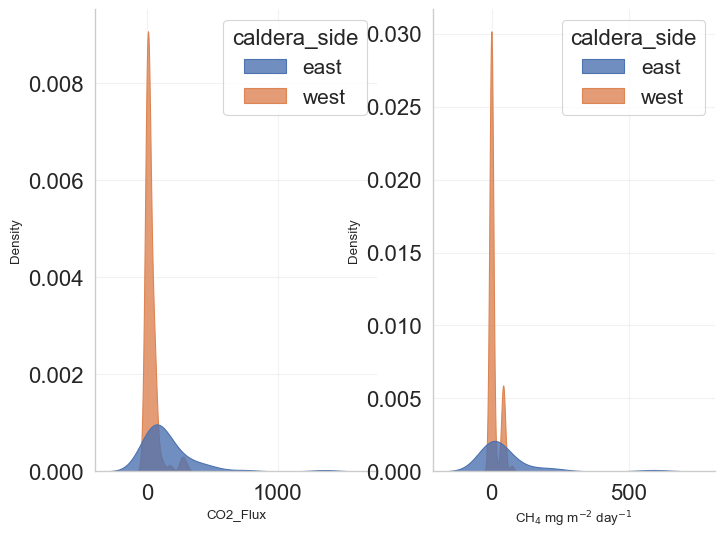

In [74]:
# Visualize the fluxes as probability plots

fig, ax = plt.subplots(1,2,figsize=(8,6), sharey=False)
## All CH4
### Yellowstone
sns.kdeplot(
    data=df_YC_all,
    x = "CH4_Flux",
    color=CH4_color1,
    shade=True,
    hue="caldera_side",
    alpha=0.8,
    log_scale=False,
    ax=ax[1]
  )
### Valles Caldera
# sns.kdeplot(
#     data=df_VC_all,
#     x = "CH4_Flux",
#     color=CH4_color2,
#     shade=True,
#     alpha=0.7,
#     log_scale=False,
#     ax=ax[1]
#   )
# ax[1].legend(["YNP - East", "YNP - West"], loc="upper left", ncol=1)
ax[1].set_xlabel("CH$_4$ mg m$^{-2}$ day$^{-1}$")
ax[1].set_ylabel("Density")

## All CO2
### Yellowstone
sns.kdeplot(
    data=df_YC_all,
    x="CO2_Flux",
    color=CO2_color1,
    shade=True,
    hue="caldera_side",
    alpha=0.8,
    log_scale=False,
    ax=ax[0]
  )
# ### Valles Caldera
# sns.kdeplot(df_all.CO2_Flux, color=CO2_color2,
#             shade=True, alpha=0.7, log_scale=True, ax=ax[0])
# ax[0].legend(["YNP", "VCNP"], loc="upper left", ncol=1)
# ax[0].set_xlabel("CO$_2$ g m$^{-2}$ day$^{-1}$")
# #plt.suptitle("Fluxes")
# plt.show()
# save_fig(plt, "../../figures/CH4-CO2_flx_all_caldera_kde.png")

Histogram plot for the CO<sub>2</sub> and CH<sub>4</sub> for the Yellowstone observations.

Make sure the binwidth of the KDE matches the binwidth used for histogram. If these do not match, the curve will not be representative of probability.

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:6931: RuntimeWarning: invalid value encountered in log
  lndata = np.log(data - loc)


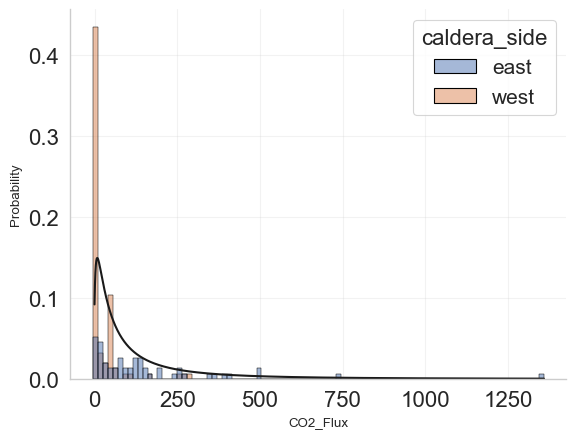

In [75]:
data = df_YC_all[df_YC_all["caldera_side"] == "east"]
# lognorm_pdf_params = stats.lognorm.fit(data.CO2_Flux.dropna())
# co2_lognorm_pdf = stats.lognorm.pdf(
#     data.CO2_Flux.dropna(),
#     *lognorm_pdf_params
#   )

shape, loc, scale = stats.lognorm.fit(data.CO2_Flux.dropna())

x_fit = np.linspace(
    data.CO2_Flux.dropna().min(),
    data.CO2_Flux.dropna().max(),
    1000
  )

co2_lognorm_pdf_fit = stats.lognorm.pdf(
    x_fit,
    shape,
    loc=loc,
    scale=scale
  )

# rv = stats.lognorm()

fig, ax = plt.subplots()
sns.histplot(
    data=df_YC_all,
    x = "CO2_Flux",
    hue="caldera_side",
    stat="probability",
    edgecolor="black",
    binwidth=15
)
ax.plot(
    x_fit,
    co2_lognorm_pdf_fit * 15,
    "k-",
    lw=1.5
)

plt.show()

Made an attempot at using the scipy PDF function with the histogram plot but does not work quite right. Using the KDE instead as an approximation of the PDF.

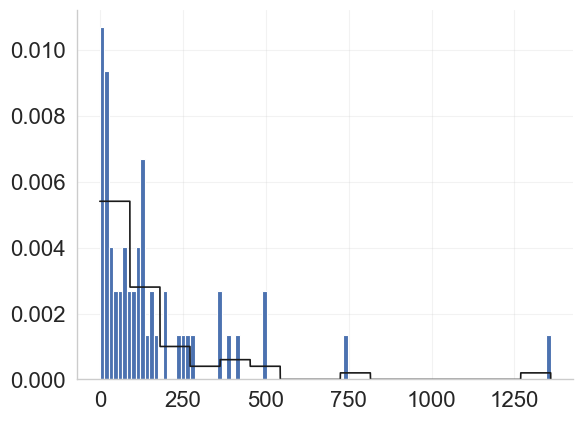

In [76]:
hist = np.histogram(
    data.CO2_Flux.dropna(),
    bins=15
)

hist_dist = stats.rv_histogram(hist)

x_fit = np.linspace(
    data.CO2_Flux.dropna().min(),
    data.CO2_Flux.dropna().max(),
    10000
  )

fig, ax = plt.subplots()

plt.hist(
    data.CO2_Flux.dropna(),
    bins=100,
    density=True
  )
plt.plot(
    x_fit,
    hist_dist.pdf(x_fit),
    "k-",
    label='PDF'
  )

plt.show()

#### KDE Overlay on Probability Histograms

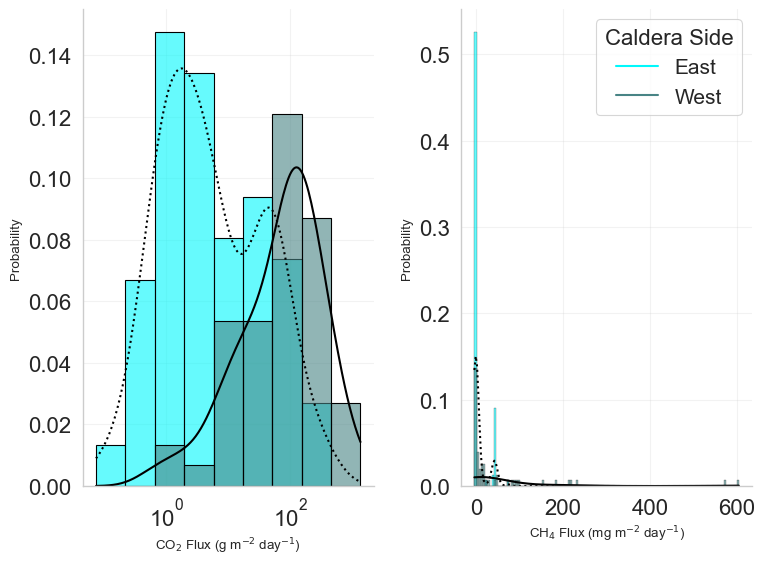

In [77]:
fig, ax = plt.subplots(1,2,figsize=(8,6), sharey=False)
## All CH4
### Yellowstone
binwidith_val = 5
sns.histplot(
    data=df_YC_all,
    x = "CH4_Flux",
    palette=[caldera_side_color_en, caldera_side_color_ws],
    hue="caldera_side",
    stat="probability",
    edgecolor="black",
    kde=True,
    # kde_kws={"bw_adjust":binwidith_val},
    line_kws={"linewidth":1.5},
    alpha=0.6,
    log_scale=False,
    binwidth=binwidith_val,
    legend=False,
    ax=ax[1]
  )

# legend_labels, _ = ax[1].get_legend_handles_labels()
# ax[1].legend(
#     legend_labels,
#     ["West", "East"],
#     bbox_to_anchor=(1,1),
#     title='Caldera Side'
#   )

# customize legend
ax[1].legend(
    title="Caldera Side",
    loc='upper right',
    labels=['East', 'West']
  )

# customize kde lines
ax[1].lines[0].set_color('black')
ax[1].lines[0].set_linestyle(':')
ax[1].lines[1].set_color('black')
ax[1].lines[1].set_linestyle('-')

# set x-axis label
ax[1].set_xlabel(
    "CH$_{4}$ Flux (mg m$^{-2}$ day$^{-1}$)"
)

# CO2
sns.histplot(
  data=df_YC_all,
  x="CO2_Flux",
  palette=[caldera_side_color_en, caldera_side_color_ws],
  hue="caldera_side",
  stat="probability",
  edgecolor="black",
  kde=True,
  #kde_kws={"bw_adjust":binwidith_val},
  line_kws={"lw":1.5},
  alpha=0.6,
  log_scale=True,
  # binwidth=25.0,
  ax=ax[0]
)

ax[0].lines[0].set_color('black')
ax[0].lines[0].set_linestyle(':')
ax[0].lines[1].set_color('black')
ax[0].lines[1].set_linestyle('-')

ax[0].set_xlabel(
    "CO$_{2}$ Flux (g m$^{-2}$ day$^{-1}$)"
)
ax[0].get_legend().remove()

plt.tight_layout()

save_fig(plt, "../../figures/dist-hist_flx_yc_all_caldera-side.png")

plt.show()

The plot below is to be used as inset for the plot above. Explicitly, the plot below will contain CH<sub>4</sub> fluxes that are between -5 and +5 mg CH<sub>4</sub> hr<sup>-1</sup> day<sup>-1</sup>.

The plots will be organized properly on a `.pptx`.

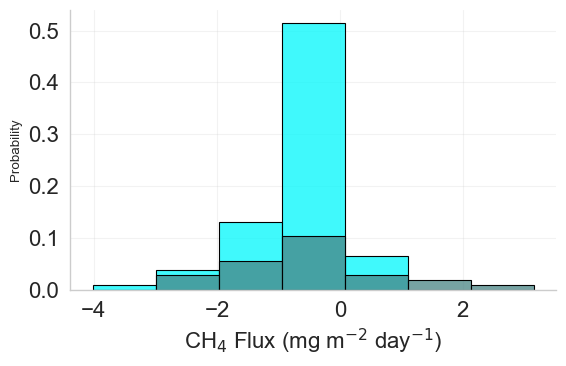

In [78]:
# trim data for inset
inset_ch4_df = df_YC_all[
    (df_YC_all["CH4_Flux"] >= -5) & (df_YC_all["CH4_Flux"] <= 5)
  ]

fig, ax = plt.subplots(figsize=(6,4))
## All CH4
### Yellowstone
binwidith_val = 1
sns.histplot(
    data=inset_ch4_df,
    x = "CH4_Flux",
    palette=[caldera_side_color_en, caldera_side_color_ws],
    hue="caldera_side",
    stat="probability",
    edgecolor="black",
    kde=False,
    # kde_kws={"bw_adjust":binwidith_val},
    line_kws={"linewidth":1.5},
    alpha=0.75,
    log_scale=False,
    binwidth=binwidith_val,
    ax=ax
  )

# ax.lines[0].set_color('black')
# ax.lines[0].set_linestyle(':')
# ax.lines[1].set_color('black')
# ax.lines[1].set_linestyle('-')

ax.set_xlabel(
    "CH$_{4}$ Flux (mg m$^{-2}$ day$^{-1}$)",
    size=16
)
ax.get_legend().remove()

plt.tight_layout()
save_fig(plt, "../../figures/dist-hist_flx_yc_inset_caldera-side.png")

# Set tick font size
for label in (ax.get_xticklabels() + ax.get_yticklabels()):
	label.set_fontsize(16)

plt.show()

Histogram plot of fluxes at Valles with KDE overlay

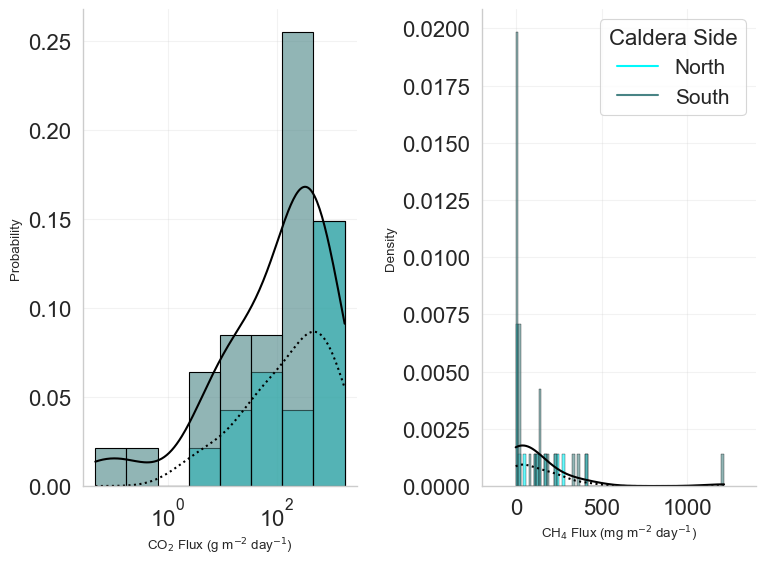

In [79]:
fig, ax = plt.subplots(1,2,figsize=(8,6), sharey=False)
## All CH4
### Yellowstone
binwidith_val = 15
sns.histplot(
    data=df_VC_all,
    x = "CH4_Flux",
    palette=[caldera_side_color_en, caldera_side_color_ws],
    hue="caldera_side",
    stat="density",
    edgecolor="black",
    kde=True,
    # kde_kws={"bw_adjust":binwidith_val},
    line_kws={"linewidth":1.5},
    alpha=0.6,
    log_scale=False,
    binwidth=binwidith_val,
    legend=False,
    ax=ax[1]
  )

# extend x-axis limits
ax[1].set_xlim([-200,1400])

# customize legend
ax[1].legend(
    title="Caldera Side",
    loc='upper right',
    labels=['North', 'South']
  )

# customize kde lines
ax[1].lines[0].set_color('black')
ax[1].lines[0].set_linestyle(':')
ax[1].lines[1].set_color('black')
ax[1].lines[1].set_linestyle('-')

# set x-axis label
ax[1].set_xlabel(
    "CH$_{4}$ Flux (mg m$^{-2}$ day$^{-1}$)"
)

# CO2
sns.histplot(
  data=df_VC_all,
  x="CO2_Flux",
  palette=[caldera_side_color_en, caldera_side_color_ws],
  hue="caldera_side",
  stat="probability",
  edgecolor="black",
  kde=True,
  #kde_kws={"bw_adjust":binwidith_val},
  line_kws={"lw":1.5},
  alpha=0.6,
  log_scale=True,
  # binwidth=25.0,
  ax=ax[0]
)

ax[0].lines[0].set_color('black')
ax[0].lines[0].set_linestyle(':')
ax[0].lines[1].set_color('black')
ax[0].lines[1].set_linestyle('-')

ax[0].set_xlabel(
    "CO$_{2}$ Flux (g m$^{-2}$ day$^{-1}$)"
)
ax[0].get_legend().remove()

plt.tight_layout()

save_fig(plt, "../../figures/dist-hist_flx_vc_all_caldera-side.png")

plt.show()

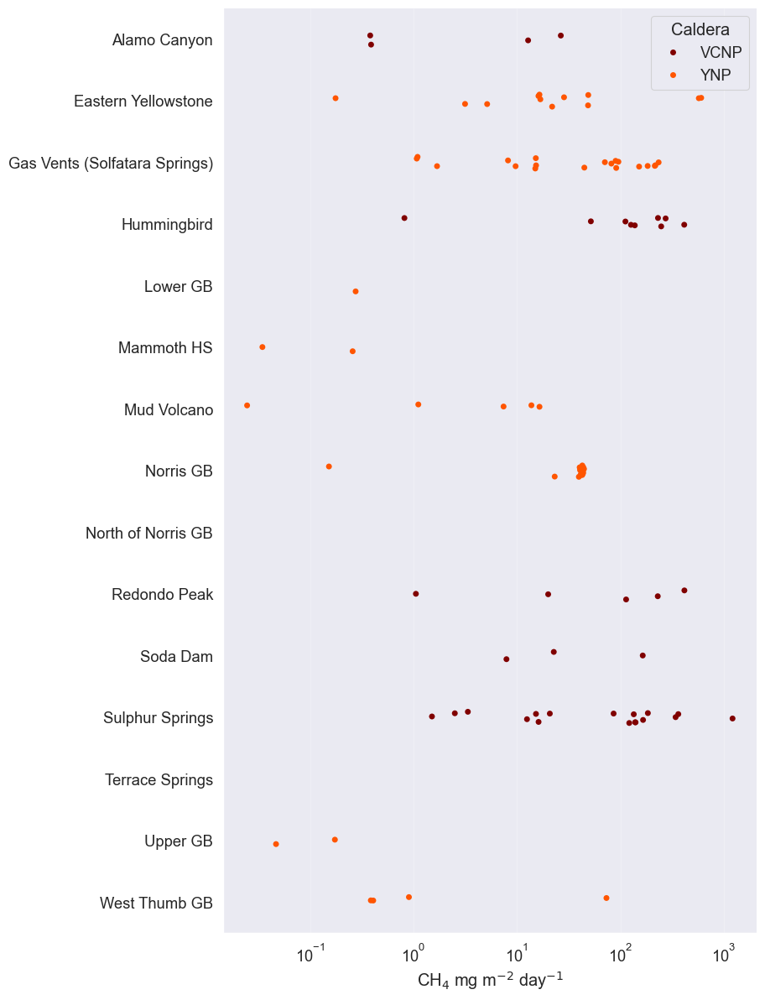

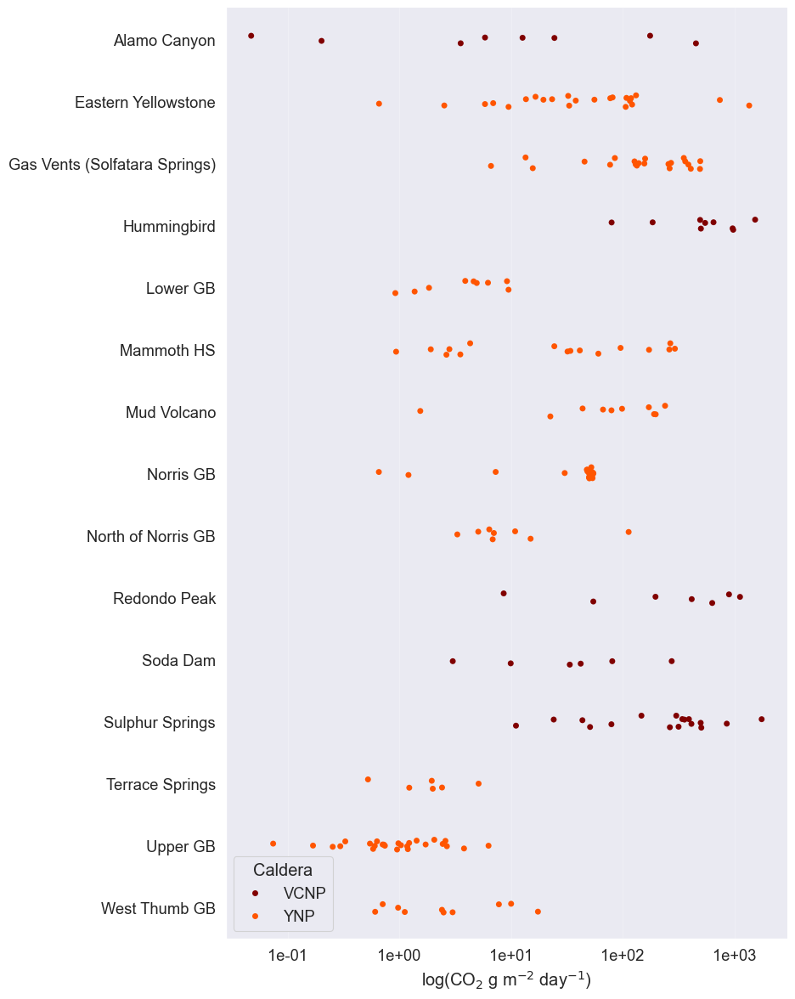

In [80]:
# Set theme (e.g., visual style, color pallette, etc.)
sns.set_theme(context="paper", style="darkgrid", palette="tab10",
              font_scale=1.5)

# Strip plots fluxes by group (i.e. site)
## CH4 - Yellowstone
p_CH4_flx = sns.catplot(x="CH4_Flux", y="Group", data=df_all,
                        hue="Caldera", kind="strip",
                        orient="h", height=12, aspect=0.8,
                        legend_out=False, palette="gist_heat")
p_CH4_flx.set_axis_labels("CH$_4$ mg m$^{-2}$ day$^{-1}$", "")
p_CH4_flx.set(xscale="log")
save_fig(plt, "../../figures/CH4_flx_all_strip.png")

## CO2 - Yellowstone
p_CO2_flx = sns.catplot(x="CO2_Flux", y="Group", data=df_all,
                        kind="strip", hue="Caldera", orient="h",
                        height=12, aspect=0.8,
                        palette="gist_heat", legend_out=False)
p_CO2_flx.set_axis_labels("log(CO$_2$ g m$^{-2}$ day$^{-1}$)", "")
p_CO2_flx.set(xscale="log")
for ax in p_CO2_flx.axes.flat:
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda y, p: f'{y:2.0e}'))
plt.tight_layout()
# Save plot to Google Drive Directory
save_fig(plt, "../../figures/CO2_flx_all_strip.png")

Flux Figure: Strip plots of fluxes collected across YNP (darker) and VCNP (lighter). The data are sorted by groups labelled in the same fashion for Bergfeld et al. (2011) and Chiodini et al. (2012) for YNP and Goff and Janick (2002) for VCNP. Reading down the y-axis for the YNP measurements marks an east to west progression, and a north to south direction for VCNP.

The strip plots of CH<sub>4</sub> and CO2 fluxes (Figure ##) highlight the extent to which fluxes can vary at each site. There was a wide range of CH4 flux observations at YNP (19.24 ± 48.40 mg m<sup>-2</sup> day<sup>-1</sup>) with the maximum value (337 mg m<sup>-2</sup> day<sup>-1</sup>) occuring in the eastern portion (i.e. east of West Thumb) of the park. These exceptionally high fluxes occurred in the eastern regions supported by previous reports (Werner). In particular, acid-sulphate patches along the East Entrance Road (EETR) oustide of the caldera boundary, CH4 fluxes were very high (54.17 ± 114.31 mg m<sup>-2</sup> day<sup>-1</sup>). Similary within Gas Vents (also known as Solfatara Springs) (GVNT), fluxes of CH<sup>4</sup> varied greately but were also great in magnitude as well (49.45 ± 69.49 <sup>-2</sup> day<sup>-1</sup>). Apart from the high fluxes that occured in the eastern portion of YNP, most CH4 fluxes were relatively low (≤ 6 mg <sup>-2</sup> day<sup>-1</sup>) across YNP.

At VCNP, the CH<sub>4</sub> fluxes were very high in the acid-sulphate region along the western boundary of the caldera known as Sulphur Springs (VCSS). At VCSS, CH<sub>4</sub> fluxes had a similar distribution (124.95 ± 290.16 mg m<sup>-2</sup> day<sup>-1</sup>) as GVNT (Figure #_JoyPlot_#). However, the median flux at VCSS (121.88 mg m<sup>-2</sup> day<sup>-1</sup>, n = 17) was much greater than at GVNT (mg m<sup>-2</sup> day<sup>-1</sup>, n = 22).

These CO<sub>2</sub> flux data from YNP align with previous work conducted by Werner and Brantley (2003), where the neutral-chloride sections (e.g. Upper and Lower GB) were low in CO<sub>2</sub> and the acid-sulphate regions distinguished themselves with higher fluxes (Figure ## and #_scatter plot by soil classification_#). Results from this study at Mud Volacano (MDVC) (95.20 ± 67.88 g <sup>-2</sup> day<sup>-1</sup>) are within the same order of magnitude presented in Werner and Brantley (2003). However, measurements in the acid-sulphate region at Gas Vents (147.71 ± 119.30 g <sup>-2</sup> day<sup>-1</sup>) eclipse the those from MDVC and all other sites across YNP suggesting that the site is significant source of diffuse CO2.

At VCNP, the CO<sub>2</sub>

quad plot (2x2) - use boxplots to show the fluxes of CH4 at YNP and VCNP and do the same for CO2

In [81]:
#flux boxplot (quad)

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2763530230.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mins = df_all.groupby(["Group"])["CH4_Flux"].min().values-55
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2763530230.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  nobs = df_all.groupby(["Group"])["CH4_Flux"].count()


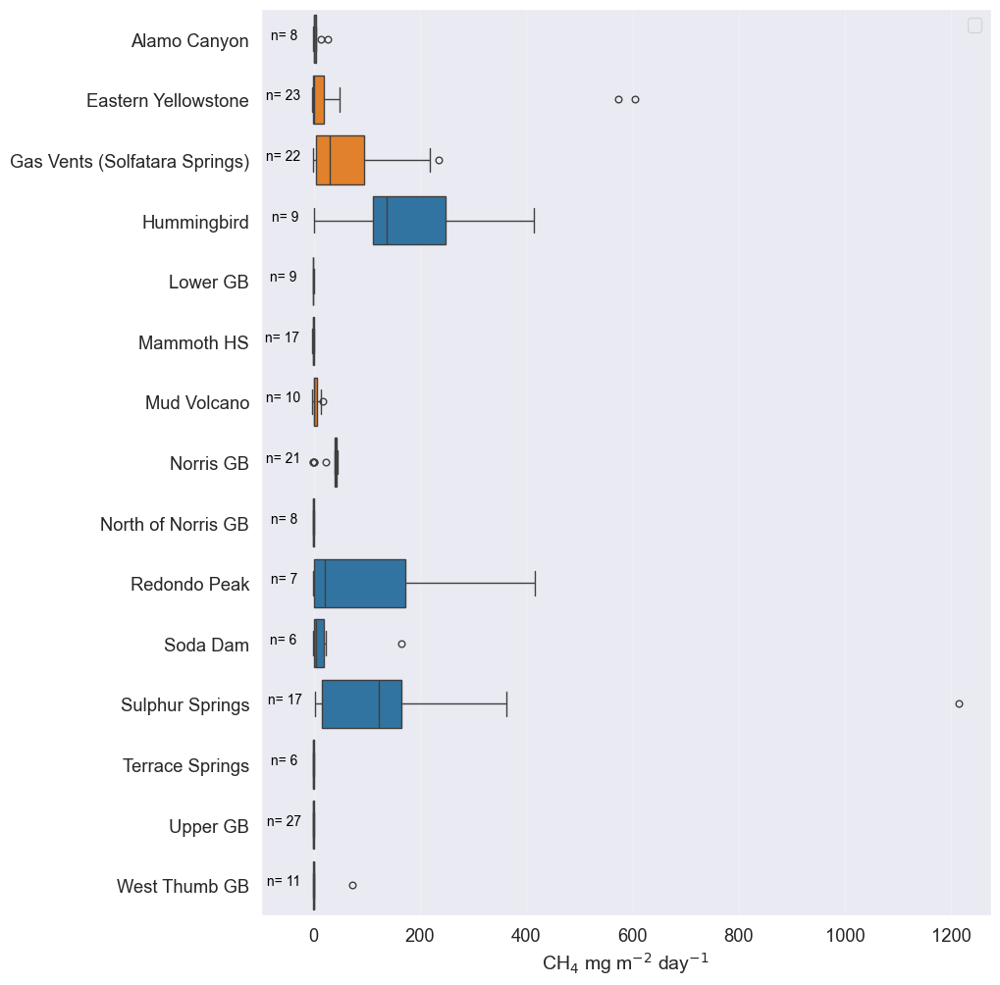

In [82]:
fig, p_CH4_flx = plt.subplots(figsize = (0.8*12, 12))
p_CH4_flx = sns.boxplot(
    y="Group",
    x="CH4_Flux",
    hue="Caldera",
    data=df_all,
    # palette="gist_heat"
  )
p_CH4_flx.set_xlim(-100,)
mins = df_all.groupby(["Group"])["CH4_Flux"].min().values-55
nobs = df_all.groupby(["Group"])["CH4_Flux"].count()
nobs = [str(x) for x in nobs.tolist()]
nobs = ["n= " + i for i in nobs]
pos = range(len(nobs))
for tick,label in zip(pos,p_CH4_flx.get_yticklabels()):
  p_CH4_flx.text(mins[tick], tick, nobs[tick], size="x-small",
                 color='black', verticalalignment = "baseline",
                 horizontalalignment="center", rotation=0)
p_CH4_flx.set_xlabel("CH$_4$ mg m$^{-2}$ day$^{-1}$", fontsize=14)
p_CH4_flx.set_ylabel("")
p_CH4_flx.legend("")
save_fig(plt, "../../figures/CH4_flx_all_box_nobvs.png")

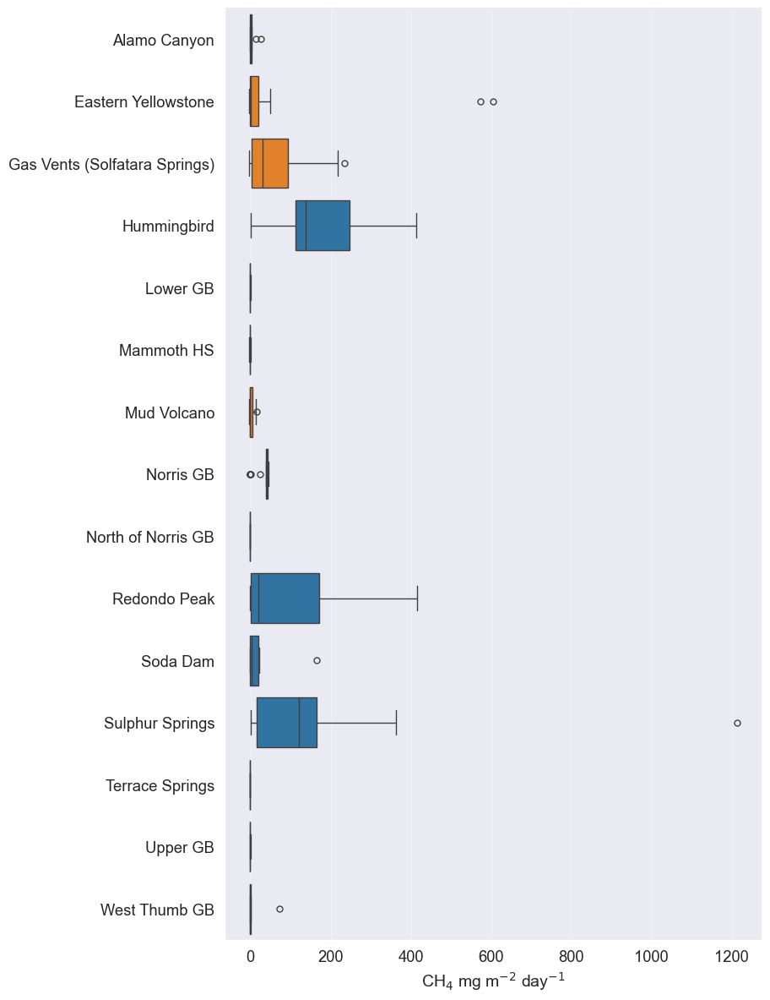

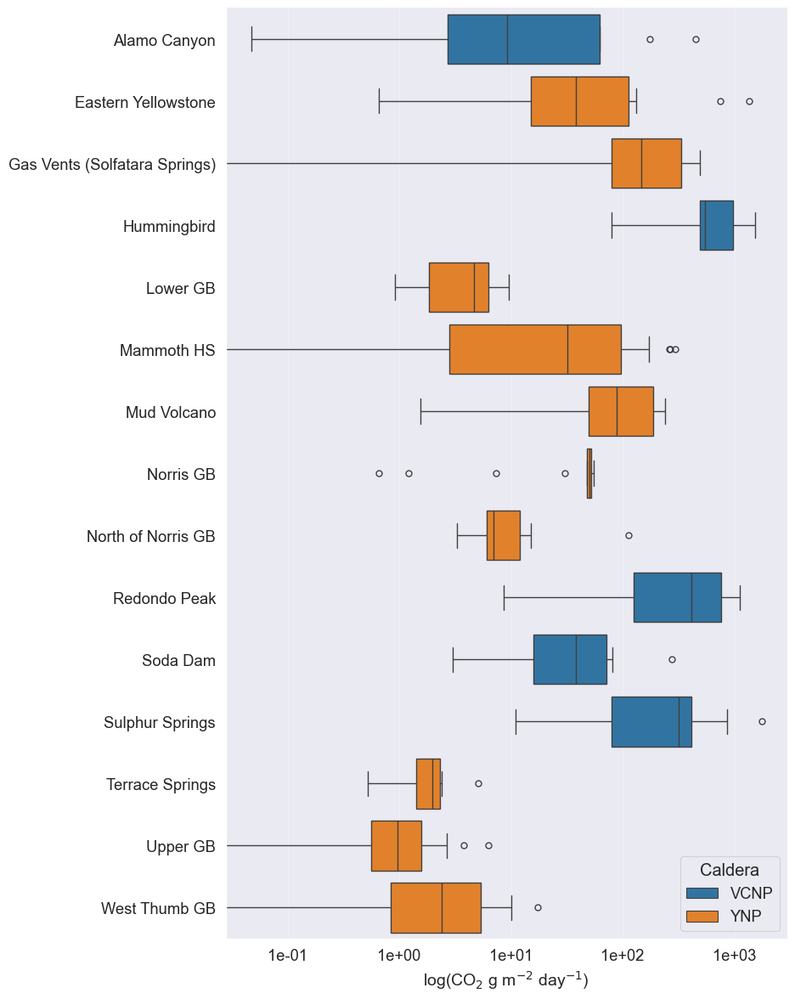

In [83]:
# Boxplots fluxes by group (i.e. site)
## CH4 - Yellowstone
p_CH4_flx = sns.catplot(
    x="CH4_Flux",
    y="Group",
    data=df_all,
    hue="Caldera",
    kind="box",
    # palette="gist_heat",
    orient="h",
    height=12,
    aspect=0.8,
    legend=False,
    legend_out=False
  )
p_CH4_flx.set_axis_labels("CH$_4$ mg m$^{-2}$ day$^{-1}$", "", fontsize=14)
p_CH4_flx.set(xscale="linear")
save_fig(plt, "../../figures/CH4_flx_all_box.png")

## CO2 - Yellowstone
p_CO2_flx = sns.catplot(
    x="CO2_Flux",
    y="Group",
    data=df_all,
    kind="box",
    hue="Caldera",
    orient="h",
    height=12,
    aspect=0.8,
    legend_out=False,
    # palette="gist_heat"
  )
p_CO2_flx.set_axis_labels("log(CO$_2$ g m$^{-2}$ day$^{-1}$)", "", fontsize=14)
p_CO2_flx.set(xscale="log")
for ax in p_CO2_flx.axes.flat:
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda y, p: f'{y:2.0e}'))
plt.tight_layout()
# Save plot to Google Drive Directory
save_fig(plt, "../../figures/CO2_flx_all_box.png")

Boxplots of fluxes: caption for the strip plots applies here



### Partitioning Fluxes by Magnitude

Examine the fluxes by proportion of flux type. Using graphic statistical analysis (GSA) (Chiodini et al., 2012; Sinclair (1974), Wen et al., 2016), the fluxes can be partitioned into different flux categories such as low flux (LF), moderate flux (MF), and high flux (HF). These flux categories highlight the likely mode of transport to the surface (e.g., passing through sinter or a fracture). (---this needs to be rewritten---)

This process relies on the fact that the fluxes are distributed lognormally. The lognormally distrbuted fluxes are plotted against the cumulative frequency (also known as the non-exceedence probability) highlights the proportion of fluxes that are less than or equal to the cumulative frequency, and the inflection points demonstrate flux values that correspond to different flux categories as described above.

This process begins by defining the distribution of fit for the flux data. The data were first plotted using a histogram to gain a visual sense of the likely distribution. For CH4 ---, and CO2 was skewed left suggesting that a lognormal population with σ > µ is possible. To prove that the distribution

#### Trimming Flux Dataframes
Short statements trimming dataset for relevant fluxes

In [84]:
# Retain rows that report a flux that is ≥ 0 for either gas
df_YC_flx_pos_only = df_YC_all[(df_YC_all["CH4_Flux"] >= 0) |
                           (df_YC_all["CO2_Flux"] >= 0)]
# Assess the shape of the trimmed dataframe
YNP_flx_pos_only_shape = df_YC_flx_pos_only.shape
print("After fluxes less than zero are removed from the dataframe, \nthe number of rows and columns present are {} and {}, respectively.".format(YNP_flx_pos_only_shape[0], YNP_flx_pos_only_shape[1]))

After fluxes less than zero are removed from the dataframe, 
the number of rows and columns present are 150 and 33, respectively.


In [85]:
# Retain rows that report a flux that is ≥ 0 for either gas
df_VC_flx_pos_only = df_VC_all[(df_VC_all["CH4_Flux"] >= 0) |
                           (df_VC_all["CO2_Flux"] >= 0)]
# Assess the shape of the trimmed dataframe
VCNP_flx_pos_only_shape = df_VC_flx_pos_only.shape
print("After fluxes less than zero are removed from the dataframe, \nthe number of rows and columns present are {} and {}, respectively.".format(VCNP_flx_pos_only_shape[0], VCNP_flx_pos_only_shape[1]))

After fluxes less than zero are removed from the dataframe, 
the number of rows and columns present are 47 and 33, respectively.


In [86]:
flx_pos_only_loss = perc_diff(YNP_flx_pos_only_shape[0], YNP_all_shape[0])
### Report the percentage of lost fluxes
print("{:.1f}% of fluxes were lost when values less than zero were removed".format(flx_pos_only_loss))

2.6% of fluxes were lost when values less than zero were removed


In [87]:
flx_pos_only_loss = perc_diff(VCNP_flx_pos_only_shape[0], VCNP_all_shape[0])
### Report the percentage of lost fluxes
print("{:.1f}% of fluxes were lost when values less than zero were removed".format(flx_pos_only_loss))

0.0% of fluxes were lost when values less than zero were removed


Comparing median fluxes across gas types.

In [88]:
np.median(df_VC_flx_pos_only[df_YC_flx_pos_only["CO2_Flux"] >= 0]["CO2_Flux"]) / \
np.median(df_YC_flx_pos_only[df_YC_flx_pos_only["CH4_Flux"] >= 0]["CH4_Flux"]/1000)

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3492704186.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  np.median(df_VC_flx_pos_only[df_YC_flx_pos_only["CO2_Flux"] >= 0]["CO2_Flux"]) / \


np.float64(6673.955142312842)

In [89]:
np.median(df_VC_flx_pos_only[df_VC_flx_pos_only["CO2_Flux"] >= 0]["CO2_Flux"]) / \
np.median(df_VC_flx_pos_only[df_VC_flx_pos_only["CH4_Flux"] >= 0]["CH4_Flux"]/1000)

np.float64(2349.585460046037)

#### Visualize the Distribution of Fluxes
With density plots, visualize the spread of fluxes by caldera and by site

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/397806512.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_YC_flx_pos_only.CH4_Flux, color=CH4_color1,
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/397806512.py:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_VC_flx_pos_only.CH4_Flux, color=CH4_color2,
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/397806512.py:17: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_YC_flx_pos_only.CO2_Flux, color=CO2_color1,
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/397806512.py:20: FutureWarning: 

`shade` is

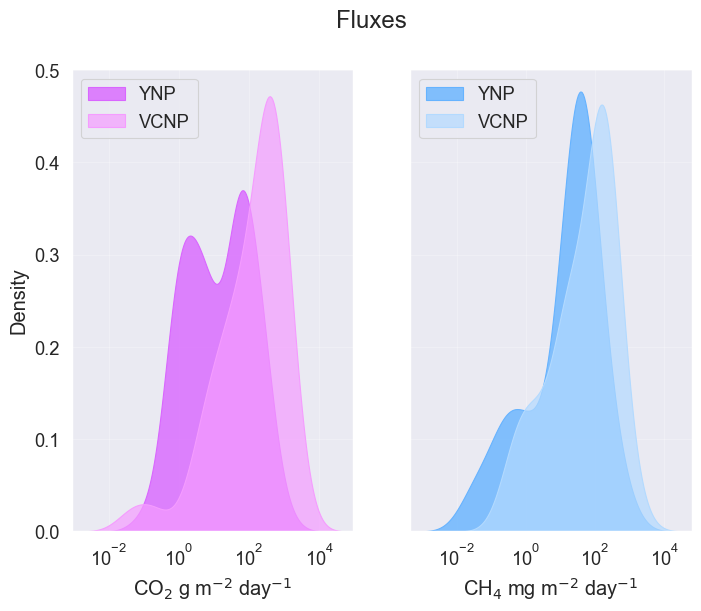

<Figure size 640x480 with 0 Axes>

In [90]:
# Visualize the fluxes as density plots
# Plot histograms
fig, ax = plt.subplots(1,2,figsize=(8,6), sharey=True)
## All CH4
### Yellowstone
sns.kdeplot(df_YC_flx_pos_only.CH4_Flux, color=CH4_color1,
            shade=True, alpha=0.8, log_scale=True, ax=ax[1])
### Valles Caldera
sns.kdeplot(df_VC_flx_pos_only.CH4_Flux, color=CH4_color2,
            shade=True, alpha=0.7, log_scale=True, ax=ax[1])
ax[1].legend(["YNP", "VCNP"], loc="upper left", ncol=1)
ax[1].set_xlabel("CH$_4$ mg m$^{-2}$ day$^{-1}$")
ax[1].set_ylabel("Density")

## All CO2
### Yellowstone
sns.kdeplot(df_YC_flx_pos_only.CO2_Flux, color=CO2_color1,
            shade=True, alpha=0.8, log_scale=True, ax=ax[0])
### Valles Caldera
sns.kdeplot(df_VC_flx_pos_only.CO2_Flux, color=CO2_color2,
            shade=True, alpha=0.7, log_scale=True, ax=ax[0])
ax[0].legend(["YNP", "VCNP"], loc="upper left", ncol=1)
ax[0].set_xlabel("CO$_2$ g m$^{-2}$ day$^{-1}$")
plt.suptitle("Fluxes")
plt.show()
save_fig(plt, "../../figures/CH4-CO2_flx_all_caldera_kde.png")

KDE Plot of Fluxes: Kernel density estimate (KDE) plots approximates the probability density function for CH<sub>4</sub> and CO<sub>2</sub>. All fluxes greater than zero are presented for YNP darker shade; _n_ = 150) and VCNP (lighter shade; _n_ = 47). Note: mass units for CH<sub>4</sub> are in mg and g for CO<sub>2</sub>.

The distribution of CH<sub>4</sub> fluxes for both calderas are similar in shape although the slightly greater median for VCNP () than YNP (). The shape of the KDE plots indicates a primary bump that peaks near their respective medians, and there is a smaller peak to the left of the primary peak (see ridgeplot text for details).

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(*plot_args, **plot_kwargs)


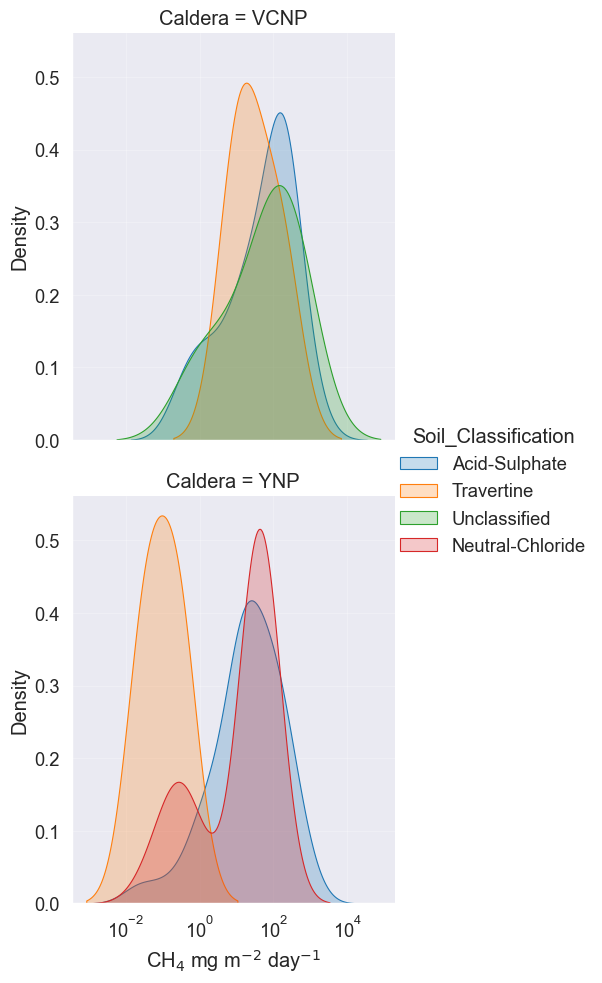

In [91]:
## CH4 fluxes: Comparisons between the caldera
fg = sns.FacetGrid(df_all,
                   hue="Soil_Classification",
                   row="Caldera", height=5, aspect=0.9,
                   sharex=True, legend_out=True)
fg.map_dataframe(sns.kdeplot, data=df_all, log_scale=True,
                 x="CH4_Flux", fill=True)
fg.add_legend()
fg.set_axis_labels(x_var="CH$_4$ mg m$^{-2}$ day$^{-1}$", y_var="Density")
save_fig(plt, "../../figures/faceted_kde_CH4_Flux.png")

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:44: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  ax.set(**kwargs)


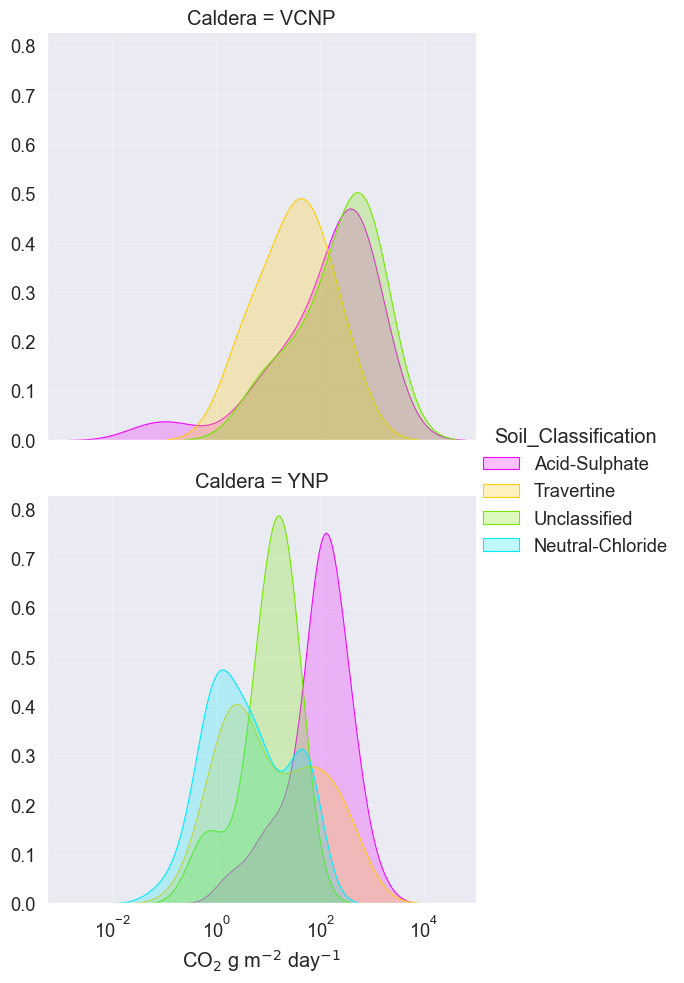

In [92]:
## CO2 fluxes: Comparisons between the caldera
fg = sns.FacetGrid(df_all,
                   hue="Soil_Classification", palette="gist_ncar_r",
                   row="Caldera", height=5, aspect=1.1,
                   sharex=True, legend_out=True)
fg.map_dataframe(sns.kdeplot, data=df_all, log_scale=True,
                 x="CO2_Flux", fill=True)
fg.set_axis_labels(x_var="CO$_2$ g m$^{-2}$ day$^{-1}$", y_var="")
fg.set(xlim=(0,1E05))
fg.add_legend()
save_fig(plt, "../../figures/faceted_kde_CO2_Flux.png")

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/project

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/project

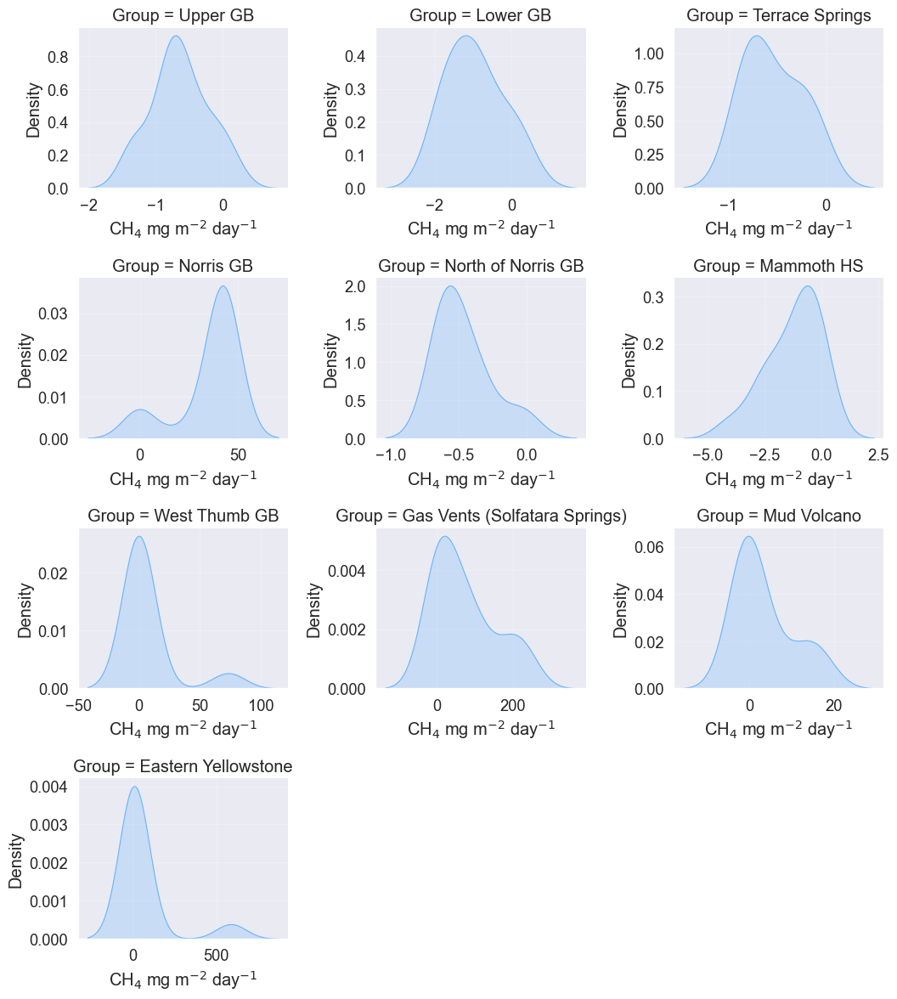

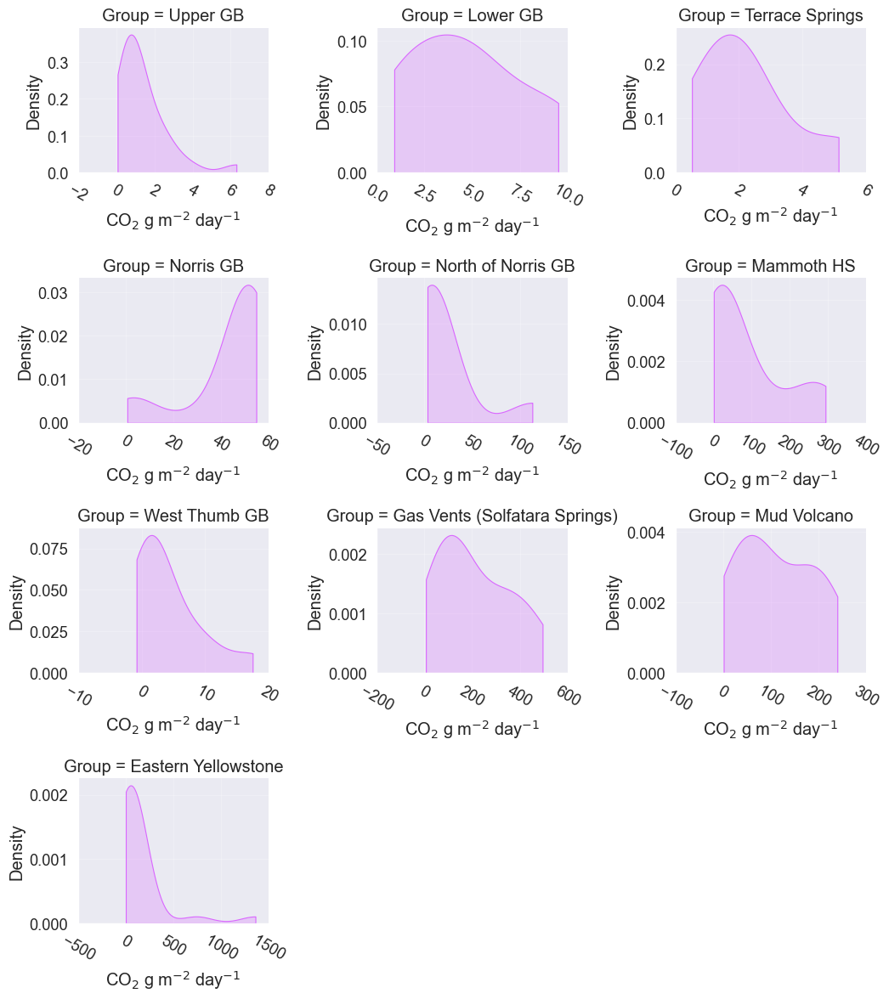

In [93]:
# Flux Histograms by Site
## CH4
fg1 = sns.FacetGrid(df_YC_flx_pos_only,
                   col="Group", col_wrap=3,
                   height=3, aspect=1.2,
                   col_order=ordered_groups_YC,
                   sharex=False,sharey=False)
fg1.map_dataframe(sns.kdeplot, x="CH4_Flux",
                 color=CH4_color1, shade=True)
fg1.set(xlabel="CH$_4$ mg m$^{-2}$ day$^{-1}$",
       ylabel="Density")
fg1.tight_layout()
save_fig(plt, "../../figures/YNP_CH4_flx_kde.png")

## CO2
fg2 = sns.FacetGrid(df_YC_flx_pos_only,
                    col="Group", col_wrap=3,
                    height=3, aspect=1.2,
                    col_order=ordered_groups_YC,
                    sharex=False, sharey=False)
fg2.map_dataframe(sns.kdeplot, x="CO2_Flux",
                  color=CO2_color1, shade=True, cut=0)
fg2.set(xlabel="CO$_2$ g m$^{-2}$ day$^{-1}$",
        ylabel="Density")
fg2.set_xticklabels(rotation=-30)
fg2.tight_layout()
save_fig(plt, "../../figures/YNP_CO2_flx_kde.png")

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/project

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(*plot_args, **plot_kwargs)
/Users/moyoajayi/Documents/project

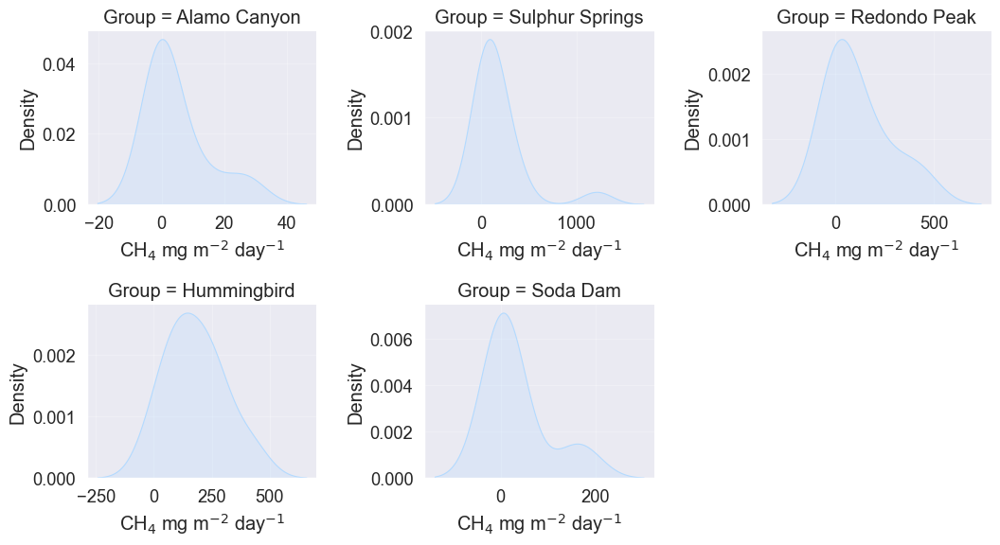

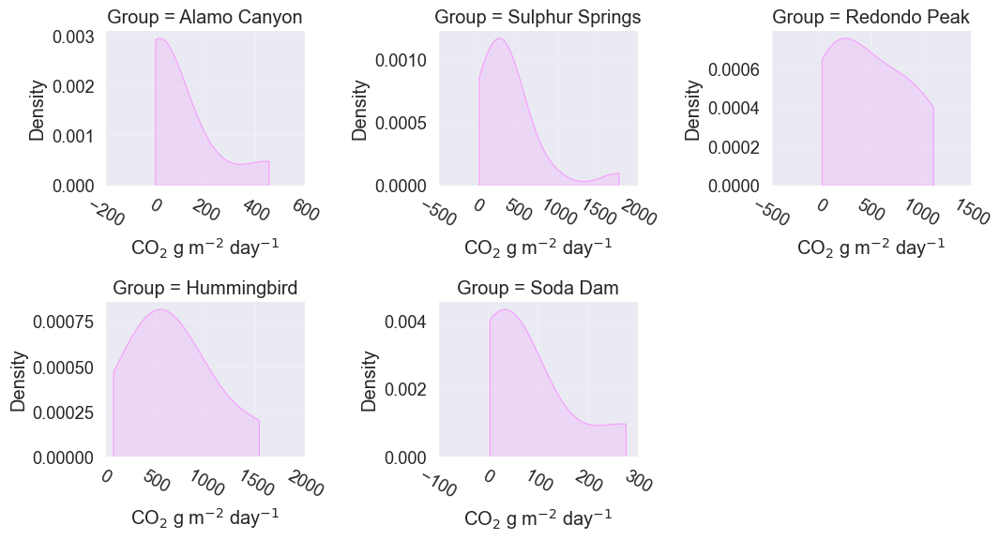

In [94]:
# Flux Histograms by Site
## CH4
fg1 = sns.FacetGrid(df_VC_flx_pos_only,
                   col="Group", col_wrap=3, height=3,aspect=1.2,
                   col_order=ordered_groups_VC,
                   sharex=False,sharey=False)
fg1.map_dataframe(sns.kdeplot, x="CH4_Flux",
                 color=CH4_color2, shade=True)
fg1.set(xlabel="CH$_4$ mg m$^{-2}$ day$^{-1}$",
       ylabel="Density")
fg1.tight_layout()
save_fig(plt, "../../figures/VCNP_CH4_flx_kde.png")

## CO2
fg2 = sns.FacetGrid(df_VC_flx_pos_only,
                   col="Group", col_wrap=3, height=3,aspect=1.2,
                   col_order=ordered_groups_VC,
                   sharex=False, sharey=False)
fg2.map_dataframe(sns.kdeplot, x="CO2_Flux", cut=0,
                 color=CO2_color2, shade=True)
fg2.set(xlabel="CO$_2$ g m$^{-2}$ day$^{-1}$",
       ylabel="Density")
fg2.set_xticklabels(rotation=-30)
fg2.tight_layout()
save_fig(plt, "../../figures/VCNP_CO2_flx_kde.png")

TypeError: seaborn.utils._scatter_legend_artist() got multiple values for keyword argument 'label'

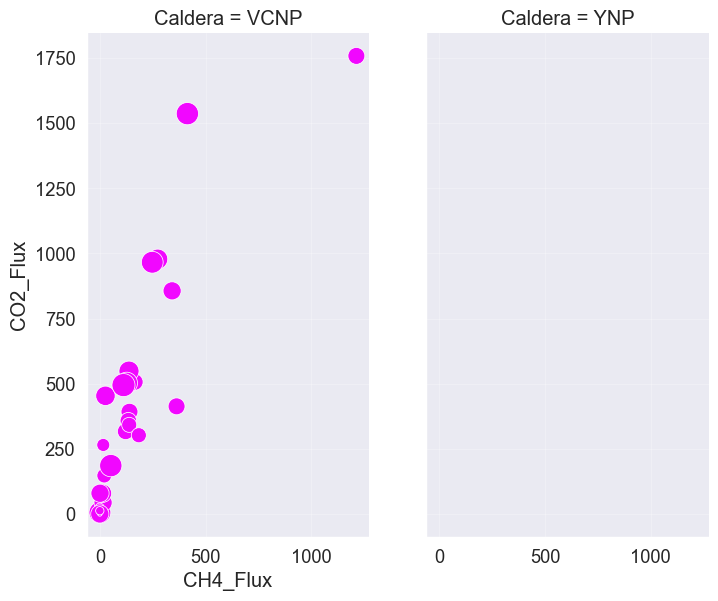

In [95]:
# CO2 FLux v CH4 Flux at both calderas
fg = sns.FacetGrid(
    df_all,
    col="Caldera",
    height=6,
    aspect=0.6,
    hue="Soil_Classification",
    legend_out=True,
    palette="gist_ncar_r",
    sharex=True,
    sharey=True
  )
fg.map_dataframe(
    sns.scatterplot,
    x="CH4_Flux",
    y="CO2_Flux",
    size="Soil_Tempeature_at_Surface",
    sizes=(10,275),
    markers=markers_4,
    legend="brief"
  )
fg.set(xlabel="CH$_4$ mg m$^{-2}$ day$^{-1}$",
       ylabel="CO$_2$ g m$^{-2}$ day$^{-1}$")
fg.add_legend()
fg.tight_layout()
save_fig(plt, "../../figures/all_CO2vCH4_flx_soiltype.png")

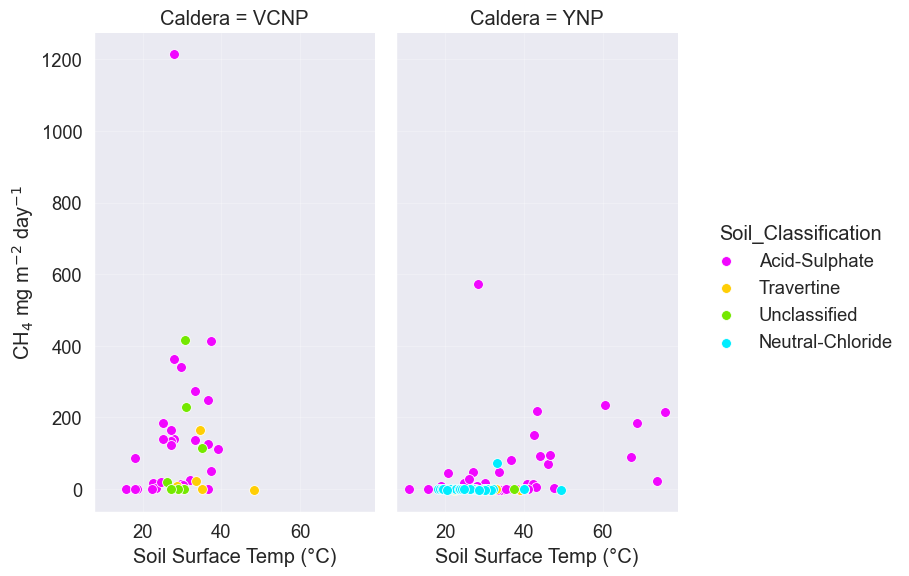

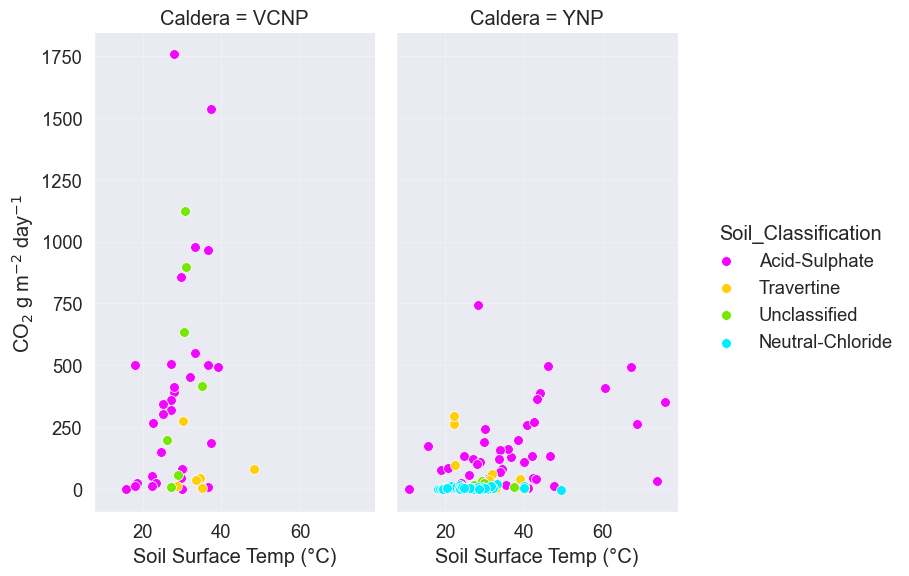

In [96]:
# CH4 Flux v Soil Temp
fg = sns.FacetGrid(df_all,
                   col="Caldera", height=6, aspect=0.6,
                   hue="Soil_Classification", legend_out=True,
                   palette="gist_ncar_r",
                   sharex=True,sharey=True)
fg.map_dataframe(sns.scatterplot,
                 s=50,
                 markers=markers_4,
                 x="Soil_Tempeature_at_Surface", y="CH4_Flux",
                 legend="brief")
fg.set(xlabel="Soil Surface Temp (°C)",
       ylabel="CH$_4$ mg m$^{-2}$ day$^{-1}$")
fg.add_legend()
fg.tight_layout()
save_fig(plt, "../../figures/all_CH4_flx_soiltemp_caldera.png")

# CO2 Flux v Soil Temp
fg = sns.FacetGrid(df_all,
                   col="Caldera", height=6, aspect=0.6,
                   hue="Soil_Classification", legend_out=True,
                   palette="gist_ncar_r",
                   sharex=True,sharey=True)
fg.map_dataframe(sns.scatterplot,
                 s=50,
                 markers=markers_4,
                 x="Soil_Tempeature_at_Surface", y="CO2_Flux",
                 legend="brief")
fg.set(xlabel="Soil Surface Temp (°C)",
       ylabel="CO$_2$ g m$^{-2}$ day$^{-1}$")
fg.add_legend()
fg.tight_layout()
save_fig(plt, "../../figures/all_CO2_flx_soiltemp_caldera.png")

In [97]:
# Make Ridgeline Plot for Fluxes
# Order the groups from west to east
df_all["Group"] = df_all["Group"].astype("category")
df_all["Group"].cat.reorder_categories(
    ordered_groups_all,
    ordered=True,
    inplace=True
)

## Log fluxes
df_all_log = df_all[["Group", "Location", "Soil_Classification",
                     "CH4_Flux","CO2_Flux"]]
df_all_log["CH4_Flux"] = np.log10(df_all_log["CH4_Flux"])
df_all_log["CO2_Flux"] = np.log10(df_all_log["CO2_Flux"])

## CH4
# fig, ax = plt.subplots(figsize=(16,12))
fig, ax = joyplot(
    data=df_all_log[["CH4_Flux", "Group"]],
    by="Group",
    alpha=0.8,
    color=[
        CH4_color1, CH4_color1, CH4_color1,
        CH4_color1, CH4_color1, CH4_color1,
        CH4_color1, CH4_color1, CH4_color1,
        CH4_color1,
        CH4_color2, CH4_color2, CH4_color2,
        CH4_color2, CH4_color2
      ],
    kind="kde",
    figsize=(12,10)
  )
plt.xlabel("log(CH$_4$ mg m$^{-2}$ day$^{-1}$)", fontsize=14)
plt.rcParams.update({'font.size': 14})
plt.show()
save_fig(fig, "../../figures/all_CH4_flx_ridge.png")

## CO2
# fig, ax = plt.subplots(figsize=(16,12))
fig, ax = joyplot(data=df_all_log[["CO2_Flux", "Group"]],
        by="Group", alpha=0.8,
        color=[CO2_color1, CO2_color1, CO2_color1,
               CO2_color1, CO2_color1, CO2_color1,
               CO2_color1, CO2_color1, CO2_color1,
               CO2_color1,
               CO2_color2, CO2_color2, CO2_color2,
               CO2_color2, CO2_color2],
        figsize=(12,10))
plt.xlabel("log(CO$_2$ g m$^{-2}$ day$^{-1}$)", fontsize=14)
plt.rcParams.update({'font.size': 14})
plt.show()
save_fig(fig, "../../figures/all_CO2_flx_ridge.png")

TypeError: Categorical.reorder_categories() got an unexpected keyword argument 'inplace'

Ridgeline plot Figure: Ridgeline plot of CH<sub>4</sub> (left) and CO<sub>2 </sub>(right) fluxes at both calderas. The groups and caldera designations follow the description in (Figure 1). Only fluxes greater than zero are shown, sites where a ridgeplot is absent indicates all measurements were below zero. Note: the scale of the x-axis for both plots is logged.

The ridgline plots demonstrate the distribution of fluxes that are greater than zero at each site. For CH<sub>4</sub>, the fluxes exhibit broad ranges in log space, highlighting a wide range of over several orders of magnitude at several of the sites. Contrasting this generalization are sites near the western portion of YNP. Upper GB and Mammoth HS both show narrow distributions of low magnitude fluxes. Lower GB, Terrace Springs, and North of Norris fluxes show primarily non-existant distributions because all or very few measurements were greater than zero.

However, starting at West Thumb (WTHB) and moving east through YNP, the distributions are wider and center near greater magnitudes than the other western YNP locations. The wide distribution at WTHB differs from GVNT, Mud Volcano (MDVC), and Eastern Yellowstone because it skews right indicating the densest portion of the distribution lies near lower fluxes (< 1 mg m<sup>-2</sup> day<sup>-1</sup>) but some lager fluxes can be found in the tail. The mirror image of WTHB can be found at GVNT, where the left skew shows a high number of measurements to the right of the center of the distribution. For MDVC and Eastern Yellowstone, skew is not a signficant characteristic  of the distributions as they illustrate a wide array of values of great magnitude.

At VCNP, the distribution of CH<sub>4</sub> fluxes became narrower from the north end at Alamo Canyon (VCAC) southward toward Soda Dam (VCSD). The narrowest distribution of fluxes occured at Hummingbird (VCHB) also coincides with the highest median CH<sub>4</sub> flux measurement (137.82 mg m<sup>-2</sup> day<sup>-1</sup>, n =9) calcualted at all sites at VCNP and YNP. The narrowness of the distribution is what makes VCHB unique among VCNP measurements because Redondo Peak (VCRP, 20.06 mg m<sup>-2</sup>, n = 7) and VCSS (121.88 mg m<sup>-2</sup>, n = 17) retain similar medians. However, with narrow distribution, VCHB is believed to be a more homogeneous producer of CH<sub>4</sub>.

In [98]:
df_all_log.groupby(by=["Group"]).count()

NameError: name 'df_all_log' is not defined

CO<sub>2</sub> fluxes at YNP

Viewing the distribution of all fluxes (both less than and greater than zero) at the individual site level (Supplementary Figure ##) on a linear scale reveals several sites with slightly bimodal distributions. For example, the distribution of CH<sub>4</sub> and CO<sub>2</sub> fluxes at MDVC shows one peak centered near zero and a second peak of a lower density centered near 15 mg CH<sub>4</sub> m<sup>-2</sup> day<sup>-1</sup> and 180 g CO<sub>2</sub> m<sup>-2</sup> day<sup>-1</sup>. These bimodal distributions underscore how many fluxes of the diffuse gases will be reported near near but there will be a smaller amount of fluxes at much greater magnitudes.

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/joypy/joyplot.py:176: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(by)


<Figure size 640x480 with 0 Axes>

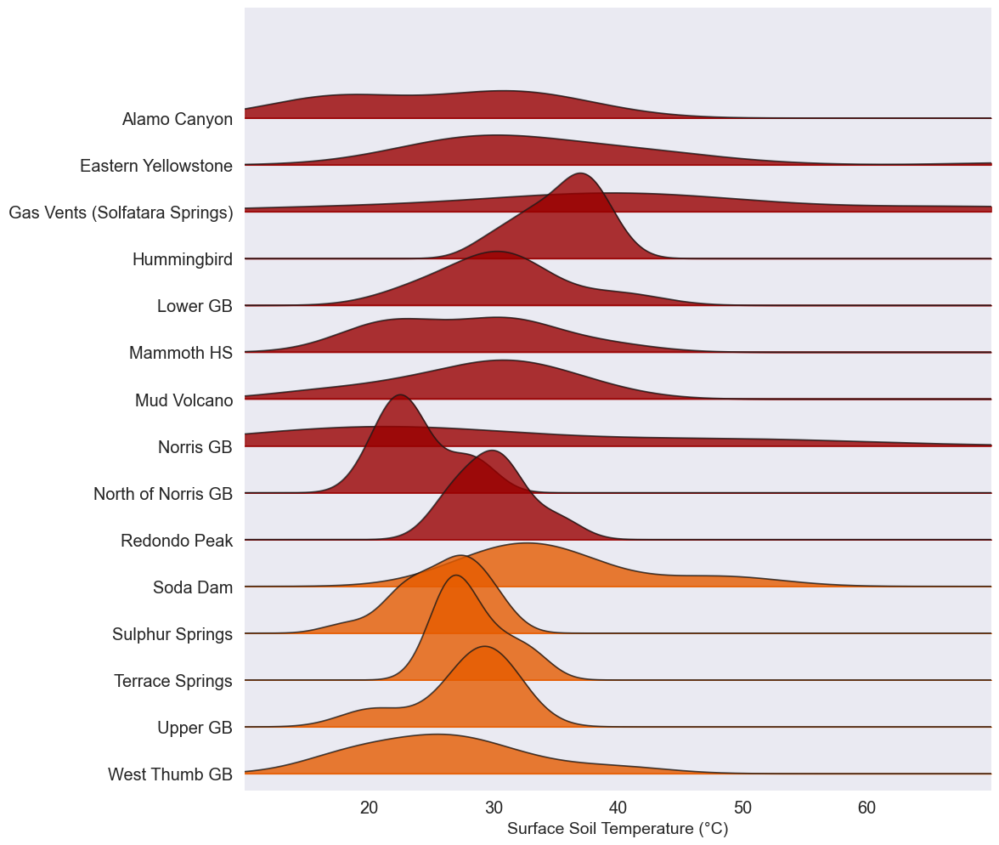

<Figure size 640x480 with 0 Axes>

In [99]:
# Soil Tempterature Ride Line plot for Valles and Yellowstone
# CH4
plt.figure()
joyplot(
    data=df_all[["Soil_Tempeature_at_Surface", "Caldera", "Group"]],
    by="Group", alpha=0.8, x_range=(10,70),
    color=[
        "#990000", "#990000", "#990000",
        "#990000", "#990000", "#990000",
        "#990000", "#990000", "#990000",
        "#990000",
        "#e65c00", "#e65c00", "#e65c00",
        "#e65c00", "#e65c00"
      ],
      figsize=(12,10)
    )
plt.xlabel("Surface Soil Temperature (°C)", fontsize=14)
plt.rcParams.update({'font.size': 14})
plt.show()
save_fig(plt, "../../figures/all_soil-temp_ridge.png")

Scatterplot | Fluxes vs. Soil Temperature

<>:35: SyntaxWarning: invalid escape sequence '\c'
<>:35: SyntaxWarning: invalid escape sequence '\c'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/4148449764.py:35: SyntaxWarning: invalid escape sequence '\c'
  ax[0].set_ylabel("Soil Temperature ($^{\circ}$C)")


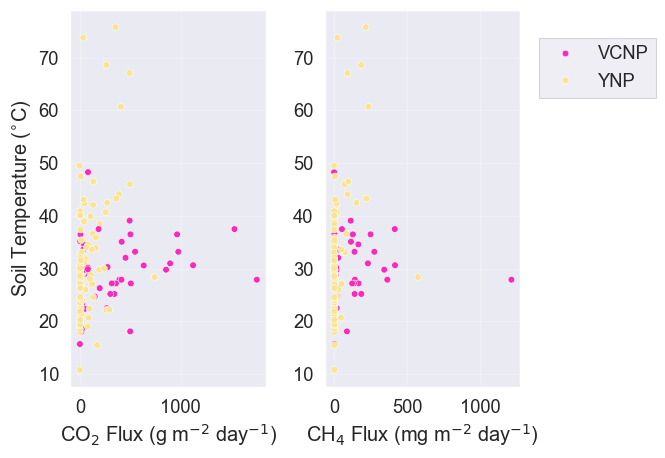

<Figure size 640x480 with 0 Axes>

In [100]:
fig, ax = plt.subplots(1,2)

sns.scatterplot(
    data=df_all,
    x="CH4_Flux",
    y="Soil_Tempeature_at_Surface",
    hue="Caldera",
    palette=_palette_calderas,
    ax=ax[1]
)
# _xticks = np.linspace(
#     0,
#     math.ceil(np.max(df_all["CH4_Flux"])),
#     4
# )
ax[1].set_xlabel("CH$_{4}$ Flux (mg m$^{-2}$ day$^{-1}$)")
# ax[1].set_xticks(_xticks)
ax[1].legend(
    loc="upper left",
    bbox_to_anchor=(1.05,0.95),
    fancybox=False,
    shadow=False
)
ax[1].set_ylabel("")


sns.scatterplot(
    data=df_all,
    x="CO2_Flux",
    y="Soil_Tempeature_at_Surface",
    hue="Caldera",
    palette=_palette_calderas,
    ax=ax[0]
)
ax[0].set_ylabel("Soil Temperature ($^{\circ}$C)")
ax[0].set_xlabel("CO$_{2}$ Flux (g m$^{-2}$ day$^{-1}$)")
ax[0].get_legend().remove()

plt.tight_layout()
plt.subplots_adjust(left=0.05)
plt.show()

save_fig(plt, "../../figures/ynp_v_vcnp_soil-temp_scatter.png")



#### Graphical Statistical Analysis of Fluxes

##### Assess the Distribution of Fluxes
With the distribution of fluxes visualized, is time to assess which distribution(s) are likely to represent the data. This was accomplished by using the maximum liklihood estimator (MLE) to find the appropriate parameter(s) from several distrubutions (beta, gamma, loggamma, lognormal, normal, pareto, pearson, powerlaw, and weibull). Once the parameters are estimated, the Kolmogrov-Smironov test is used to assess the goodness-of-fit that the estimated parameters to the observed data.

In [101]:
# Trim data to only include non-NaN values
df_all_flx_pos_only = df_all[(df_all["CH4_Flux"] >= 0) |
                         (df_all["CO2_Flux"] >= 0)]

flx_pos_only_loss = perc_diff(df_all_flx_pos_only.shape[0], df_all.shape[0])
### Report the percentage of lost fluxes
print("{:.1f}% of fluxes were lost when values less than zero were removed".format(flx_pos_only_loss))

2.0% of fluxes were lost when values less than zero were removed


In [102]:
# CH4
dist_fit_CH4_flx = assess_fit_params(df_all_flx_pos_only["CH4_Flux"])
dist_fit_CH4_flx

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:806: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:811: RuntimeWarning: The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))


/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:6931: RuntimeWarning: invalid value encountered in log
  lndata = np.log(data - loc)


,distribution,statistic,params,p_value
0,burr12,0.193601,"[2.1216671231973496, 0.24028166204401663, -4.0...",6.077406e-07
1,pareto,0.206180,"[0.8246915563449395, -10.723710693964502, 6.70...",8.029456e-08
2,invgamma,0.234532,"[0.7786432059476336, -4.4393011889031975, 4.24...",5.156286e-10
3,genextreme,0.235709,"[-1.1546485219134728, 1.3249255122514032, 6.60...",4.120725e-10
4,lognorm,0.251635,"[1.6549043055320776, -4.067888562139652, 10.83...",1.765075e-11
5,t,0.251948,"[0.323342628517542, -0.5793182116455862, 0.483...",1.655403e-11
6,chi2,0.269098,"[0.6889264479106766, -4.022760799825382, 105.8...",4.341279e-13
7,pearson3,0.287627,"[3.0211780688506797, 44.02819777977308, 72.585...",6.366898e-15
8,powerlaw,0.295597,"[0.2044739899989597, -4.022760799825382, 1217....",9.437039e-16
9,genlogistic,0.315495,"[1698.3357147899205, -302.677734982434, 42.389...",6.266918e-18


In [103]:
# CO2
## Critival Value at 0.05 Significance
crit_val = 1.35810 / np.sqrt(df_YC_flx_pos_only.shape[0])
print("The critical value of the KS test for a sample size {} is {}"\
      .format(df_YC_flx_pos_only.shape[0],crit_val))
## Analze potential distribution fits
dist_fit_CO2_flx = assess_fit_params(df_YC_flx_pos_only["CO2_Flux"])
dist_fit_CO2_flx

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:806: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:811: RuntimeWarning: The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))


The critical value of the KS test for a sample size 150 is 0.11088840065579449


/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/scipy/stats/_continuous_distns.py:6931: RuntimeWarning: invalid value encountered in log
  lndata = np.log(data - loc)


,distribution,statistic,params,p_value
0,lognorm,0.101902,"[1.9230565993642226, -0.8392055016827652, 16.3...",8.267829e-02
1,pareto,0.126412,"[0.6990554143966718, -9.095532263868876, 8.298...",1.506314e-02
2,genextreme,0.129994,"[-1.603439192110168, 5.956596708560848, 11.280...",1.138914e-02
3,invgamma,0.143035,"[0.5372552023151254, -1.2988434382658647, 3.01...",3.850795e-03
4,burr12,0.146468,"[1.612284198796126, 0.3025009454382516, -0.865...",2.844517e-03
5,beta,0.148509,"[0.418146843937986, 22.719666033798283, -0.797...",2.367791e-03
6,pearson3,0.182362,"[2.534305987435646, 46.973539404747015, 60.532...",7.740943e-05
7,chi2,0.193047,"[0.6644494479520402, -0.7970983935404724, 242....",2.266438e-05
8,weibull_min,0.205970,"[0.6030566105972656, -0.7970983935404725, 68.7...",4.660071e-06
9,genlogistic,0.224996,"[2837.0375655456364, -451.1991811732079, 60.32...",3.741803e-07


The results show that the data for the fluxes of both gases across YNP are appropriately fitted by a lognormal distribution. A [lognormal distribution](https://en.wikipedia.org/wiki/Log-normal_distribution) is part of the exponential family of distributions

##### Assess the different flux groups through probability plots

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


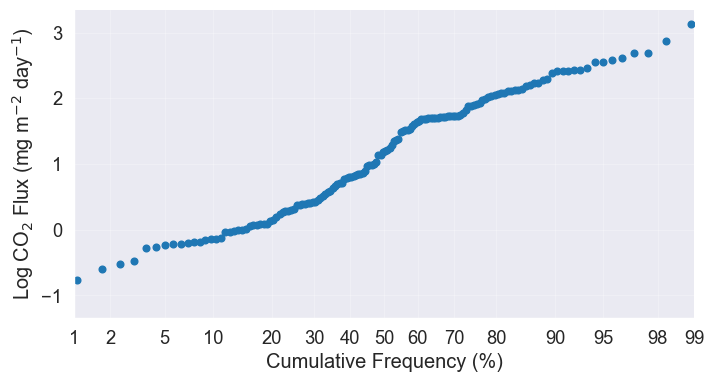

In [104]:
# Log Flux vs Cumulative Frequency

# Establish Figure Size
fig, ax = plt.subplots(figsize=(8,4))
# Probability Plot
probscale.probplot(np.log10(df_YC_flx_pos_only.CO2_Flux), ax=ax,
                   datascale="linear", probax="x")
# Pop A
'''
cum_frequency = np.arange(1, 100, step=1, dtype=int)
sns.lineplot(x=cum_frequency,
             y=(cum_frequency/0.18)*100,
             dashes=True,
             ax=ax)
'''
# Pop B
#sns.lineplot()
# Pop C
#sns.lineplot()
ax.set_xlim(left=1, right=99)
ax.set(xlabel="Cumulative Frequency (%)",
       ylabel="Log CO$_2$ Flux (mg m$^{-2}$ day$^{-1}$)")
sns.despine(fig=fig)

In [105]:
li = ax.lines[0]
li = li.get_xydata()
df = pd.DataFrame(li, columns=["Cumulative_Freq", "Flux"])
df = df[df["Flux"] >= 0]
df.reset_index(drop=True, inplace=True)
df.head()

,Cumulative_Freq,Flux
0,15.046605,0.015612
1,15.712383,0.049732
2,16.378162,0.071571
3,17.043941,0.077138
4,17.709720,0.082713


Now, let's visualize the carbon isotopes. We will do this within the landscape of associated fluxes through a scatter plot.

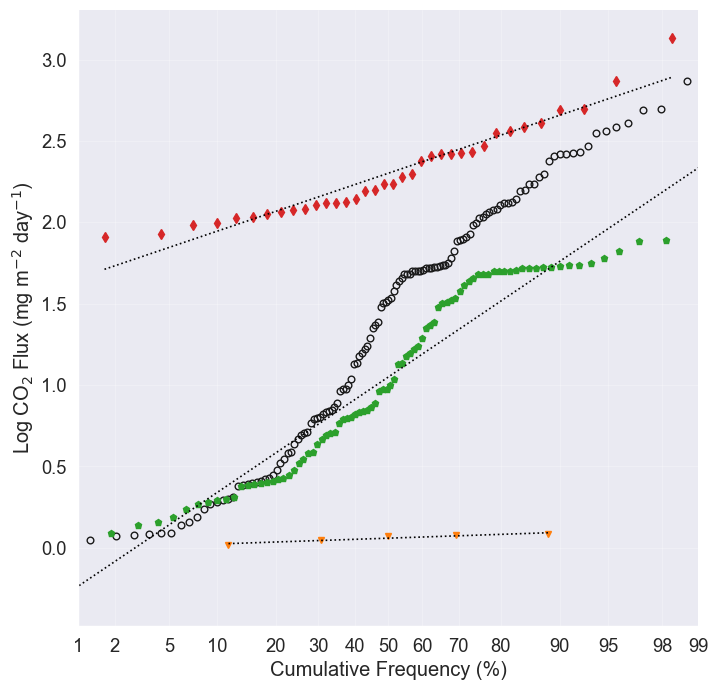

In [106]:
df_low = df[df["Cumulative_Freq"] <= 18]
df_mod = df[(df["Cumulative_Freq"] >  18) & (df["Cumulative_Freq"] <= 75)]
df_high= df[(df["Cumulative_Freq"] >  75) & (df["Cumulative_Freq"] <= 100)]

# Establish Figure Size
fig, ax = plt.subplots(figsize=(8,8))
## Probability Plot - Main
probscale.probplot(df.Flux, ax=ax,
                   datascale="linear", probax="x",
                   bestfit=False, estimate_ci=False,
                   scatter_kws=dict(marker="o", fillstyle="none", mec="k"),
                   line_kws=dict(color="black", linestyle="dotted"))
## Probability Plot - A
probscale.probplot(df_low.Flux, ax=ax,
                   datascale="linear", probax="x",
                   bestfit=True, estimate_ci=False,
                   scatter_kws=dict(marker="v"),
                   line_kws=dict(color="black", linestyle="dotted"))
## Probability Plot - B
probscale.probplot(df_mod.Flux, ax=ax,
                   datascale="linear", probax="x",
                   bestfit=True, estimate_ci=False,
                   scatter_kws=dict(marker="p"),
                   line_kws=dict(color="black", linestyle="dotted"))
## Probability Plot - C
probscale.probplot(df_high.Flux, ax=ax,
                   datascale="linear", probax="x",
                   bestfit=True, estimate_ci=False,
                   scatter_kws=dict(marker="d"),
                   line_kws=dict(color="black", linestyle="dotted"))
ax.set_xlim(left=1, right=99)
ax.set(xlabel="Cumulative Frequency (%)",
       ylabel="Log CO$_2$ Flux (mg m$^{-2}$ day$^{-1}$)")
sns.despine(fig=fig)
save_fig(plt, "../../figures/GSA_CO2_Flux.png")

Figure ##: Flux partitioning of CO<sub>2</sub> gases across YNP using graphical statistical analysis (GSA), also called "probability plot", methods described originally by Sinclair (1974) and adapted by Chiodini et al. (1998) and later by Wen et al. (2016). Here the fluxes measured across the park using the CRDS-AC equipment shows there are roughly three populations of measurements: low (i.e., sinter capped), moderate (i.e., fractured sinter and porous soil), and high (i.e., “sinter-less”, highly porous soil).


In [107]:
# Descriptive Stats for each flux popoulation
print(np.power(10, df_low["Flux"]).describe())
print(np.power(10, df_mod["Flux"].describe()))
print(np.power(10, df_high["Flux"].describe()))

count    5.000000
mean     1.148250
std      0.070818
min      1.036601
25%      1.121327
50%      1.179155
75%      1.194368
max      1.209800
Name: Flux, dtype: float64
count    1.000000e+86
mean     1.123264e+01
std      3.713789e+00
min      1.226828e+00
25%      3.363594e+00
50%      9.777888e+00
75%      4.726350e+01
max      7.946092e+01
Name: Flux, dtype: float64
count    1.000000e+36
mean     2.005418e+02
std      1.912575e+00
min      8.131681e+01
25%      1.209598e+02
50%      1.720803e+02
75%      2.768131e+02
max      1.359476e+03
Name: Flux, dtype: float64


The GSA partitions the fluxes measured across YNP into three different populations as described in Figure ##. The low flux (sinter capped) areas show that the minimum value of fluxes in this area are 1 and 3 orders of magnitude less than the moderate (fractured sinter and porous soil) and high (sinter-free highly porous soil) areas, respectively. Furthermore, the mean values of the low, moderate, and high flux areas are 461 ± 316, 12280 ± 38, and 168089 ± 15 mg CO<sub>2</sub> m<sup>-2</sup> day<sup>-1</sup>. There also appears to be a celing  or a maximum value of approximately 50000 mg CO<sub>2</sub> m<sup>-2</sup> day<sup>-1</sup> present in the moderate flux population suggesting that there is possibly increased advection or another mechanism that aids the increased fluxes observed within the high flux population.

### Differences in Fluxes between Soil Chemistry Groups
In this section, we compute the statistical relationships between the measureed fluxes across with the soil chemistry groups being the dependent variable.

The process begins by testing the groups of interest, in this case, fluxes sorted by soil chemistry, for normality to understand if we can apply tests for normality or if we must use non-parametric tests.

#### KS Test
The [Komologorov-Smirnov](https://www.statsmodels.org/dev/generated/statsmodels.stats.diagnostic.kstest_normal.html) (KS) is an effective method for quantifying the distance between the empirical distribution and the cumulative distribution of the reference (i.e., normal) function. The null hypothesis of the KS test is that the sample being analyzed is drawn for the reference distribution.

> `gb_sclf` = group by soil chemistry classification \
> Returns a list of dataframes, where each item in the list is a dataframe of samples collected and organized by the same soil classification and caldera.

In [108]:
# Separate data into fluxes by soil chemistry
## YNP
gb_sclf_YC = df_YC_all.groupby(by=["Soil_Classification"])
gb_sclf_YC = [gb_sclf_YC.get_group(x) for x in gb_sclf_YC.groups]
## VCNP
gb_sclf_VC = df_VC_all.groupby(by=["Soil_Classification"])
gb_sclf_VC = [gb_sclf_VC.get_group(x) for x in gb_sclf_VC.groups]

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3118992920.py:4: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  gb_sclf_YC = [gb_sclf_YC.get_group(x) for x in gb_sclf_YC.groups]
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3118992920.py:7: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  gb_sclf_VC = [gb_sclf_VC.get_group(x) for x in gb_sclf_VC.groups]


> `KS_rslts_sclf_flux` = KS test results from the soil chemistry flux

In [109]:
# Set up the dataframe to receive results
df_KS_rslts_sclf_flux_YC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "ks_stat_CH4",
        "pval_CH4",
        "ks_stat_CO2",
        "pval_CO2"
      ],
    index=range(4)
  )

# Loop through each soil type and check for normality
for i in range(4):
  #---YNP---#
  # Gather Soil Classification
  df_KS_rslts_sclf_flux_YC.loc[i]["Soil_Classification"] = \
  gb_sclf_YC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KS_rslts_sclf_flux_YC.loc[i]["Caldera"] = \
  gb_sclf_YC[i].Caldera.iloc[0]
  # Run KS Test - CH4
  ks_stat, pval = kstest_normal(gb_sclf_YC[i].CH4_Flux.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_sclf_flux_YC.loc[i]["ks_stat_CH4"] = ks_stat
  ## pval
  df_KS_rslts_sclf_flux_YC.loc[i]["pval_CH4"] = pval
  # Run KS Test - CO2
  ks_stat, pval = kstest_normal(gb_sclf_YC[i].CO2_Flux.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_sclf_flux_YC.loc[i]["ks_stat_CO2"] = ks_stat
  ## pval
  df_KS_rslts_sclf_flux_YC.loc[i]["pval_CO2"] = pval

# export results to `.csv`
df_KS_rslts_sclf_flux_YC.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/ks_results_sclf_yc.csv",
    index=False
)

# view results
df_KS_rslts_sclf_flux_YC

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/905329463.py:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_KS_rslts_sclf_flux_YC.loc[i]["Soil_Classification"] = \
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipyker

,Soil_Classification,Caldera,ks_stat_CH4,pval_CH4,ks_stat_CO2,pval_CO2
0,Acid-Sulphate,YNP,0.308983,0.001,0.226707,0.001
1,Neutral-Chloride,YNP,0.437927,0.001,0.306492,0.001
2,Travertine,YNP,0.227667,0.003407,0.304706,0.001
3,Unclassified,YNP,0.192082,0.522885,0.152841,0.836063


In [110]:
# Set up the dataframe to receive results
df_KS_rslts_sclf_flux_VC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "ks_stat_CH4",
        "pval_CH4",
        "ks_stat_CO2",
        "pval_CO2"
      ],
      index=range(3)
    )

# Loop through each soil type and check for normality
for i in range(3):
  #---VCNP---#
  # Gather Soil Classification
  df_KS_rslts_sclf_flux_VC.loc[i]["Soil_Classification"] = \
  gb_sclf_VC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KS_rslts_sclf_flux_VC.loc[i]["Caldera"] = \
  gb_sclf_VC[i].Caldera.iloc[0]
  # Run KS Test - CH4
  ks_stat, pval = kstest_normal(gb_sclf_VC[i].CH4_Flux.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_sclf_flux_VC.loc[i]["ks_stat_CH4"] = ks_stat
  ## pval
  df_KS_rslts_sclf_flux_VC.loc[i]["pval_CH4"] = pval
  # Run KS Test - CO2
  ks_stat, pval = kstest_normal(gb_sclf_VC[i].CO2_Flux.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_sclf_flux_VC.loc[i]["ks_stat_CO2"] = ks_stat
  ## pval
  df_KS_rslts_sclf_flux_VC.loc[i]["pval_CO2"] = pval

# export results to a `.csv`
df_KS_rslts_sclf_flux_VC.to_csv(
    "../../pertinent-data/inferential-stats-output/valles/ks_results_sclf_vc.csv",
    index=False
)

# view results
df_KS_rslts_sclf_flux_VC

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3707466684.py:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_KS_rslts_sclf_flux_VC.loc[i]["Soil_Classification"] = \
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipyke

,Soil_Classification,Caldera,ks_stat_CH4,pval_CH4,ks_stat_CO2,pval_CO2
0,Acid-Sulphate,VCNP,0.271671,0.001,0.184906,0.005046
1,Travertine,VCNP,0.390805,0.004485,0.30737,0.077072
2,Unclassified,VCNP,0.288108,0.081212,0.171176,0.771733


The KS test for normality of the CH<sub>4</sub> fluxes at YNP shows that each subset is nonnormal due to $p ≤ 0.005$, thereby rejected the null hypothesis. The unclassified group is the exception ($p ≥ 0.38$). This group represents measurements collected at NEER, where gas collections were made on altered soil but not visible thermal activity or nearby. It is expected that data collected at NEER serves as a background measurement for data collected on altyered soil but without active or recent thermal input.

For CO<sub>2</sub> fluxes, the KS tests showed similar findings. Each soil chemistry class is nonnormal ($p ≤ 0.0001$) except for the unclassified set of measurements ($p = 0.2$).

At VCNP, only three soil chemistry classes were assessed, acid-sulphate, travertine, and neutral-chloride. The KS test reveals that the CH<sub>4</sub> fluxes are all nonnormal ($p ≤ 0.005$) except for the unclassified group ($p=0.2%+$). Unlike YNP, the unclasified group at VCNP consits of measurements collected at VCRP and VCHB, with the latter being the slight majority comprising 57% of unclassified group.

The  CO<sub>2</sub> fluxes at VCNP showed all nonnormal datasets across the soil chemistry classes with all groups with $p ≤ 0.0001$.

#### FK Test

Following the KS tests, we test for equality of variance (i.e., homogenous variance) using the [Fligner-Killeen (FK) test](https://www.geeksforgeeks.org/fligner-killeen-test-in-r-programming). The null hypothesis for this test is that the samples are drawn from populations with the same variance. The FK test was chosen because many of the fluxes in these groups vary significantly. From earliter, the medians are often reported because large outliers are present without a pattern. This test for homoscedasticity centers the data on the median rather than mean, which provides for more robustness for nonnormal data, which the KS test demonstrated was exisisten in almost all groups (Fligner & Killeen, 1976). Further similations with offshore oil permit bids showed that the FK test performed robustly with departures from normality and power (Conover et al., 1981).

Yellowstone FK test

In [111]:
# Test YNP
## CH4
fk_stat_ch4, pval_ch4 = fligner(
    gb_sclf_YC[0].CH4_Flux,
    gb_sclf_YC[1].CH4_Flux,
    gb_sclf_YC[2].CH4_Flux,
    gb_sclf_YC[3].CH4_Flux
  )
print("After applying the FK test to the YNP CH4 Flux data, \nthe FK stat is {:.2f} and the p-value is {:.3e}\n".format(fk_stat_ch4, pval_ch4))
## CO2
fk_stat_co2, pval_co2 = fligner(
    gb_sclf_YC[0].CO2_Flux,
    gb_sclf_YC[1].CO2_Flux,
    gb_sclf_YC[2].CO2_Flux,
    gb_sclf_YC[3].CO2_Flux
  )
print("After applying the FK test to the YNP CO2 Flux data, \nthe FK stat is {:.2f} and the p-value is {:.3e}\n".format(fk_stat_co2, pval_co2))

# consolidate results into a dataframe
df_FK_rslts_sclf_flux_yc = pd.DataFrame(
    {
      "fk_stat_ch4":fk_stat_ch4,
      "pval_ch4":pval_ch4,
      "fk_stat_co2":fk_stat_co2,
      "pval_co2":pval_co2
    },
    index=range(1)
)

# export results to a `.csv`
df_FK_rslts_sclf_flux_yc.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/fk_results_sclf_yc.csv",
    index=False
)

After applying the FK test to the YNP CH4 Flux data, 
the FK stat is 48.84 and the p-value is 1.411e-10

After applying the FK test to the YNP CO2 Flux data, 
the FK stat is 54.89 and the p-value is 7.249e-12



Valles Caldera FK test

In [112]:
# Test VCNP
## CH4
fk_stat_ch4, pval_ch4 = fligner(
    gb_sclf_VC[0].CH4_Flux,
    gb_sclf_VC[1].CH4_Flux,
    gb_sclf_VC[2].CH4_Flux
  )
print("After applying the FK test to the VCNP CH4 Flux data, \nthe FK stat is {:.2f} and the p-value is {:.3e}\n".format(fk_stat_ch4, pval_ch4))
## CO2
fk_stat_co2, pval_co2 = fligner(
    gb_sclf_VC[0].CO2_Flux,
    gb_sclf_VC[1].CO2_Flux,
    gb_sclf_VC[2].CO2_Flux
  )
print("After applying the FK test to the VCNP CO2 Flux data, \nthe FK stat is {:.2f} and the p-value is {:.3e}\n".format(fk_stat_co2, pval_co2))

# consolidate results into a dataframe
df_FK_rslts_sclf_flux_vc = pd.DataFrame(
    {
      "fk_stat_ch4":fk_stat_ch4,
      "pval_ch4":pval_ch4,
      "fk_stat_co2":fk_stat_co2,
      "pval_co2":pval_co2
    },
    index=range(1)
)

# export results to a `.csv`
df_FK_rslts_sclf_flux_yc.to_csv(
    "../../pertinent-data/inferential-stats-output/valles/fk_results_sclf_vc.csv",
    index=False
)

After applying the FK test to the VCNP CH4 Flux data, 
the FK stat is 5.00 and the p-value is 8.211e-02

After applying the FK test to the VCNP CO2 Flux data, 
the FK stat is 7.02 and the p-value is 2.996e-02



~Levene test for unequal variance, an alternative not used to the FK test~

In [113]:
# # Import Levene's test for unequal variance from `scipy` module
# from scipy.stats import levene

# # Test VCNP
# ## CH4
# lev_stat, pval = levene(gb_scls_YC[0].CH4_Flux, gb_scls_YC[1].CH4_Flux,
#                         gb_scls_YC[2].CH4_Flux, gb_scls_YC[3].CH4_Flux,
#                         center="median")
# print("After applying the Levene test to the YNP CH4 Flux data, \nthe Levene stat is {:.2f} and the p-value is {:.3e}".format(lev_stat, pval))
# ## CO2
# lev_stat, pval = levene(gb_scls_YC[0].CO2_Flux, gb_scls_YC[1].CO2_Flux,
#                         gb_scls_YC[2].CO2_Flux, gb_scls_YC[3].CO2_Flux,
#                         center="median")
# print("After applying the Levene test to the YNP CO2 Flux data, \nthe Levene stat is {:.2f} and the p-value is {:.3e}".format(lev_stat, pval))

# # Test VCNP
# ## CH4
# lev_stat, pval = levene(gb_scls_VC[0].CH4_Flux.dropna(), gb_scls_VC[1].CH4_Flux.dropna(),
#                         gb_scls_VC[2].CH4_Flux.dropna(),
#                         center="median")
# print("After applying the Levene test to the VCNP CH4 Flux data, \nthe Levene stat is {:.2f} and the p-value is {:.3e}".format(lev_stat, pval))
# ## CO2
# lev_stat, pval = levene(gb_scls_VC[0].CO2_Flux.dropna(), gb_scls_VC[1].CO2_Flux.dropna(),
#                         gb_scls_VC[2].CO2_Flux.dropna(),
#                         center="median")
# print("After applying the Levene test to the VCNP CO2 Flux data, \nthe Levene stat is {:.2f} and the p-value is {:.3e}".format(lev_stat, pval))

The results from the FK test reject the null hypothesis that when organized by soil chemistry class, the Yellowstone CH$_{4}$ ($p ≤ 0.0001$) and CO$_{2}$ ($p ≤ 0.0001$) fluxes are from populations are from equal variance.

Thus, the FK test demonstrates that for both gases, the varaince in flux between each soil chemistry class is not equal and not constant. This means the data has heterogenous variance, underscoring the need to use non-parametric analysis to durther distinguish significant relationships.

#### KW Test

The Kruskal-Wallis (KW) test is a reputable method to assess the difference in the medians across groups. Its null hypothesis states that the medians across all groups are equal to one another, and it can verify if there is a statistical significant difference between the medians if the null is rejected. Similar to ANOVA, it is the non-parametric method for testing differences between medians. Specifically, the medians of the CH<sub>4</sub> and CO<sub>2</sub> fluxes across and between the calderas.

Yellowstone KW test

In [114]:
for data in gb_sclf_YC:
  print(
      "The median CH4 flux is {:.3f} mg CH4 m-2 day-1 for the {} soil class".format(np.median(data.CH4_Flux), data.Soil_Classification.iloc[0])
  )

  print(
      "The median CO2 flux is {:.3f} g CO2 m-2 day-1 for the {} soil class\n".format(np.median(data.CO2_Flux), data.Soil_Classification.iloc[0])
  )

The median CH4 flux is 13.808 mg CH4 m-2 day-1 for the Acid-Sulphate soil class
The median CO2 flux is 116.336 g CO2 m-2 day-1 for the Acid-Sulphate soil class

The median CH4 flux is -0.408 mg CH4 m-2 day-1 for the Neutral-Chloride soil class
The median CO2 flux is 2.631 g CO2 m-2 day-1 for the Neutral-Chloride soil class

The median CH4 flux is -0.723 mg CH4 m-2 day-1 for the Travertine soil class
The median CO2 flux is 4.315 g CO2 m-2 day-1 for the Travertine soil class

The median CH4 flux is -0.949 mg CH4 m-2 day-1 for the Unclassified soil class
The median CO2 flux is 15.117 g CO2 m-2 day-1 for the Unclassified soil class



In [115]:
# CH4 fluxes across soil chemistry classes at YNP
kw_stat_ch4, pval_ch4 = kruskal(
    gb_sclf_YC[0].CH4_Flux,
    gb_sclf_YC[1].CH4_Flux,
    gb_sclf_YC[2].CH4_Flux,
    gb_sclf_YC[3].CH4_Flux,
    nan_policy="omit"
  )
print("After applying the KW test to the YNP CH4 Flux data across soil chemistry \nclasses, the KW stat is {:.2f} and the p-value is {:.3e}".format(kw_stat_ch4, pval_ch4))

# CO2 fluxes across soil chemistry classes at YNP
kw_stat_co2, pval_co2 = kruskal(
    gb_sclf_YC[0].CO2_Flux,
    gb_sclf_YC[1].CO2_Flux,
    gb_sclf_YC[2].CO2_Flux,
    gb_sclf_YC[3].CO2_Flux,
    nan_policy="omit"
  )
print("After applying the KW test to the YNP CO2 Flux data across soil chemistry \nclasses, the KW stat is {:.2f} and the p-value is {:.3e}".format(kw_stat_co2, pval_co2))


# consolidate results into a dataframe
df_KW_rslts_sclf_flux_yc = pd.DataFrame(
    {
      "kw_stat_ch4":kw_stat_ch4,
      "pval_ch4":pval_ch4,
      "kw_stat_co2":kw_stat_co2,
      "pval_co2":pval_co2
    },
    index=range(1)
)

# export results to a `.csv`
df_FK_rslts_sclf_flux_yc.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/kw_results_sclf_yc.csv",
    index=False
)

After applying the KW test to the YNP CH4 Flux data across soil chemistry 
classes, the KW stat is 37.50 and the p-value is 3.606e-08
After applying the KW test to the YNP CO2 Flux data across soil chemistry 
classes, the KW stat is 59.62 and the p-value is 7.076e-13


Valles Caldera KW test

In [116]:
for data in gb_sclf_VC:
  print(
      "The median CH4 flux is {:.3f} mg CH4 m-2 day-1 for the {} soil class".format(np.median(data.CH4_Flux), data.Soil_Classification.iloc[0])
  )

The median CH4 flux is 68.934 mg CH4 m-2 day-1 for the Acid-Sulphate soil class
The median CH4 flux is 3.939 mg CH4 m-2 day-1 for the Travertine soil class
The median CH4 flux is 20.057 mg CH4 m-2 day-1 for the Unclassified soil class


In [117]:
for data in gb_sclf_VC:
  print(
      "The median CO2 flux is {:.3f} g CO2 m-2 day-1 for the {} soil class".format(np.median(data.CO2_Flux), data.Soil_Classification.iloc[0])
  )

The median CO2 flux is 309.542 g CO2 m-2 day-1 for the Acid-Sulphate soil class
The median CO2 flux is 37.898 g CO2 m-2 day-1 for the Travertine soil class
The median CO2 flux is 415.665 g CO2 m-2 day-1 for the Unclassified soil class


In [118]:
# CH4 fluxes across soil chemistry classes at VCNP
kw_stat_ch4, pval_ch4 = kruskal(
    gb_sclf_VC[0].CH4_Flux,
    gb_sclf_VC[1].CH4_Flux,
    gb_sclf_VC[2].CH4_Flux,
    nan_policy="omit"
  )
print("After applying the KW test to the VCNP CH4 Flux data across soil chemistry \nclasses, the KW stat is {:.2f} and the p-value is {:.3e}".format(kw_stat_ch4, pval_ch4))

# CO2 fluxes across soil chemistry classes at VCNP
kw_stat_co2, pval_co2 = kruskal(
    gb_sclf_VC[0].CO2_Flux,
    gb_sclf_VC[1].CO2_Flux,
    gb_sclf_VC[2].CO2_Flux,
    nan_policy="omit"
  )
print("After applying the KW test to the VCNP CO2 Flux data across soil chemistry \nclasses, the KW stat is {:.2f} and the p-value is {:.3e}".format(kw_stat_co2, pval_co2))


# consolidate results into a dataframe
df_KW_rslts_sclf_flux_yc = pd.DataFrame(
    {
      "kw_stat_ch4":kw_stat_ch4,
      "pval_ch4":pval_ch4,
      "kw_stat_co2":kw_stat_co2,
      "pval_co2":pval_co2
    },
    index=range(1)
)

# export results to a `.csv`
df_FK_rslts_sclf_flux_yc.to_csv(
    "../../pertinent-data/inferential-stats-output/valles/kw_results_sclf_vc.csv",
    index=False
)

After applying the KW test to the VCNP CH4 Flux data across soil chemistry 
classes, the KW stat is 2.93 and the p-value is 2.314e-01
After applying the KW test to the VCNP CO2 Flux data across soil chemistry 
classes, the KW stat is 4.82 and the p-value is 8.994e-02


The results from the KW tests reject the null hypothesis that the CH<sub>4</sub> and CO<sub>2</sub> fluxes have equal medians across the soil chemistry classes at YNP ($p ≤ 0.0001$). Similar findings occured when the CO<sub></sub> fluxes were tested at VCNP. The null was rejected indicating at least one group was significantly different than than the others ($p ≤ 0.002$). However, the KW test failed to reject that the medians of CH<sub>4</sub> fluxes at VCNP are equal ($p = 0.14$).

#### Post-Hoc Analysis

With these results, it is now prudent to assess the relationship between each of these groups to one another. This analysis is called post-hoc analysis, and there are two tests used. There are two methods to conduct this analsysis: 1) [Dunn's](https://www.statology.org/dunns-test/) test and 2) [Conover-Imam](https://permalink.lanl.gov/object/tr?what=info:lanl-repo/lareport/LA-07677-MS) test. Dunn's test is utilzed most often and can be used whether or not the KW test rejected the null hypothesis. However, the Conover-Imam test leverages [greater statistical power](https://stackoverflow.com/questions/31434166/which-post-hoc-test-should-i-conduct-after-doing-a-kruskal-wallis) in assessing the different groups, when the KW test rejects the null hypothesis. Both are used in this post-hoc analysis.

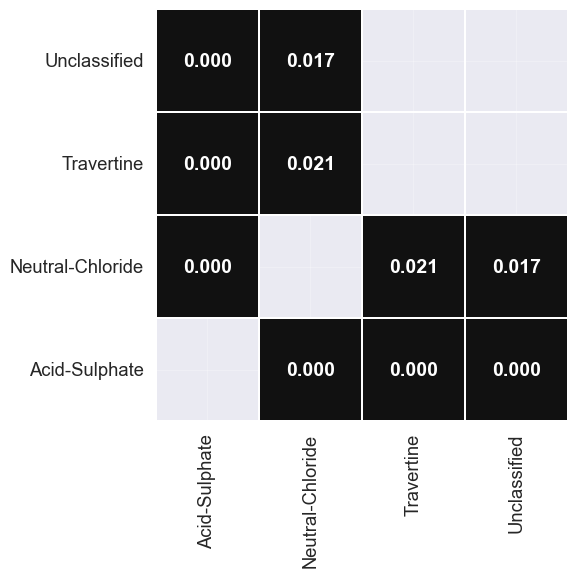

In [119]:
# Conover-Imam test for CH4 at YNP across soil chemistry classes
## Apply the test to the samples
conover_CH4_sclf_YNP = conover(
    df_YC_all,
    val_col="CH4_Flux",
    group_col="Soil_Classification",
    p_adjust="bonferroni",
    sort=True
  )

# Create heatmap
plt.figure(figsize=(8,6))
ax = sns.heatmap(
    conover_CH4_sclf_YNP,
    linewidths=0.35,
    # cmap="Greys_r",
    cmap=bk_wt_cmap,
    vmin=0.05,
    vmax=1.0,
    mask=conover_CH4_sclf_YNP > 0.05,
    square=True,
    fmt=".3f",
    annot=True,
    annot_kws={"color":"white", "weight":"bold"},
    cbar=False,
    cbar_kws={"label":"p-value"}
  )
ax.invert_yaxis()
plt.tight_layout()
save_fig(plt, "../../figures/conover_CH4_v_soil-class_YNP.png")

Figure: Heatmap for displaying the relationships between the CH<sub>4</sub> fluxes at YNP using the results from the Conovoer-Imam test.  The white squares indicate relations with high ($p \sim 1$).

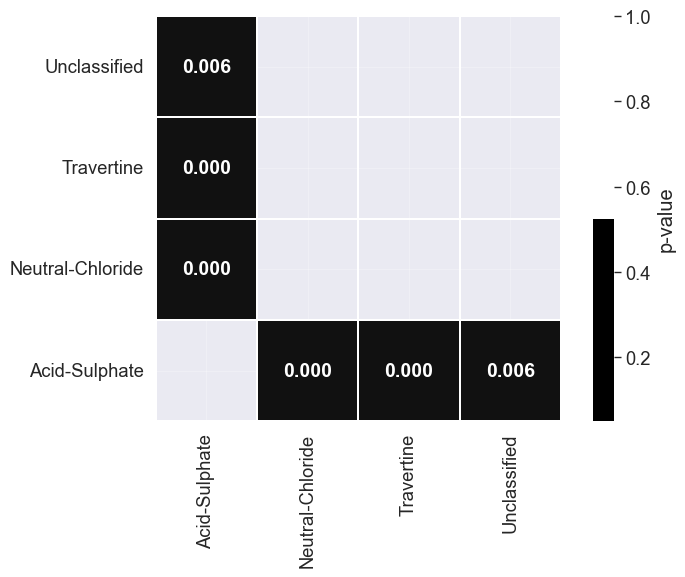

In [120]:
# Conover-Imam test for CO2 at YNP across soil chemistry classes
## Apply the test to the samples
conover_CO2_scls_YNP = conover(
    df_YC_all,
    val_col="CO2_Flux",
    group_col="Soil_Classification",
    p_adjust="bonferroni",
    sort=True
  )

# Create heatmap
plt.figure(figsize=(8,6))
ax = sns.heatmap(
    conover_CO2_scls_YNP,
    linewidths=0.35,
    # cmap="Greys_r",
    cmap=bk_wt_cmap,
    vmin=0.05,
    vmax=1.0,
    mask=conover_CO2_scls_YNP > 0.05,
    square=True,
    fmt=".3f",
    annot=True,
    annot_kws={"color":"white", "weight":"bold"},
    cbar_kws={"label":"p-value"}
  )
ax.invert_yaxis()
plt.tight_layout()
save_fig(plt, "../../figures/conover_CO2_v_soil-class_YNP.png")

The Conovor-Imam test demonstrates that there are several signifcant relationships between social chemistry classes (Figure ##). The acid-sulphate CH<sub>4</sub> fluxes at proved to be significantly different from every soil chemistry class at YNP. Neutral-chloride is signnificantly different than the travertine and unclassified classes. However, travertine and unclassified do not express any additional significantly different relationships.

At YNP, the CO<sub>2</sub> fluxes are significantly different between all other soil chemistry classes. Neutral-Chloride and travertine are significantly different from each other, and the unclassified measurements are not significantly different than the other groups except for acid-sulphate. Due to the numerous amount of low fluxes in the nuetral-chloride and travertine locations, distinction from the unclassified was not observed.

In [121]:
# filter groups where the KW null was rejected
df_VC_kw_reject = df_VC_all[["CH4_Flux", "CO2_Flux", "Soil_Classification"]]
df_VC_kw_reject = df_VC_kw_reject[df_VC_kw_reject["Soil_Classification"]!= "Unclassified"]

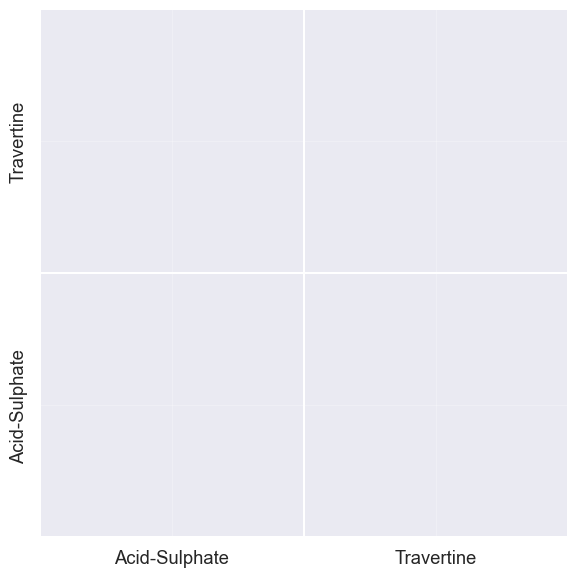

In [122]:
# Conover-Iman test for CH4 at VC across soil chemistry classes
## Apply the test to the samples
conover_CH4_sclf_VC = conover(
    df_VC_kw_reject,
    val_col="CH4_Flux",
    group_col="Soil_Classification",
    p_adjust="bonferroni",
    sort=True
  )

# Create heatmap
plt.figure(figsize=(8,6))
ax = sns.heatmap(
    conover_CH4_sclf_VC,
    linewidths=0.35,
    # cmap="Greys_r",
    cmap=bk_wt_cmap,
    vmin=0.05,
    vmax=1.0,
    mask=conover_CH4_sclf_VC > 0.05,
    square=True,
    fmt=".3f",
    annot=True,
    annot_kws={"color":"white", "weight":"bold"},
    cbar=False,
    cbar_kws={"label":"p-value"}
  )
ax.invert_yaxis()
plt.tight_layout()
save_fig(plt, "../../figures/conover_CH4_v_soil-class_VC.png")

In [123]:
conover_CH4_sclf_VC

,Acid-Sulphate,Travertine
Acid-Sulphate,1.000000,0.088382
Travertine,0.088382,1.000000


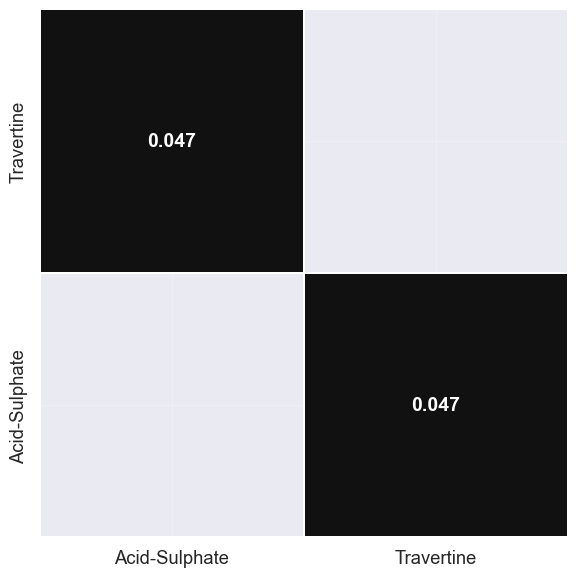

In [124]:
# Conover-Imam test for CO2 at VC across soil chemistry classes
## Apply the test to the samples
conover_CO2_sclf_VC = conover(
    df_VC_kw_reject,
    val_col="CO2_Flux",
    group_col="Soil_Classification",
    p_adjust="bonferroni",
    sort=True
  )

# Create heatmap
plt.figure(figsize=(8,6))
ax = sns.heatmap(
    conover_CO2_sclf_VC,
    linewidths=0.35,
    # cmap="Greys_r",
    cmap=bk_wt_cmap,
    vmin=0.05,
    vmax=1.0,
    mask=conover_CO2_sclf_VC > 0.05,
    square=True, fmt=".3f",
    annot=True,
    annot_kws={"color":"white", "weight":"bold"},
    cbar=False,
    cbar_kws={"label":"p-value"}
  )
ax.invert_yaxis()
plt.tight_layout()
save_fig(plt, "../../figures/conover_CO2_v_soil-class_VC.png")

In [125]:
conover_CO2_sclf_VC

,Acid-Sulphate,Travertine
Acid-Sulphate,1.000000,0.047434
Travertine,0.047434,1.000000


##### Experiment: Using Dunn's test for post-hoc analysis

Dunn's test was applied to the results from VCNP; however, Conover-Iman has greater statistical power and should be used instead where appropriate.

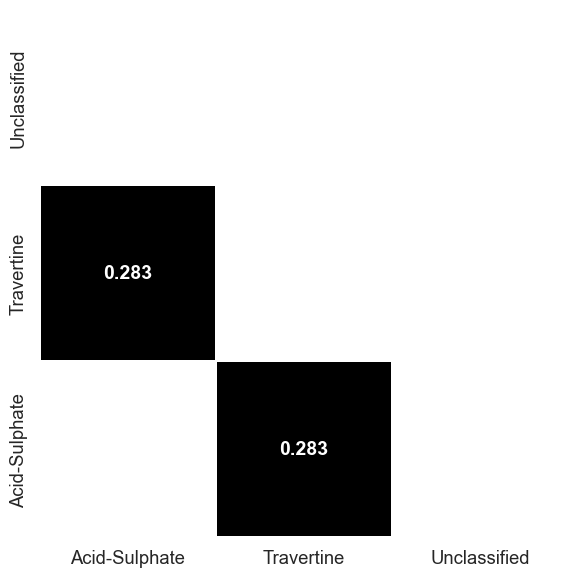

In [126]:
# Assess the significant differences between groups
## Import the test
from scikit_posthocs import posthoc_dunn as dunn

# Dunn's test for CO2 at YNP across soil chemistry classes
## Apply the test to the samples
dunn_CH4_scls_YNP = dunn(
    df_VC_all,
    val_col="CH4_Flux",
    group_col="Soil_Classification",
    p_adjust="bonferroni",
    sort=True
  )

# Create heatmap
plt.figure(figsize=(8,6))
ax = sns.heatmap(
    dunn_CH4_scls_YNP,
    linewidths=0.35,
    # cmap="Greys_r",
    cmap=bk_wt_cmap,
    vmin=0.05,
    vmax=1.0,
    # mask=conover_CO2_sclf_VC > 0.05,
    square=True,
    fmt=".3f",
    annot=True,
    annot_kws={"color":"white", "weight":"bold"},
    cbar=False,
    cbar_kws={"label":"p-value"}
  )
ax.invert_yaxis()
plt.tight_layout()
save_fig(plt, "../../figures/dunn_CH4_v_soil-class_VCNP.png")

In [127]:
dunn_CH4_scls_YNP

,Acid-Sulphate,Travertine,Unclassified
Acid-Sulphate,1.000000,0.283051,1.0
Travertine,0.283051,1.000000,1.0
Unclassified,1.000000,1.000000,1.0


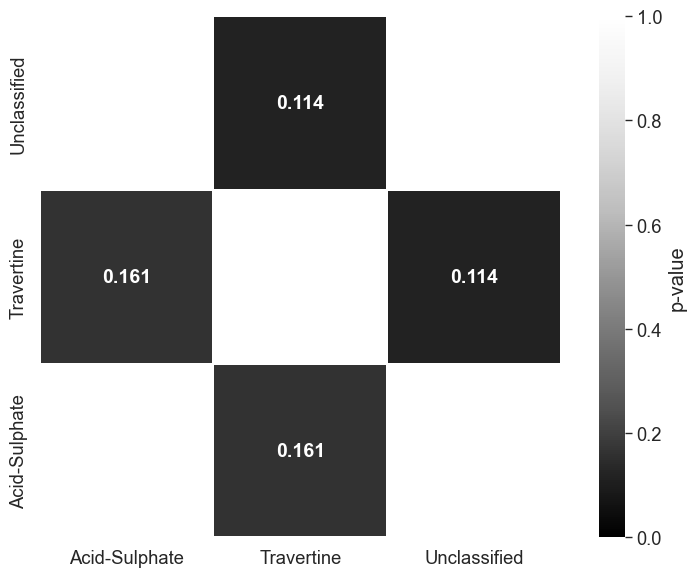

In [128]:
# Dunn's test for CO2 at YNP across soil chemistry classes
## Apply the test to the samples
dunn_CO2_scls_YNP = \
dunn(df_VC_all,
        val_col="CO2_Flux", group_col="Soil_Classification",
        p_adjust="bonferroni",
        sort=True)

# Create heatmap
plt.figure(figsize=(8,6))
ax = sns.heatmap(dunn_CO2_scls_YNP, linewidths=0.35, cmap="Greys_r",
                 square=True, fmt=".3f", vmin=0, vmax=1,
                 annot=True, annot_kws={"color":"white", "weight":"bold"},
                 cbar_kws={"label":"p-value"})
ax.invert_yaxis()
plt.tight_layout()
save_fig(plt, "../../figures/dunn_CO2_v_soil-class_VCNP.png")

Dunn's test failed to reject the the null hypothesis that the median CH<sub>4</sub> fluxes were equal between all soil chemistry groups at VCNP ($p ≥ 0.174$). However, the results for the CO<sub>2</sub> fluxes showed significant differences between the unclassified group and the acid-sulphate as well as the travertine groups ($p ≤ 0.026$). The acid-sulphate and travertine fluxes were not statistically significant from one another ($p ≥ 0.655$).

#### Overlapping Distributions of Fluxes by Soil Chemistry Class

In [129]:
df_YC_all.columns

Index(['Site_Name', 'Group', 'Location', 'Soil_Classification', 'Latitude',
       'Longitude', 'Date_of_Measurement', 'Start_Time_of_Chamber_Enclosure',
       'End_Time_of_Chamber_Enclosure', 'Duration_of_Total_Chamber_Enclosure',
       'Start_Time_Flux', 'End_Time_Flux', 'CH4_Flux', 'LowerBound_CH4_Flux',
       'UpperBound_CH4_Flux', 'KP_d13CH4_source',
       'KP_LowerBound_d13CH4_source', 'KP_UpperBound_d13CH4_source',
       'd13CH4_source', 'd13CH4_LowerBound_source', 'd13CH4_UpperBound_source',
       'CO2_Flux', 'LowerBound_CO2_Flux', 'UpperBound_CO2_Flux',
       'KP_d13CO2_source', 'KP_LowerBound_d13CO2_source',
       'KP_UpperBound_d13CO2_source', 'd13CO2_source',
       'd13CO2_LowerBound_source', 'd13CO2_UpperBound_source',
       'Soil_Tempeature_at_Surface', 'caldera_side', 'Caldera'],
      dtype='object')

Yellowstone

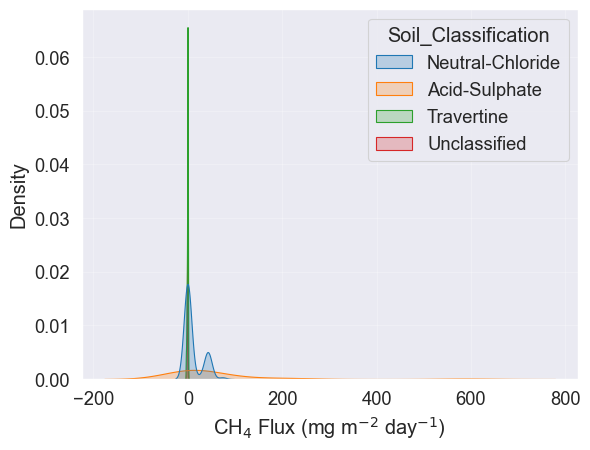

In [130]:
# ch4 fluxes
fig, ax = plt.subplots()
sns.kdeplot(
    data=df_YC_all,
    x="CH4_Flux",
    hue="Soil_Classification",
    fill=True,
    ax=ax
)

plt.xlabel("CH$_{4}$ Flux (mg m$^{-2}$ day$^{-1}$)")
save_fig(plt, "../../figures/kde_ch4_flux_YC.png")
plt.show()

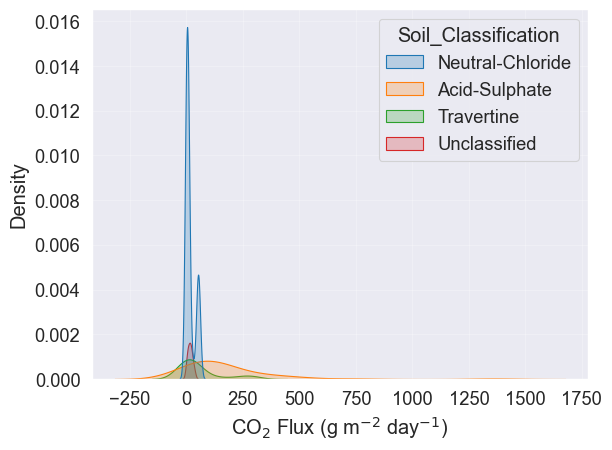

In [131]:
# co2 fluxes
fig, ax = plt.subplots()
sns.kdeplot(
    data=df_YC_all,
    x="CO2_Flux",
    hue="Soil_Classification",
    fill=True,
    ax=ax
)

plt.xlabel("CO$_{2}$ Flux (g m$^{-2}$ day$^{-1}$)")
save_fig(plt, "../../figures/kde_co2_flux_YC.png")
plt.show()

Valles

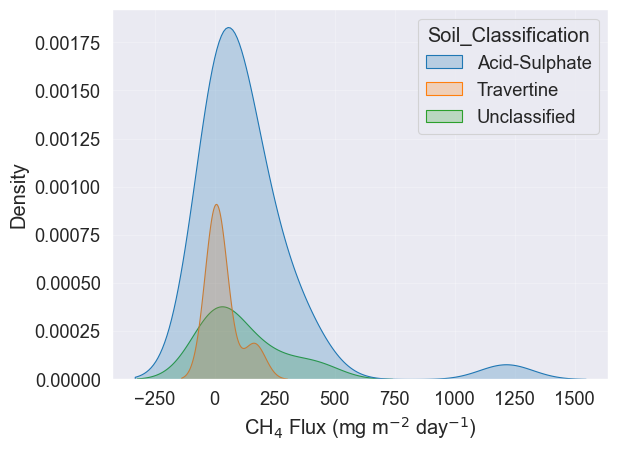

In [132]:
# ch4 fluxes
fig, ax = plt.subplots()
sns.kdeplot(
    data=df_VC_all,
    x="CH4_Flux",
    hue="Soil_Classification",
    fill=True,
    ax=ax
)

plt.xlabel("CH$_{4}$ Flux (mg m$^{-2}$ day$^{-1}$)")
save_fig(plt, "../../figures/kde_ch4_flux_VC.png")
plt.show()

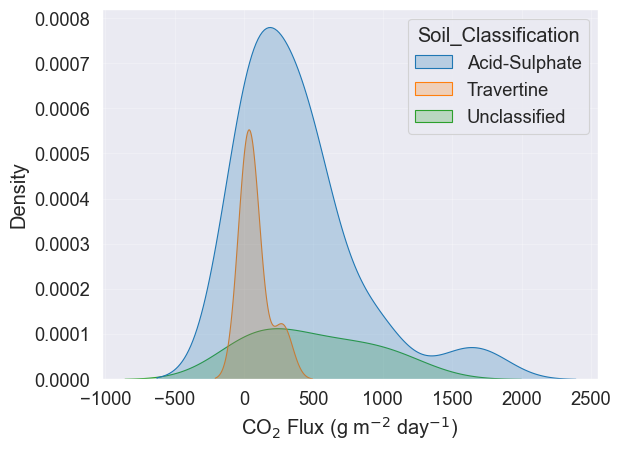

In [133]:
# co2 fluxes
fig, ax = plt.subplots()
sns.kdeplot(
    data=df_VC_all,
    x="CO2_Flux",
    hue="Soil_Classification",
    fill=True,
    ax=ax
)

plt.xlabel("CO$_{2}$ Flux (g m$^{-2}$ day$^{-1}$)")
save_fig(plt, "../../figures/kde_co2_flux_VC.png")
plt.show()

### Hypothesis Tests Across Groups

Using a similar workflow as the differentation of fluxes across soil chemistry classes, we now examine the differences between groups within the respective calderas.

Using the information gleaned from quantifying the mean and standard deviation of the fluxes it is possible that one or both gases are displaying non-normal behavior. To test this, we employ Kolmogorov-Smirnov (KS) test for normality.

#### KS Test
Assess the normality of the distributions within each group.

In [134]:
# Separate data into fluxes by soil chemistry
## YNP
gb_grps_YC = df_YC_all.groupby(by=["Group"])
gb_grps_YC = [gb_grps_YC.get_group(x) for x in gb_grps_YC.groups]
## VCNP
gb_grps_VC = df_VC_all.groupby(by=["Group"])
gb_grps_VC = [gb_grps_VC.get_group(x) for x in gb_grps_VC.groups]

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/4086979322.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gb_grps_YC = df_YC_all.groupby(by=["Group"])
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/4086979322.py:4: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  gb_grps_YC = [gb_grps_YC.get_group(x) for x in gb_grps_YC.groups]
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/4086979322.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default

In [135]:
# Set up the dataframe to receive results
df_KS_rslts_grps_flux_YC = \
pd.DataFrame(columns=["Group", "Caldera", "Soil_Classification",
                      "ks_stat_CH4", "pval_CH4",
                      "ks_stat_CO2", "pval_CO2"],
             index=range(10))

# Loop through each soil type and check for normality
for i in range(10):
  #---YNP---#
  # Gather Group
  df_KS_rslts_grps_flux_YC.loc[i]["Group"] = \
  gb_grps_YC[i].Group.iloc[0]
  # Gather Caldera
  df_KS_rslts_grps_flux_YC.loc[i]["Caldera"] = \
  gb_grps_YC[i].Caldera.iloc[0]
  # Gather Soil Classification
  df_KS_rslts_grps_flux_YC.loc[i]["Soil_Classification"] = \
  gb_grps_YC[i].Soil_Classification.iloc[0]
  # Run KS Test - CH4
  ks_stat, pval = kstest_normal(gb_grps_YC[i].CH4_Flux.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_grps_flux_YC.loc[i]["ks_stat_CH4"] = ks_stat
  ## pval
  df_KS_rslts_grps_flux_YC.loc[i]["pval_CH4"] = pval
  # Run KS Test - CO2
  ks_stat, pval = kstest_normal(gb_grps_YC[i].CO2_Flux.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_grps_flux_YC.loc[i]["ks_stat_CO2"] = ks_stat
  ## pval
  df_KS_rslts_grps_flux_YC.loc[i]["pval_CO2"] = pval

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/884065091.py:12: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_KS_rslts_grps_flux_YC.loc[i]["Group"] = \
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/88406

In [136]:
# Set up the dataframe to receive results
df_KS_rslts_grps_flux_VC = \
pd.DataFrame(columns=["Group", "Caldera", "Soil_Classification",
                      "ks_stat_CH4", "pval_CH4",
                      "ks_stat_CO2", "pval_CO2"],
             index=range(5))

# Loop through each soil type and check for normality
for i in range(5):
  #---YNP---#
  # Gather Group
  df_KS_rslts_grps_flux_VC.loc[i]["Group"] = \
  gb_grps_VC[i].Group.iloc[0]
  # Gather Caldera
  df_KS_rslts_grps_flux_VC.loc[i]["Caldera"] = \
  gb_grps_VC[i].Caldera.iloc[0]
  # Gather Soil Classification
  df_KS_rslts_grps_flux_VC.loc[i]["Soil_Classification"] = \
  gb_grps_VC[i].Soil_Classification.iloc[0]
  # Run KS Test - CH4
  ks_stat, pval = kstest_normal(gb_grps_VC[i].CH4_Flux.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_grps_flux_VC.loc[i]["ks_stat_CH4"] = ks_stat
  ## pval
  df_KS_rslts_grps_flux_VC.loc[i]["pval_CH4"] = pval
  # Run KS Test - CO2
  ks_stat, pval = kstest_normal(gb_grps_VC[i].CO2_Flux.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_grps_flux_VC.loc[i]["ks_stat_CO2"] = ks_stat
  ## pval
  df_KS_rslts_grps_flux_VC.loc[i]["pval_CO2"] = pval

# Show results table
df_KS_rslts_grps_flux = pd.concat([df_KS_rslts_grps_flux_YC,
                                   df_KS_rslts_grps_flux_VC])
df_KS_rslts_grps_flux.reset_index(drop=True, inplace=True)
df_KS_rslts_grps_flux.to_csv("df_KS_rslts_grps_flux.csv", sep=",", index=False)

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2394540125.py:12: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_KS_rslts_grps_flux_VC.loc[i]["Group"] = \
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2394

The p-values for the KS test demonstrate there multiple groups (YNP = 5/15; VCNP = 3/5) that are reject the the null hypothesis at the 95% confidence level that their CH<sub>4</sub> fluxes are distributed normally (Supplementary Table ##). These groups at both calderas primarily belong to the acid-sulphate group, but there are exceptions.

Similarly, CO<sub>2</sub> fluxes from the majority of measurement groups (YNP = 7/10; VCNP = 2/5) across both calderas were shown not come from a normally distributed populations (Supplementary Table ##).

#### FK Test
The Fligner-Killeen test examines the null the hypothesis that the variance between the groups is equal.

In [137]:
# Test YNP
## CH4
fk_stat, pval = fligner(gb_grps_YC[0].CH4_Flux, gb_grps_YC[1].CH4_Flux,
                        gb_grps_YC[2].CH4_Flux, gb_grps_YC[3].CH4_Flux,
                        gb_grps_YC[4].CH4_Flux, gb_grps_YC[5].CH4_Flux,
                        gb_grps_YC[6].CH4_Flux, gb_grps_YC[7].CH4_Flux,
                        gb_grps_YC[8].CH4_Flux, gb_grps_YC[9].CH4_Flux)
print("After applying the FK test to the YNP CH4 Flux data, \nthe FK stat is {:.2f} and the p-value is {:.3e}".format(fk_stat, pval))
## CO2
fk_stat, pval = fligner(gb_grps_YC[0].CO2_Flux, gb_grps_YC[1].CO2_Flux,
                        gb_grps_YC[2].CO2_Flux, gb_grps_YC[3].CO2_Flux,
                        gb_grps_YC[4].CO2_Flux, gb_grps_YC[5].CO2_Flux,
                        gb_grps_YC[6].CO2_Flux, gb_grps_YC[7].CO2_Flux,
                        gb_grps_YC[8].CO2_Flux, gb_grps_YC[9].CO2_Flux)
print("After applying the FK test to the YNP CO2 Flux data, \nthe FK stat is {:.2f} and the p-value is {:.3e}".format(fk_stat, pval))

# Test VCNP
## CH4
fk_stat, pval = fligner(gb_grps_VC[0].CH4_Flux.dropna(), gb_grps_VC[1].CH4_Flux,
                        gb_grps_VC[2].CH4_Flux, gb_grps_VC[3].CH4_Flux,
                        gb_grps_VC[4].CH4_Flux)
print("After applying the FK test to the VCNP CH4 Flux data, \nthe FK stat is {:.2f} and the p-value is {:.3e}".format(fk_stat, pval))
## CO2
fk_stat, pval = fligner(gb_grps_VC[0].CO2_Flux.dropna(), gb_grps_VC[1].CO2_Flux,
                        gb_grps_VC[2].CO2_Flux, gb_grps_VC[3].CO2_Flux,
                        gb_grps_VC[4].CO2_Flux)
print("After applying the FK test to the VCNP CO2 Flux data, \nthe FK stat is {:.2f} and the p-value is {:.3e}".format(fk_stat, pval))

After applying the FK test to the YNP CH4 Flux data, 
the FK stat is 87.79 and the p-value is 4.512e-15
After applying the FK test to the YNP CO2 Flux data, 
the FK stat is 85.49 and the p-value is 1.302e-14
After applying the FK test to the VCNP CH4 Flux data, 
the FK stat is 11.13 and the p-value is 2.518e-02
After applying the FK test to the VCNP CO2 Flux data, 
the FK stat is 9.52 and the p-value is 4.928e-02


#### KW Test

The KS test for the CH<sub>4</sub> and CO<sub>2</sub> fluxes across measurement groups shows that these meterics **do not** represent normally distributed data. Therefore, to analyze the significant differences between groups, a non-parametric model will need to be used. In this case, a [Kruskal-Wallis](https://en.wikipedia.org/wiki/Kruskal%E2%80%93Wallis_one-way_analysis_of_variance) (KW) test will be appropriate. The KW test will analyze the different groups (sites) as they have been presented above to see if at least one group is significantly different than the others. If so, post-hoc tests will be conducted to see which group(s) are significantly different.

In [138]:
# Conduct the KW test
from scipy.stats import kruskal

## CH4 - YNP
KW, pvalue = kruskal(gb_grps_YC[0].CH4_Flux, gb_grps_YC[1].CH4_Flux,
                     gb_grps_YC[2].CH4_Flux, gb_grps_YC[3].CH4_Flux,
                     gb_grps_YC[4].CH4_Flux, gb_grps_YC[5].CH4_Flux,
                     gb_grps_YC[6].CH4_Flux, gb_grps_YC[7].CH4_Flux,
                     gb_grps_YC[8].CH4_Flux, gb_grps_YC[9].CH4_Flux)
print("The pvalue for the Kruskal-Wallis test for CH4 fluxes at YNP is: {:.4e}".format(pvalue))

## CH4 - VCNP
KW, pvalue = kruskal(gb_grps_VC[0].CH4_Flux.dropna(), gb_grps_VC[1].CH4_Flux,
                     gb_grps_VC[2].CH4_Flux, gb_grps_VC[3].CH4_Flux,
                     gb_grps_VC[4].CH4_Flux)
print("The pvalue for the Kruskal-Wallis test for CH4 fluxes at VCNP is: {:.4e}".format(pvalue))

## CO2 - YNP
KW, pvalue = kruskal(gb_grps_YC[0].CO2_Flux, gb_grps_YC[1].CO2_Flux,
                     gb_grps_YC[2].CO2_Flux, gb_grps_YC[3].CO2_Flux,
                     gb_grps_YC[4].CO2_Flux, gb_grps_YC[5].CO2_Flux,
                     gb_grps_YC[6].CO2_Flux, gb_grps_YC[7].CO2_Flux,
                     gb_grps_YC[8].CO2_Flux, gb_grps_YC[9].CO2_Flux)
print("The pvalue for the Kruskal-Wallis test for CO2 fluxes at YNP is: {:.4e}".format(pvalue))

## CO2 - VCNP
KW, pvalue = kruskal(gb_grps_VC[0].CO2_Flux.dropna(), gb_grps_VC[1].CO2_Flux,
                     gb_grps_VC[2].CO2_Flux, gb_grps_VC[3].CO2_Flux,
                     gb_grps_VC[4].CO2_Flux)
print("The pvalue for the Kruskal-Wallis test for CO2 fluxes at VCNP is: {:.4e}".format(pvalue))

The pvalue for the Kruskal-Wallis test for CH4 fluxes at YNP is: 6.9077e-10
The pvalue for the Kruskal-Wallis test for CH4 fluxes at VCNP is: 2.9077e-03
The pvalue for the Kruskal-Wallis test for CO2 fluxes at YNP is: 2.1351e-14
The pvalue for the Kruskal-Wallis test for CO2 fluxes at VCNP is: 7.9892e-04


As anticipated, the KW test rejected the null hypothesis for CH<sub>4</sub> fluxes was rejected (p-value ≤ 0.003), and the null for CO<sub>2</sub> was also rejected (p-value ≤ 0.0008).

Since both of these gases have at least one significantly different group among them, the next step is to conduct post-hoc analysis.

#### Conover-Imam Test

Post-hoc analysis to see which groups are significantly different from each other.

CH<sub>4</sub> - YNP

In [139]:
# Assess the significant differences between groups
# Import the test
from scikit_posthocs import posthoc_conover as conover

## Apply the test to the datasets
pval_conover_CH4 = conover([gb_grps_YC[0].CH4_Flux, gb_grps_YC[1].CH4_Flux,
                        gb_grps_YC[2].CH4_Flux, gb_grps_YC[3].CH4_Flux,
                        gb_grps_YC[4].CH4_Flux, gb_grps_YC[5].CH4_Flux,
                        gb_grps_YC[6].CH4_Flux, gb_grps_YC[7].CH4_Flux,
                        gb_grps_YC[8].CH4_Flux, gb_grps_YC[9].CH4_Flux],
                       p_adjust="bonferroni")
# Names for Conover-Imam test results
names = ["Upper GB", "Lower GB", "Terrace Springs", "Norris GB",
         "North of Norris GB", "Mammoth HS", "West Thumb GB",
         "Gas Vents (Solfatara Springs)", "Mud Volcano", "Eastern Yellowstone"]
## Change the column and index names
pval_conover_CH4.columns = names
pval_conover_CH4.index = names
# Export to csv
pval_conover_CH4.to_csv("pval_conover_CH4_YNP.csv", index=False)
# Show the results
pval_conover_CH4

,Upper GB,Lower GB,Terrace Springs,Norris GB,North of Norris GB,Mammoth HS,West Thumb GB,Gas Vents (Solfatara Springs),Mud Volcano,Eastern Yellowstone
Upper GB,1.000000,1.606236e-02,0.216044,5.893535e-02,1.000000,3.537063e-02,1.000000,1.000000,4.268959e-01,1.000000
Lower GB,0.016062,1.000000e+00,0.000005,2.912346e-08,0.129522,1.000000e+00,0.017017,0.014085,9.480123e-08,0.074633
Terrace Springs,0.216044,4.675964e-06,1.000000,1.000000e+00,1.000000,1.071780e-05,1.000000,1.000000,1.000000e+00,1.000000
Norris GB,0.058935,2.912346e-08,1.000000,1.000000e+00,0.668383,9.834773e-08,1.000000,1.000000,1.000000e+00,0.662964
North of Norris GB,1.000000,1.295224e-01,1.000000,6.683828e-01,1.000000,2.147803e-01,1.000000,1.000000,1.000000e+00,1.000000
Mammoth HS,0.035371,1.000000e+00,0.000011,9.834773e-08,0.214780,1.000000e+00,0.029340,0.022956,3.729642e-07,0.129442
West Thumb GB,1.000000,1.701673e-02,1.000000,1.000000e+00,1.000000,2.933958e-02,1.000000,1.000000,1.000000e+00,1.000000
Gas Vents (Solfatara Springs),1.000000,1.408513e-02,1.000000,1.000000e+00,1.000000,2.295621e-02,1.000000,1.000000,1.000000e+00,1.000000
Mud Volcano,0.426896,9.480123e-08,1.000000,1.000000e+00,1.000000,3.729642e-07,1.000000,1.000000,1.000000e+00,1.000000
Eastern Yellowstone,1.000000,7.463347e-02,1.000000,6.629643e-01,1.000000,1.294423e-01,1.000000,1.000000,1.000000e+00,1.000000


CH<sub>4</sub> - VCNP

In [140]:
## Apply the test to the datasets
pval_conover_CH4_VC = conover([gb_grps_VC[0].CH4_Flux.dropna(),
                            gb_grps_VC[1].CH4_Flux,gb_grps_VC[2].CH4_Flux,
                            gb_grps_VC[3].CH4_Flux, gb_grps_VC[4].CH4_Flux],
                           p_adjust="bonferroni")
# Names for Conover-Imam test results
names_VC = ["Alamo Canyon", "Sulphur Springs", "Redondo Peak", "Hummingbird",
            "Soda Dam"]
## Change the column and index names
pval_conover_CH4_VC.columns = names_VC
pval_conover_CH4_VC.index = names_VC
# Export to csv
pval_conover_CH4_VC.to_csv("pval_conover_CH4_VCNP.csv", index=False)
# Show the results
pval_conover_CH4_VC

,Alamo Canyon,Sulphur Springs,Redondo Peak,Hummingbird,Soda Dam
Alamo Canyon,1.000000,0.002700,0.608711,1.000000,0.006389
Sulphur Springs,0.002700,1.000000,0.704325,0.065675,1.000000
Redondo Peak,0.608711,0.704325,1.000000,1.000000,1.000000
Hummingbird,1.000000,0.065675,1.000000,1.000000,0.191192
Soda Dam,0.006389,1.000000,1.000000,0.191192,1.000000


CO<sub>2</sub> - YNP

In [141]:
## Apply the test to the datasets
pval_conover_CO2 = \
conover([gb_grps_YC[0].CO2_Flux.dropna(), gb_grps_YC[1].CO2_Flux,
         gb_grps_YC[2].CO2_Flux, gb_grps_YC[3].CO2_Flux,
         gb_grps_YC[4].CO2_Flux, gb_grps_YC[5].CO2_Flux,
         gb_grps_YC[6].CO2_Flux, gb_grps_YC[7].CO2_Flux,
         gb_grps_YC[8].CO2_Flux, gb_grps_YC[9].CO2_Flux],
        p_adjust="bonferroni")
## Change the column and index names
pval_conover_CO2.columns = names
pval_conover_CO2.index = names
# Export to csv
pval_conover_CO2.to_csv("pval_conover_CO2_YNP.csv", index=False)
# Show the results
pval_conover_CO2

,Upper GB,Lower GB,Terrace Springs,Norris GB,North of Norris GB,Mammoth HS,West Thumb GB,Gas Vents (Solfatara Springs),Mud Volcano,Eastern Yellowstone
Upper GB,1.000000e+00,7.846187e-01,0.009785,1.000000e+00,1.000000e+00,1.000000e+00,1.000000,0.001468,2.171673e-12,5.543054e-05
Lower GB,7.846187e-01,1.000000e+00,0.000005,1.501406e-02,1.000000e+00,3.554466e-02,0.015296,0.000002,1.595647e-18,4.731199e-09
Terrace Springs,9.785331e-03,5.134804e-06,1.000000,6.444411e-01,2.526682e-03,1.835424e-01,1.000000,1.000000,1.000000e+00,1.000000e+00
Norris GB,1.000000e+00,1.501406e-02,0.644441,1.000000e+00,1.000000e+00,1.000000e+00,1.000000,0.088826,3.327784e-07,2.078785e-02
North of Norris GB,1.000000e+00,1.000000e+00,0.002527,1.000000e+00,1.000000e+00,1.000000e+00,0.517564,0.000390,2.258683e-10,3.000225e-05
Mammoth HS,1.000000e+00,3.554466e-02,0.183542,1.000000e+00,1.000000e+00,1.000000e+00,1.000000,0.024474,3.556115e-09,3.036783e-03
West Thumb GB,1.000000e+00,1.529623e-02,1.000000,1.000000e+00,5.175643e-01,1.000000e+00,1.000000,1.000000,6.350417e-03,1.000000e+00
Gas Vents (Solfatara Springs),1.468164e-03,1.595556e-06,1.000000,8.882611e-02,3.900860e-04,2.447397e-02,1.000000,1.000000,1.000000e+00,1.000000e+00
Mud Volcano,2.171673e-12,1.595647e-18,1.000000,3.327784e-07,2.258683e-10,3.556115e-09,0.006350,1.000000,1.000000e+00,1.000000e+00
Eastern Yellowstone,5.543054e-05,4.731199e-09,1.000000,2.078785e-02,3.000225e-05,3.036783e-03,1.000000,1.000000,1.000000e+00,1.000000e+00


CO<sub>2</sub> - VCNP

In [142]:
## Apply the test to the datasets
pval_conover_CO2_VC = conover([gb_grps_VC[0].CO2_Flux.dropna(),
                               gb_grps_VC[1].CO2_Flux, gb_grps_VC[2].CO2_Flux,
                               gb_grps_VC[3].CO2_Flux, gb_grps_VC[4].CO2_Flux],
                              p_adjust="bonferroni")
## Change the column and index names
pval_conover_CO2_VC.columns = names_VC
pval_conover_CO2_VC.index = names_VC
# Export to csv
pval_conover_CO2_VC.to_csv("pval_conover_CO2_VCNP.csv", index=False)
# Show the results
pval_conover_CO2_VC

,Alamo Canyon,Sulphur Springs,Redondo Peak,Hummingbird,Soda Dam
Alamo Canyon,1.000000,0.000317,0.025777,1.000000,0.026471
Sulphur Springs,0.000317,1.000000,1.000000,0.003615,0.356696
Redondo Peak,0.025777,1.000000,1.000000,0.132347,1.000000
Hummingbird,1.000000,0.003615,0.132347,1.000000,0.197881
Soda Dam,0.026471,0.356696,1.000000,0.197881,1.000000


#### Significance Heatmap for CH<sub>4</sub> Fluxes
Figure ##: Heatmap that presents the results of a Conover-Imam test to examine the differences in CH<sub>4</sub> fluxes across the Yellowstone caldera. Dark colors indicate significance, where light colors show a lack of significance. Values within the squares reprsent the corresponding $p$-values. Values with "0.00" represent $p$ < 0.005.

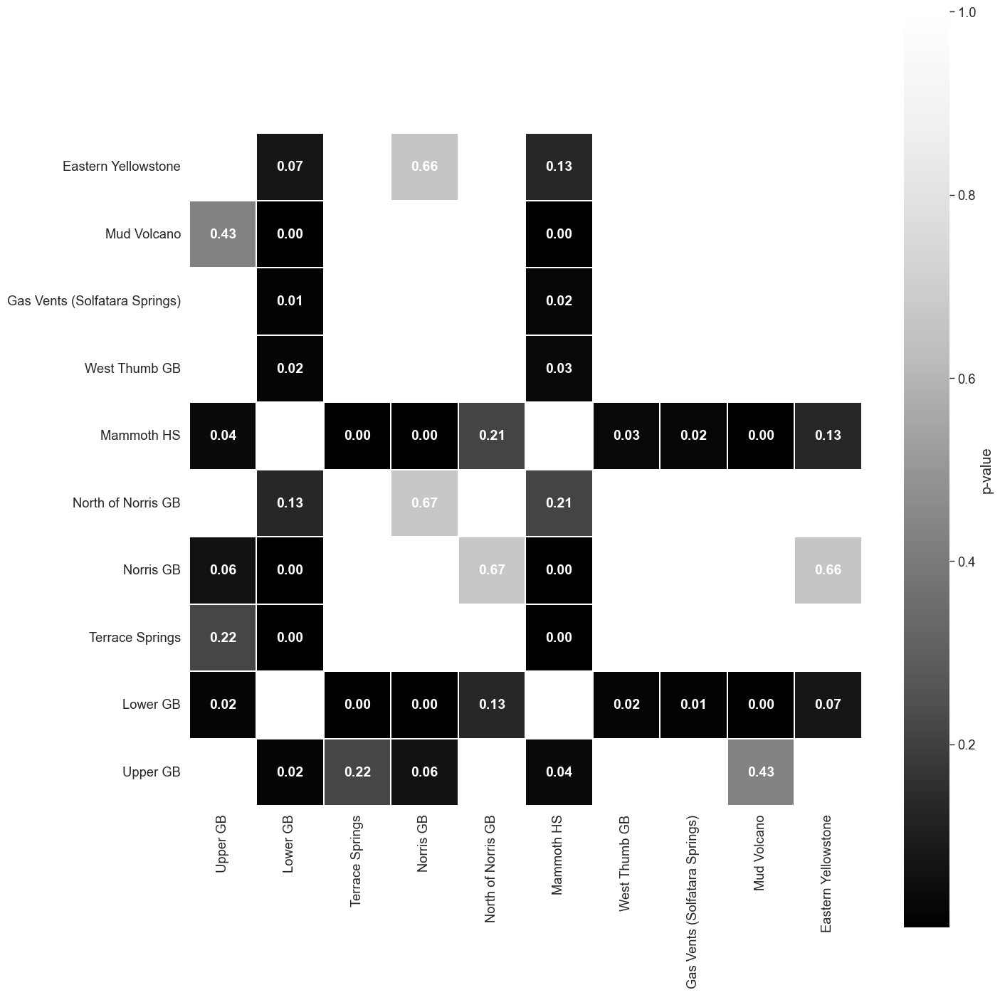

In [143]:
# Create heatmap
plt.figure(figsize=(15,15))
ax = sns.heatmap(pval_conover_CH4, linewidths=0.35, cmap="Greys_r",
                 square=True, fmt=".2f",
                 annot=True, annot_kws={"color":"white", "weight":"bold"},
                 cbar_kws={"label":"p-value"})
ax.invert_yaxis()
sns.set(font_scale=1.75)
plt.tight_layout()
save_fig(plt, "../../figures/CH4_flx_CI_tst.png")

<Figure size 1200x1200 with 0 Axes>

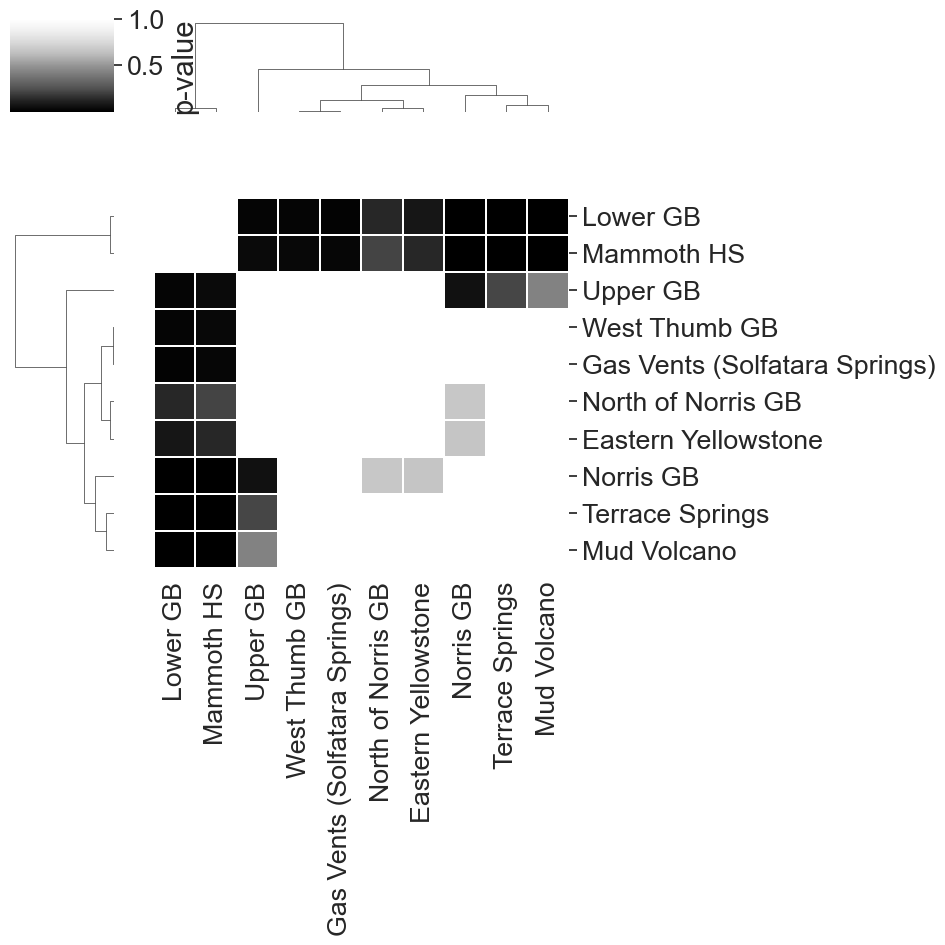

In [144]:
# Create clustermap
plt.figure(figsize=(12,12))
ax = sns.clustermap(pval_conover_CH4, col_cluster=True, cmap="Greys_r",
                    cbar_kws={"label":"p-value"}, linewidths=0.35, fmt=".2f",
                    annot=False, annot_kws={"color":"white", "weight":"bold"})
plt.tight_layout()
save_fig(plt, "../../figures/CH4_flx_CI_tst_clustermap.png")

After applying the Conover-Imam test for signifance ($\alpha = 0.05$) between the median fluxes at each sit, the results show that the CH<sub>4</sub> fluxes at Mud Volcano is signficantly different than one of the other two remianing acid-sulphate regions (Gas Vents; $p$ ≤ 0.01). The other acid sulphate region, Eastern Yellowstone was not significantly different than Mud Volcano ($p$ = 0.06) but it must be stated there are many arguments that diminish the importance of the precisce cutoff of $p$ = 0.05 (add citations).

Between the two travertine settings, Mammoth Hot Springs and Terrace Springs, there was a signifact difference between the CH<sub>4</sub> fluxes.

Among the neutral-chloride locations, none of the sites within the category were significantly different.

CH<sub>4</sub>  - VCNP

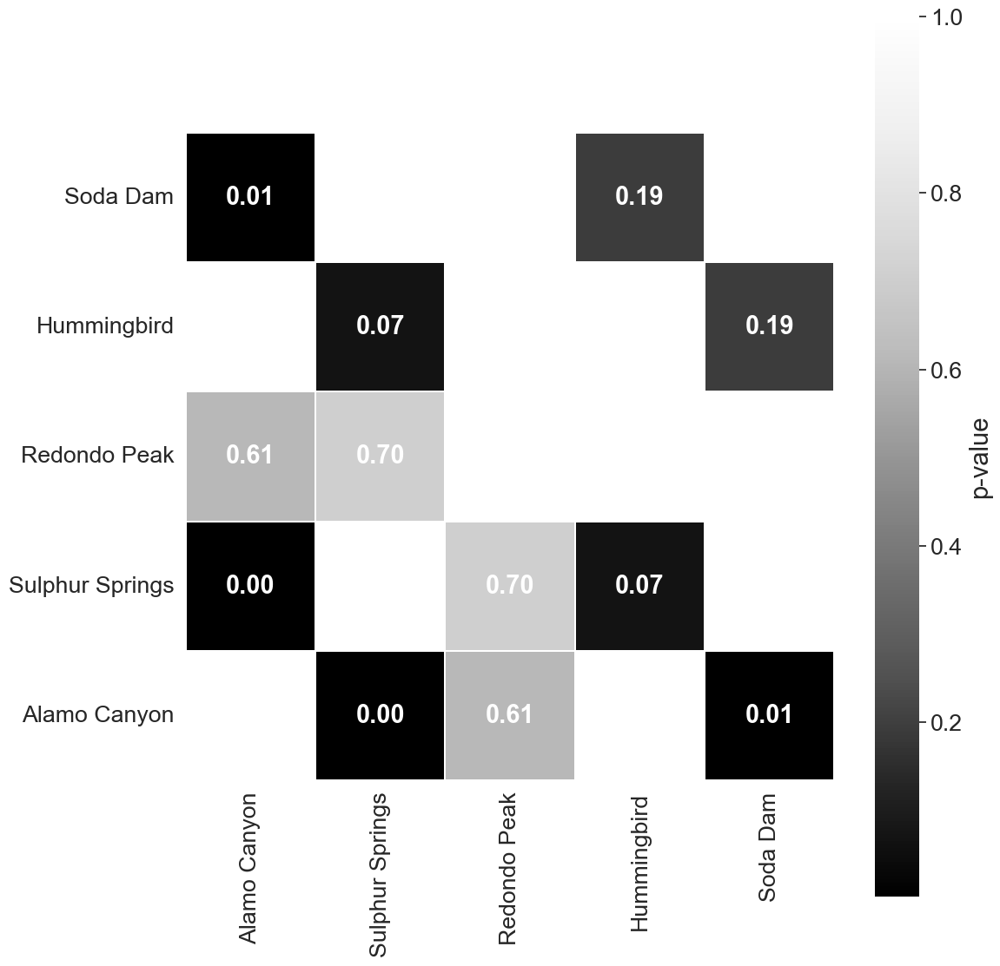

In [145]:
# Create heatmap
plt.figure(figsize=(12,12))
ax = sns.heatmap(pval_conover_CH4_VC, linewidths=0.35, cmap="Greys_r",
                 square=True, fmt=".2f",
                 annot=True, annot_kws={"color":"white", "weight":"bold"},
                 cbar_kws={"label":"p-value"})
ax.invert_yaxis()
sns.set(font_scale=1.75)
plt.tight_layout()
save_fig(plt, "../../figures/CH4_flx_CI_tst_VCNP.png")

<Figure size 1200x1200 with 0 Axes>

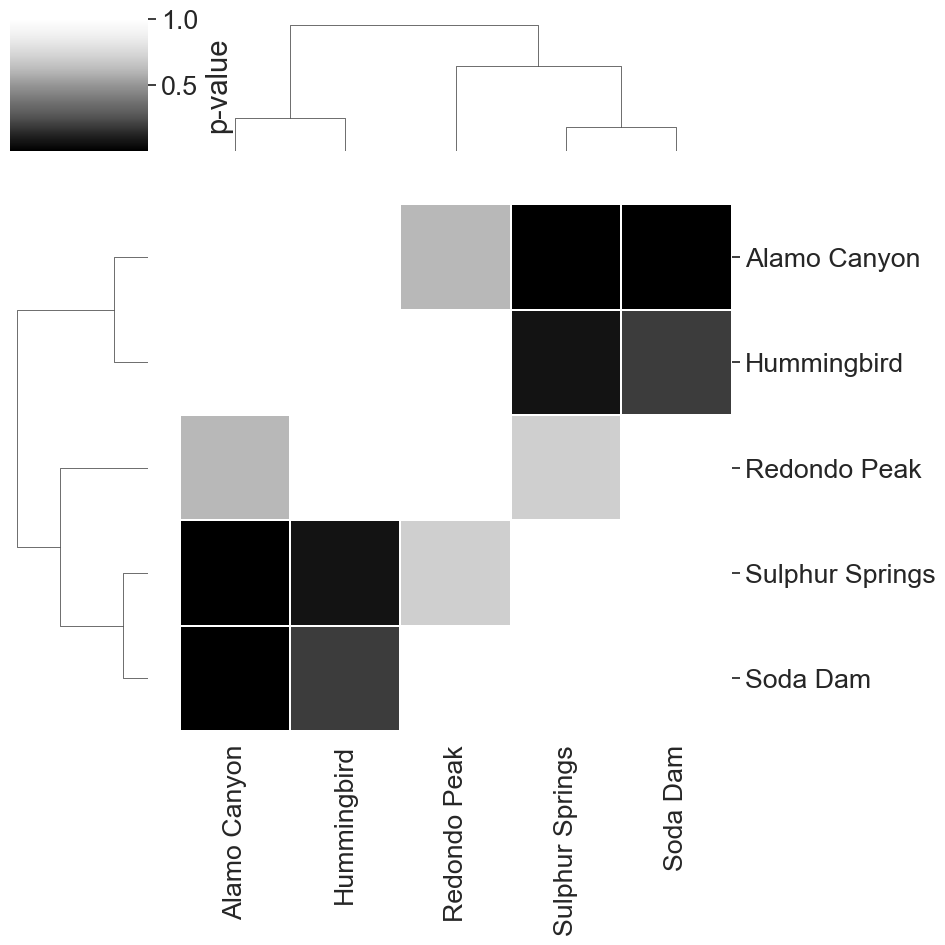

In [146]:
# Create clustermap
plt.figure(figsize=(12,12))
ax = sns.clustermap(pval_conover_CH4_VC, col_cluster=True, cmap="Greys_r",
                    cbar_kws={"label":"p-value"}, linewidths=0.35, fmt=".2f",
                    annot=False, annot_kws={"color":"white", "weight":"bold"})
plt.tight_layout()
save_fig(plt, "../../figures/CH4_flx_CI_tst_clustermap_VCNP.png")

#### Significance Heatmap for CO<sub>2</sub> Fluxes

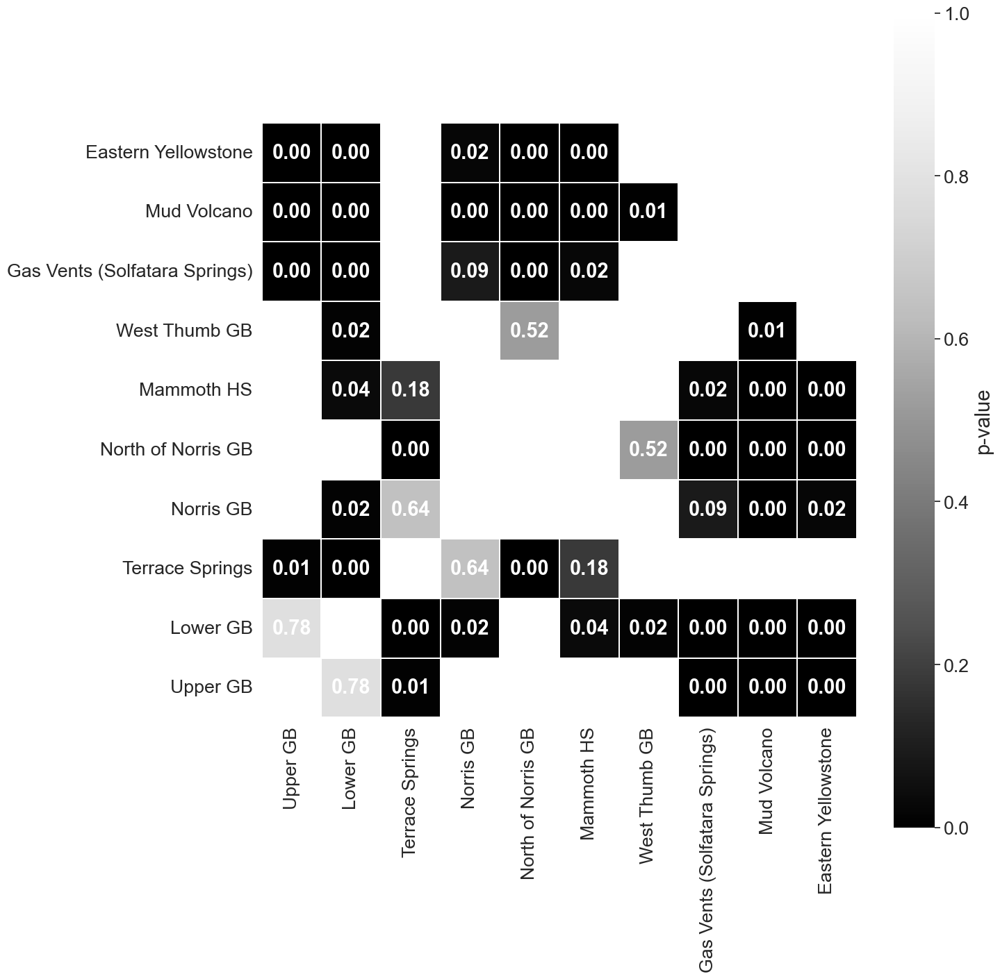

In [147]:
## CO2
# Create heatmap
plt.figure(figsize=(15,15))
ax = sns.heatmap(pval_conover_CO2, linewidths=0.35, cmap="Greys_r",
                 square=True, fmt=".2f",
                 annot=True, annot_kws={"color":"white", "weight":"bold"},
                 cbar_kws={"label":"p-value"})
ax.invert_yaxis()
sns.set(font_scale=1.75)
plt.tight_layout()
save_fig(plt, "../../figures/CO2_flx_CI_tst.png")

Figure ##: Heatmap that presents the results of a Conover-Imam test to examine the differences in CO<sub>2</sub> fluxes across the Yellowstone caldera. Dark colors indicate significance, where light colors show a lack of significance. Values within the squares reprsent the corresponding $p$-values. Values with "0.00" represent $p < 0.005$.

<Figure size 1200x1200 with 0 Axes>

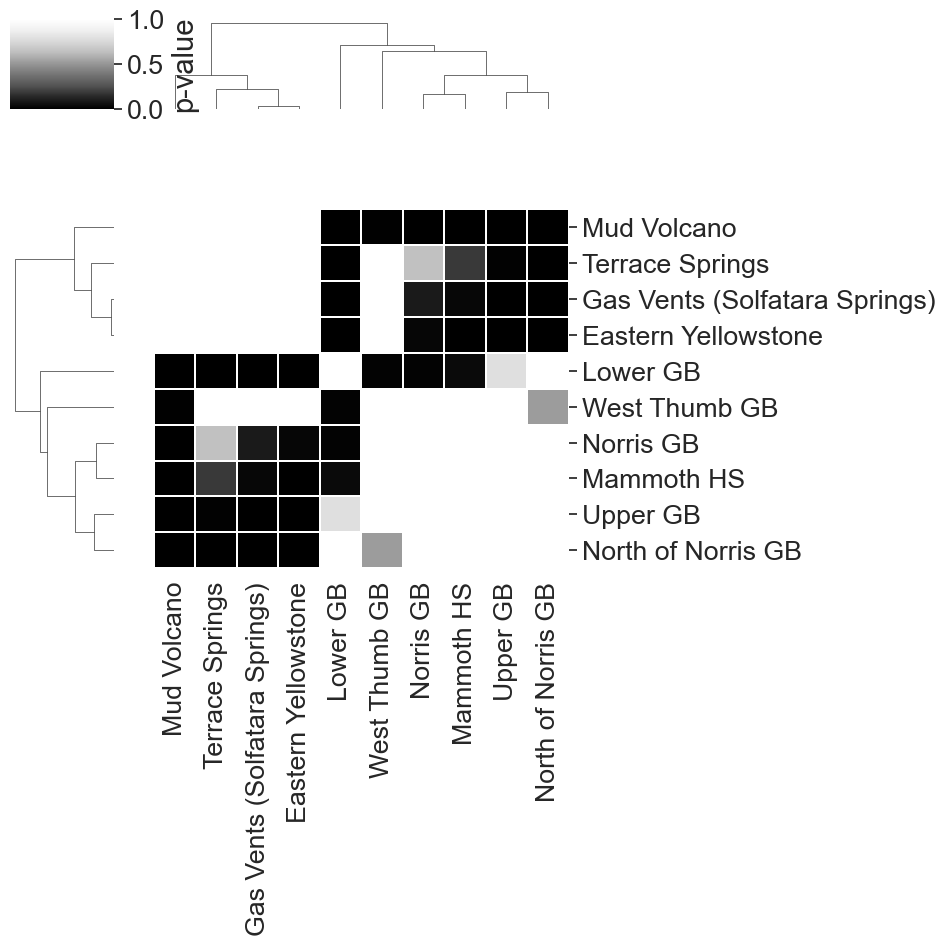

In [148]:
# Create clustermap
plt.figure(figsize=(12,12))
ax = sns.clustermap(pval_conover_CO2, col_cluster=True, cmap="Greys_r",
                    cbar_kws={"label":"p-value"}, linewidths=0.35, fmt=".2f",
                    annot=False, annot_kws={"color":"white", "weight":"bold"})
plt.tight_layout()
save_fig(plt, "../../figures/CO2_flx_CI_tst_clustermap.png")

CO<sub>2</sub> - VCNP

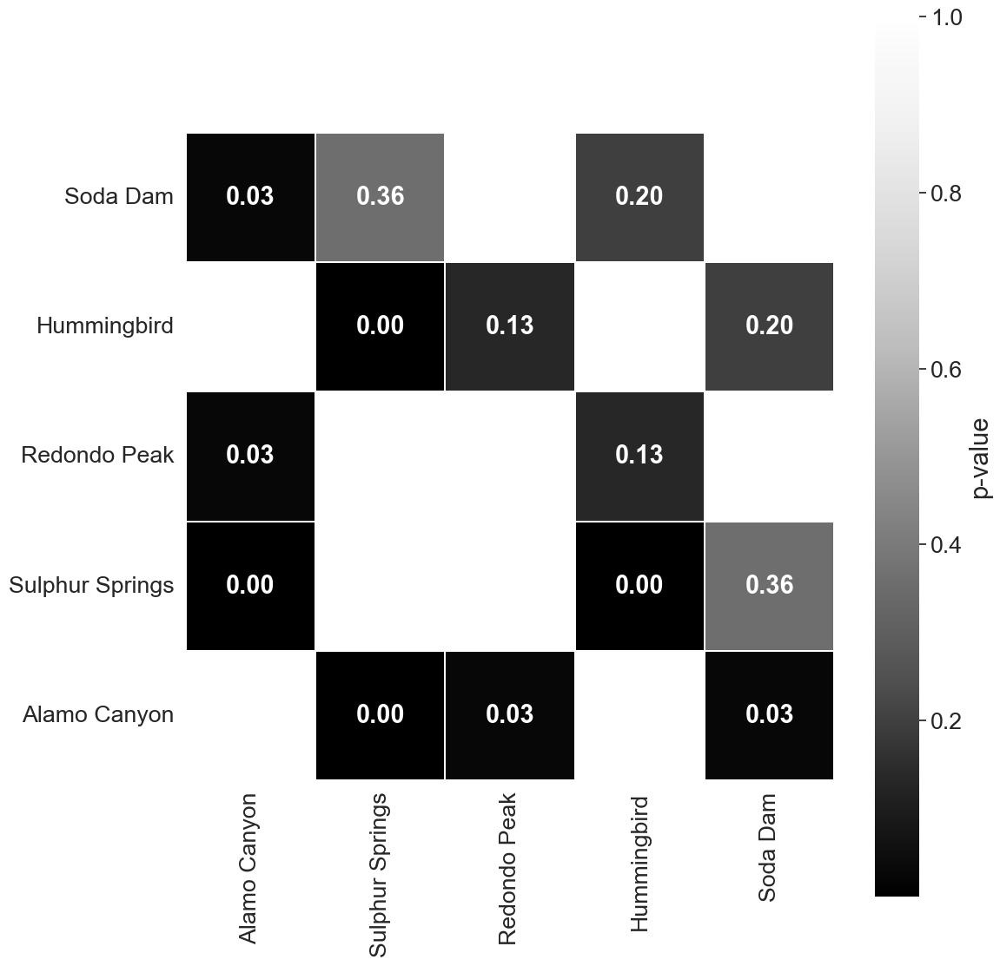

In [149]:
## CO2
# Create heatmap
plt.figure(figsize=(12,12))
ax = sns.heatmap(pval_conover_CO2_VC, linewidths=0.35, cmap="Greys_r",
                 square=True, fmt=".2f",
                 annot=True, annot_kws={"color":"white", "weight":"bold"},
                 cbar_kws={"label":"p-value"})
ax.invert_yaxis()
sns.set(font_scale=1.75)
plt.tight_layout()
save_fig(plt, "../../figures/CO2_flx_CI_tst_VCNP.png")

<Figure size 1200x1200 with 0 Axes>

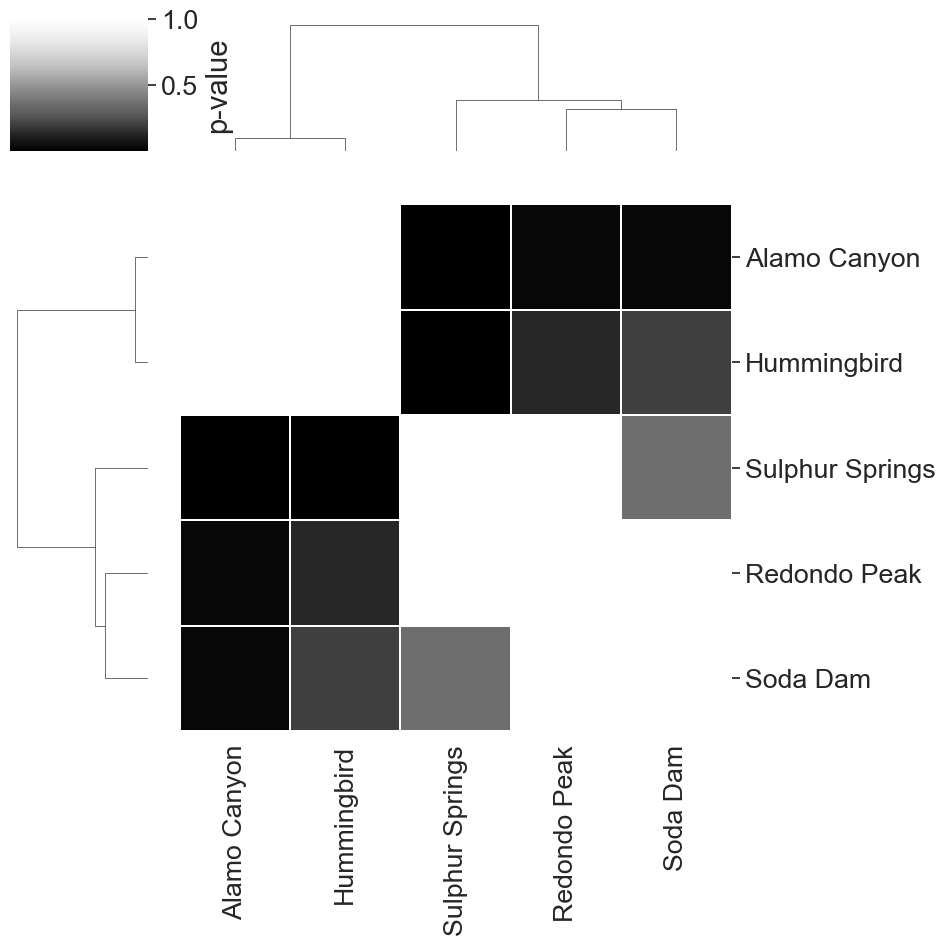

In [150]:
# Create clustermap
plt.figure(figsize=(12,12))
ax = sns.clustermap(pval_conover_CO2_VC, col_cluster=True, cmap="Greys_r",
                    cbar_kws={"label":"p-value"}, linewidths=0.35, fmt=".2f",
                    annot=False, annot_kws={"color":"white", "weight":"bold"})
plt.tight_layout()
save_fig(plt, "../../figures/CO2_flx_CI_tst_clustermap_VCNP.png")

### Comparing CO2 Fluxes to Previous Resarch

Werner and Brantley (2003) documented several scores of CO2 surface flux measurements that took place in YC. Through their work, the authors document several dozen CO2 flux measurements across the Yellostone region. Thus, the authors of this study compared the CO2 fluxes collected to those reported by Werner and Brantley (2003).

#### Werner & Brantley (2003)

Ridge plots with Werner and Brantley (2003) data

In [151]:
# Combine Ajayi & Ayers data with Werner & Brantley (2003)

# gather Ajayi & Ayers data
df_all_log_wb_2003_combo = (
    df_all_log[["Group", "CO2_Flux"]]
    .pipe(clean_names)
    .rename(columns={"co2_flux":"co2_flux_aa"})
)
# add new categorical column to denote "Ajayi & Ayers" (aa)
aa = pd.Series(
    index=df_all_log_wb_2003_combo.index
)
aa = aa.fillna("aa").astype("category")
df_all_log_wb_2003_combo.insert(2, "study", aa)
df_all_log_wb_2003_combo = df_all_log_wb_2003_combo[df_all_log_wb_2003_combo["co2_flux_aa"] > 0]

# gather Werner and Branley data as new data frame with only pertinent columns
df_wb_2003_ = (
    df_wb_2003[["group", "co2_flux_log"]]
    .rename(columns={"co2_flux_log":"co2_flux_wb"})
)
# add new categorical column to denote "Werner & Brantley" (wb)
wb = pd.Series(
    index=df_wb_2003.index
)
wb = wb.fillna("wb").astype("category")
df_wb_2003_.insert(2, "study", wb)
df_wb_2003_ = df_wb_2003_[df_wb_2003_["co2_flux_wb"] > 0]

# join Werner and Brantley data
df_all_log_wb_2003_combo = df_all_log_wb_2003_combo.append(
    df_wb_2003_
)

NameError: name 'df_all_log' is not defined

In [152]:
df_all_log_wb_2003_combo.tail()

NameError: name 'df_all_log_wb_2003_combo' is not defined

In [153]:
df_all_log_wb_2003_combo["group"] = (
    df_all_log_wb_2003_combo["group"]
    .astype("category")
    .cat
    .reorder_categories(
        ordered_groups_w_lamar,
        ordered=True,
        inplace=False
    )
)

df_all_log_wb_2003_combo

NameError: name 'df_all_log_wb_2003_combo' is not defined

In [154]:
plt.figure(facecolor="white")
joyplot(
    data=df_all_log_wb_2003_combo,
    by=["group"],
    alpha=0.8,
    column=["co2_flux_aa", "co2_flux_wb"],
    # color=['#EC06F3', '#06F364'],
    color=[
           CO2_color1, '#06F364',  # Upper GB
           CO2_color1,             # Lower GB
           CO2_color1,             # Terrace Springs
           CO2_color1,             # Norris GB
           CO2_color1, '#06F364',  # North of Norris GB
           '#06F364',              # Lamar Valley
           CO2_color1, '#06F364',  # Mammoth HS
           CO2_color1,             # West Thumb
           CO2_color1,             # Gas Vents
           CO2_color1,             # Mud Volcano
           CO2_color1, '#06F364',  # E Yelloswtone
           CO2_color2,             # Alamo Canyon
           CO2_color2,             # Sulphur Springs
           CO2_color2,             # Redondo Peak
           CO2_color2,             # Hummingbird
           CO2_color2              # Soda Dam
          ],
    legend=True,
    figsize=(12,10)
)
plt.legend(["Ajayi & Ayers", "Werner & Brantley (2003)"])
plt.tight_layout()
save_fig(plt, "../../figures/co2_fluxes_all_and_wb2003.png")
plt.show()


NameError: name 'df_all_log_wb_2003_combo' is not defined

<Figure size 640x480 with 0 Axes>

> Ridgeline plot figure: Ridgeline plot of CO<sub>2</sub> fluxes at both calderas. The groups and caldera designations follow the description in (Figure 1). However, in this plot data (green) collected by Werner and Brantley (2003) has been overlain the data from this study (magenta). Only fluxes greater than zero are shown, sites where a ridgeplot is absent indicates all measurements were below zero. One exception is that this study did not make any measurements in Lamar Valley and therefore only Werrner and Brantley show measurements. Note: the scale of the x-axis for this plot is logged.

Comparing the data collected by Werner and Brantley to the data collected in this study shows differences from the west and more similarity as the locations move to the east. Specifically, the measurements in the upper geyser basin are about an order of magnitiude lower in this study than those presented in Werner and Brantley (2003). Similarly, the North of Norris location showed differences between median values that were approximatley one order of magnitude lower in this study than what was reported by Werner and Brantley.

However, at MMTH, the range of values in the distribution of measurements in this study overlapped almost in its entireity with measurements that documented by Werner and Brantley. The difference here is rather the shape of the distributions. The distrubution of CO2 fluxes in this study at MMTH is very wide crossing valkues that spread across two orders of magnitiude with no discernable peak. Werner and Brantley recorded values that provided a small peak near 10E02 g CO<sub>2</sub> day<sup>-1</sup>. Their distribution was slightly skewed to the left.

At MDVC, the measurements across both s

In [155]:
geothermal_areas_raw.head()

,area,poly_id,thermal_ne,thermal,category,location,group,chemistry,old_cat,therm_area,origin_che,origin_cat,surveyor,survey_met,source,unnamed_15
0,35704.08,1,46,246,1,Solfatara Plateau,NaN,Acidic,2,"""Devil's Inkstand Thermal Area""",NaN,0,NaN,DOQQ,"Spatial Analysis Center, Yellow",NaN
1,16016.59,2,48,258,1,Mirror Plateau,NaN,Acidic,2,Rainbow Springs,NaN,0,NaN,DOQQ,"Spatial Analysis Center, Yellowstone National ...",NaN
2,28087.95,3,49,259,1,Mirror Plateau,NaN,Acidic,2,Rainbow Springs,NaN,0,NaN,DOQQ,"Spatial Analysis Center, Yellowstone National ...",NaN
3,11078.92,4,55,249,1,Solfatara Plateau,NaN,Acidic,2,"""Sulphur Creek Thermal Area""",NaN,0,NaN,DOQQ,"Spatial Analysis Center, Yellowstone National ...",NaN
4,8317.95,5,97,173,1,Mirror Plateau,NaN,Acidic,2,NaN,NaN,0,NaN,DOQQ,"Spatial Analysis Center, Yellowstone National ...",NaN


#### Lewicki et al. (2017)

In [156]:
lewicki_co2_fluxes_df.head()

,date,easting,northing,co2_flux,lat,lon,group
0,2016-10-05,523283,4953623,55.7,44.735612,-110.705937,Norris GB
1,2016-10-05,523274,4953635,0.5,44.735720,-110.706050,Norris GB
2,2016-10-05,523313,4953609,7.1,44.735485,-110.705559,Norris GB
3,2016-10-05,523304,4953621,67.6,44.735593,-110.705672,Norris GB
4,2016-10-05,523295,4953632,385.3,44.735693,-110.705785,Norris GB


In [157]:
lewicki_co2_fluxes_prep = lewicki_co2_fluxes_df[["group", "co2_flux"]]
lewicki_co2_fluxes_prep["co2_flux"] = np.log10(lewicki_co2_fluxes_df.co2_flux)
lewicki_co2_fluxes_prep["co2_flux_aa"] = np.nan
lewicki_co2_fluxes_prep["co2_flux_wb"] = np.nan
lewicki_co2_fluxes_prep["study"] = "lw"

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3926767090.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lewicki_co2_fluxes_prep["co2_flux"] = np.log10(lewicki_co2_fluxes_df.co2_flux)
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3926767090.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lewicki_co2_fluxes_prep["co2_flux_aa"] = np.nan
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3926767090.py:4: SettingWithCopyWarning: 
A value is trying to be s

In [158]:
df_all_log_wb_2003_lw_2017_combo = (
    pd
    .concat([df_all_log_wb_2003_combo, lewicki_co2_fluxes_prep])
    .rename(
        columns={
            "co2_flux":"co2_flux_lw"
      }
    )
)
df_all_log_wb_2003_lw_2017_combo.tail()

NameError: name 'df_all_log_wb_2003_combo' is not defined

In [159]:
df_all_log_wb_2003_lw_2017_combo["group"] = (
    df_all_log_wb_2003_lw_2017_combo["group"]
    .astype("category")
    .cat
    .reorder_categories(
        ordered_groups_w_lamar,
        ordered=True,
        inplace=False
    )
)

df_all_log_wb_2003_lw_2017_combo

NameError: name 'df_all_log_wb_2003_lw_2017_combo' is not defined

In [160]:
plt.figure(facecolor="white")
# fig, ax = plt.subplots(figsize=(12,10), facecolor="white")
joyplot(
    data=df_all_log_wb_2003_lw_2017_combo,
    by=["group"],
    alpha=0.8,
    column=["co2_flux_aa", "co2_flux_wb", "co2_flux_lw"],
    color=[CO2_color1, "#06F364", "#163f82"],
    legend=False,
    figsize=(12,10)
)
# ax.legend(
#     handles=[
#         "Ajayi & Ayers",
#         "Werner & Brantley (2003)",
#         "Lewicki et al. 2017"
#     ]
# )
# plt.tight_layout()
plt.xlabel("log$_{10}$(CO$_{2}$) Fluxes (g m$^{-2}$ day$^{-1}$)")
plt.show()
save_fig(fig, "../../figures/co2_fluxes_all_and_wb2003_and_lw2017.png")


NameError: name 'df_all_log_wb_2003_lw_2017_combo' is not defined

<Figure size 640x480 with 0 Axes>

#### Comparing fluxes across the three studies

In [161]:
# werner and brantley (2003)
df_wb_2003["Soil_Classification"] = ""
for i, _group in enumerate(df_wb_2003["group"]):
  if (_group.lower() == "north of norris gb") or (_group.lower() == "lamar valley") or  (_group.lower() == "mud volcano"):
    df_wb_2003.loc[i, "Soil_Classification"] = "Acid-Sulphate"
  # elif _group.lower() == "lamar valley":
  #   df_wb_2003.loc[i, "Soil_Classification"] = "Unclassified"
  elif  (_group.lower() == "upper gb"):
    df_wb_2003.loc[i, "Soil_Classification"] = "Neutral-Chloride"
  elif _group.lower() == "mammoth hs":
    df_wb_2003.loc[i, "Soil_Classification"] = "Travertine"
  else:
    df_wb_2003.loc[i, "Soil_Classification"] = "Unclassified"

df_wb_2003

,wb_site_name,region,group,co2_flux,co2_flux_log,Soil_Classification
0,Grizzly,MDVC,Mud Volcano,30.532178,1.484758,Acid-Sulphate
1,Grizzly,MDVC,Mud Volcano,46.567754,1.668085,Acid-Sulphate
2,Grizzly,MDVC,Mud Volcano,18.433268,1.265602,Acid-Sulphate
3,Grizzly,MDVC,Mud Volcano,79.085827,1.898099,Acid-Sulphate
4,Grizzly,MDVC,Mud Volcano,45.383512,1.656898,Acid-Sulphate
...,...,...,...,...,...,...
794,Upper Geyser Basin,UGBN,Upper GB,4.200000,0.623249,Neutral-Chloride
795,Upper Geyser Basin,UGBN,Upper GB,10.000000,1.000000,Neutral-Chloride
796,Upper Geyser Basin,UGBN,Upper GB,53.000000,1.724276,Neutral-Chloride
797,Upper Geyser Basin,UGBN,Upper GB,45.000000,1.653213,Neutral-Chloride


In [162]:
df_wb_2003["soil_classification"] = "Neutral-Chloride"
df_wb_2003_comp = (
    df_wb_2003[["Soil_Classification", "group", "co2_flux"]]
    .rename(
        columns={
            "Soil_Classification":"soil_classification"
        }
    )
)
df_wb_2003_comp["author"] = "wb"

df_wb_2003_comp

,soil_classification,group,co2_flux,author
0,Acid-Sulphate,Mud Volcano,30.532178,wb
1,Acid-Sulphate,Mud Volcano,46.567754,wb
2,Acid-Sulphate,Mud Volcano,18.433268,wb
3,Acid-Sulphate,Mud Volcano,79.085827,wb
4,Acid-Sulphate,Mud Volcano,45.383512,wb
...,...,...,...,...
794,Neutral-Chloride,Upper GB,4.200000,wb
795,Neutral-Chloride,Upper GB,10.000000,wb
796,Neutral-Chloride,Upper GB,53.000000,wb
797,Neutral-Chloride,Upper GB,45.000000,wb


In [163]:
# lewicki et al. (2017)
lewicki_co2_fluxes_df["soil_classification"] = "Neutral-Chloride"
lewicki_co2_fluxes_comp = (
    lewicki_co2_fluxes_df[["soil_classification", "group", "co2_flux"]]
)
lewicki_co2_fluxes_comp["author"] = "lw"

lewicki_co2_fluxes_comp

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2633741152.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lewicki_co2_fluxes_comp["author"] = "lw"


,soil_classification,group,co2_flux,author
0,Neutral-Chloride,Norris GB,55.7,lw
1,Neutral-Chloride,Norris GB,0.5,lw
2,Neutral-Chloride,Norris GB,7.1,lw
3,Neutral-Chloride,Norris GB,67.6,lw
4,Neutral-Chloride,Norris GB,385.3,lw
...,...,...,...,...
169,Neutral-Chloride,Norris GB,125.7,lw
170,Neutral-Chloride,Norris GB,435.1,lw
171,Neutral-Chloride,Norris GB,4.7,lw
172,Neutral-Chloride,Norris GB,3.6,lw


In [164]:
# this study
df_YC_comp = (
    df_YC_flx_pos_only[["Soil_Classification", "Group", "CO2_Flux"]]
    .rename(
        columns = {
            "Soil_Classification":"soil_classification",
            "Group":"group",
            "CO2_Flux":"co2_flux"
        }
    )
)

df_YC_comp["author"] = "aa"

df_YC_comp

,soil_classification,group,co2_flux,author
0,Neutral-Chloride,North of Norris GB,3.311482,aa
1,Neutral-Chloride,North of Norris GB,10.907859,aa
2,Neutral-Chloride,North of Norris GB,5.099305,aa
3,Neutral-Chloride,North of Norris GB,6.397972,aa
4,Neutral-Chloride,North of Norris GB,7.035525,aa
...,...,...,...,...
148,Neutral-Chloride,Upper GB,1.036601,aa
149,Neutral-Chloride,Upper GB,0.328867,aa
150,Neutral-Chloride,Upper GB,0.956814,aa
151,Neutral-Chloride,Upper GB,0.546683,aa


In [165]:
# merging all three

df_co2_flux_comp_all = pd.concat(
    [df_YC_comp, df_wb_2003_comp, lewicki_co2_fluxes_comp]
)

df_co2_flux_comp_all

,soil_classification,group,co2_flux,author
0,Neutral-Chloride,North of Norris GB,3.311482,aa
1,Neutral-Chloride,North of Norris GB,10.907859,aa
2,Neutral-Chloride,North of Norris GB,5.099305,aa
3,Neutral-Chloride,North of Norris GB,6.397972,aa
4,Neutral-Chloride,North of Norris GB,7.035525,aa
...,...,...,...,...
169,Neutral-Chloride,Norris GB,125.700000,lw
170,Neutral-Chloride,Norris GB,435.100000,lw
171,Neutral-Chloride,Norris GB,4.700000,lw
172,Neutral-Chloride,Norris GB,3.600000,lw


In [166]:
# median fluxes -- group by authors
df_co2_flux_comp_all.groupby(by=["author"]).agg(np.median)

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2748112425.py:2: FutureWarning: The provided callable <function median at 0x107bdfc40> is currently using DataFrameGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  df_co2_flux_comp_all.groupby(by=["author"]).agg(np.median)


TypeError: agg function failed [how->median,dtype->object]

In [167]:
# maximum flux -- group by authors
df_co2_flux_comp_all.groupby(by=["author"]).agg(np.max)

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3273078791.py:2: FutureWarning: The provided callable <function max at 0x107ad2f20> is currently using DataFrameGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df_co2_flux_comp_all.groupby(by=["author"]).agg(np.max)


,soil_classification,group,co2_flux
author,,,
aa,Unclassified,West Thumb GB,1359.476153
lw,Neutral-Chloride,Norris GB,4606.000000
wb,Travertine,Upper GB,42819.000000


In [168]:
# number of samples -- group by authors
df_co2_flux_comp_all.groupby(by=["author"]).size()

author
aa    150
lw    174
wb    799
dtype: int64

In [169]:
# iqr -- group by authors
df_co2_flux_comp_all.groupby(by=["author"]).describe()

co2_flux                                                           \
          count        mean          std       min        25%        50%   
author                                                                     
aa        150.0   74.598463   155.315166 -0.797098   2.011905  14.316485   
lw        174.0  252.071264   570.742011  0.500000  11.000000  57.500000   
wb        799.0  675.525538  3045.919920  0.000000  31.625064  74.044738   

                                  
               75%           max  
author                            
aa       77.473570   1359.476153  
lw      238.925000   4606.000000  
wb      237.742145  42819.000000

In [170]:
# median fluxes -- group by soil classification
df_co2_flux_comp_all.groupby(by=["author", "soil_classification"]).agg(np.median)

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1484393208.py:2: FutureWarning: The provided callable <function median at 0x107bdfc40> is currently using DataFrameGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  df_co2_flux_comp_all.groupby(by=["author", "soil_classification"]).agg(np.median)


TypeError: agg function failed [how->median,dtype->object]

In [171]:
# number of samples -- group by soil classification
df_co2_flux_comp_all.groupby(by=["author", "soil_classification"]).size()

author  soil_classification
aa      Acid-Sulphate           48
        Neutral-Chloride        72
        Travertine              22
        Unclassified             8
lw      Neutral-Chloride       174
wb      Acid-Sulphate          755
        Neutral-Chloride        18
        Travertine              26
dtype: int64

#### Fluxes vs. Soil Chemistry Class


_Werner and Brantley (2003) Mean CO$_{2}$ Fluxes_

The data that is hard coded below is taken directly from Table 2 in Werner and Brantley (2003).

| Parameter      | Unit    | Neutral-Chloride     | Travertine | Acid | Total |
| ---            | ----    | ----                 | ---        | ---  | ----  |
| Thermal Area   | km$^{2}$| 34                   | 2          | 35   | 70    |
|                |         | Based on Arithmetic Average       |      |       |
| Mean Flux | g CO$^{2}$ m$^{-2}$ day$^{-1}$| 27  | 89         | 1250 |       |
| Std. Error| g CO$^{2}$ m$^{-2}$ day$^{-1}$| 5   | 25         | 457  |       |

Quantify the area for the acidic as listed in the geothermal database.

In [172]:
# quantify the area classified as acidic
acidic_df = geothermal_areas_raw.loc[
    (geothermal_areas_raw["chemistry"]=="Acidic") | (geothermal_areas_raw["chemistry"]=="Acidic to Neutral")
  ]
acidic_df.head(3)

,area,poly_id,thermal_ne,thermal,category,location,group,chemistry,old_cat,therm_area,origin_che,origin_cat,surveyor,survey_met,source,unnamed_15
0,35704.08,1,46,246,1,Solfatara Plateau,NaN,Acidic,2,"""Devil's Inkstand Thermal Area""",NaN,0,NaN,DOQQ,"Spatial Analysis Center, Yellow",NaN
1,16016.59,2,48,258,1,Mirror Plateau,NaN,Acidic,2,Rainbow Springs,NaN,0,NaN,DOQQ,"Spatial Analysis Center, Yellowstone National ...",NaN
2,28087.95,3,49,259,1,Mirror Plateau,NaN,Acidic,2,Rainbow Springs,NaN,0,NaN,DOQQ,"Spatial Analysis Center, Yellowstone National ...",NaN


- [Explanation](https://stats.stackexchange.com/questions/523182/standard-error-of-the-mean-of-a-non-normal-distribution) for using std error of mean

- Explanation of the `iqr_emissions_...` calculation

<details>
<summary>Click toggle to see explanation</summary>
Let's break down the code step by step:

df_YC_all[df_YC_all["Soil_Classification"]!="Acid-Sulphate"]["CO2_Flux"]: This part filters rows in the DataFrame df_YC_all where the "Soil_Classification" is not equal to "Acid-Sulphate", and then it selects the "CO2_Flux" column for those rows.

np.percentile(..., [75, 25]): Calculates the 75th and 25th percentiles of the values obtained in step 1, which effectively gives the third quartile (Q3) and the first quartile (Q1).

np.subtract(*...): Subtracts Q1 from Q3. The * operator is used for unpacking the list of percentiles.

The result is multiplied by the sum of the "area" column in acidic_df: acidic_df.area.sum().

The final result is divided by 1E03 to convert the result to kilogram units.

So, in summary, the code is calculating the IQR of "CO2_Flux" for certain rows in df_YC_all and scaling it by the total area in acidic_df.
</details>

In [173]:
med_emissions_co2_acidic = (
    np.median(
        df_YC_all[df_YC_all["Soil_Classification"]=="Acid-Sulphate"]["CO2_Flux"] * acidic_df.area.sum()
      ) / 1E03
)
iqr_emissions_co2_acidic = (
    np.subtract(
        *np.percentile(df_YC_all[df_YC_all["Soil_Classification"]!="Acid-Sulphate"]["CO2_Flux"], [75, 25])
      ) * acidic_df.area.sum()
) / 1E03
sem_emissions_co2_acidic = (
    sem(df_YC_all[df_YC_all["Soil_Classification"]=="Acid-Sulphate"]["CO2_Flux"]) * acidic_df.area.sum()
) / 1E03

med_emissions_ch4_acidic = (
    np.median(
        df_YC_all[df_YC_all["Soil_Classification"]=="Acid-Sulphate"]["CH4_Flux"] * acidic_df.area.sum()
      ) / 1E03
)
iqr_emissions_ch4_acidic = (np.subtract(*np.percentile(df_YC_all[df_YC_all["Soil_Classification"]!="Acid-Sulphate"]["CO2_Flux"], [75, 25])) * acidic_df.area.sum()) / 1E03
sem_emissions_ch4_acidic = (
    sem(df_YC_all[df_YC_all["Soil_Classification"]=="Acid-Sulphate"]["CH4_Flux"]) * acidic_df.area.sum()
) / 1E03


print(
    "There is approximately {:.2e} square meters of Yellowstone that can be considered as an acidic thermal area.\nThat is equivalent to {:.2f} square kilometers.\n\nUsing the median CO2 fluxes from acidic locations at Yellowstone, the estimated emissions over \nacid-sulphate regions {:.2e} ± {:.2e} kt CO2 day-1, and for CH4 {:.2e} ± {:.2e}  CH4 day-1.".format(
        acidic_df.area.sum(),
        acidic_df.area.sum() * 1E-06,
        med_emissions_co2_acidic / 1E06,
        sem_emissions_co2_acidic / 1E06,
        med_emissions_ch4_acidic / 1E06,
        sem_emissions_ch4_acidic / 1E06
    )
)

med_emissions_co2_annual_acidic = med_emissions_co2_acidic * 365
med_emissions_ch4_annual_acidic = med_emissions_ch4_acidic * 365

print(
    "\nOn an annual basis, the emissions from the acid-sulphate areas is {:.2e} kg CO2 yr-1 ({:.1e} kt CO2 yr-1) \nand {:.2e} g CH4 yr-1 ({:.1e} t yr-1)".format(
        med_emissions_co2_annual_acidic,
        med_emissions_co2_annual_acidic / 1E03,
        med_emissions_ch4_annual_acidic,
        med_emissions_ch4_annual_acidic/ 1E06
    )
)

There is approximately 3.59e+07 square meters of Yellowstone that can be considered as an acidic thermal area.
That is equivalent to 35.95 square kilometers.

Using the median CO2 fluxes from acidic locations at Yellowstone, the estimated emissions over 
acid-sulphate regions 4.18e+00 ± 1.18e+00 kt CO2 day-1, and for CH4 4.96e-01 ± 6.50e-01  CH4 day-1.

On an annual basis, the emissions from the acid-sulphate areas is 1.53e+09 kg CO2 yr-1 (1.5e+06 kt CO2 yr-1) 
and 1.81e+08 g CH4 yr-1 (1.8e+02 t yr-1)


In [174]:
# avg_emissions_co2_acidic = (
#     np.mean(
#         df_YC_all[df_YC_all["Soil_Classification"]=="Acid-Sulphate"]["CO2_Flux"] * acidic_df.area.sum()
#       ) / 1E03
# )
# std_err_emissions_co2_acidic = (
#     sem(df_YC_all[df_YC_all["Soil_Classification"]!="Acid-Sulphate"]["CO2_Flux"]) * acidic_df.area.sum()
# ) / 1E03

# print(
#     "In this study, the mean flux for CO2 emissions at Yellowstone is \n{:.2e} ± {:.2e} kg CO2 km-2 day-1".format(avg_emissions_co2_acidic,std_err_emissions_co2_acidic)
# )

In [175]:
# compare to werner and brantley (kg co2 day-1 - multiply mean flux by respective area - values are at top of this section
wb_2003_med_co2_acidic = ( np.median(df_wb_2003[df_wb_2003["Soil_Classification"]=="Acid-Sulphate"]["co2_flux"]) * acidic_df.area.sum() ) / 1E03
wb_2003_3q_co2_acidic, wb_2003_1q_co2_acidic = ( np.percentile(df_wb_2003[df_wb_2003["Soil_Classification"]=="Acid-Sulphate"]["co2_flux"], [75, 25]) * acidic_df.area.sum()) / 1E03
wb_2003_sem_co2_acidic = ( sem(df_wb_2003[df_wb_2003["Soil_Classification"]=="Acid-Sulphate"]["co2_flux"]) * acidic_df.area.sum() ) / 1E03

# quantify the median annual co2 flux from the acidic region - days are converted to year
wb_2003_med_co2_acidic_annual = wb_2003_med_co2_acidic * 365
wb_2003_3q_co2_acidic_annual =  wb_2003_3q_co2_acidic * 365
wb_2003_1q_co2_acidic_annual =  wb_2003_1q_co2_acidic * 365
print(
    "In Werner and Brantley (2003), the median rate of emissions for CO2 emissions at \nYellowstone in acidic thermal areas is {:.2e} ± {:.2e} kt CO2 day-1."
    .format(
        wb_2003_med_co2_acidic / 1E06,
        wb_2003_sem_co2_acidic / 1E06,
        # wb_2003_1q_co2_acidic,
        # wb_2003_3q_co2_acidic,
        # wb_2003_med_co2_acidic_annual,
        # wb_2003_1q_co2_acidic_annual,
        # wb_2003_3q_co2_acidic_annual
    )
)


In Werner and Brantley (2003), the median rate of emissions for CO2 emissions at 
Yellowstone in acidic thermal areas is 2.84e+00 ± 4.09e+00 kt CO2 day-1.


In [176]:
# quantify the area classified as neutral-chloride (non-acidic)
neutral_chloride_df = geothermal_areas_raw.loc[
    (geothermal_areas_raw["chemistry"]=="Neutral High Chloride") | (geothermal_areas_raw["chemistry"]=="Neutral to Basic")
  ]
neutral_chloride_df.head(3)

,area,poly_id,thermal_ne,thermal,category,location,group,chemistry,old_cat,therm_area,origin_che,origin_cat,surveyor,survey_met,source,unnamed_15
29,34970.16,30,227,131,2,Central Plateau,NaN,Neutral High Chloride,1,"""Upper Alum Creek Thermal Area""",NaN,0,NaN,DOQQ,"Spatial Analysis Center, Yellowstone National ...",NaN
30,31176.94,31,229,132,2,Central Plateau,NaN,Neutral High Chloride,1,"""Upper Alum Creek Thermal Area""",NaN,0,NaN,DOQQ,"Spatial Analysis Center, Yellowstone National ...",NaN
47,9244.95,48,322,86,2,Shoshone Lake,NaN,Neutral High Chloride,1,NaN,NaN,0,Kmaas,"DOQQ, Thermal SCA, Historical","Spatial Analysis Center, Yellowstone National ...",NaN


In [177]:
# CO2 flux - neutral-chloride
med_emissions_co2_neutral_cl = (
    np.median(
        df_YC_all[(df_YC_all["Soil_Classification"]!="Acid-Sulphate") & (df_YC_all["Soil_Classification"]!="Unclassified")]["CO2_Flux"] * neutral_chloride_df.area.sum()
      ) / 1E03
)
iqr_emissions_co2_neutral_cl = np.subtract(*np.percentile(df_YC_all[(df_YC_all["Soil_Classification"]!="Acid-Sulphate") & (df_YC_all["Soil_Classification"]!="Unclassified")]["CO2_Flux"], [75, 25]))
sem_emissions_co2_neutral_cl = (
    sem(df_YC_all[df_YC_all["Soil_Classification"]=="Acid-Sulphate"]["CO2_Flux"]) * neutral_chloride_df.area.sum()
) / 1E03

med_emissions_ch4_neutral_cl = (
    np.median(
        df_YC_all[(df_YC_all["Soil_Classification"]!="Acid-Sulphate") & (df_YC_all["Soil_Classification"]!="Unclassified")]["CH4_Flux"] * neutral_chloride_df.area.sum()
      ) / 1E03
)
iqr_emissions_ch4_neutral_cl = np.subtract(*np.percentile(df_YC_all[(df_YC_all["Soil_Classification"]!="Acid-Sulphate") & (df_YC_all["Soil_Classification"]!="Unclassified")]["CH4_Flux"], [75, 25]))
sem_emissions_ch4_neutral_cl = (
    sem(df_YC_all[df_YC_all["Soil_Classification"]=="Acid-Sulphate"]["CH4_Flux"]) * neutral_chloride_df.area.sum()
) / 1E03

# annual
med_emissions_co2_annual_neutral_cl = med_emissions_co2_neutral_cl * 365
med_emissions_ch4_annual_neutral_cl = med_emissions_ch4_neutral_cl * 365

print(
    "There is approximately {:.2e} square meters of Yellowstone that can be considered as an neutral-chloride area.\nThat is equivalent to {:.2f} square kilometers.\n\nUsing the median CO2 fluxes from neutral-chloride locations at Yellowstone, the estimated emissions \nfrom neutral-chloride regions is {:.2e} ± {:.2e} kt CO2 day-1 and for CH4 {:.2e} ± {:.2e} t day-1.".format(
        neutral_chloride_df.area.sum(),
        neutral_chloride_df.area.sum() * 1E-06,
        med_emissions_co2_neutral_cl / 1E06,
        sem_emissions_co2_neutral_cl / 1E06,
        med_emissions_ch4_neutral_cl / 1E06,
        sem_emissions_ch4_neutral_cl / 1E06
    )
)

# do not trust annual
print(
    "\nOn an annual basis, the emissions from the neutral-chloride areas is {:.2e} kg CO2 yr-1 ({:.1e} kt CO2 yr-1) \nand {:.2e} g CH4 yr-1 ({:.1e} t yr-1)".format(
        med_emissions_co2_annual_neutral_cl,
        med_emissions_co2_annual_neutral_cl / 1E03,
        med_emissions_ch4_annual_neutral_cl,
        med_emissions_ch4_annual_neutral_cl/ 1E06
    )
)


There is approximately 2.19e+07 square meters of Yellowstone that can be considered as an neutral-chloride area.
That is equivalent to 21.88 square kilometers.

Using the median CO2 fluxes from neutral-chloride locations at Yellowstone, the estimated emissions 
from neutral-chloride regions is 6.58e-02 ± 7.21e-01 kt CO2 day-1 and for CH4 -1.14e-02 ± 3.96e-01 t day-1.

On an annual basis, the emissions from the neutral-chloride areas is 2.40e+07 kg CO2 yr-1 (2.4e+04 kt CO2 yr-1) 
and -4.17e+06 g CH4 yr-1 (-4.2e+00 t yr-1)


In [178]:
np.median(df_wb_2003[df_wb_2003["Soil_Classification"]=="Acid-Sulphate"].co2_flux)
np.median(df_wb_2003[df_wb_2003["Soil_Classification"]=="Neutral-Chloride"].co2_flux)

print(
    "Werner and Brantley took {:.2f} measurements with a median of {:.2e} g CO2 m-2 day-1 on acid-sulphate soil.\nThere were {:.2f} measurements with a median of {:.2e} g CO2 m-2 day-1 for the neutral-chloride area.\nThere were {:.2f} measurements with a median of {:.2e} g CO2 m-2 day-1 for the travertine area.".format(
        len(df_wb_2003[df_wb_2003["Soil_Classification"]=="Acid-Sulphate"]),
        np.median(df_wb_2003[df_wb_2003["Soil_Classification"]=="Acid-Sulphate"].co2_flux),
        len(df_wb_2003[df_wb_2003["Soil_Classification"]=="Neutral-Chloride"]),
        np.median(df_wb_2003[df_wb_2003["Soil_Classification"]=="Neutral-Chloride"].co2_flux),
        len(df_wb_2003[df_wb_2003["Soil_Classification"]=="Travertine"]),
        np.median(df_wb_2003[df_wb_2003["Soil_Classification"]=="Travertine"].co2_flux),
        # len(df_wb_2003[df_wb_2003["Soil_Classification"]=="Unclassified"]),
        # np.median(df_wb_2003[df_wb_2003["Soil_Classification"]=="Unclassified"].co2_flux)
    )
)

Werner and Brantley took 755.00 measurements with a median of 7.90e+01 g CO2 m-2 day-1 on acid-sulphate soil.
There were 18.00 measurements with a median of 2.58e+01 g CO2 m-2 day-1 for the neutral-chloride area.
There were 26.00 measurements with a median of 5.71e+01 g CO2 m-2 day-1 for the travertine area.


In [179]:
# # compare to werner and brantley (kg co2 day-1 - multiply mean flux by respective area - values are at top of this section
# wb_2003_med_co2_neutral_chloride = ( np.median(df_wb_2003[(df_wb_2003["Soil_Classification"]!="Acid-Sulphate") & (df_wb_2003["Soil_Classification"]!="Unclassified")]["co2_flux"]) * neutral_chloride_df.area.sum() ) / 1E03
# # wb_2003_3q_co2_neutral_chloride, wb_2003_1q_co2_neutral_chloride = ( np.percentile(df_wb_2003[(df_wb_2003["Soil_Classification"]!="Acid-Sulphate") & (df_wb_2003["Soil_Classification"]!="Unclassified")], [75, 25]) * neutral_chloride_df.area.sum()) / 1E03
# wb_2003_sem_co2_neutral_chloride = ( sem(df_wb_2003[(df_wb_2003["Soil_Classification"]!="Acid-Sulphate") & (df_wb_2003["Soil_Classification"]!="Unclassified")]["co2_flux"]) * neutral_chloride_df.area.sum() ) / 1E03

# compare to werner and brantley (kg co2 day-1 - multiply mean flux by respective area - values are at top of this section
wb_2003_med_co2_neutral_chloride = ( np.median(df_wb_2003[df_wb_2003["Soil_Classification"]=="Neutral-Chloride"]["co2_flux"]) * neutral_chloride_df.area.sum() ) / 1E03
# wb_2003_3q_co2_neutral_chloride, wb_2003_1q_co2_neutral_chloride = ( np.percentile(df_wb_2003[(df_wb_2003["Soil_Classification"]!="Neutral-Chloride") & (df_wb_2003["Soil_Classification"]!="Unclassified")], [75, 25]) * neutral_chloride_df.area.sum()) / 1E03
wb_2003_sem_co2_neutral_chloride = ( sem(df_wb_2003[df_wb_2003["Soil_Classification"]=="Neutral-Chloride"]["co2_flux"]) * neutral_chloride_df.area.sum() ) / 1E03

# quantify the median annual co2 flux from the neutral_chloride region - days are converted to year
wb_2003_med_co2_neutral_chloride_annual = wb_2003_med_co2_neutral_chloride * 365
# wb_2003_3q_co2_neutral_chloride_annual =  wb_2003_3q_co2_neutral_chloride * 365
# wb_2003_1q_co2_neutral_chloride_annual =  wb_2003_1q_co2_neutral_chloride * 365
print(
    "In Werner and Brantley (2003), the median rate of emissions for CO2 emissions at \nYellowstone in neutral-chloride thermal areas is {:.2e} ± {:.2e} kt CO2 day-1."
    .format(
        wb_2003_med_co2_neutral_chloride / 1E06,
        wb_2003_sem_co2_neutral_chloride / 1E06,
        # wb_2003_1q_co2_acidic,
        # wb_2003_3q_co2_acidic,
        # wb_2003_med_co2_acidic_annual,
        # wb_2003_1q_co2_acidic_annual,
        # wb_2003_3q_co2_acidic_annual
    )
)

In Werner and Brantley (2003), the median rate of emissions for CO2 emissions at 
Yellowstone in neutral-chloride thermal areas is 5.63e-01 ± 1.28e-01 kt CO2 day-1.


In [180]:
# attempting to use emplacement formula - eqn 1 Werner and Brantley (2003)
Em = 0.013
Ci = 0.12 #/ 100
Fm = 0.075 #/ 100
CsD = 0.25 #/ 100
d = 2900
k = 2.27E09
Mw = 44
convert_g_to_kt = 1E09
days_in_year = 365.25

F = Em * ( (Ci / Fm) - CsD ) * d * k
F_kt = ( F * (Mw / convert_g_to_kt) ) / days_in_year
print("Emission rate (mol yr-1): {:.3e}\nThe Emission rate (kt day-1): {:.3e}".format(F, F_kt))

Emission rate (mol yr-1): 1.155e+11
The Emission rate (kt day-1): 1.392e+01


### EGM Fluxes
In addition to making flux measurements with the CRDS-AC, CO<sub>2</sub> fluxes were measured using an [EGM-5](https://ppsystems.com/egm-5/). The EGM is a portable accumulation chamber (PAC, as named in Ajayi & Ayers, 2021). Instead of measuring CH4 and carbon isotopes, the EGM only measures CO2 and produces a rapid and reliable flux estimate using a linear model, which is similar to what is for the CRDS-AC measurements.

Due to the portability of EGM versus the lack of mobility for the CRDS-AC, EGM measurements were made in full and half reactangular grids surrounding the CRDS-AC measurements. For example, consider a Cartesian coordinate system, where the CRDS-AC measurement at a location was made at the origin. EGM measurements would be made at (-1,0), (-1,1), (0,1), (1,0), (1,1), (1,-1), (0,-1), and (-1,-1). The actual distance between the CRDS-AC and the EGM ranged between 1.2 and 2.6 m. In some cases, all of the above measurements were not possible due to time or a suitable surface (e.g. non-rocky, no standing liquid, large thermal feature), but a subset of measurements was made at most measuring sites beginning with the 2018 campaign in Yellowstone.

In this section of the notebook, the EGM fluxes are compared to the CRDS-AC fluxes. The objective of this exercise is to demonstrate how close the CO<sub>2</sub> fluxes collected by the EGM are to the fluxes estimated by the CRDS-AC. Where the differences are large, one can infer that heterogeneity is high, and conversely, when differences are small, homogenity (at least at the scale of meters) is a likely explanation.

#### Programmatically Import EGM Data

Import Yellowstone EGM data

In [181]:
# Import file into workspace
df_egm_YC = (
    pd.read_csv(
      "../../pertinent-data/egm-data/EGM_CO2FluxesAllData.csv",
      header=0,
      parse_dates=True
  )
)

# add a column `caldera` to organize the data by general location
df_egm_YC["Caldera"] = "YNP"

# arrange groups identically to the crds flux
df_egm_YC = group_egm_data(df_egm_YC)

# Convert fluxes from g CO2 m-2 hr-1 to g CO2 m-2 day-1
df_egm_YC["fCO2"] = df_egm_YC["fCO2"] * 24

# Add Soil Classification
df_egm_YC["Soil_Classification"] = ""
for i in range(len(df_egm_YC)):
  if "NEER" in df_egm_YC.Site.iloc[i]:
    df_egm_YC.Soil_Classification.iloc[i] = "Unclassified"
  elif "EETR" in df_egm_YC.Site.iloc[i]:
    df_egm_YC.Soil_Classification.iloc[i] = "Acid-Sulphate"
  elif "YSLK" in df_egm_YC.Site.iloc[i]:
    df_egm_YC.Soil_Classification.iloc[i] = "Acid-Sulphate"
  elif "Upper" in df_egm_YC.Group.iloc[i]:
    df_egm_YC.Soil_Classification.iloc[i] = "Neutral-Chloride"
  elif "Lower" in df_egm_YC.Group.iloc[i]:
    df_egm_YC.Soil_Classification.iloc[i] = "Neutral-Chloride"
  elif "Norris" in df_egm_YC.Group.iloc[i]:
    df_egm_YC.Soil_Classification.iloc[i] = "Neutral-Chloride"
  elif "Mammoth" in df_egm_YC.Group.iloc[i]:
    df_egm_YC.Soil_Classification.iloc[i] = "Travertine"
  elif "Terrace" in df_egm_YC.Group.iloc[i]:
    df_egm_YC.Soil_Classification.iloc[i] = "Travertine"
  elif "West Thumb" in df_egm_YC.Group.iloc[i]:
    df_egm_YC.Soil_Classification.iloc[i] = "Neutral-Chloride"
  elif "Vent" in df_egm_YC.Group.iloc[i]:
    df_egm_YC.Soil_Classification.iloc[i] = "Acid-Sulphate"
  elif "Volcano" in df_egm_YC.Group.iloc[i]:
    df_egm_YC.Soil_Classification.iloc[i] = "Acid-Sulphate"

# Convert Soil Classification to a categorical object
df_egm_YC["Soil_Classification"] = df_egm_YC.Soil_Classification.astype("category")

# Order the categories apporopriately
df_egm_YC["Soil_Classification"] = (
    df_egm_YC["Soil_Classification"]
    .cat
    .reorder_categories(
        [
         "Acid-Sulphate",
         "Neutral-Chloride",
         "Travertine",
         "Unclassified",
        ],
        ordered=True
    )
)

# log the egm measurements
df_egm_YC["CO2_Flux_log10"] = np.log10(df_egm_YC.fCO2).replace(-np.inf, np.nan)

# Preview dataframe info
df_egm_YC.info()

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1967473998.py:34: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  egm_df["Group"].iloc[i] = "West Thumb GB"
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1967473

TypeError: Categorical.reorder_categories() got an unexpected keyword argument 'inplace'

In [182]:
df_egm_YC[["fCO2", "CO2_Flux_log10", "log10fCO2"]]

KeyError: "['CO2_Flux_log10'] not in index"

Import Valles Caldera EGM data

> Note: The EGM locations at Valles were limited to only Acid-Sulphate regions because the equipment was not available to the reseach group except for the second campaign, where VCAC, VCSS, and VCHB were the only locations measured.

In [183]:
# Import file into workspace
df_egm_VC = pd.read_csv(
    "../../pertinent-data/egm-data/VCNP_EGMCO2Fluxes_AllData.csv",
    header=0,
    parse_dates=True
)

# add a column `caldera` to organize the data by general location
df_egm_VC["Caldera"] = "VCNP"

# arrange groups identically to the crds flux
df_egm_VC = group_egm_data(df_egm_VC, caldera="VCNP")

# Convert fluxes from g CO2 m-2 hr-1 to g CO2 m-2 day-1
df_egm_VC["fCO2"] = df_egm_VC["fCO2"] * 24

# Add Soil Classification
df_egm_VC["Soil_Classification"] = ""
for i in range(len(df_egm_VC)):
  if "VCSS" in df_egm_VC.Site.iloc[i]:
    df_egm_VC.Soil_Classification.iloc[i] = "Acid-Sulphate"
  elif "VCAC" in df_egm_VC.Site.iloc[i]:
    df_egm_VC.Soil_Classification.iloc[i] = "Acid-Sulphate"
  elif "VCHB" in df_egm_VC.Site.iloc[i]:
    df_egm_VC.Soil_Classification.iloc[i] = "Acid-Sulphate"
  # elif "VCSD" in df_egm_VC.Group.iloc[i]:
  #   df_egm_VC.Soil_Classification.iloc[i] = "Travertine"
  # elif "VCRP" in df_egm_VC.Group.iloc[i]:
  #   df_egm_VC.Soil_Classification.iloc[i] = "Unclassified"

# Convert Soil Classification to a categorical object
df_egm_VC["Soil_Classification"] = df_egm_VC.Soil_Classification.astype("category")

# Order the categories apporopriately
df_egm_VC["Soil_Classification"] = (
    df_egm_VC["Soil_Classification"]
    .cat
    .reorder_categories(
        [
         "Acid-Sulphate",
        #  "Travertine",
        #  "Unclassified",
        ],
        ordered=True
    )
)

# log the egm measurements
df_egm_VC["CO2_Flux_log10"] = np.log10(df_egm_VC.fCO2).replace(-np.inf, np.nan)

df_egm_VC.info()

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1967473998.py:84: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  egm_df["Group"].iloc[i] = "Sulphur Springs"
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/19674

TypeError: Categorical.reorder_categories() got an unexpected keyword argument 'inplace'

In [184]:
df_egm_VC[["fCO2", "CO2_Flux_log10", "log10fCO2"]]

KeyError: "['CO2_Flux_log10'] not in index"

#### Distribution Fitting

This section replaces the same section that has been struck out. Here, simple descriptive statistics have been added and visazlied and the assessments for normality have also been conducted as well.


###### Visualize the raw data

Histogram of fluxes as raw observations and log transformed as well.

ValueError: Could not interpret value `CO2_Flux_log10` for `x`. An entry with this name does not appear in `data`.

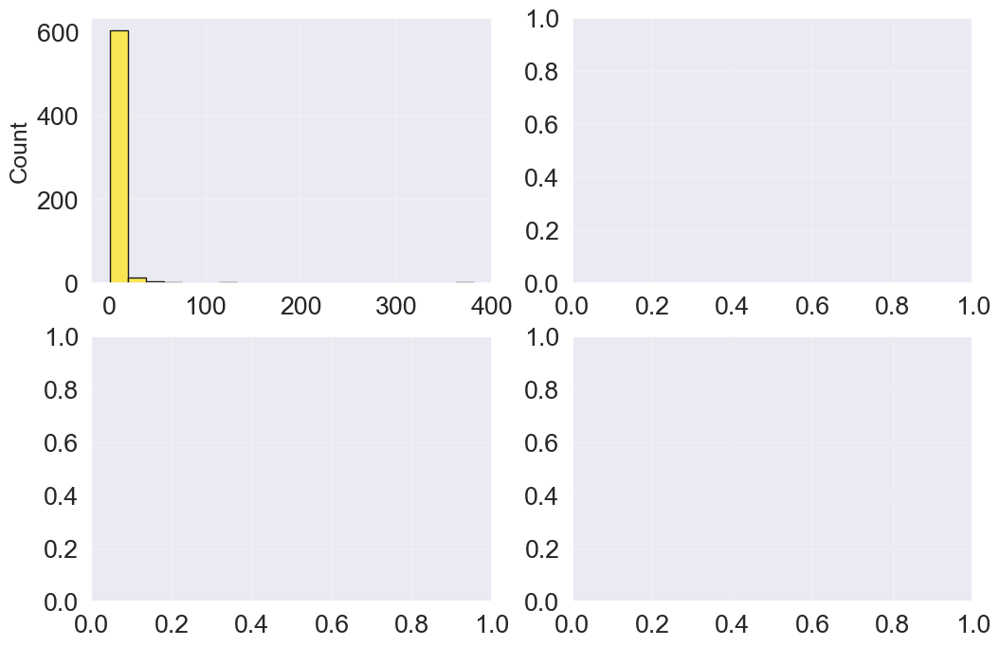

In [185]:
fig, ax = plt.subplots(2,2, figsize=(12,8))

# yellowstone
# raw data
sns.histplot(
    df_egm_YC,
    x="fCO2",
    bins=20,
    color=yc_color,
    edgecolor="k",
    ax=ax[0,0]
)
ax[0,0].yaxis.get_label().set_fontsize(18)
ax[0,0].set(
    xlabel=""
)


# log transformed
sns.histplot(
    df_egm_YC,
    x="CO2_Flux_log10",
    bins=20,
    color=yc_color,
    edgecolor="k",
    ax=ax[0,1]
)
ax[0,1].set(
    ylabel="",
    xlabel=""
)
ax[0,1].legend(["Yellowstone"])

# valles
# raw data
sns.histplot(
    df_egm_VC,
    x="fCO2",
    bins=20,
    color=vc_color,
    edgecolor="k",
    ax=ax[1,0]
)
ax[1,0].set(
    xlabel="log$_{10}$(CO$_{2}$ Flux) (g m$^{-2}$ day$^{-1})$"
)
ax[1,0].xaxis.get_label().set_fontsize(18)
ax[1,0].yaxis.get_label().set_fontsize(18)

# log transformed
sns.histplot(
    df_egm_VC,
    x="CO2_Flux_log10",
    bins=20,
    color=vc_color,
    edgecolor="k",
    ax=ax[1,1]
)
ax[1,1].set(
    ylabel="",
    xlabel="log$_{10}$(CO$_{2}$ Flux) (g m$^{-2}$ day$^{-1})$"
)
ax[1,1].xaxis.get_label().set_fontsize(18)
ax[1,1].legend(["Valles"])

plt.tight_layout()
plt.show()

##### Finding the best distribution

Best distribution to describe fluxes

###### Yellowstone

In [186]:
# Trim data to only include non-NaN values
df_egm_fCO2_pos_only = df_egm_YC[(df_egm_YC["fCO2"] >= 0)]

flx_pos_only_loss = perc_diff(df_egm_fCO2_pos_only.shape[0], df_egm_YC.shape[0])
### Report the percentage of lost fluxes
print("{:.1f}% of fluxes were lost when values less than zero were removed".format(flx_pos_only_loss))

3.9% of fluxes were lost when values less than zero were removed


Only 4% of the EGM fluxes at YC were less than zero, letting us know that dropping negative fluxes and moving forward should not be probhibitive in analyzing the data at the caldera level.

Below, a series of tests are conducted to find the best distribution to describe the data. The _logged transformed_ fluxes are inserted into the function, `assess_fit_params()` to find the best distribution. `assess_fit_params()` works by:
1. Collecting all non-nan data
2. Selecting a theoretical distribution (e.g., "beta", "normal", "t", _etc_.)
3. Obtain necessary parameters using the [maximum likelihood estimator]() technique
4. Apply a Kolmogorov-Smirnov (KS) test with observations against each theoretical distribution
5. The _higher_ the p-value the more likely that the distribution accurately describes the observations

In [187]:
dist_fit_egm_YC_logCO2 = assess_fit_params(df_egm_YC["CO2_Flux_log10"].dropna())
dist_fit_egm_YC_logCO2

KeyError: 'CO2_Flux_log10'

###### Valles

In [188]:
# Trim data to only include non-NaN values
df_egm_fCO2_pos_only = df_egm_VC[(df_egm_VC["fCO2"] >= 0)]

flx_pos_only_loss = perc_diff(df_egm_fCO2_pos_only.shape[0], df_egm_VC.shape[0])
### Report the percentage of lost fluxes
print("{:.1f}% of fluxes were lost when values less than zero were removed".format(flx_pos_only_loss))

50.0% of fluxes were lost when values less than zero were removed


Approximately 50% of the EGM fluxes at VC were less than zero. This a significant number and needs to be considered when intrepreting impact of the analysis in this section.


The best fit for the proper distribution to described the logged CO$_{2}$ fluxes from the EGM is assessed with the function, `assess_fit_params()`.

The functionality is explained above in the corresponding Yellowstone section.

In [189]:
dist_fit_egm_VC_logCO2 = assess_fit_params(df_egm_VC["CO2_Flux_log10"].dropna())
dist_fit_egm_VC_logCO2

KeyError: 'CO2_Flux_log10'

##### QQ Plot

###### Yellowstone

NameError: name 'dist_fit_egm_YC_logCO2' is not defined

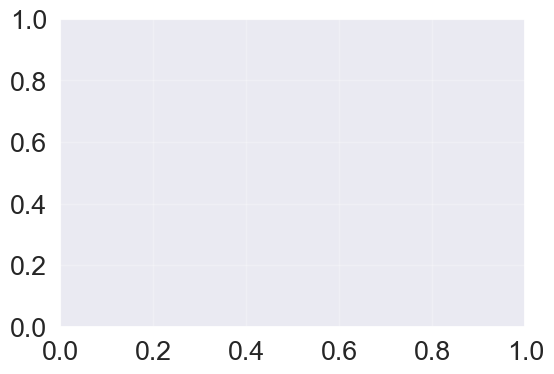

In [190]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

# beta
beta_parms = dist_fit_egm_YC_logCO2.params.iloc[0]
stats.probplot(
    df_egm_YC["CO2_Flux_log10"].dropna(),
    dist=stats.beta,
    sparams=(beta_parms[0],beta_parms[1]),
    plot=plt,
    fit=True
)
# burr12
burr12_parms = dist_fit_egm_YC_logCO2.params.iloc[1]
stats.probplot(
    df_egm_YC["CO2_Flux_log10"].dropna(),
    dist=stats.burr12,
    sparams=(burr12_parms[0],burr12_parms[1]),
    plot=plt,
    fit=True
)
# weibull_min
# wb_min_parms = dist_fit_egm_YC_logCO2.params.iloc[2]
# stats.probplot(
#     df_egm_YC["CO2_Flux_log10"].dropna(),
#     dist=stats.weibull_min,
#     sparams=(wb_min_parms[0],wb_min_parms[1]),
#     plot=plt,
#     fit=True
# )
# # loggamma
# loggamma_params = dist_fit_egm_YC_logCO2.params.iloc[3]
# stats.probplot(
#     df_egm_YC["CO2_Flux_log10"].dropna(),
#     dist=stats.loggamma,
#     sparams=(loggamma_params[0],loggamma_params[1]),
#     plot=plt,
#     fit=True
# )
# normal
norm_params = dist_fit_egm_YC_logCO2.params.iloc[4]
stats.probplot(
    df_egm_YC["CO2_Flux_log10"],
    dist=stats.norm,
    # sparams=(norm_params[0],norm_params[1]),
    plot=plt,
    fit=True
)
# Remove the regression lines
# ax.get_lines()[0].remove()
# ax.get_lines()[1].remove()
# # ax.get_lines()[2].remove()
# # ax.get_lines()[3].remove()
# # ax.get_lines()[4].remove()

# Change colour of scatter
ax.get_lines()[0].set_markerfacecolor("black")
ax.get_lines()[0].set_markeredgecolor("black")
ax.get_lines()[2].set_markerfacecolor("green")
ax.get_lines()[2].set_markeredgecolor("green")
# ax.get_lines()[2].set_markerfacecolor('C2')
# ax.get_lines()[3].set_markerfacecolor('C3')
ax.get_lines()[4].set_markerfacecolor("magenta")
ax.get_lines()[4].set_markeredgecolor("magenta")

# ax.plot([0, 1], [0, 1], c='C5')
plt.legend(
    [ax.get_lines()[0], ax.get_lines()[2], ax.get_lines()[4]],
    ['beta', 'burr', "normal"]
)
plt.show()

The QQ-plot supports the results from the series of KS tests. A normal distribution does **not** best describe the the shape of the logged EGM observations. In the tail, in particular at the lower end, the observations veer from the theoretical normal distribution. Instead, a Beta or even a Burr distribution more closley defines the logged observations.

###### Valles

NameError: name 'dist_fit_egm_VC_logCO2' is not defined

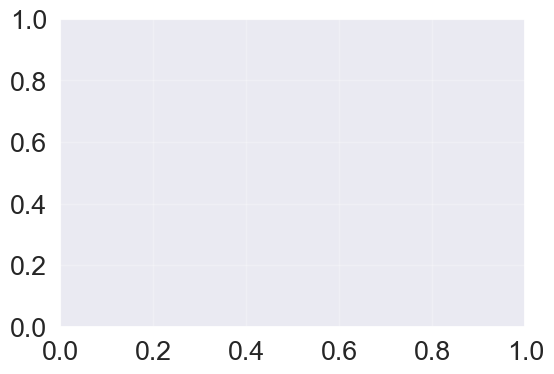

In [191]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

# genlogistic
genlogistic_parms = dist_fit_egm_VC_logCO2.params.iloc[0]
stats.probplot(
    df_egm_VC["CO2_Flux_log10"].dropna(),
    dist=stats.genlogistic,
    sparams=(genlogistic_parms[0],genlogistic_parms[1]),
    plot=plt,
    fit=True
)
# loggamma
loggamma_parms = dist_fit_egm_VC_logCO2.params.iloc[1]
stats.probplot(
    df_egm_VC["CO2_Flux_log10"].dropna(),
    dist=stats.loggamma,
    sparams=(loggamma_parms[0],loggamma_parms[1]),
    plot=plt,
    fit=True
)
# normal
norm_params = dist_fit_egm_VC_logCO2.params.iloc[11]
stats.probplot(
    df_egm_VC["CO2_Flux_log10"],
    dist=stats.norm,
    # sparams=(norm_params[0],norm_params[1]),
    plot=plt,
    fit=True
)

# Change colour of scatter
ax.get_lines()[0].set_markerfacecolor("black")
ax.get_lines()[0].set_markeredgecolor("black")
ax.get_lines()[2].set_markerfacecolor("green")
ax.get_lines()[2].set_markeredgecolor("green")
ax.get_lines()[4].set_markerfacecolor("magenta")
ax.get_lines()[4].set_markeredgecolor("magenta")

plt.legend(
    [ax.get_lines()[0], ax.get_lines()[2], ax.get_lines()[4]],
    ['genlogistic', 'loggamma', "normal"]
)
plt.show()

#### Descriptive Statistics

##### Quantity of samples per relevant groups

###### Yellowstone

In [192]:
# group all of the egm measurements by soil classification type
df_egm_YC_sclf_grp = (
    df_egm_YC
    .dropna()
    .groupby(by=["Soil_Classification"])[["fCO2", "CO2_Flux_log10"]]
    .agg([np.count_nonzero])
)

df_egm_YC_sclf_grp

KeyError: 'Soil_Classification'

In [193]:
# group all of the egm measurements by group
df_egm_YC_group_grp = (
    df_egm_YC
    .dropna()
    .groupby(by=["Group"])[["fCO2", "log10fCO2"]]
    .agg([np.count_nonzero])
)

df_egm_YC_group_grp

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2570963937.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(by=["Group"])[["fCO2", "log10fCO2"]]


,fCO2,log10fCO2
,count_nonzero,count_nonzero
Group,,
Eastern Yellowstone,141,141
Gas Vents (Solfatara Springs),89,88
Lower GB,27,27
Mammoth HS,34,34
Mud Volcano,42,42
Norris GB,45,45
Terrace Springs,37,37
Upper GB,89,89


###### Valles

In [194]:
# group all of the egm measurements by soil classification type
df_egm_VC_sclf_grp = (
    df_egm_VC
    .dropna()
    .groupby(by=["Soil_Classification"])[["fCO2", "CO2_Flux_log10"]]
    .agg([np.count_nonzero])
)

df_egm_VC_sclf_grp

KeyError: 'Soil_Classification'

In [195]:
# group all of the egm measurements by group
df_egm_VC_group_grp = (
    df_egm_VC
    .dropna()
    .groupby(by=["Group"])[["fCO2", "log10fCO2"]]
    .agg([np.count_nonzero])
)

df_egm_VC_group_grp

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1603253262.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(by=["Group"])[["fCO2", "log10fCO2"]]


,fCO2,log10fCO2
,count_nonzero,count_nonzero
Group,,
Alamo Canyon,14,14
Hummingbird,15,15
Sulphur Springs,16,16


##### Summary descriptive stats

In [196]:
df_egm_YC_sclf_grp = (
    df_egm_YC
    .dropna()
    .groupby(by=["Group"])[["fCO2", "log10fCO2"]]
    .describe()
)

df_egm_YC_sclf_grp.to_csv(
    "../../pertinent-data/summary-data/egm_sclf_group_summary.csv",
    index=False
)

df_egm_YC_sclf_grp

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1436964946.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(by=["Group"])[["fCO2", "log10fCO2"]]


fCO2                                     \
                               count      mean        std   min     25%   
Group                                                                     
Eastern Yellowstone            141.0  5.300376  14.750194  0.01  0.3100   
Gas Vents (Solfatara Springs)   89.0  4.332809   7.132123  0.12  1.1500   
Lower GB                        27.0  0.234074   0.170458  0.02  0.1150   
Mammoth HS                      34.0  1.352941   2.204152  0.02  0.1400   
Mud Volcano                     42.0  8.043095  10.991511  0.11  1.7225   
Norris GB                       45.0  9.982889  56.574783  0.02  0.3000   
Terrace Springs                 37.0  0.959459   3.153395  0.01  0.0600   
Upper GB                        89.0  0.667191   4.932076  0.01  0.0400   
West Thumb GB                   40.0  0.180750   0.168057  0.01  0.0675   

                                                      log10fCO2            \
                                 50%     75%      max     count      mean   
Group                                                                       
Eastern Yellowstone            0.810  1.9700  123.233     141.0 -0.023219   
Gas Vents (Solfatara Springs)  2.500  4.1500   48.780      89.0  0.359899   
Lower GB                       0.190  0.3250    0.680      27.0 -0.758522   
Mammoth HS                     0.345  1.2825    8.490      34.0 -0.365148   
Mud Volcano                    3.835  7.5850   37.910      42.0  0.550393   
Norris GB                      1.560  2.5600  381.000      45.0 -0.050912   
Terrace Springs                0.120  0.1600   17.560      37.0 -0.840032   
Upper GB                       0.090  0.1800   46.600      89.0 -1.074680   
West Thumb GB                  0.110  0.2425    0.880      40.0 -0.913350   

                                                                       \
                                    std       min       25%       50%   
Group                                                                   
Eastern Yellowstone            0.768617 -2.000000 -0.508638 -0.091515   
Gas Vents (Solfatara Springs)  0.481990 -0.920819  0.060698  0.397940   
Lower GB                       0.371565 -1.698970 -0.939713 -0.721246   
Mammoth HS                     0.698200 -1.698970 -0.865357 -0.462227   
Mud Volcano                    0.604452 -0.958607  0.236158  0.582477   
Norris GB                      0.808169 -1.698970 -0.522879  0.193125   
Terrace Springs                0.669952 -2.000000 -1.221849 -0.920819   
Upper GB                       0.554536 -2.000000 -1.397940 -1.045757   
West Thumb GB                  0.417130 -2.000000 -1.171639 -0.958607   

                                                   
                                    75%       max  
Group                                              
Eastern Yellowstone            0.294466  2.090728  
Gas Vents (Solfatara Springs)  0.618048  1.688242  
Lower GB                      -0.488580 -0.167491  
Mammoth HS                     0.108035  0.928908  
Mud Volcano                    0.879955  1.578754  
Norris GB                      0.408240  2.580925  
Terrace Springs               -0.795880  1.244525  
Upper GB                      -0.744727  1.668386  
West Thumb GB                 -0.616915 -0.055517

#### EGM Hypothesis Testing

The data for the EGM analysis is juxtaposed with the CRDS data to determine the level of similarity of the peripheral EGM measurements are to the CRDS measurements. At the end of the analysis, there will be a quantifiable relationship between the EGM and CRDS data.

For more information on the types of tests conducted, refer to the concepts referenced [here](https://colab.research.google.com/drive/1wZtnsEc6ANNVZg0Yyim-YT3IEpPmcZHj#scrollTo=I-uOEx_F4W8g) more details.

In [197]:
# get the CRDS data grouped by soil class classification if not present in memory

if "gb_sclf_YC" not in locals():
  # Separate data into fluxes by soil chemistry
  ## YNP
  gb_sclf_YC = df_YC_all.groupby(by=["Soil_Classification"])
  gb_sclf_YC = [gb_sclf_YC.get_group(x) for x in gb_sclf_YC.groups]

if "gb_sclf_VC" not in locals():
  ## VCNP
  gb_sclf_VC = df_VC_all.groupby(by=["Soil_Classification"])
  gb_sclf_VC = [gb_sclf_VC.get_group(x) for x in gb_sclf_VC.groups]

##### KS Test


###### Yellowstone

In [198]:
# YNP -- egm
gb_sclf_egm_YC = df_egm_YC.groupby(by=["Soil_Classification"])
gb_sclf_egm_YC = [gb_sclf_egm_YC.get_group(x) for x in gb_sclf_egm_YC.groups]

gb_sclf_egm_YC

KeyError: 'Soil_Classification'

The data collected by the CRDS has already been calcualted at an earlier stage. The YNP data is referred to as `gb_sclf_YC`.

Unlike the KS test conducted for the CRDS data or the tests performed earlier in this section, the KS test for this section will be a two sample test to compare the EGM data against the CRDS data, which can be considered the reference dataset.

NameError: name 'gb_sclf_egm_YC' is not defined

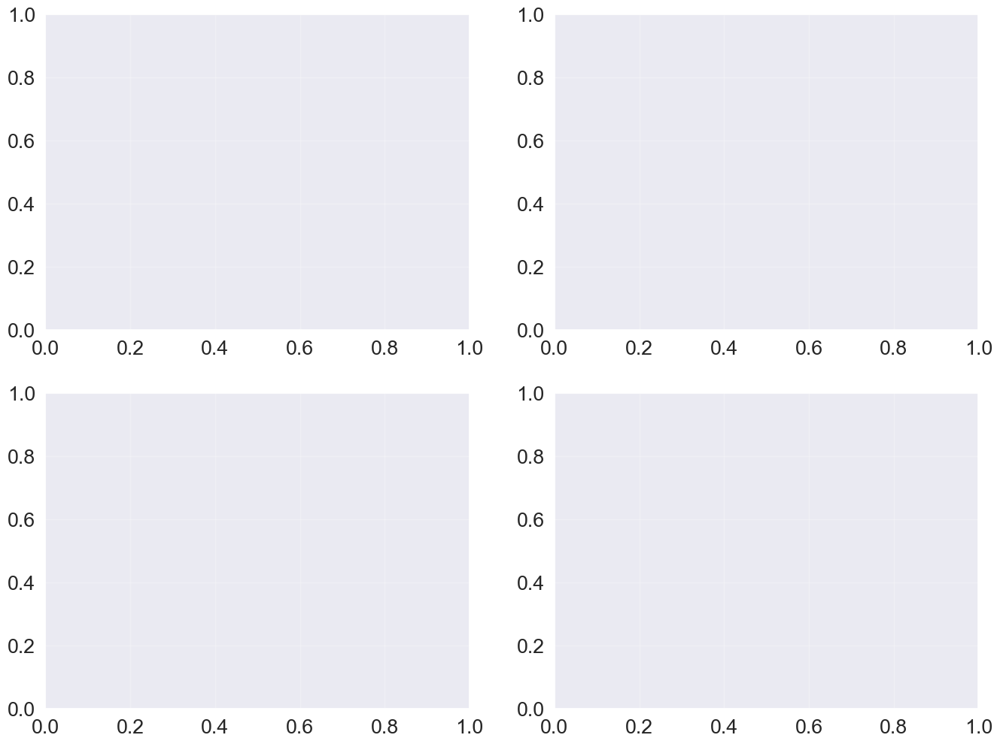

In [199]:
# Set up the dataframe to receive results
df_KS_rslts_egm_sclf_flux_YC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "ks_stat",
        "pval",
        "n_egm",
        "n_crds"
      ],
    index=range(4)
  )

# Loop through each soil type and check for normality
fig, ax = plt.subplots(2,2, figsize=(16,12))

for i in range(4):
  #---YNP---#
  # Gather Soil Classification
  df_KS_rslts_egm_sclf_flux_YC.loc[i]["Soil_Classification"] = \
  gb_sclf_egm_YC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KS_rslts_egm_sclf_flux_YC.loc[i]["Caldera"] = \
  gb_sclf_egm_YC[i].Caldera.iloc[0]
  # Run KS Test gb_grps_YC[i].CO2_Flux.dropna()
  ## use for original (non-log) data
  # ks_stat, pval = ks_2samp(
  #     gb_sclf_egm_YC[i].fCO2.dropna(),
  #     gb_sclf_YC[i].CO2_Flux.dropna()
  # )
  ks_stat, pval = ks_2samp(
      gb_sclf_egm_YC[i].CO2_Flux_log10.dropna(),
      np.log10(gb_sclf_YC[i].CO2_Flux.dropna())
  )
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_egm_sclf_flux_YC.loc[i]["ks_stat"] = ks_stat
  ## pval
  df_KS_rslts_egm_sclf_flux_YC.loc[i]["pval"] = pval
  ## n_egm
  df_KS_rslts_egm_sclf_flux_YC.loc[i]["n_egm"] = \
  len(gb_sclf_egm_YC[i].CO2_Flux_log10.dropna())
  ## n_crds
  df_KS_rslts_egm_sclf_flux_YC.loc[i]["n_crds"] = \
  len(gb_sclf_YC[i].CO2_Flux.dropna())

  if i == 0:
    ax_r = 0
    ax_c = 0
  elif i == 1:
    ax_r = 0
    ax_c = 1
  elif i == 2:
    ax_r = 1
    ax_c = 0
  elif i == 3:
    ax_r = 1
    ax_c = 1

  # egm
  sns.histplot(
      gb_sclf_egm_YC[i],
      x=gb_sclf_egm_YC[i].CO2_Flux_log10.dropna(),
      color="green",
      bins=20,
      ax=ax[ax_r, ax_c]
  )
  # crds
  sns.histplot(
      gb_sclf_YC[i],
      x=np.log10(gb_sclf_YC[i].CO2_Flux.dropna()),
      color="magenta",
      bins=20,
      ax=ax[ax_r, ax_c]
  )

  ax[ax_r, ax_c].set_title(
    "{}".format(gb_sclf_egm_YC[i].Soil_Classification.iloc[0]),
    size=16
  )

df_KS_rslts_egm_sclf_flux_YC.to_csv(
      "../../pertinent-data/summary-data/egm_v_crds_ks_test_log10.csv"
  )

ax[0,0].set_xlabel("")
ax[0,0].set_ylabel("Count", fontsize=16)
ax[0,1].set_xlabel("")
ax[0,1].set_ylabel("")
ax[1,0].set_xlabel("log$_{10}$(CO$_{2}$ Flux)", fontsize=16)
ax[1,0].set_ylabel("Count", fontsize=16)
ax[1,1].set_xlabel("log$_{10}$(CO$_{2}$ Flux)", fontsize=16)
ax[1,1].set_ylabel("")

plt.legend(
    [ax[1,1].containers[0], ax[1,1].containers[1]],
    ['EGM', 'CRDS']
)
plt.tight_layout()

save_fig(fig, "../../figures/egm_v_crds_hist_sclf_log10_co2.png")

plt.show()

# export results to `.csv`
df_KS_rslts_egm_sclf_flux_YC.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/ks_results_egm_log10_sclf_yc.csv",
    index=False
)

# view results
df_KS_rslts_egm_sclf_flux_YC.style.format(
    formatter={
        "ks_stat": "{:.3e}",
        "pval": "{:.3e}"
    }
)

The KS test fails to reject the null hypothesis that the EGM observations are from a distribution that is differs from the CRDS in each respective soil chemistry class. Only Acid-Sulphate class violates this statement; the KS test rehected the null ($p ≤ 0.001$), suggesting the EGM data originates from a different distribution than that of the CRDS.

###### Valles

In [200]:
# YNP -- egm
gb_sclf_egm_VC = df_egm_VC.groupby(by=["Soil_Classification"])
gb_sclf_egm_VC = [gb_sclf_egm_VC.get_group(x) for x in gb_sclf_egm_VC.groups]

gb_sclf_egm_VC

KeyError: 'Soil_Classification'

NameError: name 'gb_sclf_egm_VC' is not defined

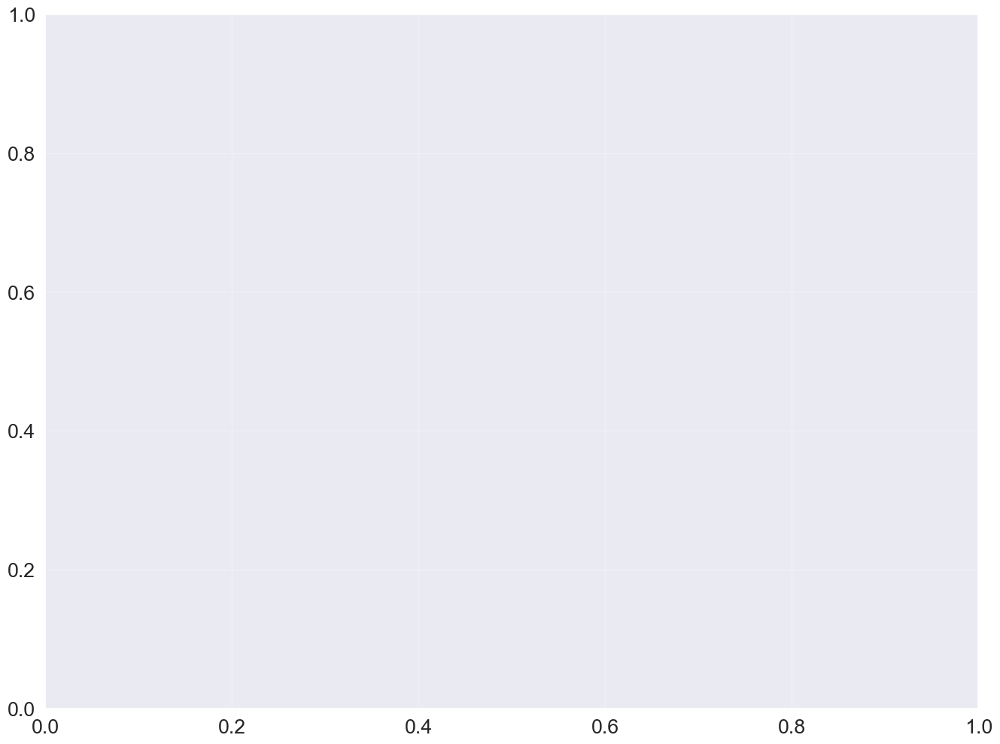

In [201]:
# Set up the dataframe to receive results
df_KS_rslts_egm_sclf_flux_VC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "ks_stat",
        "pval",
        "n_egm",
        "n_crds"
      ],
    index=range(1)
  )

# Loop through each soil type and check for normality
fig, ax = plt.subplots(figsize=(16,12))

for i in range(1):
  #---VCNP---#
  # Gather Soil Classification
  df_KS_rslts_egm_sclf_flux_VC.loc[i]["Soil_Classification"] = \
  gb_sclf_egm_VC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KS_rslts_egm_sclf_flux_VC.loc[i]["Caldera"] = \
  gb_sclf_egm_VC[i].Caldera.iloc[0]
  # Run KS Test gb_grps_YC[i].CO2_Flux.dropna()
  ## use for original (non-log) data
  # ks_stat, pval = ks_2samp(
  #     gb_sclf_egm_VC[i].fCO2.dropna(),
  #     gb_sclf_YC[i].CO2_Flux.dropna()
  # )
  ks_stat, pval = ks_2samp(
      gb_sclf_egm_VC[i].CO2_Flux_log10.dropna(),
      np.log10(gb_sclf_VC[i].CO2_Flux.dropna())
  )
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_egm_sclf_flux_VC.loc[i]["ks_stat"] = ks_stat
  ## pval
  df_KS_rslts_egm_sclf_flux_VC.loc[i]["pval"] = pval
  ## n_egm
  df_KS_rslts_egm_sclf_flux_VC.loc[i]["n_egm"] = \
  len(gb_sclf_egm_VC[i].CO2_Flux_log10.dropna())
  ## n_crds
  df_KS_rslts_egm_sclf_flux_VC.loc[i]["n_crds"] = \
  len(gb_sclf_VC[i].CO2_Flux.dropna())

  # egm
  sns.histplot(
      gb_sclf_egm_VC[i],
      x=gb_sclf_egm_VC[i].CO2_Flux_log10.dropna(),
      color="green",
      bins=20,
      ax=ax
  )
  # crds
  sns.histplot(
      gb_sclf_VC[i],
      x=np.log10(gb_sclf_VC[i].CO2_Flux.dropna()),
      color="magenta",
      bins=20,
      ax=ax
  )

  ax.set_title(
    "{}".format(gb_sclf_egm_VC[i].Soil_Classification.iloc[0]),
    size=16
  )

df_KS_rslts_egm_sclf_flux_YC.to_csv(
      "../../pertinent-data/summary-data/egm_v_crds_ks_test_log10_vc.csv"
  )

ax.set_ylabel("Count", fontsize=16)
ax.set_xlabel("log$_{10}$(CO$_{2}$ Flux)", fontsize=16)

plt.legend(
    [ax.containers[0], ax.containers[1]],
    ['EGM', 'CRDS']
)
plt.tight_layout()

save_fig(fig, "../../figures/egm_v_crds_hist_sclf_log10_co2_vc.png")

plt.show()

# export results to `.csv`
df_KS_rslts_egm_sclf_flux_VC.to_csv(
    "../../pertinent-data/inferential-stats-output/valles/ks_results_egm_log10_sclf_yc.csv",
    index=False
)

# view results
df_KS_rslts_egm_sclf_flux_VC.style.format(
    formatter={
        "ks_stat": "{:.3e}",
        "pval": "{:.3e}"
    }
)

As there are only EGM measuerments from three acid-sulphate sites at Valles, the two sample KS test was only applied for one soil chemistry classification. The results show the null hypothesis could not be rejected ($p \sim 0.22$). This means that the EGM measurements across the several acid-sulphate sites at Valles could not be determined as statistically different than the CRDS measurements across the same soil chemistry regime.

###### Linear (non log)


NameError: name 'gb_sclf_egm_YC' is not defined

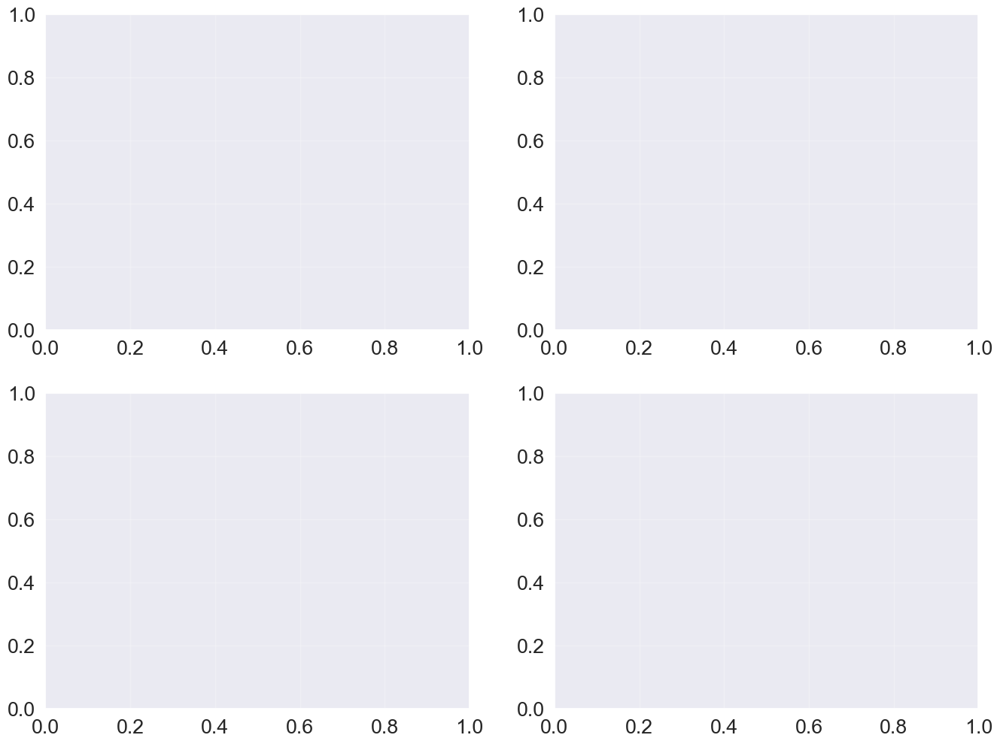

In [202]:
# Set up the dataframe to receive results
df_KS_rslts_egm_sclf_flux_YC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "ks_stat",
        "pval"
      ],
    index=range(4)
  )

# Loop through each soil type and check for normality
fig, ax = plt.subplots(2,2, figsize=(16,12))

for i in range(4):
  #---YNP---#
  # Gather Soil Classification
  df_KS_rslts_egm_sclf_flux_YC.loc[i]["Soil_Classification"] = \
  gb_sclf_egm_YC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KS_rslts_egm_sclf_flux_YC.loc[i]["Caldera"] = \
  gb_sclf_egm_YC[i].Caldera.iloc[0]
  # Run KS Test gb_grps_YC[i].CO2_Flux.dropna()
  ## use for original (non-log) data
  # ks_stat, pval = ks_2samp(
  #     gb_sclf_egm_YC[i].fCO2.dropna(),
  #     gb_sclf_YC[i].CO2_Flux.dropna()
  # )
  ks_stat, pval = ks_2samp(
      gb_sclf_egm_YC[i].fCO2.dropna(),
      gb_sclf_YC[i].CO2_Flux.dropna()
  )
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_egm_sclf_flux_YC.loc[i]["ks_stat"] = ks_stat
  ## pval
  df_KS_rslts_egm_sclf_flux_YC.loc[i]["pval"] = pval

  df_KS_rslts_egm_sclf_flux_YC.to_csv(
      "../../pertinent-data/summary-data/egm_v_crds_ks_test.csv"
  )

  if i == 0:
    ax_r = 0
    ax_c = 0
  elif i == 1:
    ax_r = 0
    ax_c = 1
  elif i == 2:
    ax_r = 1
    ax_c = 0
  elif i == 3:
    ax_r = 1
    ax_c = 1

  # egm
  sns.histplot(
      gb_sclf_egm_YC[i],
      x=gb_sclf_egm_YC[i].fCO2.dropna(),
      color="green",
      bins=20,
      ax=ax[ax_r, ax_c]
  )
  # crds
  sns.histplot(
      gb_sclf_YC[i],
      x=gb_sclf_YC[i].CO2_Flux.dropna(),
      color="magenta",
      bins=20,
      ax=ax[ax_r, ax_c]
  )

  ax[ax_r, ax_c].set_title(
    "{}".format(gb_sclf_egm_YC[i].Soil_Classification.iloc[0]),
    size=16
  )


ax[0,0].set_xlabel("")
ax[0,0].set_ylabel("Count", fontsize=16)
ax[0,1].set_xlabel("")
ax[0,1].set_ylabel("")
ax[1,0].set_xlabel("log$_{10}$(CO$_{2}$ Flux)", fontsize=16)
ax[1,0].set_ylabel("Count", fontsize=16)
ax[1,1].set_xlabel("log$_{10}$(CO$_{2}$ Flux)", fontsize=16)
ax[1,1].set_ylabel("")

plt.legend(
    [ax[1,1].containers[0], ax[1,1].containers[1]],
    ['EGM', 'CRDS']
)
plt.tight_layout()

save_fig(fig, "../../figures/egm_v_crds_hist_sclf_log10_co2.png")

plt.show()

# export results to `.csv`
df_KS_rslts_egm_sclf_flux_YC.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/ks_results_egm_sclf_yc.csv",
    index=False
)

# view results
df_KS_rslts_egm_sclf_flux_YC.style.format(
    formatter={
        "ks_stat": "{:.3e}",
        "pval": "{:.3e}"
    }
)

The linear (non-logged) observations show that none of the null hypotheses can be rejected, except for the Acid-Sulphate class. This lends to the conclusion that the EGM is observin gases from a similar distribution than the CRDS. The exception for the Acid-Sulphate class is likely due to the wide range in values measured across both instruments.

##### One-Sample KS Test

To assess if the logged EGM data originate from a normal distribution, a one-sample KS test is performed. Where the observations are compared against the normal distributionm, which acts as the reference.

###### Yellowstone

In [203]:
# Set up the dataframe to receive results
df_KS_one_samp_egm_sclf_flux_YC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "ks_stat",
        "pval"
      ],
    index=range(4)
  )

# Loop through each soil type and check for normality
for i in range(4):
  #---YNP---#
  # Gather Soil Classification
  df_KS_one_samp_egm_sclf_flux_YC.loc[i]["Soil_Classification"] = \
  gb_sclf_egm_YC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KS_one_samp_egm_sclf_flux_YC.loc[i]["Caldera"] = \
  gb_sclf_egm_YC[i].Caldera.iloc[0]
  # Run KS Test
  ks_stat, pval = kstest_normal(
      gb_sclf_egm_YC[i].CO2_Flux_log10.dropna()
  )
  # Assign results to dataframe
  ## ks_stat
  df_KS_one_samp_egm_sclf_flux_YC.loc[i]["ks_stat"] = ks_stat
  ## pval
  df_KS_one_samp_egm_sclf_flux_YC.loc[i]["pval"] = pval

df_KS_one_samp_egm_sclf_flux_YC.to_csv(
      "../../pertinent-data/summary-data/egm_ks_one-samp_test_log10.csv"
  )


df_KS_one_samp_egm_sclf_flux_YC.style.format(
    formatter={
        "ks_stat": "{:.3e}",
        "pval": "{:.3e}"
    }
)

NameError: name 'gb_sclf_egm_YC' is not defined

The one-sample KS test rejected the null that the log transformed EGM observations originate from a normal distribution for the Travertine ($p = 0.01$) and Neutral-Chloride ($p = 0.001$) soil chemistry classes.

However, the one-sample KS test failed to reject the null for Acid-Sulphate ($p = 0.05$) and Unclassified ($p = 0.1$) indicating that a normal distribution may adequately describe the observations from these two classes. _Note, that the Acid-Sulphate class is near the pre-determined alpha value of 0.05._

###### Valles

In [204]:
# Set up the dataframe to receive results
df_KS_one_samp_egm_sclf_flux_VC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "ks_stat",
        "pval"
      ],
    index=range(1)
  )

# Loop through each soil type and check for normality
for i in range(1):
  #---VCNP---#
  # Gather Soil Classification
  df_KS_one_samp_egm_sclf_flux_VC.loc[i]["Soil_Classification"] = \
  gb_sclf_egm_VC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KS_one_samp_egm_sclf_flux_VC.loc[i]["Caldera"] = \
  gb_sclf_egm_VC[i].Caldera.iloc[0]
  # Run KS Test
  ks_stat, pval = kstest_normal(
      gb_sclf_egm_VC[i].CO2_Flux_log10.dropna()
  )
  # Assign results to dataframe
  ## ks_stat
  df_KS_one_samp_egm_sclf_flux_VC.loc[i]["ks_stat"] = ks_stat
  ## pval
  df_KS_one_samp_egm_sclf_flux_VC.loc[i]["pval"] = pval

df_KS_one_samp_egm_sclf_flux_VC.to_csv(
      "../../pertinent-data/summary-data/egm_ks_one-samp_test_log10_vc.csv"
  )


df_KS_one_samp_egm_sclf_flux_VC.style.format(
    formatter={
        "ks_stat": "{:.3e}",
        "pval": "{:.3e}"
    }
)

NameError: name 'gb_sclf_egm_VC' is not defined

The one-sample KS test demonstrated that the theoretical distribution of the EGM data is significantly different ($p \sim 0.001$) than the reference normal distribution. In assessment of other possible distributions to describe the EGM data, KS tests showed that genlogistic ($p > 0.71$) and loggamma ($p > 0.45$) could not detemermined to be significantly different than their reference distributions.

##### FK Test

Analysis of unequal variance across groups

###### Yellowstone

In [205]:
# Set up the dataframe to receive results
df_FK_rslts_egm_sclf_flux_YC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "fk_stat",
        "pval",
        "n_egm",
        "n_crds"
      ],
    index=range(4)
  )

for i in range(4):
  fk_stat, pval = fligner(
      gb_sclf_egm_YC[i].CO2_Flux_log10.dropna(),
      np.log10(gb_sclf_YC[i].CO2_Flux)
  )

  # Assign results to dataframe
  ## soil classification
  df_FK_rslts_egm_sclf_flux_YC.loc[i]["Soil_Classification"] = \
  gb_sclf_egm_YC[i].Soil_Classification.iloc[0]
  ## caldera
  df_FK_rslts_egm_sclf_flux_YC.loc[i]["Caldera"] = \
  gb_sclf_egm_YC[i].Caldera.iloc[0]
  ## fk_stat
  df_FK_rslts_egm_sclf_flux_YC.loc[i]["fk_stat"] = fk_stat
  ## pval
  df_FK_rslts_egm_sclf_flux_YC.loc[i]["pval"] = pval
  ## n_egm
  df_FK_rslts_egm_sclf_flux_YC.loc[i]["n_egm"] = \
  len(gb_sclf_egm_YC[i].CO2_Flux_log10.dropna())
  ## n_crds
  df_FK_rslts_egm_sclf_flux_YC.loc[i]["n_crds"] = \
  len(gb_sclf_YC[i].CO2_Flux.dropna())

# export results to a `.csv`
df_FK_rslts_egm_sclf_flux_YC.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/fk_results_egm_v_crds_log10_sclf_yc.csv",
    index=False
)

df_FK_rslts_egm_sclf_flux_YC.style.format(
    formatter={
        "fk_stat": "{:.3e}",
        "pval": "{:.3e}"
    }
)

NameError: name 'gb_sclf_egm_YC' is not defined

The FK test rejects the null ($p ≤ 0.0001$) and shows that the variance between the EGM and CRDS is unequal. However, the unclassified soil chemistry class failed to reject the null hypothesis and is the lone exception for these tests.

###### Valles

In [206]:
# Set up the dataframe to receive results
df_FK_rslts_egm_sclf_flux_VC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "fk_stat",
        "pval",
        "n_egm",
        "n_crds"
      ],
    index=range(1)
  )

for i in range(1):
  fk_stat, pval = fligner(
      gb_sclf_egm_VC[i].CO2_Flux_log10.dropna(),
      np.log10(gb_sclf_YC[i].CO2_Flux)
  )

  # Assign results to dataframe
  ## soil classification
  df_FK_rslts_egm_sclf_flux_VC.loc[i]["Soil_Classification"] = \
  gb_sclf_egm_VC[i].Soil_Classification.iloc[0]
  ## caldera
  df_FK_rslts_egm_sclf_flux_VC.loc[i]["Caldera"] = \
  gb_sclf_egm_VC[i].Caldera.iloc[0]
  ## fk_stat
  df_FK_rslts_egm_sclf_flux_VC.loc[i]["fk_stat"] = fk_stat
  ## pval
  df_FK_rslts_egm_sclf_flux_VC.loc[i]["pval"] = pval
  ## n_egm
  df_FK_rslts_egm_sclf_flux_VC.loc[i]["n_egm"] = \
  len(gb_sclf_egm_VC[i].CO2_Flux_log10.dropna())
  ## n_crds
  df_FK_rslts_egm_sclf_flux_VC.loc[i]["n_crds"] = \
  len(gb_sclf_YC[i].CO2_Flux.dropna())

# export results to a `.csv`
df_FK_rslts_egm_sclf_flux_VC.to_csv(
    "../../pertinent-data/inferential-stats-output/valles/fk_results_egm_v_crds_log10_sclf_vc.csv",
    index=False
)

df_FK_rslts_egm_sclf_flux_VC.style.format(
    formatter={
        "fk_stat": "{:.3e}",
        "pval": "{:.3e}"
    }
)

NameError: name 'gb_sclf_egm_VC' is not defined

The FK test for Valles demonstrates that the solitary soil chemistry class (Acid-Sulphate) rejects the null that the EGM data has the same amount of variance as the CRDS data.

###### Linear (non-log)

In [207]:
## CO2
fk_stat, pval = fligner(
    gb_sclf_YC[0].CO2_Flux,
    gb_sclf_egm_YC[0].fCO2.dropna(),
    gb_sclf_YC[1].CO2_Flux,
    gb_sclf_egm_YC[1].fCO2.dropna(),
    gb_sclf_YC[2].CO2_Flux,
    gb_sclf_egm_YC[2].fCO2.dropna(),
    gb_sclf_YC[3].CO2_Flux,
    gb_sclf_egm_YC[3].fCO2.dropna(),
  )
print("After applying the FK test to the YNP CO2 Flux data, \nthe FK stat is {:.2f} and the p-value is {:.3e}\n".format(fk_stat, pval))

# consolidate results into a dataframe
df_FK_rslts_sclf_flux_yc = pd.DataFrame(
    {
      "fk_stat":fk_stat,
      "pval":pval
    },
    index=range(1)
)

# export results to a `.csv`
df_FK_rslts_sclf_flux_yc.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/fk_results_egm_v_crds_sclf_yc.csv",
    index=False
)

NameError: name 'gb_sclf_egm_YC' is not defined

##### KW Test

Non-parametric version of an ANOVA

###### Yellowstone

In [208]:
# Set up the dataframe to receive results
df_KW_rslts_egm_sclf_flux_YC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "kw_stat",
        "pval",
        "n_egm",
        "n_crds"
      ],
    index=range(4)
  )

# Loop through each soil type and check for normality
for i in range(4):
  #---YNP---#
  # Gather Soil Classification
  df_KW_rslts_egm_sclf_flux_YC.loc[i]["Soil_Classification"] = \
  gb_sclf_egm_YC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KW_rslts_egm_sclf_flux_YC.loc[i]["Caldera"] = \
  gb_sclf_egm_YC[i].Caldera.iloc[0]

  kw_stat, pval = kruskal(
      gb_sclf_egm_YC[i].CO2_Flux_log10,
      np.log10(gb_sclf_YC[i].CO2_Flux),
      nan_policy="omit"
  )
  # Assign results to dataframe
  ## kw_stat
  df_KW_rslts_egm_sclf_flux_YC.loc[i]["kw_stat"] = kw_stat
  ## pval
  df_KW_rslts_egm_sclf_flux_YC.loc[i]["pval"] = pval
  ## n_egm
  df_KW_rslts_egm_sclf_flux_YC.loc[i]["n_egm"] = \
  len(gb_sclf_egm_YC[i].CO2_Flux_log10.dropna())
  ## n_crds
  df_KW_rslts_egm_sclf_flux_YC.loc[i]["n_crds"] = \
  len(gb_sclf_YC[i].CO2_Flux.dropna())

# export results to `.csv`
df_KW_rslts_egm_sclf_flux_YC.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/kw_results_egm_log10_sclf_yc.csv",
    index=False
)

# view results
df_KW_rslts_egm_sclf_flux_YC.style.format(
    formatter={
        "kw_stat": "{:.3e}",
        "pval": "{:.3e}"
    }
)

NameError: name 'gb_sclf_egm_YC' is not defined

The KW test fails to reject that the median values from the EGM data come from different populations than the median values observed by the CRDS across the soil chemistry classes. The exception is the Acid-Sulphate group, which rejects the null ($p ≤ 0.01$).

###### Valles

In [209]:
# Set up the dataframe to receive results
df_KW_rslts_egm_sclf_flux_VC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "kw_stat",
        "pval",
        "n_egm",
        "n_crds"
      ],
    index=range(1)
  )

# Loop through each soil type and check for normality
for i in range(1):
  #---YNP---#
  # Gather Soil Classification
  df_KW_rslts_egm_sclf_flux_VC.loc[i]["Soil_Classification"] = \
  gb_sclf_egm_VC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KW_rslts_egm_sclf_flux_VC.loc[i]["Caldera"] = \
  gb_sclf_egm_VC[i].Caldera.iloc[0]

  kw_stat, pval = kruskal(
      gb_sclf_egm_VC[i].CO2_Flux_log10,
      np.log10(gb_sclf_YC[i].CO2_Flux),
      nan_policy="omit"
  )
  # Assign results to dataframe
  ## kw_stat
  df_KW_rslts_egm_sclf_flux_VC.loc[i]["kw_stat"] = kw_stat
  ## pval
  df_KW_rslts_egm_sclf_flux_VC.loc[i]["pval"] = pval
  ## n_egm
  df_KW_rslts_egm_sclf_flux_VC.loc[i]["n_egm"] = \
  len(gb_sclf_egm_VC[i].CO2_Flux_log10.dropna())
  ## n_crds
  df_KW_rslts_egm_sclf_flux_VC.loc[i]["n_crds"] = \
  len(gb_sclf_YC[i].CO2_Flux.dropna())

# export results to `.csv`
df_KW_rslts_egm_sclf_flux_VC.to_csv(
    "../../pertinent-data/inferential-stats-output/valles/kw_results_egm_log10_sclf_vc.csv",
    index=False
)

# view results
df_KW_rslts_egm_sclf_flux_VC.style.format(
    formatter={
        "kw_stat": "{:.3e}",
        "pval": "{:.3e}"
    }
)

NameError: name 'gb_sclf_egm_VC' is not defined

The KW test conducted on the Valles EGM and CRDS data show that the null hypothesis cannot be rejected indicating that the EGM and CRDS data come from the same distribution for the measurements collected at Acid-Sulphate sites.

###### Linear (non-log)

In [210]:
# Set up the dataframe to receive results
df_KW_rslts_egm_sclf_flux_YC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "kw_stat",
        "pval"
      ],
    index=range(4)
  )

# Loop through each soil type and check for normality
for i in range(4):
  #---YNP---#
  # Gather Soil Classification
  df_KW_rslts_egm_sclf_flux_YC.loc[i]["Soil_Classification"] = \
  gb_sclf_egm_YC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KW_rslts_egm_sclf_flux_YC.loc[i]["Caldera"] = \
  gb_sclf_egm_YC[i].Caldera.iloc[0]

  kw_stat, pval = kruskal(
      gb_sclf_egm_YC[i].fCO2,
      gb_sclf_YC[i].CO2_Flux,
      nan_policy="omit"
  )
  # Assign results to dataframe
  ## kw_stat
  df_KW_rslts_egm_sclf_flux_YC.loc[i]["kw_stat"] = kw_stat
  ## pval
  df_KW_rslts_egm_sclf_flux_YC.loc[i]["pval"] = pval

# export results to `.csv`
df_KW_rslts_egm_sclf_flux_YC.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/kw_results_egm_sclf_yc.csv",
    index=False
)

# view results
df_KW_rslts_egm_sclf_flux_YC.style.format(
    formatter={
        "kw_stat": "{:.3e}",
        "pval": "{:.3e}"
    }
)

NameError: name 'gb_sclf_egm_YC' is not defined

The linear scale (non-logged) EGM fluxes appear to be significantly different from the CRDS only in the case of the Acid-Sulphate group. The remaining soil chemistry classes are unable to reject the null that the EGM data come from a population with a different median than the CRDS.

#### Boxplot of fluxes -- EGM v CRDS

##### Yellowstone

NameError: name 'gb_sclf_egm_YC' is not defined

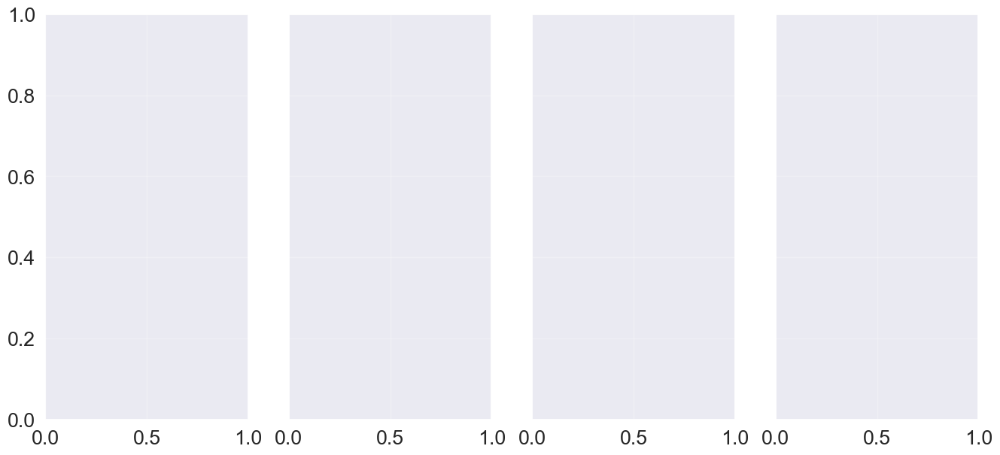

In [211]:
fig, ax = plt.subplots(1,4, figsize=(16,7), sharey=True)
for i in range(4):
  x = gb_sclf_egm_YC[i][["Soil_Classification", "Caldera", "CO2_Flux_log10"]]
  x["Instrument"] = "EGM"

  y = gb_sclf_YC[i][["Soil_Classification", "Caldera", "CO2_Flux"]]
  y["CO2_Flux_log10"] = np.log10(y["CO2_Flux"])
  y["Instrument"] = "CRDS"

  df = pd.concat([x,y])

  g = sns.boxplot(
    data=df,
    x="Soil_Classification",
    y="CO2_Flux_log10",
    hue="Instrument",
    palette=["m", "g"],
    ax=ax[i]
  )

  ax[i].set_yscale("linear")
  ax[i].set_xlabel("")
  if i == 0:
    ax[i].set_ylabel(
        "log$_{10}$(CO$_{2}$ Flux) (g m$^{-2}$ day$^{-1}$)",
        fontsize=18
      )
  elif i > 0:
    ax[i].get_legend().remove()
    ax[i].set_ylabel("")

plt.tight_layout()
save_fig(fig, "../../figures/egm_v_crds_boxplots_sclf_log10.png")

plt.show()

##### Valles

NameError: name 'gb_sclf_egm_YC' is not defined

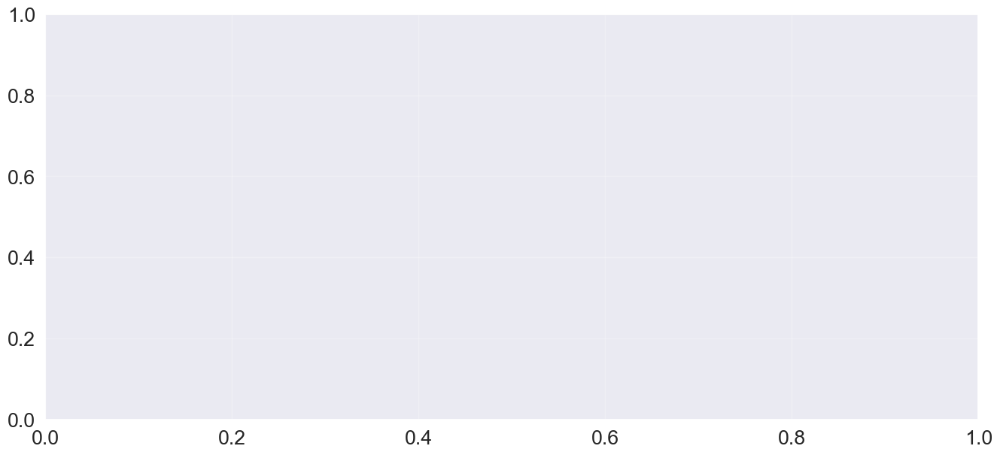

In [212]:
fig, ax = plt.subplots(figsize=(16,7), sharey=True)
for i in range(1):
  x = gb_sclf_egm_YC[i][["Soil_Classification", "Caldera", "CO2_Flux_log10"]]
  x["Instrument"] = "EGM"

  y = gb_sclf_YC[i][["Soil_Classification", "Caldera", "CO2_Flux"]]
  y["CO2_Flux_log10"] = np.log10(y["CO2_Flux"])
  y["Instrument"] = "CRDS"

  df = pd.concat([x,y])

  g = sns.boxplot(
    data=df,
    x="Soil_Classification",
    y="CO2_Flux_log10",
    hue="Instrument",
    palette=["m", "g"],
    ax=ax
  )
  ax.set_yscale("linear")
  ax.set_xlabel("")
  if i > 0:
    ax.get_legend().remove()
    ax.set_ylabel("")

ax.set_ylabel(
    "log$_{10}$(CO$_{2}$ Flux) (g m$^{-2}$ day$^{-1}$)",
    fontsize=18
)
plt.tight_layout()
save_fig(fig, "../../figures/egm_v_crds_boxplots_sclf_log10_vc.png")

plt.show()

### EGM _Ad hoc_ Analysis and Visualizations

In [213]:
df_xy = pd.concat([df_egm_YC, df_egm_VC])

df_xy.head()

,Date,Year,Location,EGM_Location,Site,Site_Number,Site_Letter,fCO2,log10fCO2,Latitude,Longitude,Caldera,Group
0,07-Jun-19,2019,WTHB_07Jun2019_1.1,WTHB_1.1_A,WTHB,3.2,A,0.04,-1.397940,44.418208,-110.572373,YNP,West Thumb GB
1,07-Jun-19,2019,WTHB_07Jun2019_1.1,WTHB_1.1_B,WTHB,3.2,B,0.06,-1.221849,44.418225,-110.572355,YNP,West Thumb GB
2,07-Jun-19,2019,WTHB_07Jun2019_1.2,WTHB_1.2_A,WTHB,3.3,A,0.00,NaN,44.418306,-110.571943,YNP,West Thumb GB
3,07-Jun-19,2019,WTHB_07Jun2019_1.2,WTHB_1.2_B,WTHB,3.3,B,0.05,-1.301030,44.418296,-110.571971,YNP,West Thumb GB
4,07-Jun-19,2019,WTHB_07Jun2019_1.2,WTHB_1.2_E,WTHB,3.3,E,0.01,-2.000000,44.418066,-110.571973,YNP,West Thumb GB


In [214]:
df_xy.groupby(by="Group")["fCO2"].describe()

,count,mean,std,min,25%,50%,75%,max
Group,,,,,,,,
Alamo Canyon,23.0,2.776087,5.464310,-0.01,0.0150,0.310,1.6300,21.270
Eastern Yellowstone,149.0,5.026262,14.392964,-0.04,0.2400,0.760,1.7600,123.233
Gas Vents (Solfatara Springs),98.0,4.499898,7.242777,0.12,1.1900,2.530,4.1575,48.780
Hummingbird,15.0,11.736667,8.258920,2.37,5.2750,7.240,18.1550,26.720
Lower GB,31.0,0.200968,0.181372,-0.05,0.0800,0.190,0.3000,0.680
Mammoth HS,38.0,1.207895,2.125277,-0.06,0.0725,0.310,1.2450,8.490
Mud Volcano,45.0,7.654667,10.727867,0.11,1.6000,3.540,7.5700,37.910
Norris GB,47.0,9.602766,55.361671,0.00,0.3000,1.560,2.5300,381.000
Sulphur Springs,20.0,21.752000,32.736289,0.05,4.3300,11.910,26.5650,143.300


In [215]:
# Create catplot
sns.catplot(x="fCO2", y="Group", hue="Soil_Classification", data=df_xy, kind="box", height=8, aspect=1.5, palette=_palette, legend=False)

# Set x-axis scale to log
# sns.despine(left=True)
plt.xscale("log")
plt.ylabel("")
plt.xlabel("log(CO$_{2}$ Flux g m$^{-2}$ day$^{-1}$)")

# Add value counts to y-axis
ax = plt.gca()

# move legend outside the frame
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left')

counts = df_xy['Group'].value_counts()
ylabels = ax.get_yticklabels()
for i, label in enumerate(ylabels):
    count = counts[label.get_text()]
    new_label = f"n={count}"
    ax.text(0.0075, i, new_label, ha='left', va='center', fontsize=10, transform=ax.get_yaxis_transform()) #, fontweight='bold'



plt.tight_layout()
# plt.show()

save_fig(plt, "../../figures/EGM_CO2_flx_all_box.png")

ValueError: Could not interpret value `Soil_Classification` for `hue`. An entry with this name does not appear in `data`.

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/seaborn/categorical.py:2761: UserWarning: catplot is a figure-level function and does not accept target axes. You may wish to try boxplot
  warnings.warn(msg, UserWarning)


ValueError: Could not interpret value `Soil_Classification` for `hue`. An entry with this name does not appear in `data`.

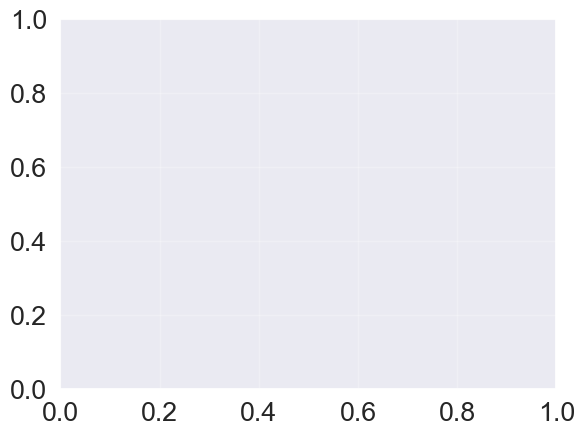

In [216]:
## CO2 - Yellowstone
fig, ax = plt.subplots()
p_CO2_flx = sns.catplot(
    x="fCO2",
    y="Group",
    data=df_xy,
    kind="box",
    hue="Soil_Classification",
    orient="h",
    height=10,
    aspect=1.03,
    legend_out=False,
    palette=_palette,
    ax=ax
)
p_CO2_flx.set_axis_labels(
    "log(CO$_2$ g m$^{-2}$ day$^{-1}$)",
    "",
    fontsize=14
)
p_CO2_flx.set(xscale="log")
for ax in p_CO2_flx.axes.flat:
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda y, p: f'{y:2.0E}'))

for container in ax.containers:
  ax.bar_label(container)

plt.legend(bbox_to_anchor=(1.02, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
# Save plot to Google Drive Directory
# p_CO2_flx.savefig("../../figures/EGM_CO2_flx_all_box.png", dpi=300)

Boxplot for EGM Data: Boxplots of CO<sub>2</sub> fluxes collected using the EGM-5 chamber. Each boxplot is colored by the soil classification. Note the logged x-axis and there are two box plots (acid-sulphate and unclassified) for the Eastern Yellowstone site. Rows without boxplots indicate that no EGM measurements were collected at that site.

Visualize the differences between average EGM CO2 flux and the CRDS-AC

In [217]:
x = df_xy[(df_xy["CO2_Flux"] > 0) & (df_xy["fCO2_mean"] > 0)]
df_xy_pos_only = df_xy.loc[x.index]

KeyError: 'CO2_Flux'

Using only fluxes that are greater than zero, the EGM CO<sub>2</sub> fluxes are examined against the CRDS-AC Fluxes.

In [218]:
import matplotlib.lines as mlines
import matplotlib.transforms as mtransforms

def refline_fg(data, **kws):
  ax = plt.gca()
  line = mlines.Line2D([0,1], [0,1], color="black")
  transform = ax.transAxes
  line.set_transform(transform)
  ax.add_line(line)
  ax.set_xlim(0,None)
  ax.set_ylim(0,None)

# Visualize the differences
## Avg EGM CO2 vs CRDS-AC measurements
fg = sns.FacetGrid(df_xy_pos_only,
                   palette="gist_ncar_r",
                   hue="Soil_Classification",
                   col="Group", col_wrap=4,
                   height=3, aspect=1.3,
                   sharex=False, sharey=False)
fg.map_dataframe(sns.regplot, x="CO2_Flux", y="fCO2_mean", ci=None,
                 scatter_kws={"s":90, "edgecolors":"k"})
#fg.map_dataframe(refline_fg)
fg.set(xlabel="CRDS-AC: CO$_2$ g m$^{-2}$ day$^{-1}$",
       ylabel="EGM: CO$_2$ g m$^{-2}$ day$^{-1}$")
plt.rcParams.update({'font.size': 18})
fg.set_xticklabels(rotation=-30)
fg.add_legend()
fg.tight_layout()
save_fig(plt, "../../figures/all_EGM_CO2_flx_v_Picarro_CO2_flx.png")

NameError: name 'df_xy_pos_only' is not defined

Figure ##: EGM CO<sub>2</sub> fluxes are compared aginst CRDS-AC CO<sub>2</sub>  fluxes. Each scatter plot represents a different group, and the data has been seprarted by soil classification with color.

The measurements collected by  portable EGM chmaber are compareed to the less mobile CRDS-AC. This relationship sheds light on how much fine-scale heterogeneity exists with regard to the fluxes at each site. Recall, the EGM measuurements

In [219]:
# Import the ordinary least squares algorithm from statsmodels
import statsmodels.formula.api as sm
# Establish column names for results dataframe
columns = ["Group", "Soil_Classification", "egm", "intcpt",
           "egm_pval", "intcpt_pval", "r2", "f_stat", "f_pval",
           "nobs"]
# Create empty dataframe
df_EGM_ols_rslts = pd.DataFrame(columns=columns, index=range(15))
# Group data by the group
df_xy_pos_only_grp = df_xy_pos_only.groupby(by=["Group"])
# Loop through the EGM data and apply an OLS to each group
for i, group in zip(range(15), df_xy_pos_only_grp.groups.keys()):
  ## Skip the groups that do not have EGM data
  if group == "North of Norris GB":
    continue
  elif group == "Redondo Peak":
    continue
  elif group == "Soda Dam":
    continue
  ## Run a linear regression for those that have EGM data
  else:
    df = df_xy_pos_only_grp.get_group(group)
    df['constant']=1
    egm = df[['fCO2_mean']]
    crds_ac = df[['CO2_Flux']]
    results = sm.ols("crds_ac ~ egm", data=df).fit()
    ## Add relevant data to output dataframe
    df_EGM_ols_rslts.loc[i]["Group"] = group
    df_EGM_ols_rslts.loc[i]["Soil_Classification"] =  \
    df["Soil_Classification"].iloc[0]
    df_EGM_ols_rslts.loc[i]["egm"] = results.params["egm"]
    df_EGM_ols_rslts.loc[i]["intcpt"] = results.params["Intercept"]
    df_EGM_ols_rslts.loc[i]["egm_pval"] = results.pvalues["egm"]
    df_EGM_ols_rslts.loc[i]["intcpt_pval"] = results.pvalues["Intercept"]
    df_EGM_ols_rslts.loc[i]["r2"] = results.rsquared
    df_EGM_ols_rslts.loc[i]["f_stat"] = results.fvalue
    df_EGM_ols_rslts.loc[i]["f_pval"] = results.f_pvalue
    df_EGM_ols_rslts.loc[i]["nobs"] = results.nobs
    print(group)
    print(results.summary())
    # Print Summary to .txt File
    ols_txt_summary = "regression/egm-regression/%s_ols_egm_cRDS_regression.txt" % group
    print(results.summary(), file= open(ols_txt_summary, "w"))


NameError: name 'df_xy_pos_only' is not defined

In [220]:
# Clean up the results dataframe
df_EGM_ols_rslts.dropna(inplace=True)
df_EGM_ols_rslts.reset_index(inplace=True, drop=True)
# Export the dataframe to a .csv
df_EGM_ols_rslts.to_csv("df_EGM_ols_rslts.csv", sep=",", index=False)
df_EGM_ols_rslts

,Group,Soil_Classification,egm,intcpt,egm_pval,intcpt_pval,r2,f_stat,f_pval,nobs


/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3766327369.py:33: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  bar4.legend(fontsize = 15,


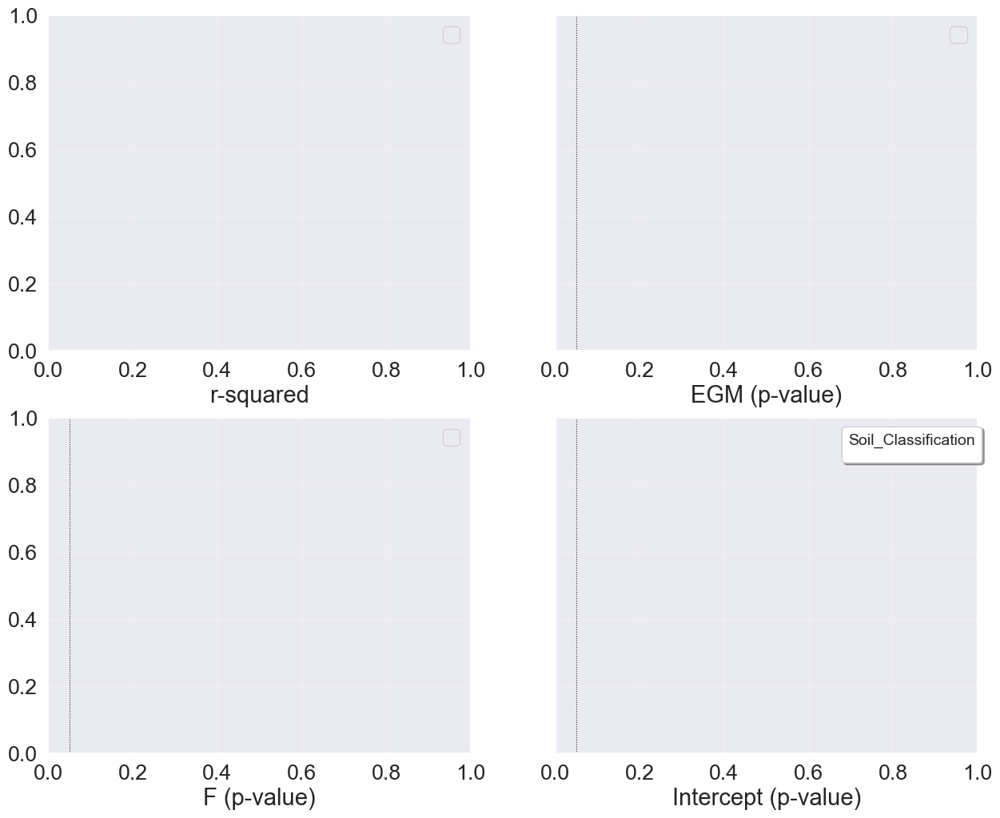

In [221]:
# Combine this with the other plot in a four pack
fig, axes = plt.subplots(nrows=2,ncols=2,  figsize=(15,12),
                         sharex=False, sharey=True)
## R-squared - coefficient of determination to describe the percentage of
## variation that can be explained by the independent variable
bar1 = sns.barplot(x="r2", y="Group", data=df_EGM_ols_rslts,
                   hue="Soil_Classification", palette="gist_ncar_r",
                   ax=axes[0,0])
bar1.legend("")
bar1.set(xlabel="r-squared", ylabel="")
## F-test p-value - determines a significant relationship between the
## independent variable on the response variable
bar2 = sns.barplot(x="f_pval", y="Group", data=df_EGM_ols_rslts,
                   hue="Soil_Classification", palette="gist_ncar_r",
                   ax=axes[1,0])
axes[1,0].axvline(0.05, linewidth=0.75,  ls=":", color="k")
bar2.legend("")
bar2.set(xlabel="F (p-value)", ylabel="")
## X p-value - determines a significant relationship between the
## independent variable on the response variable
bar3 = sns.barplot(x="egm_pval", y="Group", data=df_EGM_ols_rslts,
                   hue="Soil_Classification", palette="gist_ncar_r",
                   ax=axes[0,1])
axes[0,1].axvline(0.05, linewidth=0.75,  ls=":", color="k")
bar3.legend("")
bar3.set(xlabel="EGM (p-value)", ylabel="")
## X p-value - determines a significant relationship between the
## EGM fluxes on the CRDS-AC
bar4 = sns.barplot(x="intcpt_pval", y="Group", data=df_EGM_ols_rslts,
                   hue="Soil_Classification", palette="gist_ncar_r",
                   ax=axes[1,1])
axes[1,1].axvline(0.05, linewidth=0.75,  ls=":", color="k")
bar4.legend(fontsize = 15,
               bbox_to_anchor= (1.03, 1),
               title="Soil_Classification",
               title_fontsize = 14,
               shadow = True,
               facecolor = 'white');
bar4.set(xlabel="Intercept (p-value)", ylabel="")
# Export Figure
save_fig(plt, "../../figures/all_EGM_CO2_v_Picarro_CO2_flx_ols_analysis.png")

Figure ##: R<sup>2</sup>, p-value of F-statistic, p-value of EGM fluxes, and p-value of Intercept from least squares regression of CRDS-AC (CO<sub>2</sub> Fluxes) \~ EGM CO<sub>2</sub> Fluxes. Bars to the left of the thin black line in the relevant plots indicate group meets the level of 0.05 signifcance. All groups without EGM measurements have been omitted from this chart.

Ordinary least squares (OLS) regression was applied to evaluate the relationship between the CRDS-AC CO2 and EGM CO2 fluxes. The response variable was the CO2 fluxes from the CRDS-AC, and the explanatory variable was the CO2 fluxes from the EGM chamber. The objective was to see how much of the variation in the CRDS

In [222]:
df_EGM_ols_rslts.sort_values("f_pval", ascending=True)

,Group,Soil_Classification,egm,intcpt,egm_pval,intcpt_pval,r2,f_stat,f_pval,nobs


## δ<sup>13</sup>C Summary

### Partitioning Isotopes
To build on the partitioning of fluxes, isotopes can be incorporated into the GSA to further delineate populations (Chiodini et al., (2008) and negate the arbitrary selection fo inflection points (Smith, 2016; Wen et al. (2016)).

In [223]:
# Create trimmed dataframe (use isotopes to trim)
df_all_iso_pos_only = df_all[(df_all["d13CH4_source"] <= 0) &
                         (df_all["d13CH4_source"] >= -100) &
                         (df_all["d13CO2_source"] <= 0) &
                         (df_all["d13CO2_source"] >= -30)]
# Quantify the error for the isotopes
df_all_iso_pos_only["d13CH4_err"] = df_all_iso_pos_only.d13CH4_UpperBound_source - df_all_iso_pos_only.d13CH4_LowerBound_source
df_all_iso_pos_only["d13CO2_err"] = df_all_iso_pos_only.d13CO2_UpperBound_source - df_all_iso_pos_only.d13CO2_LowerBound_source
df_all_iso_pos_only.head()

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/553147386.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_iso_pos_only["d13CH4_err"] = df_all_iso_pos_only.d13CH4_UpperBound_source - df_all_iso_pos_only.d13CH4_LowerBound_source
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/553147386.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_iso_pos_only["d13CO2_err"] = df_all_iso_pos_only.d13CO2_UpperBound_source - df_all_iso_pos_only.d13CO2_LowerBound_source


,Site_Name,Group,Location,Soil_Classification,Latitude,Longitude,Date_of_Measurement,Start_Time_of_Chamber_Enclosure,End_Time_of_Chamber_Enclosure,Duration_of_Total_Chamber_Enclosure,...,KP_LowerBound_d13CO2_source,KP_UpperBound_d13CO2_source,d13CO2_source,d13CO2_LowerBound_source,d13CO2_UpperBound_source,Soil_Tempeature_at_Surface,caldera_side,Caldera,d13CH4_err,d13CO2_err
0,Sulphur Springs,Sulphur Springs,VCSS_08Jul2017_1.1,Acid-Sulphate,35.907929,-106.615888,2017-07-08,2017-07-08 12:14:37,2017-07-08 12:24:59,10.366667,...,-1.282136,-0.660515,-4.815441,-5.164223,-4.466659,22.4,north,VCNP,3.551619,0.697563
1,Sulphur Springs,Sulphur Springs,VCSS_08Jul2017_1.2,Acid-Sulphate,35.907838,-106.615947,2017-07-08,2017-07-08 12:57:24,2017-07-08 13:00:37,3.216667,...,-3.799772,-2.945493,-6.122984,-6.414749,-5.831219,22.5,north,VCNP,4.527058,0.583530
2,Sulphur Springs,Sulphur Springs,VCSS_08Jul2017_1.3,Acid-Sulphate,35.907716,-106.615991,2017-07-08,2017-07-08 13:47:18,2017-07-08 14:07:45,20.450000,...,-7.995603,-7.740447,-8.355437,-8.730671,-7.980202,23.4,north,VCNP,4.045108,0.750469
3,Sulphur Springs,Sulphur Springs,VCSS_10Jul2017_1.4,Acid-Sulphate,35.907632,-106.616073,2017-07-10,2017-07-10 11:04:39,2017-07-10 11:24:55,20.266667,...,-13.800998,-12.559483,-10.078260,-10.449797,-9.706724,22.4,north,VCNP,3.797414,0.743074
4,Sulphur Springs,Sulphur Springs,VCSS_10Jul2017_1.5,Acid-Sulphate,35.907598,-106.616118,2017-07-10,2017-07-10 11:55:26,2017-07-10 12:02:21,6.916667,...,-3.359028,-2.998874,-4.348764,-4.692456,-4.005072,24.7,north,VCNP,4.380176,0.687384


#### Visualize the Distribution of Carbon Isotopes
Similar to Chiodini et al., (2008), the carbon isotopes are plotted against the magnitude of the fluxes. Following this presentation, the isotopes are visualized a density plot to ascertain the shape of their distribution. Using similar tests as with the examination of the fluxes, the best fit for the observed data will be applied to the isotopes.



<>:9: SyntaxWarning: invalid escape sequence '\d'
<>:18: SyntaxWarning: invalid escape sequence '\d'
<>:9: SyntaxWarning: invalid escape sequence '\d'
<>:18: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2904798194.py:9: SyntaxWarning: invalid escape sequence '\d'
  ylabel="$\delta^{13}$C-CH$_4$ (‰)")
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2904798194.py:18: SyntaxWarning: invalid escape sequence '\d'
  ylabel="$\delta^{13}$C-CO$_2$ (‰)")


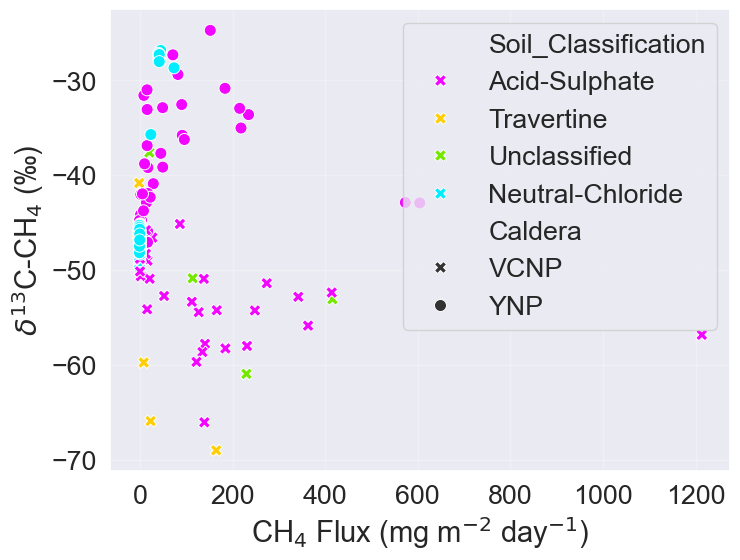

<Figure size 640x480 with 0 Axes>

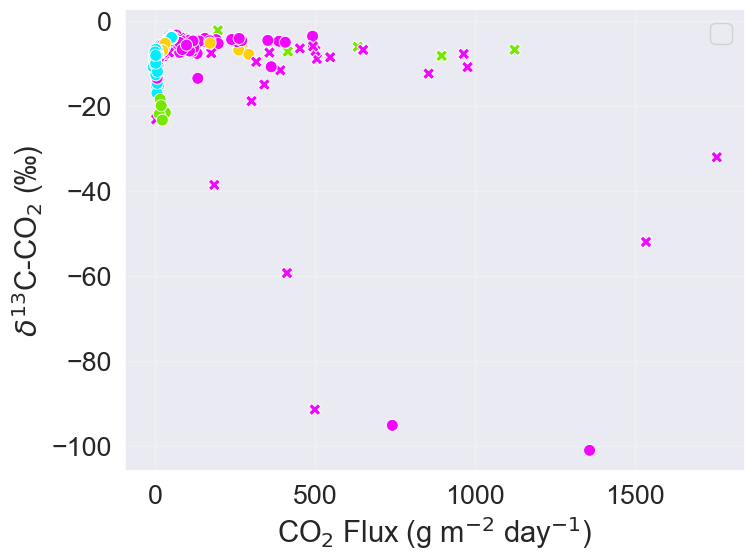

<Figure size 640x480 with 0 Axes>

In [224]:
# Scatter plot for d13C vs Fluxes
_markers_caldera = {"YNP":"o", "VCNP":"X"}
## CH4
plt.figure(figsize=(8,6))
ax = sns.scatterplot(x="CH4_Flux", y="d13CH4_source", data=df_all, s=75,
                     hue="Soil_Classification", palette="gist_ncar_r",
                     style="Caldera", markers=_markers_caldera)
ax.set(xlabel="CH$_4$ Flux (mg m$^{-2}$ day$^{-1}$)",
       ylabel="$\delta^{13}$C-CH$_4$ (‰)")
plt.show()
save_fig(plt, "../../figures/CH4_d13_flx_all.png")
## CO2
plt.figure(figsize=(8,6))
ax = sns.scatterplot(x="CO2_Flux", y="d13CO2_source", data=df_all, s=75,
                     hue="Soil_Classification", palette="gist_ncar_r",
                     style="Caldera", markers=_markers_caldera)
ax.set(xlabel="CO$_2$ Flux (g m$^{-2}$ day$^{-1}$)",
       ylabel="$\delta^{13}$C-CO$_2$ (‰)")
ax.legend("")
plt.show()
save_fig(plt, "../../figures/CO2_d13_flx_all.png")

#### Summary tables for fluxes conditional on δ13C values

In [225]:
print(df_all_iso_pos_only[(df_all_iso_pos_only["Caldera"]=="VCNP") &
                      (df_all_iso_pos_only["d13CO2_source"]<= -8)].shape)
print(df_all_iso_pos_only[(df_all_iso_pos_only["Caldera"]=="VCNP")&
                      (df_all_iso_pos_only["d13CO2_source"]>= -5)].shape)

(18, 35)
(6, 35)


In [226]:
df_all_iso_pos_only[(df_all_iso_pos_only["Caldera"]=="VCNP") &
                (df_all_iso_pos_only["d13CO2_source"]>=-5)][["CH4_Flux", "CO2_Flux"]].agg([np.mean, np.std])

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1645935958.py:2: FutureWarning: The provided callable <function mean at 0x107ad3920> is currently using Series.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  (df_all_iso_pos_only["d13CO2_source"]>=-5)][["CH4_Flux", "CO2_Flux"]].agg([np.mean, np.std])
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1645935958.py:2: FutureWarning: The provided callable <function std at 0x107ad3a60> is currently using Series.std. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "std" instead.
  (df_all_iso_pos_only["d13CO2_source"]>=-5)][["CH4_Flux", "CO2_Flux"]].agg([np.mean, np.std])


,CH4_Flux,CO2_Flux
mean,9.453830,101.543372
std,9.676143,58.168393


In [227]:
df_all_iso_pos_only[(df_all_iso_pos_only["Caldera"]=="YNP") &
                (df_all_iso_pos_only["d13CO2_source"]>=-5)][["CH4_Flux", "CO2_Flux"]].agg([np.mean, np.std])

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2856171271.py:2: FutureWarning: The provided callable <function mean at 0x107ad3920> is currently using Series.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  (df_all_iso_pos_only["d13CO2_source"]>=-5)][["CH4_Flux", "CO2_Flux"]].agg([np.mean, np.std])
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2856171271.py:2: FutureWarning: The provided callable <function std at 0x107ad3a60> is currently using Series.std. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "std" instead.
  (df_all_iso_pos_only["d13CO2_source"]>=-5)][["CH4_Flux", "CO2_Flux"]].agg([np.mean, np.std])


,CH4_Flux,CO2_Flux
mean,42.517847,125.377133
std,49.212948,110.322345


<>:9: SyntaxWarning: invalid escape sequence '\d'
<>:19: SyntaxWarning: invalid escape sequence '\d'
<>:9: SyntaxWarning: invalid escape sequence '\d'
<>:19: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/578648934.py:9: SyntaxWarning: invalid escape sequence '\d'
  ylabel="$\delta^{13}$C-CH$_4$ (‰)")
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/578648934.py:19: SyntaxWarning: invalid escape sequence '\d'
  ylabel="$\delta^{13}$C-CO$_2$ (‰)")


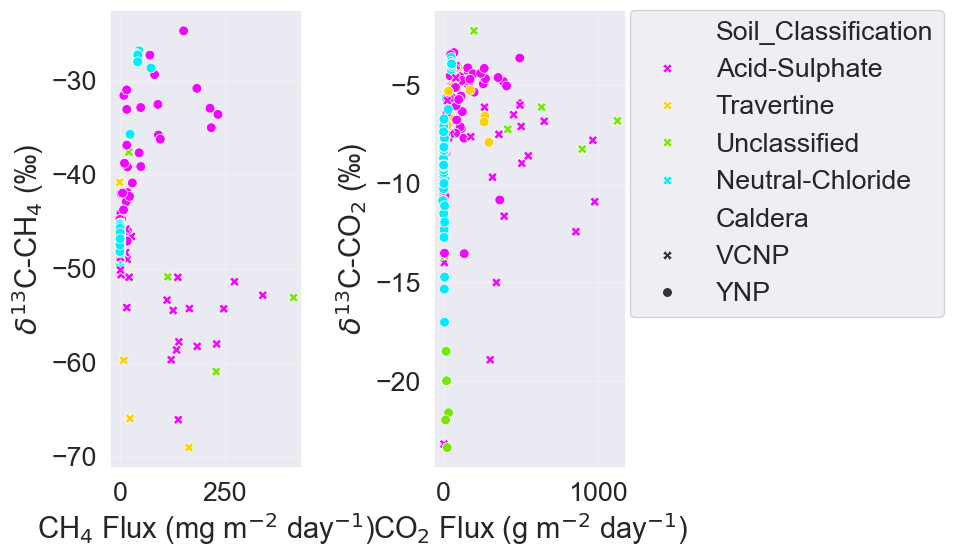

<Figure size 640x480 with 0 Axes>

In [228]:
plt.figure(figsize=(10,6))
## CH4
plt.subplot(1,2,1)
ax = plt.gca()
sns.scatterplot(x="CH4_Flux", y="d13CH4_source", data=df_all_iso_pos_only,
                hue="Soil_Classification", palette="gist_ncar_r", s=50,
                style="Caldera", markers=_markers_caldera)
ax.set(xlabel="CH$_4$ Flux (mg m$^{-2}$ day$^{-1}$)",
       ylabel="$\delta^{13}$C-CH$_4$ (‰)")
plt.legend([],[], frameon=False)

## CO2
plt.subplot(1,2,2)
ax = plt.gca()
sns.scatterplot(x="CO2_Flux", y="d13CO2_source", data=df_all_iso_pos_only,
                hue="Soil_Classification", palette="gist_ncar_r", s=50,
                style="Caldera", markers=_markers_caldera)
ax.set(xlabel="CO$_2$ Flux (g m$^{-2}$ day$^{-1}$)",
       ylabel="$\delta^{13}$C-CO$_2$ (‰)")
plt.legend(bbox_to_anchor=(1.02, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.show()
save_fig(plt, "../../figures/d13C_v_flx_pos_only.png")

Figure ##:

##### Errorbar plots for δ13C and fluxes

In [229]:
  # Create an errorbar function for plotting
def errplot(x, y, xerr, yerr, **kwargs):
    ax = plt.gca()
    data = kwargs.pop("data")
    data.plot(x=x, y=y, xerr=xerr, yerr=yerr,
              kind="scatter",
              s=60, edgecolor="k", linewidth=0.8,
              ax=ax, **kwargs)

<>:15: SyntaxWarning: invalid escape sequence '\d'
<>:15: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/618375494.py:15: SyntaxWarning: invalid escape sequence '\d'
  ylabel="$\delta^{13}$C-CH$_4$ (‰)")
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/618375494.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_iso_pos_only["CH4_Flux_err"] = \


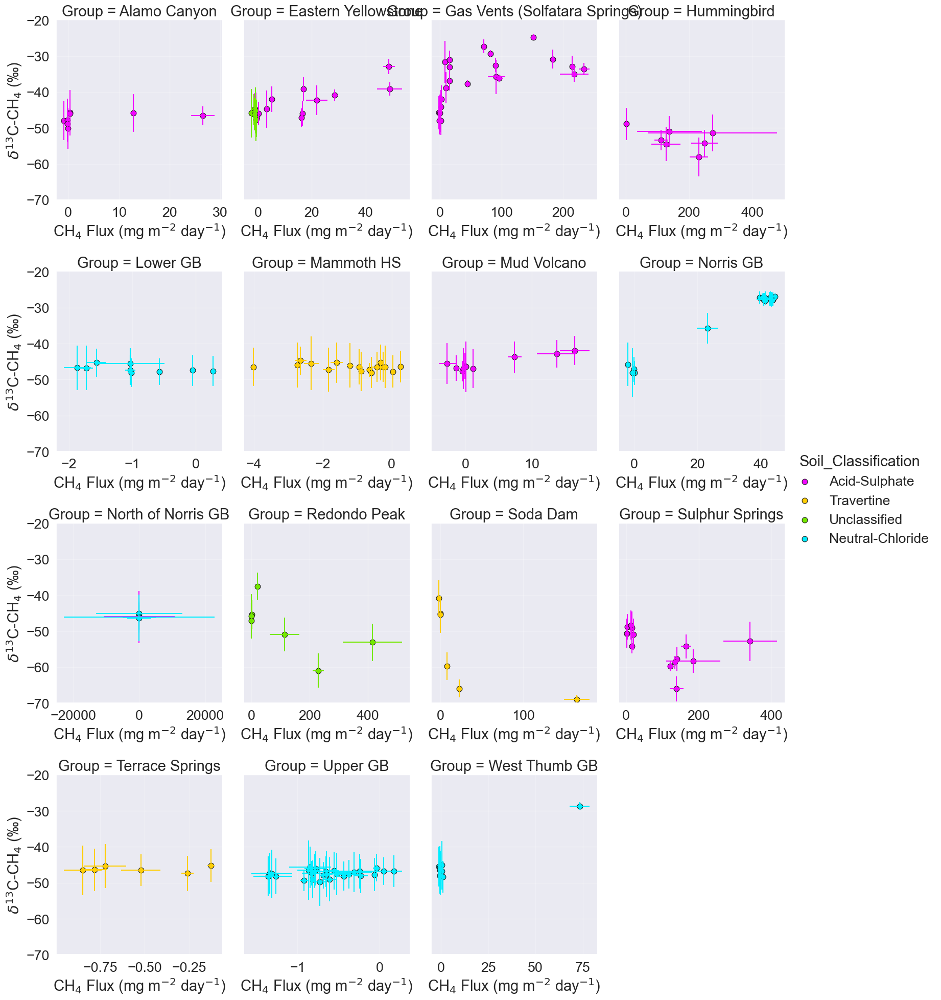

In [230]:
# Quantify error for the fluxes
## CH4 Flux err
df_all_iso_pos_only["CH4_Flux_err"] = \
df_all_iso_pos_only.UpperBound_CH4_Flux - df_all_iso_pos_only.LowerBound_CH4_Flux

## CH4
fg = sns.FacetGrid(df_all_iso_pos_only,
                   hue="Soil_Classification", palette="gist_ncar_r",
                   col="Group", col_wrap=4, height=5,aspect=0.8,
                   sharex=False)
fg.map_dataframe(errplot, x="CH4_Flux", y="d13CH4_source",
                 xerr="CH4_Flux_err", yerr="d13CH4_err")
fg.set(ylim=(-70,-20),
       xlabel="CH$_4$ Flux (mg m$^{-2}$ day$^{-1}$)",
       ylabel="$\delta^{13}$C-CH$_4$ (‰)")
fg.tight_layout()
fg.add_legend()
save_fig(plt, "../../figures/faceted_d13CH4_v_CH4_Flux")

<>:14: SyntaxWarning: invalid escape sequence '\d'
<>:14: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2665404095.py:14: SyntaxWarning: invalid escape sequence '\d'
  ylabel="$\delta^{13}$C-CO$_2$ (‰)")
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2665404095.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_iso_pos_only["CO2_Flux_err"] = \


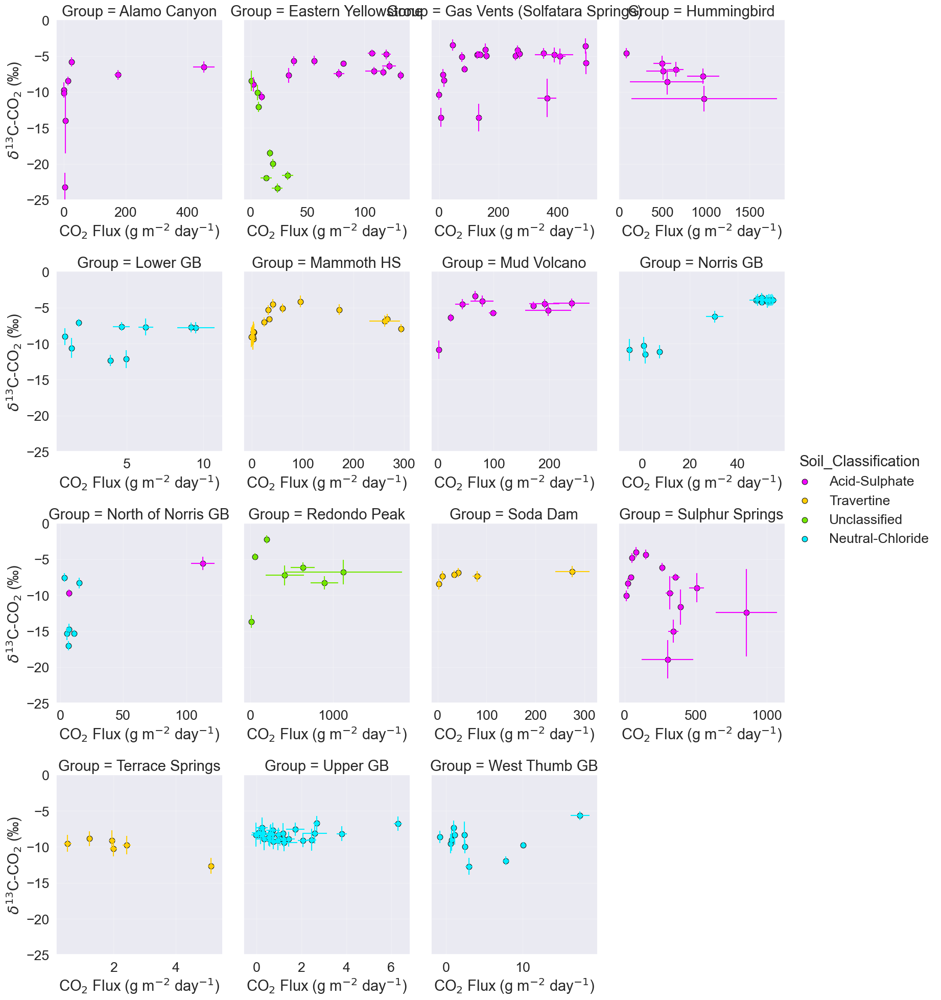

In [231]:
## CO2 Flux err
df_all_iso_pos_only["CO2_Flux_err"] = \
df_all_iso_pos_only.UpperBound_CO2_Flux - df_all_iso_pos_only.LowerBound_CO2_Flux

## CO2
fg = sns.FacetGrid(df_all_iso_pos_only,
                   hue="Soil_Classification", palette="gist_ncar_r",
                   col="Group", col_wrap=4, height=5,aspect=0.8,
                   sharex=False)
fg.map_dataframe(errplot, x="CO2_Flux", y="d13CO2_source",
                 xerr="CO2_Flux_err", yerr="d13CO2_err")
fg.set(ylim=(-25,0),
       xlabel="CO$_2$ Flux (g m$^{-2}$ day$^{-1}$)",
       ylabel="$\delta^{13}$C-CO$_2$ (‰)")
fg.tight_layout()
fg.add_legend()
save_fig(plt, "../../figures/faceted_d13CO2_v_CO2_Flux.png")

#### Assess the Distribution of Carbon Isotopes
Just like with the fluxes, analyze which distributions will best fit the carbon isotopic data.

Next, density (kernel density estimate, kde) plot is used to understand the shape of the distribution of isotopes.---likely bimodel that will show up in the GSA for both---

<>:21: SyntaxWarning: invalid escape sequence '\d'
<>:27: SyntaxWarning: invalid escape sequence '\d'
<>:51: SyntaxWarning: invalid escape sequence '\d'
<>:21: SyntaxWarning: invalid escape sequence '\d'
<>:27: SyntaxWarning: invalid escape sequence '\d'
<>:51: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1782841830.py:21: SyntaxWarning: invalid escape sequence '\d'
  x_var="$\delta^{13}$C-CH$_4$ (‰)",
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1782841830.py:27: SyntaxWarning: invalid escape sequence '\d'
  x_var="$\delta^{13}$C-CH$_4$(‰)",
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1782841830.py:51: SyntaxWarning: invalid escape sequence '\d'
  x_var="$\delta^{13}$C-CO$_2$(‰)",


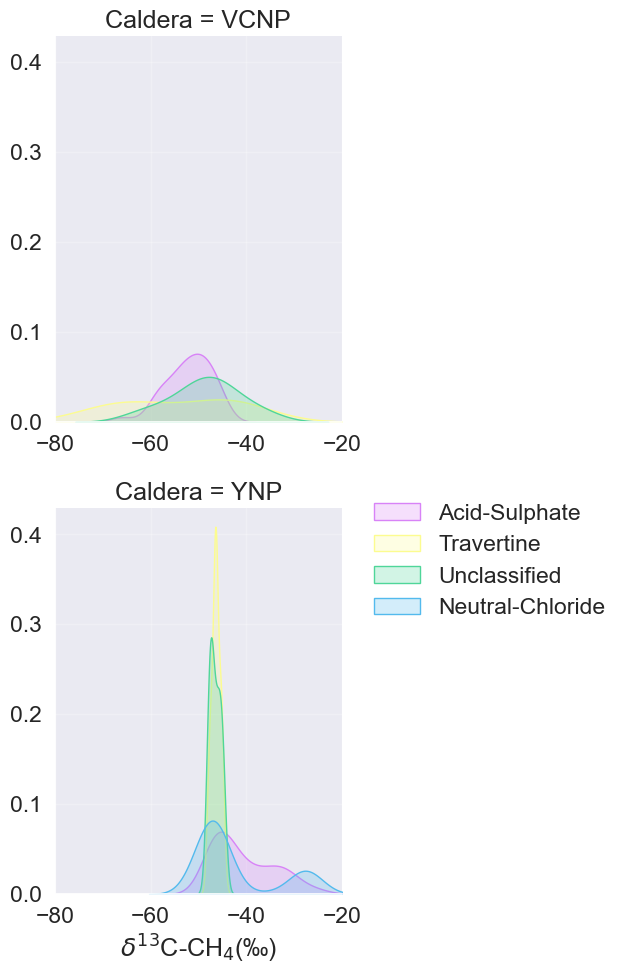

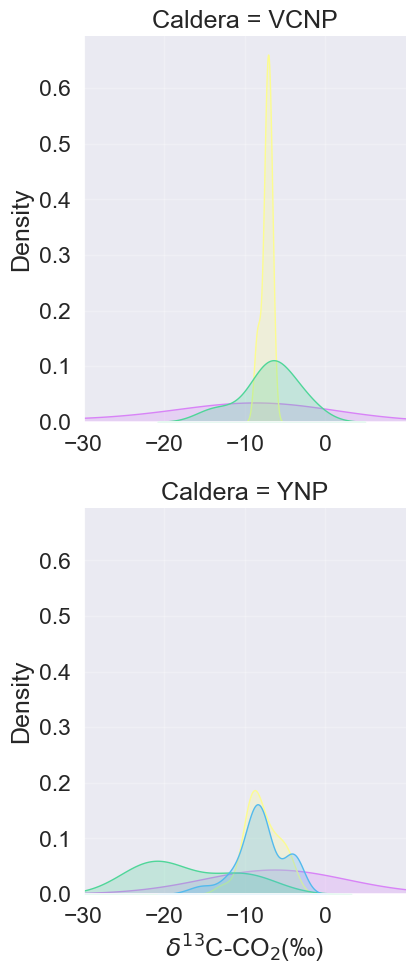

In [232]:
## δ13C-CH4: Comparisons between the caldera
sns.set(font_scale=1.5)
fg = sns.FacetGrid(
    df_all,
    hue="Soil_Classification",
    palette=_palette,
    row="Caldera",
    height=5,
    aspect=0.9,
    sharex=False,
    legend_out=True
)
fg.map_dataframe(
    sns.kdeplot,
    data=df_all,
    x="d13CH4_source",
    fill=True,
    legend=True
)
fg.set_axis_labels(
    x_var="$\delta^{13}$C-CH$_4$ (‰)",
    y_var="Density"
)
fg.set(xlim=(-80,-20))
fg.add_legend(title="",loc='upper left',bbox_to_anchor=(0.65,0.5))
fg.set_axis_labels(
    x_var="$\delta^{13}$C-CH$_4$(‰)",
    y_var=""
)
save_fig(plt, "../../figures/faceted_kde_d13CH4.png")


## δ13C-CO2: Comparisons between the caldera
fg = sns.FacetGrid(
    df_all,
    hue="Soil_Classification",
    palette=_palette,
    row="Caldera",
    height=5,
    aspect=0.9,
    sharex=False
)
fg.map_dataframe(
    sns.kdeplot,
    data=df_all,
    x="d13CO2_source",
    fill=True,
    legend=False
)
fg.set_axis_labels(
    x_var="$\delta^{13}$C-CO$_2$(‰)",
    y_var="Density"
)
fg.set(
    xlim=(-30,10),
    xticks=np.arange(-30,10,10)
)
save_fig(plt, "../../figures/faceted_kde_d13CO2.png")

Figure ##: Kernel Density Estimate (KDE) plots estimate the distribution of δ<sup>13</sup>C compositions arcoss both calderas. Each distribution has been separated by soil classification.

The KDE plots for δ<sup>13</sup>C compositions demonstrate overlap between the soil chemistry classes, except for the unclassified group for the δ<sup>13</sup>C-CO<sub>2</sub> measurements at YNP. Though overlap exists, δ<sup>13</sup>C-CH<sub>4</sub> compositions at YNP are bimodal for neutral-chloride and acid-sulphate. Both of these soil chemistry classes exhibit a peak near atmospheric composition (~ -47‰) and another peak near the heavier ratio of -35‰. It should be noted that the location of  the neutral-chloride heavy isotope composition is from 17 measurements at Steamboat Geyser, whereas the measurements from the acid-sulphate class are a variety of locations east of WTHB (e.g., GVNT and Eaastern Yellowstone).

The δ<sup>13</sup>C-CO<sub>2</sub> compositions were margibnally heaiver at YNP relative to VCNP. The exception to the overlap, the unclassified soil chemistry class at YNP, is centered near -22‰. These values represent the an altered patch but outside of the caldera rim and no signs of thermal activity. Effectively this cluser of unclassified measurements was made on an open meadow.

The classic paper by Whiticar (1999) communciated that the one method to separate CH<sub>4</sub> originating from depth indicating a thermal source, or produced in the shallow subsurface by microbial activity. Specifically,  CH<sub>4</sub> can be formed by oxidation of CO<sub>2</sub>. Comparing the δ<sup>13</sup>C-CO<sub>2</sub> to the δ<sup>13</sup>C-CH<sub>4</sub> compositions permits this analysis to be completed visually.

<>:38: SyntaxWarning: invalid escape sequence '\d'
<>:42: SyntaxWarning: invalid escape sequence '\d'
<>:38: SyntaxWarning: invalid escape sequence '\d'
<>:42: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/765128128.py:38: SyntaxWarning: invalid escape sequence '\d'
  xlabel="$\delta^{13}$C-CH$_4$ (‰)",
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/765128128.py:42: SyntaxWarning: invalid escape sequence '\d'
  ylabel="$\delta^{13}$C-CO$_2$ (‰)",


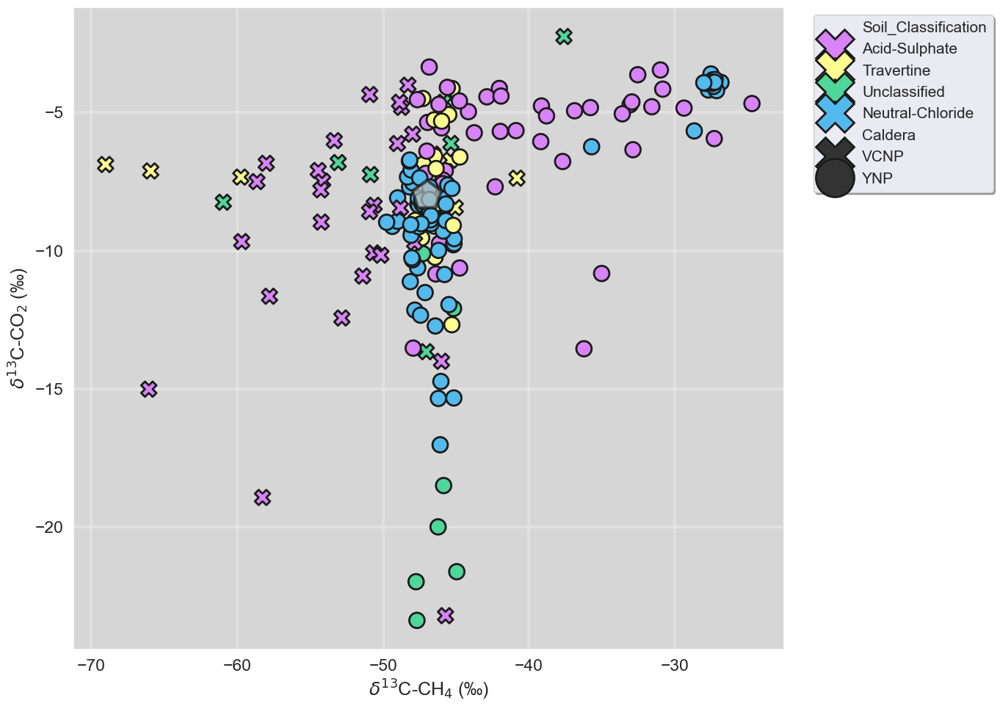

In [233]:
# create a palette
# _palette = dict(
#     zip(
#         df_all_iso_pos_only.Soil_Classification.unique(),
#         _palette
#       )
# )
# _palette["Neutral-Chloride"] = (111/255, 195/255, 237/255)
# ec_palette = df_all_iso_pos_only.Soil_Classification.map(_palette)

# Whiticar (1999) Plot
fig,ax = plt.subplots(figsize=(14,10))
kws={
  "s": 225,
  # "facecolor": "none",
  "linewidth": 2
}
sns.scatterplot(
    data=df_all_iso_pos_only,
    x="d13CH4_source",
    y="d13CO2_source",
    hue="Soil_Classification",
    style="Caldera",
    markers=_markers_caldera,
    palette=_palette,
    # fc="none",
    edgecolor="k",
    **kws,
    # linewidth=2,
    # s=180,
    ax=ax
)
ax.set(
    facecolor="#d6d6d6",
    alpha=0.5
)
ax.set_xlabel(
    xlabel="$\delta^{13}$C-CH$_4$ (‰)",
    fontsize=18
)
ax.set_ylabel(
    ylabel="$\delta^{13}$C-CO$_2$ (‰)",
    fontsize=18
)
ax.scatter(
    -47,
    -8,
    marker="p",
    s=900,
    facecolors="#b9bdba",
    alpha=0.7,
    edgecolors="k",
    linewidth=3
)
ax.grid(
    color="white",
    linestyle="-",
    linewidth=3
)
ax.legend(
    title="",
    fontsize=15,
    bbox_to_anchor=(1.03, 1),
    title_fontsize = 14,
    markerscale=2.5,
    shadow = True
)
plt.tight_layout()
plt.show()
save_fig(fig, "../../figures/Whiticar_Plot_d13CO2_v_d13CH4.png")

Figure ##: Scatterplot of δ<sup>13</sup>C compositions across both calderas.



<>:57: SyntaxWarning: invalid escape sequence '\d'
<>:62: SyntaxWarning: invalid escape sequence '\d'
<>:57: SyntaxWarning: invalid escape sequence '\d'
<>:62: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1998205262.py:57: SyntaxWarning: invalid escape sequence '\d'
  "$\delta^{13}$C-CH$_4$ (‰)",
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1998205262.py:62: SyntaxWarning: invalid escape sequence '\d'
  "$\delta^{13}$C-CO$_2$ (‰)",


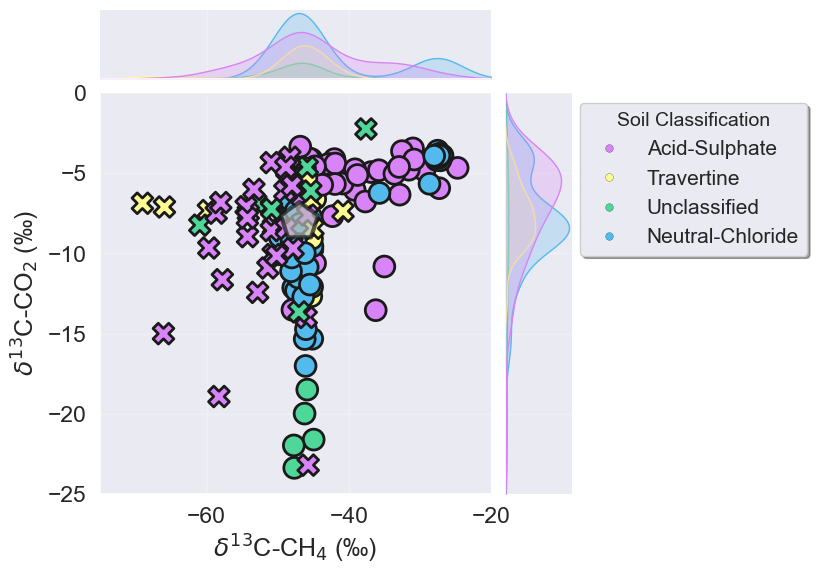

In [234]:
# Whiticar (1999) Plot
# fig,ax = plt.subplots(figsize=(14,10))
kws={
  "s": 225,
  # "facecolor": "none",
  "linewidth": 2
}

jp = sns.jointplot(
    data=df_all_iso_pos_only,
    x="d13CH4_source",
    y="d13CO2_source",
    hue="Soil_Classification",
    # style="Caldera",
    markers=".",
    palette=_palette,
    # fc="none",
    edgecolor="k",
    # **kws,
    s=5
)

yc = df_all_iso_pos_only[df_all_iso_pos_only["Caldera"] == "YNP"]
jp.ax_joint.scatter(
    data=yc,
    x="d13CH4_source",
    y="d13CO2_source",
    marker="o",
    c=yc["Soil_Classification"].map(_palette),
    edgecolor="k",
    **kws
)

vc = df_all_iso_pos_only[df_all_iso_pos_only["Caldera"] == "VCNP"]
jp.ax_joint.scatter(
    data=vc,
    x="d13CH4_source",
    y="d13CO2_source",
    marker="X",
    c=vc["Soil_Classification"].map(_palette),
    edgecolor="k",
    **kws
)

jp.ax_joint.scatter(
    -47,
    -8,
    marker="p",
    s=800,
    facecolors="#b9bdba",
    alpha=0.7,
    edgecolors="k",
    linewidth=3
)

jp.ax_joint.set_xlabel(
    "$\delta^{13}$C-CH$_4$ (‰)",
    fontsize=18
)

jp.ax_joint.set_ylabel(
    "$\delta^{13}$C-CO$_2$ (‰)",
    fontsize=18
)

jp.ax_joint.set_xlim(
    left=-75,
    right=-20
)

jp.ax_joint.set_ylim(
    bottom=-25,
    top=0
)

h, l = jp.ax_joint.get_legend_handles_labels()
jp.ax_joint.legend(
    h[0:4],
    l[0:4],
    title="Soil Classification",
    fontsize=15,
    bbox_to_anchor=(1.20, 1),
    title_fontsize = 14,
    markerscale=2.5,
    shadow = True
)

plt.show()
save_fig(fig, "../../figures/Whiticar_Plot_w_kde_d13CO2_v_d13CH4.png")

In [235]:
for k,v in _markers_sclf.items():
  print(k)

Acid-Sulphate
Travertine
Unclassified
Neutral-Chloride


<>:194: SyntaxWarning: invalid escape sequence '\d'
<>:199: SyntaxWarning: invalid escape sequence '\d'
<>:194: SyntaxWarning: invalid escape sequence '\d'
<>:199: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1685579918.py:194: SyntaxWarning: invalid escape sequence '\d'
  "$\delta^{13}$C-CH$_4$ (‰)",
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1685579918.py:199: SyntaxWarning: invalid escape sequence '\d'
  "$\delta^{13}$C-CO$_2$ (‰)",


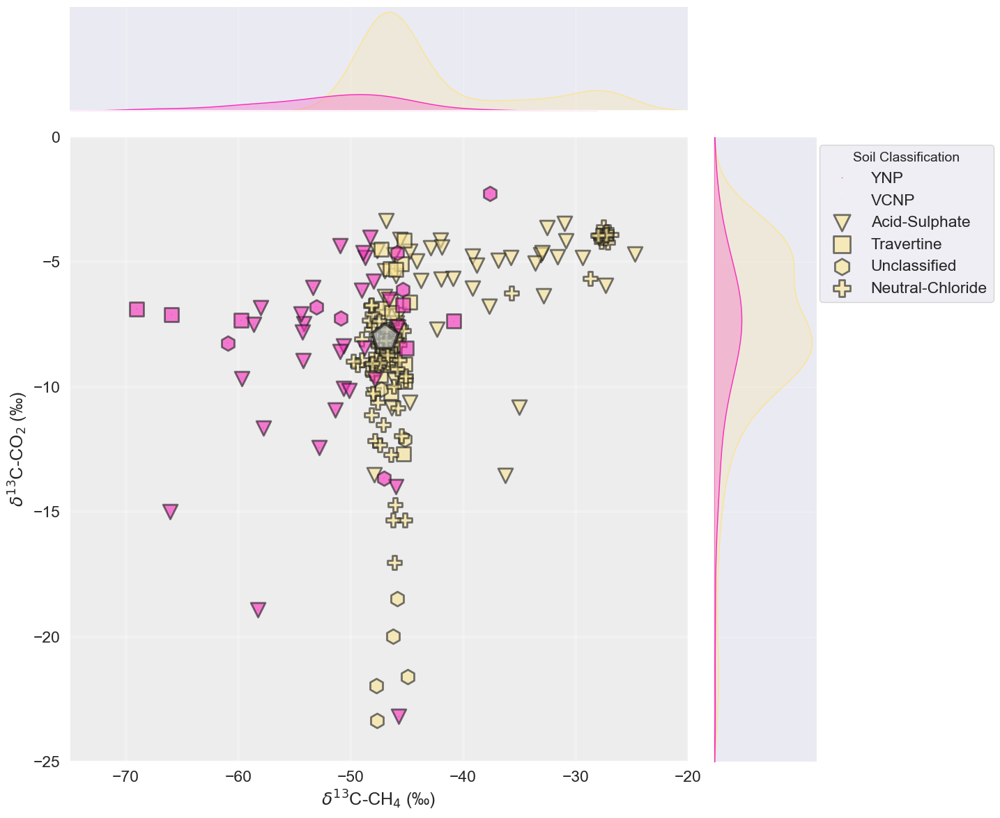

In [236]:
# Whiticar (1999) Plot
# fig,ax = plt.subplots(figsize=(14,10))
kws={
  "s": 225,
  # "facecolor": "none",
  "linewidth": 2
}

jp = sns.jointplot(
    data=df_all_iso_pos_only,
    x="d13CH4_source",
    y="d13CO2_source",
    hue="Caldera",
    markers=",",
    color="w",
    height=12,
    space=0.25,
    palette=_palette_calderas,
    marginal_kws={"fill":True},
    edgecolor="w",
    alpha=0.9,
    s=1
)

caldera = ["YNP", "VCNP"]

yc = df_all_iso_pos_only[df_all_iso_pos_only["Caldera"] == "YNP"]

for k,v in _markers_sclf.items():
  jp.ax_joint.scatter(
      data=yc[yc["Soil_Classification"]==k],
      x="d13CH4_source",
      y="d13CO2_source",
      marker=_markers_sclf[k],
      c=_palette_calderas["YNP"],
      edgecolor="k",
      alpha=0.6,
      **kws
  )

# for k,v in _palette.items():
#   jp.ax_marg_x.hist(
#       yc[yc["Soil_Classification"]==k]["d13CH4_source"],
#       bins=12,
#       alpha = 0.8,
#       color=_palette[k],
#       edgecolor="k",
#       range = (
#           np.min(yc[yc["Soil_Classification"]==k]["d13CH4_source"]),
#           np.max(yc[yc["Soil_Classification"]==k]["d13CH4_source"])
#       )
#   )

#   jp.ax_marg_y.hist(
#       yc[yc["Soil_Classification"]==k]["d13CO2_source"],

#       bins=12,orientation = 'horizontal',
#       color=_palette[k],
#       edgecolor="k",
#       alpha = 0.8,
#       range = (
#           np.min(yc[yc["Soil_Classification"]==k]["d13CO2_source"]),
#           np.max(yc[yc["Soil_Classification"]==k]["d13CO2_source"])
#       )
#   )


# jp.ax_marg_x.hist(
#     yc["d13CH4_source"],
#     alpha = 0.5
# )

# jp.ax_marg_y.hist(
#     yc["d13CO2_source"],
#     orientation = 'horizontal',
#     alpha = 0.5
# )

# jp.ax_marg_x.hist(
#     yc[yc["Caldera"]==caldera[0]]["d13CH4_source"],
#     bins=12,
#     alpha = 0.5,
#     color=_palette[k],
#     edgecolor="k",
#     linestyle="--",
#     range = (
#         np.min(yc[yc["Caldera"]==caldera[0]]["d13CH4_source"]),
#         np.max(yc[yc["Caldera"]==caldera[0]]["d13CH4_source"])
#     )
# )

# jp.ax_marg_y.hist(
#     yc[yc["Caldera"]==caldera[0]]["d13CO2_source"],

#     bins=12,orientation = 'horizontal',
#     color=_palette[k],
#     edgecolor="k",
#     linestyle="--",
#     alpha = 0.5,
#     range = (
#         np.min(yc[yc["Caldera"]==caldera[0]]["d13CO2_source"]),
#         np.max(yc[yc["Caldera"]==caldera[0]]["d13CO2_source"])
#     )
# )


vc = df_all_iso_pos_only[df_all_iso_pos_only["Caldera"] == "VCNP"]

for k,v in _markers_sclf.items():
  jp.ax_joint.scatter(
      data=vc[vc["Soil_Classification"]==k],
      x="d13CH4_source",
      y="d13CO2_source",
      marker=_markers_sclf[k],
      c=_palette_calderas["VCNP"],
      edgecolor="k",
      alpha=0.6,
      # fc="none",
      **kws
  )

# for k,v in _palette.items():
#   if k=="Neutral-Chloride":
#     continue

#   jp.ax_marg_x.hist(
#       vc[vc["Soil_Classification"]==k]["d13CH4_source"],
#       bins=12,
#       alpha = 0.5,
#       color=_palette[k],
#       edgecolor="k",
#       linestyle="--",
#       range = (
#           np.min(vc[vc["Soil_Classification"]==k]["d13CH4_source"]),
#           np.max(vc[vc["Soil_Classification"]==k]["d13CH4_source"])
#       )
#   )

#   jp.ax_marg_y.hist(
#       vc[vc["Soil_Classification"]==k]["d13CO2_source"],

#       bins=12,orientation = 'horizontal',
#       color=_palette[k],
#       edgecolor="k",
#       linestyle="--",
#       alpha = 0.5,
#       range = (
#           np.min(vc[vc["Soil_Classification"]==k]["d13CO2_source"]),
#           np.max(vc[vc["Soil_Classification"]==k]["d13CO2_source"])
#       )
#   )



# jp.ax_marg_x.hist(
#     vc[vc["Caldera"]==caldera[1]]["d13CH4_source"],
#     bins=12,
#     alpha = 0.5,
#     color="red",
#     edgecolor="k",
#     linestyle="--",
#     range = (
#         np.min(vc[vc["Caldera"]==caldera[1]]["d13CH4_source"]),
#         np.max(vc[vc["Caldera"]==caldera[1]]["d13CH4_source"])
#     )
# )

# jp.ax_marg_y.hist(
#     vc[vc["Caldera"]==caldera[1]]["d13CO2_source"],

#     bins=12,orientation = 'horizontal',
#     color="red",
#     edgecolor="k",
#     linestyle="-",
#     alpha = 0.5,
#     range = (
#         np.min(vc[vc["Caldera"]==caldera[1]]["d13CO2_source"]),
#         np.max(vc[vc["Caldera"]==caldera[1]]["d13CO2_source"])
#     )
# )

jp.ax_joint.scatter(
    -47,
    -8,
    marker="p",
    s=800,
    facecolors="#b9bdba",
    alpha=0.7,
    edgecolors="k",
    linewidth=3
)

jp.ax_joint.set_xlabel(
    "$\delta^{13}$C-CH$_4$ (‰)",
    fontsize=18
)

jp.ax_joint.set_ylabel(
    "$\delta^{13}$C-CO$_2$ (‰)",
    fontsize=18
)

jp.ax_joint.set(
    facecolor="#ededed",
    alpha=0.5
)

jp.ax_joint.grid(
    color="white",
    linestyle="-",
    linewidth=3
)

jp.ax_joint.set_xlim(
    left=-75,
    right=-20
)

jp.ax_joint.set_ylim(
    bottom=-25,
    top=0
)

han, lab = jp.ax_joint.get_legend_handles_labels()

lab = [
    "YNP",
    "VCNP",
    "Acid-Sulphate",
    "Travertine",
    "Unclassified",
    "Neutral-Chloride"
]
jp.ax_joint.legend(
    han[0:6],
    lab[0:6],
    title="Soil Classification",
    fontsize=15,
    bbox_to_anchor=(1.20, 1),
    title_fontsize = 14,
    markerscale=2.5,
    shadow = True
)
sns.move_legend(
    jp.ax_joint,
    loc="upper left",
    bbox_to_anchor=(1.20, 1),
    markerscale=0.45
)
plt.show()

save_fig(jp, "../../figures/Whiticar_Plot_d13CO2_v_d13CH4_by_caldera.png")

In [237]:
from matplotlib.patches import Patch
import matplotlib.lines as mlines
rect1 = mlines.Line2D([], [], marker="s", markersize=30, linewidth=0, color="r")
han[3] = Patch(facecolor='white', edgecolor='red', hatch='ooo')

### Intra-Caldera Carbon Isotope Compositions

#### Differences in Carbon Isotope Composition between Soil Chemistry Groups

In this section, the statistical relationships are computed between the measured carbon isotope compositions within each caldera with the soil chemistry groups being the dependent variable.

##### KS Test

In [238]:
# Set up the dataframe to receive results
df_KS_rslts_sclf_d13CH4_YC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "ks_stat_d13CH4",
        "pval_d13CH4",
        "ks_stat_d13CO2",
        "pval_d13CO2"
      ],
    index=range(4)
  )

# Loop through each soil type and check for normality
for i in range(4):
  #---YNP---#
  # Gather Soil Classification
  df_KS_rslts_sclf_d13CH4_YC.loc[i]["Soil_Classification"] = \
  gb_sclf_YC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KS_rslts_sclf_d13CH4_YC.loc[i]["Caldera"] = \
  gb_sclf_YC[i].Caldera.iloc[0]
  # Run KS Test - CH4
  ks_stat, pval = kstest_normal(gb_sclf_YC[i].d13CH4_source.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_sclf_d13CH4_YC.loc[i]["ks_stat_d13CH4"] = ks_stat
  ## pval
  df_KS_rslts_sclf_d13CH4_YC.loc[i]["pval_d13CH4"] = pval
  # Run KS Test - CO2
  ks_stat, pval = kstest_normal(gb_sclf_YC[i].d13CO2_source.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_sclf_d13CH4_YC.loc[i]["ks_stat_d13CO2"] = ks_stat
  ## pval
  df_KS_rslts_sclf_d13CH4_YC.loc[i]["pval_d13CO2"] = pval

# export results to `.csv`
df_KS_rslts_sclf_d13CH4_YC.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/ks_results_sclf_d13C_yc.csv",
    index=False
)

# view results
df_KS_rslts_sclf_d13CH4_YC

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3459912914.py:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_KS_rslts_sclf_d13CH4_YC.loc[i]["Soil_Classification"] = \
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipy

,Soil_Classification,Caldera,ks_stat_d13CH4,pval_d13CH4,ks_stat_d13CO2,pval_d13CO2
0,Acid-Sulphate,YNP,0.172138,0.001,0.40293,0.001
1,Neutral-Chloride,YNP,0.384758,0.001,0.123056,0.013323
2,Travertine,YNP,0.186272,0.039334,0.152825,0.186753
3,Unclassified,YNP,0.249351,0.166336,0.224551,0.284772


In [239]:
len(gb_sclf_VC)

3

In [240]:
# Set up the dataframe to receive results
df_KS_rslts_sclf_d13CH4_VC = pd.DataFrame(
    columns=[
        "Soil_Classification",
        "Caldera",
        "ks_stat_d13CH4",
        "pval_d13CH4",
        "ks_stat_d13CO2",
        "pval_d13CO2"
      ],
    index=range(3)
  )

# Loop through each soil type and check for normality
for i in range(3):
  #---VC---#
  # Gather Soil Classification
  df_KS_rslts_sclf_d13CH4_VC.loc[i]["Soil_Classification"] = \
  gb_sclf_VC[i].Soil_Classification.iloc[0]
  # Gather Caldera
  df_KS_rslts_sclf_d13CH4_VC.loc[i]["Caldera"] = \
  gb_sclf_VC[i].Caldera.iloc[0]
  # Run KS Test - CH4
  ks_stat, pval = kstest_normal(gb_sclf_VC[i].d13CH4_source.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_sclf_d13CH4_VC.loc[i]["ks_stat_d13CH4"] = ks_stat
  ## pval
  df_KS_rslts_sclf_d13CH4_VC.loc[i]["pval_d13CH4"] = pval
  # Run KS Test - CO2
  ks_stat, pval = kstest_normal(gb_sclf_VC[i].d13CO2_source.dropna())
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_sclf_d13CH4_VC.loc[i]["ks_stat_d13CO2"] = ks_stat
  ## pval
  df_KS_rslts_sclf_d13CH4_VC.loc[i]["pval_d13CO2"] = pval

# export results to `.csv`
df_KS_rslts_sclf_d13CH4_VC.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/ks_results_sclf_d13C_vc.csv",
    index=False
)

# view results
df_KS_rslts_sclf_d13CH4_VC

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3519185945.py:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_KS_rslts_sclf_d13CH4_VC.loc[i]["Soil_Classification"] = \
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipy

,Soil_Classification,Caldera,ks_stat_d13CH4,pval_d13CH4,ks_stat_d13CO2,pval_d13CO2
0,Acid-Sulphate,VCNP,0.100494,0.51789,0.313034,0.001
1,Travertine,VCNP,0.270764,0.202512,0.292033,0.119843
2,Unclassified,VCNP,0.181351,0.695071,0.218568,0.414575


##### FK Test

The Fligner-Killeen test provides information on whether the compared groups are of equal variance. The null hypothesis is that all groups of comparison are of equal variance. When this test fails, the alternative indicates that there is a significant difference between the variances between the compared groups.

In [241]:
# Test YNP
## CH4
fk_stat_d13ch4, pval_d13ch4 = fligner(
    gb_sclf_YC[0].d13CH4_source,
    gb_sclf_YC[1].d13CH4_source,
    gb_sclf_YC[2].d13CH4_source,
    gb_sclf_YC[3].d13CH4_source
  )
print("After applying the FK test to the YNP CH4 d13C data, \nthe FK stat is {:.2f} and the p-value is {:.3e}\n".format(fk_stat_d13ch4, pval_d13ch4))
## CO2
fk_stat_d13co2, pval_d13co2 = fligner(
    gb_sclf_YC[0].d13CO2_source,
    gb_sclf_YC[1].d13CO2_source,
    gb_sclf_YC[2].d13CO2_source,
    gb_sclf_YC[3].d13CO2_source
  )
print("After applying the FK test to the YNP d13C data, \nthe FK stat is {:.2f} and the p-value is {:.3e}\n".format(fk_stat_d13co2, pval_d13co2))

# consolidate results into a dataframe
df_FK_rslts_sclf_flux_d13C_yc = pd.DataFrame(
    {
      "fk_stat_ch4":fk_stat_d13ch4,
      "pval_ch4":pval_d13ch4,
      "fk_stat_co2":fk_stat_d13co2,
      "pval_co2":pval_d13co2
    },
    index=range(1)
)

# export results to a `.csv`
df_FK_rslts_sclf_flux_d13C_yc.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/fk_results_sclf_d13C_yc.csv",
    index=False
)

After applying the FK test to the YNP CH4 d13C data, 
the FK stat is 23.30 and the p-value is 3.498e-05

After applying the FK test to the YNP d13C data, 
the FK stat is 8.12 and the p-value is 4.358e-02



In [242]:
# Test VCNP
## CH4
fk_stat_d13ch4, pval_d13ch4 = fligner(
    gb_sclf_VC[0].d13CH4_source,
    gb_sclf_VC[1].d13CH4_source,
    gb_sclf_VC[2].d13CH4_source,
  )
print("After applying the FK test to the VCNP CH4 d13C data, \nthe FK stat is {:.2f} and the p-value is {:.3e}\n".format(fk_stat_d13ch4, pval_d13ch4))
## CO2
fk_stat_d13co2, pval_d13co2 = fligner(
    gb_sclf_VC[0].d13CO2_source,
    gb_sclf_VC[1].d13CO2_source,
    gb_sclf_VC[2].d13CO2_source,
  )
print("After applying the FK test to the VCNP d13C data, \nthe FK stat is {:.2f} and the p-value is {:.3e}\n".format(fk_stat_d13co2, pval_d13co2))

# consolidate results into a dataframe
df_FK_rslts_sclf_flux_d13C_vc = pd.DataFrame(
    {
      "fk_stat_ch4":fk_stat_d13ch4,
      "pval_ch4":pval_d13ch4,
      "fk_stat_co2":fk_stat_d13co2,
      "pval_co2":pval_d13co2
    },
    index=range(1)
)

# export results to a `.csv`
df_FK_rslts_sclf_flux_d13C_vc.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/fk_results_sclf_d13C_vc.csv",
    index=False
)

After applying the FK test to the VCNP CH4 d13C data, 
the FK stat is 14.25 and the p-value is 8.034e-04

After applying the FK test to the VCNP d13C data, 
the FK stat is 8.64 and the p-value is 1.332e-02



The results of the FK test show that the carbon isotopes for the CO2 ($p = 0.044$) and CH4 ($p < 0.001$) measurements rejected the null hypothesis and at least one of the groups has a variance that is unequal to one or more of the others. The signicance of these results indicate that non-parametric test will need to be applied to understand if there are significant differences between the carbon isotope compositions across the soil chemistry classes for both gases.

##### KW Test

In [243]:
for data in gb_sclf_YC:
  print(
      "The median d13CH4 composition is {:.3f} per mil for the {} soil class".format(np.median(data.d13CH4_source), data.Soil_Classification.iloc[0])
  )

  print(
      "The median d13CO2 composition is {:.3f} per mil for the {} soil class\n".format(np.median(data.d13CO2_source), data.Soil_Classification.iloc[0])
  )

The median d13CH4 composition is -42.874 per mil for the Acid-Sulphate soil class
The median d13CO2 composition is -5.655 per mil for the Acid-Sulphate soil class

The median d13CH4 composition is -46.564 per mil for the Neutral-Chloride soil class
The median d13CO2 composition is -8.261 per mil for the Neutral-Chloride soil class

The median d13CH4 composition is -46.469 per mil for the Travertine soil class
The median d13CO2 composition is -8.348 per mil for the Travertine soil class

The median d13CH4 composition is -46.750 per mil for the Unclassified soil class
The median d13CO2 composition is -19.239 per mil for the Unclassified soil class



In [244]:
for data in gb_sclf_VC:
  print(
      "The median d13CH4 composition is {:.3f} per mil for the {} soil class".format(np.median(data.d13CH4_source), data.Soil_Classification.iloc[0])
  )

  print(
      "The median d13CO2 composition is {:.3f} per mil for the {} soil class\n".format(np.median(data.d13CO2_source), data.Soil_Classification.iloc[0])
  )

The median d13CH4 composition is -51.155 per mil for the Acid-Sulphate soil class
The median d13CO2 composition is -8.775 per mil for the Acid-Sulphate soil class

The median d13CH4 composition is -52.560 per mil for the Travertine soil class
The median d13CO2 composition is -7.225 per mil for the Travertine soil class

The median d13CH4 composition is -47.038 per mil for the Unclassified soil class
The median d13CO2 composition is -6.811 per mil for the Unclassified soil class



In [245]:
# d13CH4 across soil chemistry classes at YNP
kw_stat_d13ch4, pval_d13ch4 = kruskal(
    gb_sclf_YC[0].d13CH4_source,
    gb_sclf_YC[1].d13CH4_source,
    gb_sclf_YC[2].d13CH4_source,
    gb_sclf_YC[3].d13CH4_source,
    nan_policy="omit"
  )
print("After applying the KW test to the YNP d13CH4 data across soil chemistry \nclasses, the KW stat is {:.2f} and the p-value is {:.3e}".format(kw_stat_d13ch4, pval_d13ch4))

# d13CO2 across soil chemistry classes at YNP
kw_stat_d13co2, pval_d13co2 = kruskal(
    gb_sclf_YC[0].d13CO2_source,
    gb_sclf_YC[1].d13CO2_source,
    gb_sclf_YC[2].d13CO2_source,
    gb_sclf_YC[3].d13CO2_source,
    nan_policy="omit"
  )
print("After applying the KW test to the YNP d13CO2 data across soil chemistry \nclasses, the KW stat is {:.2f} and the p-value is {:.3e}".format(kw_stat_d13co2, pval_d13co2))


# consolidate results into a dataframe
df_KW_rslts_sclf_d13c_yc = pd.DataFrame(
    {
      "kw_stat_ch4":kw_stat_d13ch4,
      "pval_ch4":pval_d13ch4,
      "kw_stat_co2":kw_stat_d13co2,
      "pval_co2":pval_d13co2
    },
    index=range(1)
)

# export results to a `.csv`
df_KW_rslts_sclf_d13c_yc.to_csv(
    "../../pertinent-data/inferential-stats-output/yellowstone/kw_results_sclf_d13yc.csv",
    index=False
)

After applying the KW test to the YNP d13CH4 data across soil chemistry 
classes, the KW stat is 18.44 and the p-value is 3.571e-04
After applying the KW test to the YNP d13CO2 data across soil chemistry 
classes, the KW stat is 23.65 and the p-value is 2.950e-05


In [246]:
# d13CH4 across soil chemistry classes at VCNP
kw_stat_d13ch4, pval_d13ch4 = kruskal(
    gb_sclf_VC[0].d13CH4_source,
    gb_sclf_VC[1].d13CH4_source,
    gb_sclf_VC[2].d13CH4_source,
    nan_policy="omit"
  )
print("After applying the KW test to the VCNP d13CH4 data across soil chemistry \nclasses, the KW stat is {:.2f} and the p-value is {:.3e}".format(kw_stat_d13ch4, pval_d13ch4))

# d13CO2 across soil chemistry classes at VCNP
kw_stat_d13co2, pval_d13co2 = kruskal(
    gb_sclf_VC[0].d13CO2_source,
    gb_sclf_VC[1].d13CO2_source,
    gb_sclf_VC[2].d13CO2_source,
    nan_policy="omit"
  )
print("After applying the KW test to the VCNP d13CO2 data across soil chemistry \nclasses, the KW stat is {:.2f} and the p-value is {:.3e}".format(kw_stat_d13co2, pval_d13co2))


# consolidate results into a dataframe
df_KW_rslts_sclf_d13c_vc = pd.DataFrame(
    {
      "kw_stat_ch4":kw_stat_d13ch4,
      "pval_ch4":pval_d13ch4,
      "kw_stat_co2":kw_stat_d13co2,
      "pval_co2":pval_d13co2
    },
    index=range(1)
)

# export results to a `.csv`
df_KW_rslts_sclf_d13c_vc.to_csv(
    "../../pertinent-data/inferential-stats-output/valles/kw_results_sclf_d13C_vc.csv",
    index=False
)

After applying the KW test to the VCNP d13CH4 data across soil chemistry 
classes, the KW stat is 1.75 and the p-value is 4.167e-01
After applying the KW test to the VCNP d13CO2 data across soil chemistry 
classes, the KW stat is 5.02 and the p-value is 8.114e-02


#### Post-Hoc Analysis

##### Conover-Imam Test

Post-hoc analysis to see which groups are significantly different from each other.

<>:34: SyntaxWarning: invalid escape sequence '\d'
<>:64: SyntaxWarning: invalid escape sequence '\d'
<>:34: SyntaxWarning: invalid escape sequence '\d'
<>:64: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3355947291.py:34: SyntaxWarning: invalid escape sequence '\d'
  "$\delta^{13}CH_{4}$ Across Soil Chemistry Classes - YNP"
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3355947291.py:64: SyntaxWarning: invalid escape sequence '\d'
  "$\delta^{13}CO_{2}$ Across Soil Chemistry Classes - YNP"


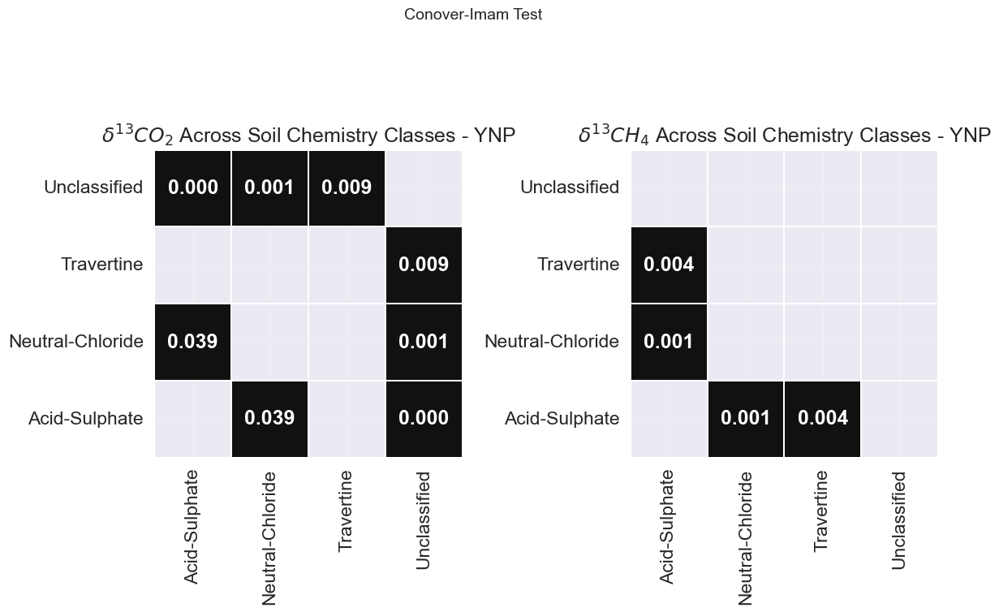

In [247]:
# Conover-Imam test for CH4 at YNP across soil chemistry classes

# Create heatmap
fig, ax = plt.subplots(1,2, figsize=(12,8))
ax = ax.flatten()

# d13CH4 v Soil Class - YNP
conover_d13CH4_sclf_YNP = conover(
    df_YC_all,
    val_col="d13CH4_source",
    group_col="Soil_Classification",
    p_adjust="bonferroni",
    sort=True
  )

sns.heatmap(
    conover_d13CH4_sclf_YNP,
    linewidths=0.35,
    # cmap="Greys_r",
    cmap=bk_wt_cmap,
    vmin=0.05,
    vmax=1.0,
    mask=conover_d13CH4_sclf_YNP > 0.05,
    square=True,
    fmt=".3f",
    annot=True,
    annot_kws={"color":"white", "weight":"bold"},
    cbar=False,
    cbar_kws={"label":"p-value"},
    ax=ax[1]
  )
ax[1].invert_yaxis()
ax[1].set_title(
    "$\delta^{13}CH_{4}$ Across Soil Chemistry Classes - YNP"
)

# d13CO2 v Soil Class - YNP
conover_d13CO2_sclf_YNP = conover(
    df_YC_all,
    val_col="d13CO2_source",
    group_col="Soil_Classification",
    p_adjust="bonferroni",
    sort=True
  )

sns.heatmap(
    conover_d13CO2_sclf_YNP,
    linewidths=0.35,
    # cmap="Greys_r",
    cmap=bk_wt_cmap,
    vmin=0.05,
    vmax=1.0,
    mask=conover_d13CO2_sclf_YNP > 0.05,
    square=True,
    fmt=".3f",
    annot=True,
    annot_kws={"color":"white", "weight":"bold"},
    cbar=False,
    cbar_kws={"label":"p-value"},
    ax=ax[0]
  )
ax[0].invert_yaxis()
ax[0].set_title(
    "$\delta^{13}CO_{2}$ Across Soil Chemistry Classes - YNP"
)


plt.suptitle("Conover-Imam Test", fontsize=14)
plt.tight_layout()
plt.show()

save_fig(fig, "../../figures/conover_d13C_v_soil-class_YNP.png")

The results of the Conover-Iman test demonstrate that the d13C-CO2 measurements collected from the acid-sulphate areas are significantly different than than the neutral-chloride ($p = 0.039$) and unclassified ($p < 0.001$) regions. The travertine measurements appear to only be significantly different than the unclassified regime ($p = 0.009$).

For the d13-CH4 measurements, the results are simipler. The acid-sulphate group is significantly different that the neutral-chloride ($p = 0.001$) and the travertine sites ($p = 0.004$). Unlike with d13C-CO2, the unclassified chemistry class showed significance when compared with all three named classes.

### Bergfeld et al. 2014

To assess the degree of similarity between the diffuse gases and the gases escaping from point sources, these components are compared in this section through regression. The variation in the carbon isotopes of the diffuse fluxes is modeled by the variation in the isotope compositions from the point source gases.

Full Model used:\
$δ^{13}$C-CO$_2$ (CRDS-AC) ~ $δ^{13}$C-CO$_2$ (Bergfeld) + Xg + $\frac{CO_2}{CH_4}$ + Temperature + Feature Type \

Though the full model was used to perform a multilinear regression, all other combinations of the explanatory variables were also assessed by using a modified grid scearch. This modified grid search of explanatory variables resulted in 31 different regressions for each dataset. Only datasets with five or more samples for each group collected by Bergfeld were considered for these regressions. Thus, only Upper and Lower GB, Norris GB, Gas Vents (Solfatara Springs), Mud Volcano, and Eastern Yellowstone were examined in this exercise.

In [248]:
# Import Bergfeld dataset
## Programmatically Upload file from local drive
# Import file into workspace
df_Bergfeld_YC = pd.read_excel(
    "../../pertinent-data/other-data/YNP_Gas_Waters_REVISED_Bergfeld_all.xlsx",
    sheet_name="Table 1",
    header=0,
    na_values=[9999, 9999.0]
)

##### Preprocessing Point Emission Source Data
This group of cells prepares the data to be lobbed into a regression for analysis later in this section

In [249]:
# Quick clean to prepare it further preprocessing
## Drop row of units
df_Bergfeld_YC.drop(0, axis=0, inplace=True)
## Reset index
df_Bergfeld_YC.reset_index(drop=True, inplace=True)

# Convert Group Number to Group string (category)
## Create an empty series to receive the new groups
grp = pd.Series(index=range(len(df_Bergfeld_YC.Group)))
## Create an empty series to receive the new numeric features
### 1 = Fry; 2 = Fum.; 3 = Pool_g; 4 = Seep; 5 = S.G.
feat = pd.Series(index=range(len(df_Bergfeld_YC.Group)))
for i in range(len(df_Bergfeld_YC.Group)):
  if df_Bergfeld_YC.Group.iloc[i] == 20.0:
    grp[i] = "Highland Hot Springs"
  elif df_Bergfeld_YC.Group.iloc[i] == 19.0:
    grp[i] = "Shoshone"
  elif df_Bergfeld_YC.Group.iloc[i] == 18.0:
    grp[i] = "Gibbon River Basins"
  elif df_Bergfeld_YC.Group.iloc[i] == 17.0:
    grp[i] = "North of Norris GB"
  elif df_Bergfeld_YC.Group.iloc[i] == 16.0:
    grp[i] = "Snake River Hot Spring"
  elif df_Bergfeld_YC.Group.iloc[i] == 15.0:
    grp[i] = "Upper GB"
  elif df_Bergfeld_YC.Group.iloc[i] == 14.0:
    grp[i] = "Mud Volcano"
  elif df_Bergfeld_YC.Group.iloc[i] == 13.0:
    grp[i] = "West Thumb GB"
  elif df_Bergfeld_YC.Group.iloc[i] == 12.0:
    grp[i] = "Smoke-jumper Hot Springs"
  elif df_Bergfeld_YC.Group.iloc[i] == 11.0:
    grp[i] = "Eastern Yellowstone"
  elif df_Bergfeld_YC.Group.iloc[i] == 10.0:
    grp[i] = "Gas Vents (Solfatara Springs)"
  elif df_Bergfeld_YC.Group.iloc[i] == 9.0:
    grp[i] = "Brimstone Basin"
  elif df_Bergfeld_YC.Group.iloc[i] == 8.0:
    grp[i] = "Norris GB"
  elif df_Bergfeld_YC.Group.iloc[i] == 7.0:
    grp[i] = "Terrace Springs"
  elif df_Bergfeld_YC.Group.iloc[i] == 6.0:
    grp[i] = "Roaring Mountain"
  elif df_Bergfeld_YC.Group.iloc[i] == 5.0:
    grp[i] = "Forest Springs"
  elif df_Bergfeld_YC.Group.iloc[i] == 4.0:
    grp[i] = "Mammoth HS"
  elif df_Bergfeld_YC.Group.iloc[i] == 3.0:
    grp[i] = "Lower GB"
  elif df_Bergfeld_YC.Group.iloc[i] == 2.0:
    grp[i] = "Washburn Hot Springs"
  elif df_Bergfeld_YC.Group.iloc[i] == 1.0:
    grp[i] = "Misc."
  else:
    grp[i] = "NaN"
## Convert Features (e.g., Pool_g, Fum., Fry) into numerical values
  if df_Bergfeld_YC.Feature.iloc[i] == "Fry":
    feat[i] = 1
  elif df_Bergfeld_YC.Feature.iloc[i] == "Fum.":
    feat[i] = 2
  elif df_Bergfeld_YC.Feature.iloc[i] == "Pool_g":
    feat[i] = 3
  elif df_Bergfeld_YC.Feature.iloc[i] == "Seep":
    feat[i] = 4
  elif df_Bergfeld_YC.Feature.iloc[i] == "S.G.":
    feat[i] = 5
  else:
    feat[i] = np.nan
## Rename "Group" to "Group_num"
df_Bergfeld_YC.rename(columns={"Group":"Group_num"}, inplace=True)
## Insert grp into the Bergfeld dataframe
df_Bergfeld_YC.insert(3, "Group", grp)
## Insert feat into the Bergfeld dataframe
df_Bergfeld_YC.insert(7, "Feature_num", feat)

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3368741680.py:25: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Upper GB' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  grp[i] = "Upper GB"


In [250]:
# Establish proper datatypes
Berfeld_corrected_dtypes = {
    "Feature":"category",
    "Temperature":"float",
    "Easting":"float",
    "Northing":"float",
    "Xg":"float",
    "CO2":"float",
    "H2S":"float",
    "NH3":"float",
    "He":"float",
    "H2":"float",
    "N2":"float",
    "CH4":"float",
    "C2H6":"float",
    "CO":"float",
    "C3H8":"float",
    "C4H10":"float",
    "C5H12":"float",
    "d13C-CO2 (C)":"float",
    "d13C-CO2 (E)":"float",
    "d13C-CH4":"float",
    "dDs":"float",
    "d18Os":"float"
}
## Set the datatype
df_Bergfeld_YC = df_Bergfeld_YC.astype(Berfeld_corrected_dtypes)

In [251]:
# Collect the fluxes and isotopes from the Picarro dataset
#df_iso_merge_Bergfeld = df_all_iso_pos_only.merge(df_Bergfeld_YC, on="Group")
#df_iso_merge_Bergfeld.groupby(by="Group").get_group("Terrace Springs").head(10)


In [252]:
df_YC_all.Group.unique()

['North of Norris GB', 'Mammoth HS', 'Gas Vents (Solfatara Springs)', 'Terrace Springs', 'Eastern Yellowstone', 'Mud Volcano', 'Lower GB', 'West Thumb GB', 'Upper GB', 'Norris GB']
Categories (10, object): ['Eastern Yellowstone', 'Gas Vents (Solfatara Springs)', 'Lower GB', 'Mammoth HS', ..., 'North of Norris GB', 'Terrace Springs', 'Upper GB', 'West Thumb GB']

To complete this analysis:
- [ ] collect all of the sites from Bergfeld that are represented in our dataset
- [ ] then plot paired boxplots or paired kde plots
- [ ] report differences in means/medians
- [ ] if possible compare with two sample hypothetical tests

In [253]:
df_Bergfeld_YC.Location.unique()

array(['Lone_Star', 'Fountain_Paint_Pot', 'Black_Sands1', 'Black_Sands2',
       'Near_DB', 'Green_Dragon', 'Son_of_Green_Dragon', 'Dishwater',
       'Beryl_Spring', 'Black_Growler', 'Black_Pit', 'Porcelain_Terrace1',
       'Nymph_Lake_new_feature', 'Terrace_Springs',
       'W_Nymph_Lake_Thermal_Area1', 'W_Nymph_Lake_Thermal_Area2',
       'Conoco', 'Smokejumper1', 'Smokejumper2', 'Smokejumper3',
       'Smokejumper4', 'nr_Gibbon_R1', 'nr_Gibbon_R2', 'Bison_Kill',
       'Bison_Flat1', 'Back_Basin1', 'Back_Basin2',
       'Steamboat_mud_volcano', 'Porcelain_Terrace2',
       'Hundred_Springs_Plain', 'Devils_Den', 'Sylvan_Springs1',
       'Sylvan_Springs2', 'Sylvan_Springs3', 'Gas_Vents_Norris_Canyon_Rd',
       'Artist_Paintpot', 'Frying_Pan_Spring', 'Gibbon_River_Bridge',
       'Back_Basin3', 'Back_Basin4', 'Bison_Flat2', 'Chocolate_Pots',
       'Sulphur_Caldron1', 'Mud_Geyser', 'Roaring_Mountain1',
       'Narrow_Gauge', 'Quagmire', 'HSB1', 'HSB2', 'HSB3', 'HSB4', 'HSB5',
     

In [254]:
y = df_Bergfeld_YC[df_Bergfeld_YC["Location"]=="Gas_Vents_Norris_Canyon_Rd"]["d13C-CO2 (C)"]

np.median(y)

np.float64(-2.8)

In [255]:
x = df_YC_all[df_YC_all["Site_Name"]=="Gas Vents"]["KP_d13CO2_source"]

np.median(x)

np.float64(-0.5946372795096496)

In [256]:
df_Bergfeld_YC[df_Bergfeld_YC["Group"]=="Upper GB"]

,Sample_ID,Location,water_sample,Group,Group_num,Date,Feature,Feature_num,Temperature,Easting,...,F4He,HeNe_Air,4He/40Ar*,d13C-CO2 (C),d13C-CO2 (E),d13C-CH4,CO2_3He,dDs,d18Os,N2/Ar
0,YL03-01A,Lone_Star,YL03-01W,Upper GB,15.0,2003-09-04,Fry,1.0,94.0,515429.000,...,NaN,32.0,NaN,NaN,NaN,NaN,2.090000e+09,-173.0,-21.0,40.0
2,YL03-03A,Black_Sands1,NaN,Upper GB,15.0,2003-09-05,Fry,1.0,92.2,511542.000,...,NaN,NaN,NaN,-3.4,NaN,NaN,NaN,-178.0,-21.1,35.2
3,YL03-04A,Black_Sands2,NaN,Upper GB,15.0,2003-09-05,Pool_g,3.0,76.1,511628.000,...,NaN,NaN,NaN,-3.4,NaN,NaN,NaN,NaN,NaN,38.9
16,YL03-17A,Conoco,NaN,Upper GB,15.0,2003-09-10,Fum.,2.0,94.5,513205.000,...,NaN,19.0,NaN,-3.6,NaN,NaN,4.030000e+09,-171.0,-22.0,38.1
25,YL04-05,Conoco,NaN,Upper GB,15.0,2004-09-14,Fum.,2.0,94.3,513181.546,...,NaN,100.0,NaN,-3.5,NaN,NaN,4.100000e+09,-174.0,-23.3,38.7
45,YL05-05,Conoco,NaN,Upper GB,15.0,2005-09-14,Fum.,2.0,92.5,513181.088,...,NaN,NaN,NaN,-4.6,NaN,NaN,NaN,-166.0,-22.1,33.7
97,YL08-08,Conoco,NaN,Upper GB,15.0,2008-09-18,Fum.,2.0,93.5,513195.000,...,NaN,NaN,NaN,NaN,NaN,-28.3,NaN,-164.0,-21.7,33.8
111,YL09-01,Conoco,NaN,Upper GB,15.0,2009-09-08,Fum.,2.0,93.3,513206.000,...,78.00,21.0,0.50,NaN,NaN,NaN,2.930000e+09,-165.0,-21.9,35.0
112,YL09-02,Black_Sands1,NaN,Upper GB,15.0,2009-09-08,Pool_g,3.0,90.0,511542.000,...,58.00,14.0,0.43,-1.7,NaN,NaN,7.690000e+09,NaN,NaN,36.5
130,YL11-02,Conoco,NaN,Upper GB,15.0,2011-09-09,Fum.,2.0,93.9,513199.000,...,76.00,178.0,NaN,NaN,-2.3,-28.0,2.250000e+09,-186.0,-25.4,34.6


##### Linear Regression for Diffuse Isotopes vs Point Sources
This portion of the notebook quantifies the relationship between the carbon isotopes collected by the CRDS-AC and the point sources (Bergfeld et al. 2014).



The function `StepWise()` is a modified grid search that separates the response variable from the independent variables and then proceeds to create a list of the response variable next to a sublist of all of the possible combinations of explanatory variables.

In [257]:
import itertools, copy

# The function to assess the combination of variables
def StepWise(cols, dependent):
    """ Takes the columns of a pandas dataframe, defines a dependent variable
        and returns all unique combinations of the remaining (independent)
        variables.
    """
    independent = cols.copy()
    independent.remove(dependent)

    lst1 = []
    lst2 = []
    for i in np.arange(1, len(independent)+1):
        elem = list(itertools.combinations(independent, i))
        lst1.append(elem)
        lst2.extend(elem)

    combosIndependent = [list(elem) for elem in lst2]
    combosAll =  [[dependent, other] for other in combosIndependent]
    return(combosAll)


The cell below describes the process of setting up dictionaries of empty dataframes, models, and model results that will contain:
- a dataframe of response and independent variables for each analyzed group
- an [ols regression model](https://www.statsmodels.org/dev/examples/notebooks/generated/ols.html) object for each fitted model (31 for each analyzed group)
- an ols regression [results wrapper](https://www.statsmodels.org/dev/generated/statsmodels.regression.linear_model.RegressionResults.html) containing the results (e.g., r$^{2}$, F-stat, _etc._) of each model (31 for each analyzed group)


In [258]:
# Create empty dict of dfs
dict_dfs = {"Upper GB":[], "Lower GB":[], "Terrace Springs":[], "Norris GB":[],
           "North of NOrris GB":[], "Mammoth HS":[], "West Thumb GB":[],
           "Gas Vents (Solfatara Springs)":[], "Mud Volcano":[],
           "Eastern Yellowstone":[], "Alamo Canyon":[], "Sulphur Springs":[],
           "Redondo Peak":[], "Hummingbird":[], "Soda Dam":[]}
# Create an empty list
dict_mdl = {"Upper GB":[], "Lower GB":[],
            "Terrace Springs":[], "Norris GB":[],
            "North of Norris GB":[], "Mammoth HS":[],
            "West Thumb GB":[],
            "Gas Vents (Solfatara Springs)":[],
            "Mud Volcano":[], "Eastern Yellowstone":[],
            "Alamo Canyon":[], "Sulphur Springs":[],
            "Redondo Peak":[], "Hummingbird":[],
            "Soda Dam":[]}
# Create dictionary of model results
dict_ols_results = {"Upper GB":[], "Lower GB":[],
                    "Terrace Springs":[], "Norris GB":[],
                    "North of Norris GB":[], "Mammoth HS":[],
                    "West Thumb GB":[],
                    "Gas Vents (Solfatara Springs)":[],
                    "Mud Volcano":[], "Eastern Yellowstone":[],
                    "Alamo Canyon":[], "Sulphur Springs":[],
                    "Redondo Peak":[], "Hummingbird":[],
                    "Soda Dam":[]}

for group in df_all_iso_pos_only.Group.cat.categories:
  # Gather the response variables (likely just d13CO2_source)
  y = df_all_iso_pos_only[df_all_iso_pos_only["Group"] == group]\
  [["d13CO2_source", "KP_d13CO2_source"]]

  # Gather explanatory variables (aka features, indepndent variables)
  X = df_Bergfeld_YC[df_Bergfeld_YC["Group"] == group]\
  [["Xg", "d13C-CO2 (C)", "Temperature", "Feature_num", "CO2", "CH4"]]
  ## Generate new feature of CO2 mol % / CH4 mol %
  X["CO2/CH4"] = X["CO2"]/X["CH4"]
  ### Drop CO2 and CH4
  X.drop(columns=["CO2", "CH4"], inplace=True)

  # Impute missing values using the median value
  X = X.fillna(X.median())

  # Create dataframe for Linear Regression by group
  df = X.reset_index(drop=True)
  y = y.reset_index(drop=True)
  df["d13CO2_source"] = y["d13CO2_source"]

  # Add dataframe to dict_dfs
  dict_dfs[group] = df
  # Acquire the combinations of explanatory variables
  ind_var_combos = StepWise(cols = df.columns.values.tolist(),
                            dependent = 'd13CO2_source')
  print(group)

  # Skip groups where the dataframe has a length less than 5, break once the
  # Valles Caldera locations are reached. Need data from that location before
  # adding
  if len(df) < 5:
    continue
  elif group == "Alamo Canyon":
    break
  # Run the OLS regression
  data = []
  data2= []
  for i in range(len(ind_var_combos)):
    ## Organize the Design Matrix
    ### Get the columns for the design matrix
    call = ind_var_combos[i][1:]
    ind = df[call[0]]
    ind["constant"] = 1
    ## Create the response vector
    dep = df[["d13CO2_source"]]
    ## Apply the regression
    mdl = sm.OLS(dep, ind.astype(float), missing="drop")
    data2.append(mdl)
    ## Fit model
    ols_results = mdl.fit()
    data.append(ols_results)
  ### Store model in list
  dict_mdl[group] = data2
  ### Store model fits/results
  dict_ols_results[group] = data


Alamo Canyon


When using multiple independent variables, a scatterplot matrix will provide a visualization to assess the linear relationship between each of the explanatory variables. The KDE in the diagonal deomonstarate the distribution of the data points for each of the features. When strong linear relationships are present between the explanatory variables, the likelihood for multicolinearity increases.

In [259]:
r2 = pd.DataFrame(columns=list(df_all_iso_pos_only.Group.cat.categories),
                  index=range(len(ind_var_combos)))
f_pval = pd.DataFrame(columns=list(df_all_iso_pos_only.Group.cat.categories),
                      index=range(len(ind_var_combos)))
for group in df_all_iso_pos_only.Group.cat.categories:
  if group == "Terrace Springs":
    continue
  elif group == "North of Norris GB":
    continue
  elif group == "Mammoth HS":
    continue
  elif  group == "West Thumb GB":
    continue
  elif group == "Alamo Canyon":
    break
  for i in range(len(ind_var_combos)):
    r2[group][i] = dict_ols_results[group][i].rsquared
    f_pval[group][i] = dict_ols_results[group][i].f_pvalue

# Drop empty columns
r2.dropna(axis=1, how="all", inplace=True)
x = list(np.where((r2 >= 0.35 ) & (r2 <= 0.99 )))
x = pd.DataFrame(x, index=["Row", "Columns"])
x

""
Row
Columns


In [260]:
# Take a peek at the p-values of the F-statistic
f_pval["North of Norris GB"].sort_values()

0     NaN
1     NaN
2     NaN
3     NaN
4     NaN
5     NaN
6     NaN
7     NaN
8     NaN
9     NaN
10    NaN
11    NaN
12    NaN
13    NaN
14    NaN
15    NaN
16    NaN
17    NaN
18    NaN
19    NaN
20    NaN
21    NaN
22    NaN
23    NaN
24    NaN
25    NaN
26    NaN
27    NaN
28    NaN
29    NaN
30    NaN
Name: North of Norris GB, dtype: object

In [261]:
val = r2[(r2["Mud Volcano"] >= 0.35) & (r2["Mud Volcano"] <= 0.99)]["Mud Volcano"].index


KeyError: 'Mud Volcano'

The selection of relevant models is currently (17 Apr 2021) being done via visual inspection of pertinent models. When time permits, another algorithm will be developed to highlight the most relevant models.

In [262]:
print(dict_ols_results["Gas Vents (Solfatara Springs)"][1].summary())

IndexError: list index out of range

In [263]:
print(dict_ols_results["Gas Vents (Solfatara Springs)"][8].summary())

IndexError: list index out of range

The selection of relevant models was narrowed down by two criteria: (a) coefficient of determination and (b) Akaike information criterion (AIC). The former is well known in statistical literature as r$^{2}$. Briefly, this value determines the strength of the relationship between the response and explanatory variable(s). More specifically, it may be interpreted as the percentage of variation in the response (dependent) variable is explainable by the explanatory (independent) variables.

However, AIC is an estimator that assesses prediction error for a given set of statistical models, where the lower score indicates a more useful model relative the others. It is important to note that the AIC must be applied to models using the same repsonse variable data. AIC is especially useful when datasets are small (or in time series analysis) and there is not a test and/or validation dataset to be used. In this study most regressions were formed using a half to full dozen degrees of freedeom, thus not enough data for a test/validation set.

The relevant models that were analyzed beyond the initial regression contained r$^{2}$ values greater or equal to 0.35 and less than or equal to 0.99; this criteria means that Mud Volcano (r$^{2}$≤ 0.29) and Eastern Yellowstone (r$^{2}$≤ 0.26) were not considered relevant as they related to the linear models.

*Upper GB*\
Of the relevant groups, Upper GB had some of the lowest r$^{2}$ values (0.04 ≤ r$^{2}$ ≤ 0.52). There were nine models that fit the r$^{2}$ critera (0.35 ≤ r$^{2}$ ≤ 0.99) and of these models the model that showed the lowest AIC number (16.94) comapred the response variable (CRDS-AC δ$^{13}$C-CO$_2$) to δ$^{13}$C-CO$_2$ (Bergfeld), Temperature, and Feature Type (Supplementary Table ##). This model showed a slight negative relationship (coefficient = -0.36) between the response variable and δ$^{13}$C-CO$_2$ from the point sources and slight positive relationships between the other variables. However, none of the  variables were statistically signifcant at the 95% confidence level (Supplementary Table ##). \

*Lower GB* \
There were 26 models that met the r$^{2}$ critera for further evaluation for the Lower GB group. Of these 26 models, there were two models that presented with the lowest AIC (17.17). The first compared the response variable to Xg, Temperature, and Feature type. With an r$^{2}$ equal to 0.95, the model suggests that much of the variation in response variable can be explained by the explanatory variables. This suggestion is reinforced by the significant variable of Temperature ($p = 0.043$), but the other variables were deemed significant (Supplementary Table ##).

The second model with an identical AIC compared the response variable to the same explanatory variables but with the addition of δ$^{13}$C-CO$_2$ (Bergfeld)(Supplementary Table ##). Again, only Temperature was a significant variable ($p = 0.043$). δ$^{13}$C-CO$_2$ (Bergfeld) was inversely related to the response variable (coefficient = -8.73).

*Gas Vents (Solfatara Springs)*\
For the Gas Vents group, there were 16 relevant models. Of these models the model with the lowest AIC (-8.24) amd an r$^{2}$ of 0.98 compared the response variable to Xg, δ$^{13}$C-CO$_2$ (Bergfeld), and $\frac{CO_2}{CH_4}$ (Supplementary Table ##). All were statistically insignificant and the former two showed wide 95% confidence intervals for the coefficients (-25.97 ≤ Xg ≤ 13.66; -10.51 ≤ δ$^{13}$C-CO$_2$ (Bergfeld) ≤ 12.31) demonstratting a large degree of uncertainty. With the latter, $\frac{CO_2}{CH_4}$, the confidence interval was much narrower (-0.18 ≤ $\frac{CO_2}{CH_4}$ ≤ 0.72).

Though not the lowest AIC (0.09), another iteration of the model produced an r$^{2}$ equal to 0.87. In this model, response variable is compared to
δ$^{13}$C-CO$_2$ (Bergfeld), Temperature, and $\frac{CO_2}{CH_4}$.

In [264]:
# Get the indexes that fit the criteria for r-squared
r2_lst = r2[(r2["Mud Volcano"] >= 0.35) & (r2["Mud Volcano"] <= 0.99)].index.tolist()
aic = pd.Series()
cond_no = pd.Series()
for i in range(len(r2_lst)):
  j = r2_lst[i]
  data = pd.Series(dict_ols_results["Mud Volcano"][j].aic)
  data2= pd.Series(dict_ols_results["Mud Volcano"][j].condition_number)
  aic = pd.concat([aic, data.astype("float")], ignore_index=True)
  cond_no = pd.concat([cond_no, data2.astype("float")], ignore_index=True)

KeyError: 'Mud Volcano'

In [265]:
# Get the indexes that fit the criteria for r-squared
r2_lst = r2[(r2["Mud Volcano"] >= 0.35) & (r2["Mud Volcano"] <= 0.99)].index.tolist()
# Create string and path to save results summary from ols
for i in range(len(r2_lst)):
  ols_vent_txt_summary = \
  "regression/point-source-diffuse-regression/%s_%d_ols_Bergfeld_CRDS_regression.txt"\
  % ("Mud Volcano", r2_lst[i])
  # Print summary to .txt file
  print(dict_ols_results["Mud Volcano"][r2_lst[i]].summary(),
        file= open(ols_vent_txt_summary, "w"))

KeyError: 'Mud Volcano'

##### OLS Diagnostics
In this section, most of the diagnositics for the linear regressions are conducted manually.

In [266]:
# Set the variable `result` equal to the model of interest
diagnostic_group = "Upper GB"
model_iter = 17
result = dict_ols_results[diagnostic_group][model_iter]

IndexError: list index out of range

In [267]:
# Assess colinearity among features with scatter matrix
sns.pairplot(dict_dfs[diagnostic_group],
             diag_kind="kde", palette="ncar_gist_r", dropna=True)
plt_str = "../../figures/%s_%d_scattmatrix.png" \
% (diagnostic_group, model_iter)
save_fig(plt, plt_str)

TypeError: 'data' must be pandas DataFrame object, not: <class 'list'>

Figure ##: Scattermatrix plot of explanatory variables used in the ols regression comparing the CRDS-AC carbon isotopes (i.e., the response variable) to the explanatory variables from the point sources.

The effect of outliers on model can be visualized with influence plots. These plots show which features contain points with high leverage ($\vert \, \text{studentized residual} \, \vert ≥ 3 $) called `student_resid` in the influence summary table (call: `ols_results.get_influence()`).

To gauge the correlative nature of the features used in the linear models, their correlations are quantified and visualized using the heatmap below.

In [268]:
# Diagnostic - Feature Correlation Heatmap
feat = dict_dfs[diagnostic_group].iloc[:,:-1]
corr = feat.corr().round(5)
plt.figure(figsize=(8,6))
hm = sns.heatmap(corr, linewidths=0.35, cmap="coolwarm",
            square=False, fmt=".3f", vmin=-1, vmax=1,
            annot=True, annot_kws={"color":"white", "weight":"bold"})
hm.invert_yaxis()
# Save figure
plt_str = "../../figures/%s_%d_feat_corr_hm.png" \
% (diagnostic_group, model_iter)
save_fig(plt, plt_str)

AttributeError: 'list' object has no attribute 'iloc'

In [269]:
influence = result.get_influence()
influence.summary_frame()

NameError: name 'result' is not defined

The influence plot compares the standardized residuals to leveage to visualize variables in the regression that exert a greater contribution to the model because of their distance from the mean values in their respective sample.

In [270]:
# Assess the influence of outliers on model
fig = sm.graphics.influence_plot(result, criterion="cooks")
fig.tight_layout(pad=1.0)
plt.show()
# Save figure
plt_str = "../../figures/%s_%d_inflence_plt.png" \
% (diagnostic_group, model_iter)
save_fig(plt, plt_str)

AttributeError: module 'statsmodels.formula.api' has no attribute 'graphics'

Figure ##: Influence plot

Diagnostic plots: (TL) the response variable vs an independent variable (observed and modeled) from the model, residuals vs independent variable, partial regression of the plot (i.e., regression using only the influence of the variable plotted and not the other variables used in the ols model), and a CCPR plot.

AttributeError: module 'statsmodels.formula.api' has no attribute 'graphics'

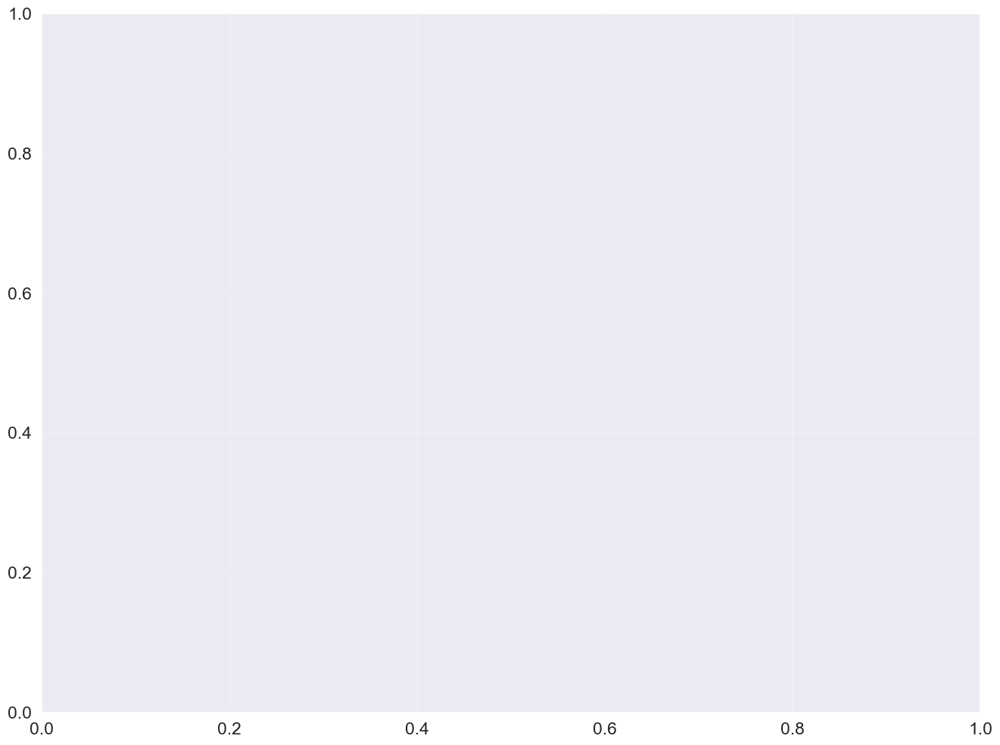

In [271]:
fig, ax = plt.subplots(figsize=(16, 12))
sm.graphics.plot_regress_exog(result, "Xg", fig=fig)
fig.tight_layout(pad=1.0)
plt.show()
# Save figure
plt_str = "../../figures/%s_%d_2x2_diagnostics.png" \
% (diagnostic_group, model_iter)
save_fig(plt, plt_str)

Covariation of parameters

In [272]:
cp = result.cov_params()
hm = sns.heatmap(cp,
                 linewidths=0.35, cmap="Greys_r",
                 square=True, fmt=".3f",
                 annot=True, annot_kws={"color":"white", "weight":"bold"})
hm.invert_yaxis()
# Save figure
plt_str = "../../figures/%s_%d_cov_params_hm.png" \
% (diagnostic_group, model_iter)
save_fig(plt, plt_str)

NameError: name 'result' is not defined

In [273]:
plt.rc("figure", figsize=(10,10))
sm.graphics.plot_partregress_grid(result)
plt.show()
# Save figure
plt_str = "../../figures/%s_%d_partial_regression.png" \
% (diagnostic_group, model_iter)
save_fig(plt, plt_str)

AttributeError: module 'statsmodels.formula.api' has no attribute 'graphics'

In [274]:
# Leveage vs Residuals
sm.graphics.plot_leverage_resid2(result)
plt.show()
# Save figure
plt_str = "../../figures/%s_%d_leverage_v_norm_resid-squared.png" \
% (diagnostic_group, model_iter)
save_fig(plt, plt_str)

AttributeError: module 'statsmodels.formula.api' has no attribute 'graphics'

Residuals: confirm the error of the model (i.e., residuals) is normal and random when the resuduals are plotted against predicted values, the chart should appear scattershot (random).

In [275]:
from scipy import stats
# Plot Standardized Residuals against Predicted Values
residual = result.resid
# Establish Figure
fig = plt.figure()

## Distribution of Residuals
ax = fig.add_subplot(2,2,1)
sns.kdeplot(residual, shade=True, palette="gist_ncar_r", ax=ax)
## QQ Plot of residuals
ax = fig.add_subplot(2,2,2)
sm.qqplot(residual, fit=True, line="q", ax=ax)
## PP Plot
ax = fig.add_subplot(2,2,3)
stats.probplot(residual, dist="norm", plot=ax)

plt.tight_layout()
plt.show()
# Save figure
plt_str = "../../figures/%s_%d_residual_analysis_dist_qq_pp_plots.png" \
% (diagnostic_group, model_iter)
save_fig(plt, plt_str)

NameError: name 'result' is not defined

Applying the Harvey-Collier test (1976) to the fitted model can provide evidence of linearity of the model.

### Comparing L10 Isotopes to KP Isotopes

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1667542049.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diff_iso_pos_only["iso_differences"] = diff_iso_pos_only.d13CO2_source \
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1667542049.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diff_iso_pos_only["iso_differences_pct"] = perc_diff(np.abs(diff_iso_pos_only.d13CO2_source),  \


/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1667542049.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  diff_iso_pos_only_grp = diff_iso_pos_only.groupby(by="Group")["iso_differences", "iso_differences_pct"].describe()


ValueError: Cannot subset columns with a tuple with more than one element. Use a list instead.

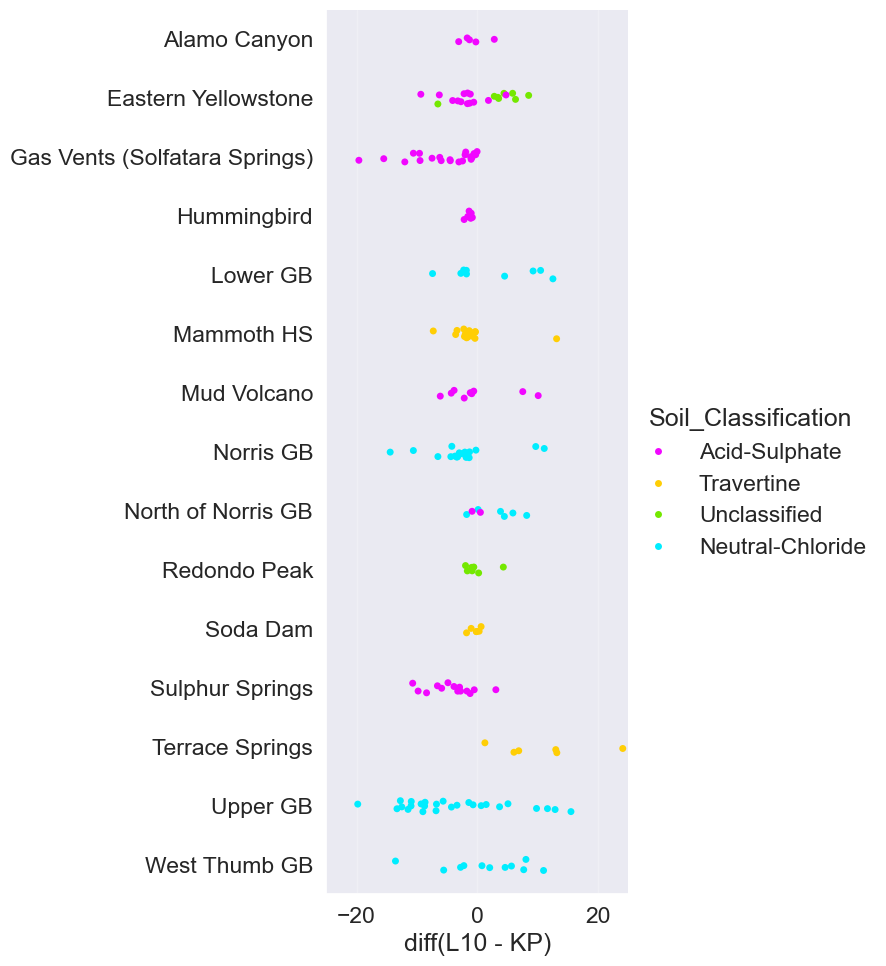

In [276]:
diff_iso_pos_only = df_all_iso_pos_only[["Group", "Soil_Classification",
                                 "d13CO2_source", "KP_d13CO2_source"]]
diff_iso_pos_only["iso_differences"] = diff_iso_pos_only.d13CO2_source \
- diff_iso_pos_only.KP_d13CO2_source
diff_iso_pos_only["iso_differences_pct"] = perc_diff(np.abs(diff_iso_pos_only.d13CO2_source),  \
                                                 np.abs(diff_iso_pos_only.KP_d13CO2_source))
# Visualize
strip_iso = sns.catplot(data=diff_iso_pos_only, x="iso_differences", y="Group",
                        orient="h", hue="Soil_Classification", kind="strip",
                        palette="gist_ncar_r", height=10, aspect=0.8)
strip_iso.set_axis_labels("diff(L10 - KP)", "")
strip_iso.set(xlim=(-25,25))
save_fig(plt, "../../figures/diff_L10_KP_iso_pos_only.png")
# Groupby Soil Classification
diff_iso_pos_only_grp = diff_iso_pos_only.groupby(by="Group")["iso_differences", "iso_differences_pct"].describe()
diff_iso_pos_only_grp

### Static Chamber Measurements

In [277]:
# Import file into workspace
df_static_cham = pd.read_csv(
  "../../pertinent-data/summary-data/static_cham_CH4_summary.csv",
  header=0,
  dtype={
      "Group":"category",
      "Soil_Classification":"category",
      "Caldera":"category"
  }
)

# Drop NaN rows
df_static_cham.dropna(axis=0, thresh=2, inplace=True)
# Order "Soil_Classification" categories
df_static_cham["Soil_Classification"].cat.reorder_categories\
(["Acid-Sulphate", "Travertine", "Unclassified", "Neutral-Chloride"],
 ordered=True, inplace=True)
# Reset index
df_static_cham.reset_index(drop=True, inplace=True)
df_static_cham.head(10)

TypeError: Categorical.reorder_categories() got an unexpected keyword argument 'inplace'

In [278]:
# Upload Moran et al. 2017 data
df_Moran = pd.read_csv(
    "../../pertinent-data/other-data/Moran_et_al_2017_simple_data.csv",
    dtype={
        "Group":"category",
        "Soil_Classification":"category"
    }
)
# Reorder categories
df_Moran.Soil_Classification.cat.reorder_categories\
(["Acid-Sulphate", "Travertine", "Unclassified", "Neutral-Chloride"],
 ordered=True, inplace=True)

# Group data by "Group"
df_Moran_grp = df_Moran.groupby(["Soil_Classification"]).agg(np.mean)
## Reset index to allow for "Soil_Classification" to be a column instead of an
## index
df_Moran_grp.reset_index(inplace=True)
# Preview the dataframe
df_Moran_grp

TypeError: Categorical.reorder_categories() got an unexpected keyword argument 'inplace'

##### Visualize the static chamber data

Error is calculated from the average of st. deviations from the reference materials measurements. These data are located in the "References" tab in the "UCDavis_Static_Chamber_[...].xlsx" files located in the ".../Yellowstone/Summary_Data" directory on OneDrive.

In [279]:
sns.set_theme(context="paper", style="darkgrid", font_scale=1.85,
              palette="gist_ncar_r")

<>:33: SyntaxWarning: invalid escape sequence '\d'
<>:34: SyntaxWarning: invalid escape sequence '\d'
<>:33: SyntaxWarning: invalid escape sequence '\d'
<>:34: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1384109153.py:33: SyntaxWarning: invalid escape sequence '\d'
  plt.xlabel("$\delta^{13}$C-CH$_4$ (‰)")
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1384109153.py:34: SyntaxWarning: invalid escape sequence '\d'
  plt.ylabel("$\delta^{2}$H-CH$_4$ (‰)")
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1384109153.py:33: SyntaxWarning: invalid escape sequence '\d'
  plt.xlabel("$\delta^{13}$C-CH$_4$ (‰)")
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1384109153.py:34: SyntaxWarning: invalid escape sequence '\d'
  plt.ylabel("$\delta^{2}$H-CH$_4$ (‰)")


NameError: name 'df_Moran_grp' is not defined

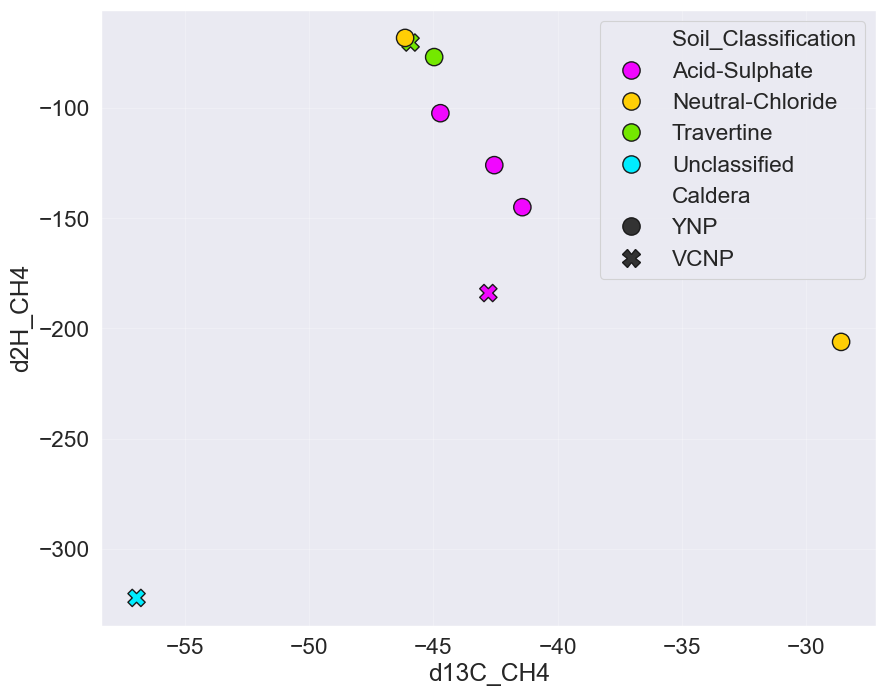

In [280]:
# Add error to dataframe
## Error for δ13C-CH4
df_static_cham["d13C_err"] = 0.14
## Error for δ2H-CH4
df_static_cham["d2H_err"] = 1.40

# Scatterplot of static chamber data
fig = plt.figure(figsize=(10,8))
sns.scatterplot(
    data=df_static_cham,x="d13C_CH4",
    y="d2H_CH4",
    hue="Soil_Classification",
    palette="gist_ncar_r",
    s=155,
    style="Caldera",
    style_order=["YNP", "VCNP"],
    markers=True,
    edgecolor="k"
)
# Scatterplot of Moran et al. (2017) data
sns.scatterplot(
    "d13C_CH4",
    "d2H_CH4",
    data=df_Moran_grp,
    hue="Soil_Classification",
    marker="d",
    s=155,
    edgecolor="black",
    palette="gist_ncar_r",
    legend=None
)

plt.xlabel("$\delta^{13}$C-CH$_4$ (‰)")
plt.ylabel("$\delta^{2}$H-CH$_4$ (‰)")
plt.tight_layout()
plt.show()
save_fig(plt, "../../figures/static_cham_d2H-CH4_v_d13C-CH4.png")

In [281]:
df_static_cham

,Sample_ID,Location,d2H_CH4,CH4_d2HCH4,Comments,d13C_CH4,CH4_d13CCH4,Group,Soil_Classification,Caldera,d13C_err,d2H_err
0,VCSS_3.2.A,VCSS_25May2019_3.2.1,-183.9,2.0,,-42.79,1.8,Sulphur Springs,Acid-Sulphate,VCNP,0.14,1.4
1,VCHB_1.2.A,VCHB_26May2019_1.2.1,-322.4,24.8,NaN,-56.95,13.7,Hummingbird,Unclassified,VCNP,0.14,1.4
2,VCSD_1.3.A,VCSD_28May2019_1.3,-70.1,1.1,Below LOQ (< 3 ppm CH4),-45.92,1.6,Soda Dam,Travertine,VCNP,0.14,1.4
3,GVNT_4.2.A,GVNT_06Jun2019_2.2,-125.8,1.5,Below LOQ (< 3 ppm CH4),-42.55,1.8,Gas Vents (Solfatara Springs),Acid-Sulphate,YNP,0.14,1.4
4,EETR_2.1.A,EETR_10Jun2019_2.1,-144.9,2.0,Below LOQ (< 3 ppm CH4),-41.42,2.1,Eastren Yellowstone,Acid-Sulphate,YNP,0.14,1.4
5,MDVC_2.3.A,MDVC_09Jun2019_2.3,-102.2,1.3,Below LOQ (< 3 ppm CH4),-44.72,2,Mud Volcano,Acid-Sulphate,YNP,0.14,1.4
6,NGBN_1.2.A,NBGN_11Jun2019_1.2,-68.0,1.1,Below LOQ (< 3 ppm CH4),-46.14,1.7,Norris GB,Neutral-Chloride,YNP,0.14,1.4
7,NGBN_2.1.A,NGBN_STMB_12Jun2019_1.1,-206.1,8.2,NaN,-28.59,7.5,Norris GB,Neutral-Chloride,YNP,0.14,1.4
8,MMTH_5.1.A,MMTH_15Jun2019_4.1,-76.7,1.1,Below LOQ (< 3 ppm CH4),-44.97,1.6,Mammoth HS,Travertine,YNP,0.14,1.4


Figure ##: δ<sup>2</sup>H-CH<sub>4</sub> plotted against δ<sup>13</sup>C-CH<sub>4</sub> measurements from samples collected from the static chamber method. The error for these measurements fit within the size of the symbol. The diamond symbols represent averaged data collected by Moran et al. (2017) at YNP (n-Acid-Sulphate = 6, n-Travertine = 6, n-Unclassified = 6, n-Neutral-Chloride = 57). Note: 75% of the δ<sup>2</sup>H-CH<sub>4</sub> measurements collected in this study (i.e. circles and crosses) were below 3 ppm in the concentration of CH<sub>4</sub> and the level of quantification as per the methods described by UC Davis Stable Isotope Laboratory where the samples were measured.

The static chamber measurements intended to capture the sauration concentration of gases emitted from the subsurface. The δ<sup>13</sup>C-CH<sub>4</sub> were measured within a narrow range of -46 and -40‰ for the majority of measurements, save for one unclassified and neutral-chloride measurements. These two exceptions, the former in VCHB and the latter at NGBN, show large deviations from the remaining measurements. This deviation may be due to the fact these exceptions were the only samples that were above the level of quantification for  δ<sup>2</sup>H-CH<sub>4</sub>.

##### Reexamining the distrubution of carbon isopes with static chamber measurements

In [282]:
# convert all of the yellowstone static measurements to a small dataframe
df_static_cham_yc = df_static_cham[df_static_cham["Caldera"] == "YNP"]

# convert all of the valles static measurements to a small dataframe
df_static_cham_vc = df_static_cham[df_static_cham["Caldera"] == "VCNP"]

In [283]:
df_static_cham_yc

,Sample_ID,Location,d2H_CH4,CH4_d2HCH4,Comments,d13C_CH4,CH4_d13CCH4,Group,Soil_Classification,Caldera,d13C_err,d2H_err
3,GVNT_4.2.A,GVNT_06Jun2019_2.2,-125.8,1.5,Below LOQ (< 3 ppm CH4),-42.55,1.8,Gas Vents (Solfatara Springs),Acid-Sulphate,YNP,0.14,1.4
4,EETR_2.1.A,EETR_10Jun2019_2.1,-144.9,2.0,Below LOQ (< 3 ppm CH4),-41.42,2.1,Eastren Yellowstone,Acid-Sulphate,YNP,0.14,1.4
5,MDVC_2.3.A,MDVC_09Jun2019_2.3,-102.2,1.3,Below LOQ (< 3 ppm CH4),-44.72,2,Mud Volcano,Acid-Sulphate,YNP,0.14,1.4
6,NGBN_1.2.A,NBGN_11Jun2019_1.2,-68.0,1.1,Below LOQ (< 3 ppm CH4),-46.14,1.7,Norris GB,Neutral-Chloride,YNP,0.14,1.4
7,NGBN_2.1.A,NGBN_STMB_12Jun2019_1.1,-206.1,8.2,NaN,-28.59,7.5,Norris GB,Neutral-Chloride,YNP,0.14,1.4
8,MMTH_5.1.A,MMTH_15Jun2019_4.1,-76.7,1.1,Below LOQ (< 3 ppm CH4),-44.97,1.6,Mammoth HS,Travertine,YNP,0.14,1.4


<>:19: SyntaxWarning: invalid escape sequence '\d'
<>:104: SyntaxWarning: invalid escape sequence '\d'
<>:19: SyntaxWarning: invalid escape sequence '\d'
<>:104: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/433755895.py:19: SyntaxWarning: invalid escape sequence '\d'
  x_var="$\delta^{13}$C-CH$_4$ (‰)",
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/433755895.py:104: SyntaxWarning: invalid escape sequence '\d'
  x_var="$\delta^{13}$C-CO$_2$(‰)",


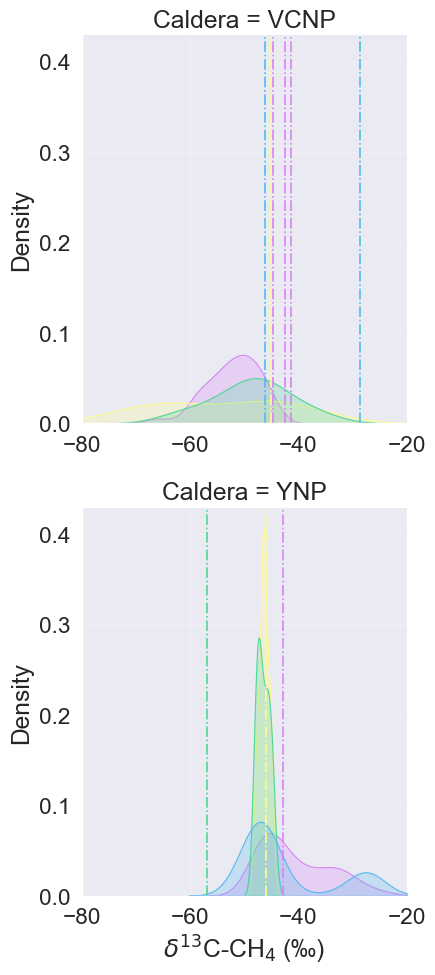

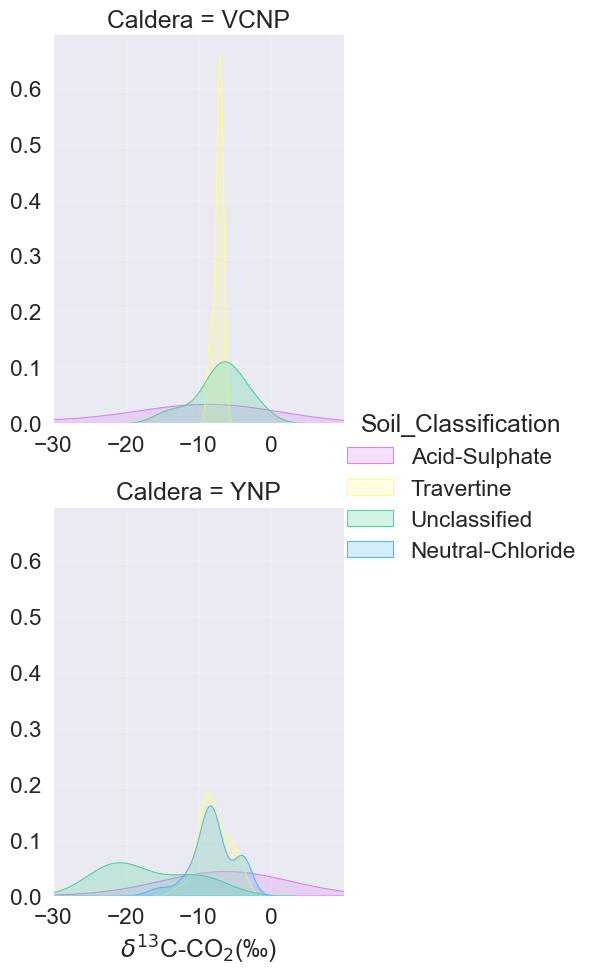

In [284]:
# δ13C-CH4: Comparisons between the caldera
fg = sns.FacetGrid(
    df_all,
    hue="Soil_Classification",
    palette=_palette,
    row="Caldera",
    height=5,
    aspect=0.9,
    sharex=False,
    legend_out=False
)
fg.map_dataframe(
    sns.kdeplot,
    data=df_all,
    x="d13CH4_source",
    fill=True
)
fg.set_axis_labels(
    x_var="$\delta^{13}$C-CH$_4$ (‰)",
    y_var="Density"
)
fg.set(xlim=(-80,-20))
# add vertical reference lines that signal the static chamber measurements
# yellostone ch4 samples
## gvnt
fg.fig.axes[0].axvline(
    x=df_static_cham_yc["d13C_CH4"].iloc[0],
    linestyle="-.",
    color=_palette["Acid-Sulphate"]
)
## eetr
fg.fig.axes[0].axvline(
    x=df_static_cham_yc["d13C_CH4"].iloc[1],
    linestyle="-.",
    color=_palette["Acid-Sulphate"]
)
## mdvc
fg.fig.axes[0].axvline(
    x=df_static_cham_yc["d13C_CH4"].iloc[2],
    linestyle="-.",
    color=_palette["Acid-Sulphate"]
)
## ngbn (norris geyser basin proper)
fg.fig.axes[0].axvline(
    x=df_static_cham_yc["d13C_CH4"].iloc[3],
    linestyle="-.",
    color=_palette["Neutral-Chloride"]
)
## ngbn (norris geyser steamboat geyser)
fg.fig.axes[0].axvline(
    x=df_static_cham_yc["d13C_CH4"].iloc[4],
    linestyle="-.",
    color=_palette["Neutral-Chloride"]
)
## mmth
fg.fig.axes[0].axvline(
    x=df_static_cham_yc["d13C_CH4"].iloc[5],
    linestyle="-.",
    color=_palette["Travertine"]
)

# valles ch4 samples
## vcss
fg.fig.axes[1].axvline(
    x=df_static_cham_vc["d13C_CH4"].iloc[0],
    linestyle="-.",
    color=_palette["Acid-Sulphate"]
)
## vchb
fg.fig.axes[1].axvline(
    x=df_static_cham_vc["d13C_CH4"].iloc[1],
    linestyle="-.",
    color=_palette["Unclassified"]
)
## vcsd
fg.fig.axes[1].axvline(
    x=df_static_cham_vc["d13C_CH4"].iloc[2],
    linestyle="-.",
    color=_palette["Travertine"]
)

#fg.add_legend()
save_fig(plt, "../../figures/faceted_kde_d13CH4_w_static_measurements.png")


## δ13C-CO2: Comparisons between the caldera
fg = sns.FacetGrid(
    df_all,
    hue="Soil_Classification",
    palette=_palette,
    row="Caldera",
    height=5,
    aspect=0.9,
    sharex=False
)
fg.map_dataframe(
    sns.kdeplot,
    data=df_all,
    x="d13CO2_source",
    fill=True,
    legend=True
)
fg.set_axis_labels(
    x_var="$\delta^{13}$C-CO$_2$(‰)",
    y_var=""
)
fg.set(
    xlim=(-30,10),
    xticks=np.arange(-30,10,10)
)

fg.add_legend()
save_fig(plt, "../../figures/faceted_kde_d13CO2.png")

#### Isotope Compositions Comparisons between this Study and Global Inventory

The paper published by [Sherwood et al. (2017)](https://essd.copernicus.org/articles/9/639/2017/) shared a wealth of CH$_{4}$ sampling from around the globe. The samples can be generally split into three categories: (1) fossil fuels, (2) microbial, and (3) biomass burning. The abundance of samples by type follows that respective order, where fossil fuels contains 8734 of the total 10,706 samples published in the 2017 version of the dataset.

#### C-D (Whiticar) Plot

Using the global inventory data, this section will plot the the data from other studies and place the data from the static chambers on top of those values as well.

<>:98: SyntaxWarning: invalid escape sequence '\d'
<>:99: SyntaxWarning: invalid escape sequence '\d'
<>:98: SyntaxWarning: invalid escape sequence '\d'
<>:99: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2026356851.py:98: SyntaxWarning: invalid escape sequence '\d'
  plt.ylabel("$\delta^{2}$H-$CH_{4}$", fontsize=22)
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2026356851.py:99: SyntaxWarning: invalid escape sequence '\d'
  plt.xlabel("$\delta^{13}$C-$CH_{4}$", fontsize=22)
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2026356851.py:98: SyntaxWarning: invalid escape sequence '\d'
  plt.ylabel("$\delta^{2}$H-$CH_{4}$", fontsize=22)
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2026356851.py:99: SyntaxWarning: invalid escape sequence '\d'
  plt.xlabel("$\delta^{13}$C-$CH_{4}$", fontsize=22)


NameError: name 'df_Moran_grp' is not defined

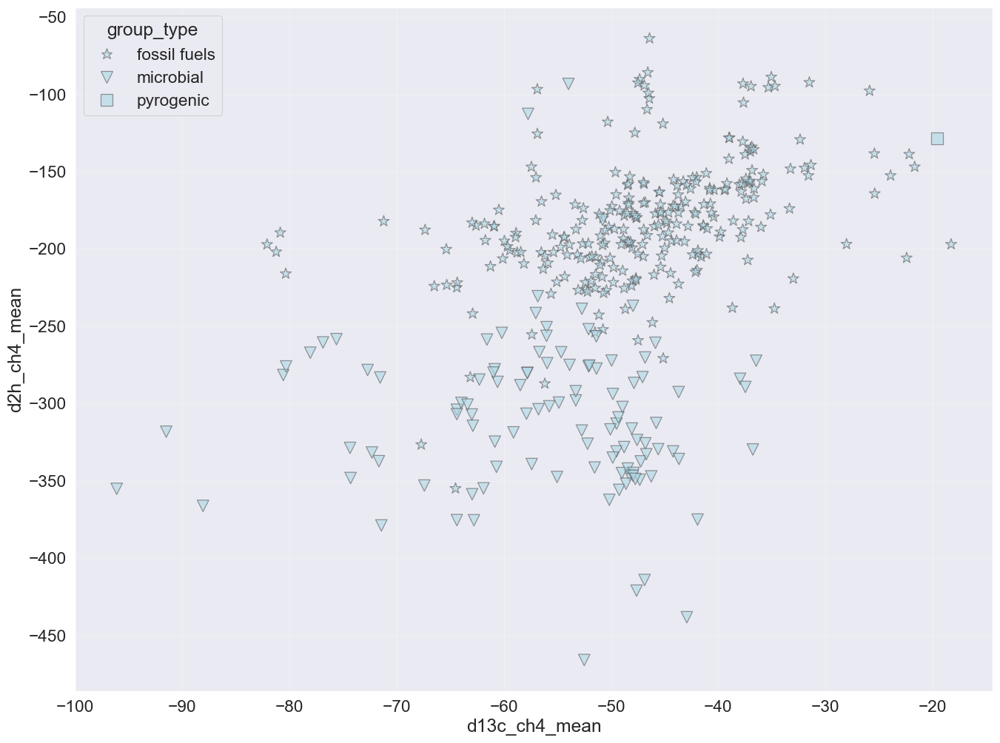

In [285]:
# isolate samples that contain measurements from both d13C and d2H
global_inventory_cd = global_inventory_clean.dropna(
    subset=["d13c_ch4_mean", "d2h_ch4_mean"]
)

# create C-D plot using global inventory data
fig, ax = plt.subplots(figsize=(16,12))

# create a pallette
_palette = dict(
    zip(
        df_static_cham.Soil_Classification.unique(),
        sns.color_palette("gist_ncar_r")
      )
)
# ec_palette = df_static_cham.Soil_Classification.map(_palette)

sns.scatterplot(
    data=global_inventory_cd,
    x="d13c_ch4_mean",
    y="d2h_ch4_mean",
    # hue="group_type",
    style="group_type",
    markers={
        "fossil fuels":"*",
        "microbial":"v",
        "pyrogenic":"s"
    },
    s=125,
    color="#ADD8E6",
    edgecolor="#575656",
    alpha=0.6,
    # legend=None,
    ax=ax
)
# add static chamber data from another yellowstone study (Moran et al.)
sns.scatterplot(
    data=df_Moran_grp,
    x="d13C_CH4",
    y="d2H_CH4",
    hue="Soil_Classification",
    palette=_palette,
    marker="d",
    s=175,
    edgecolor="black",
    legend=None,
    ax=ax
)
# add static chamber measurements
kws = {"facecolor":"none"}
sns.scatterplot(
    data=df_static_cham,
    x="d13C_CH4",
    y="d2H_CH4",
    hue="Soil_Classification",
    palette=_palette,
    s=200,
    style="Caldera",
    style_order=["YNP", "VCNP"],
    markers=markers,
    edgecolor="black",
    # legend=None,
    facecolor="none",
    ax=ax
)
# add atmospheric reference point
ax.scatter(
    -47,
    -90,
    color="#15171a",
    marker="p",
    edgecolor="black",
    linewidth=2,
    s=400,
    alpha=0.4
)


leg = ax.legend(
    fontsize=14,
    markerscale=2
)
leg.legendHandles[0].set_color('#ADD8E6')
leg.legendHandles[1].set_color('#ADD8E6')
leg.legendHandles[2].set_color('#ADD8E6')

# moran_leg = moran_plt.legend(
#     ["Moran et al. (2017)"],
#     fontsize=12,
#     markerscale=2
# )


sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

plt.grid(color="#a7a7a8", linewidth=1.25, alpha=0.4)

plt.ylabel("$\delta^{2}$H-$CH_{4}$", fontsize=22)
plt.xlabel("$\delta^{13}$C-$CH_{4}$", fontsize=22)
plt.tight_layout()
plt.show()

save_fig(fig, "../../figures/global_moran_static_cham_d2H-CH4_v_d13C-CH4.png")


## Inter-Caldera Comparisons
In this section of the notebook, the data at the caldera level has been aggregated for comparison.

In [286]:
# Group data by caldera and soil chemistry class
gb_cald_scls = df_all_iso_pos_only.dropna().groupby(by=["Caldera", "Soil_Classification"])\
[["Caldera", "Soil_Classification", "d13CH4_source", "d13CO2_source"]]
gb_cald_scls = [gb_cald_scls.get_group(x) for x in gb_cald_scls.groups]
gb_cald_scls[2]

,Caldera,Soil_Classification,d13CH4_source,d13CO2_source
17,VCNP,Unclassified,-45.349965,-6.118929
18,VCNP,Unclassified,-53.072312,-6.810988
19,VCNP,Unclassified,-60.948037,-8.245861
20,VCNP,Unclassified,-50.864708,-7.243751
21,VCNP,Unclassified,-45.849117,-4.630778
22,VCNP,Unclassified,-37.603231,-2.252906
23,VCNP,Unclassified,-47.037549,-13.651527


#### KS Test
Test for normality using the KS among the different groups

In [287]:
# Import stats from the `statsmodels` library
from statsmodels.stats.diagnostic import kstest_normal

# Set up the dataframe to receive results
df_KS_rslts_cald_scls_d13C = \
pd.DataFrame(columns=["Caldera", "Soil_Classification",
                      "ks_stat_d13CH4", "pval_d13CH4",
                      "ks_stat_d13CO2", "pval_d13CO2"],
             index=range(7))

# Loop through each soil type and check for normality
for i in range(7):
  #---YNP---#
  # Gather Caldera
  df_KS_rslts_cald_scls_d13C.loc[i]["Caldera"] = \
  gb_cald_scls[i].Caldera.iloc[0]
  # Gather Soil Classification
  df_KS_rslts_cald_scls_d13C.loc[i]["Soil_Classification"] = \
  gb_cald_scls[i].Soil_Classification.iloc[0]
  # Run KS Test - CH4
  ks_stat, pval = kstest_normal(gb_cald_scls[i].d13CH4_source)
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_cald_scls_d13C.loc[i]["ks_stat_d13CH4"] = ks_stat
  ## pval
  df_KS_rslts_cald_scls_d13C.loc[i]["pval_d13CH4"] = pval
  # Run KS Test - CO2
  ks_stat, pval = kstest_normal(gb_cald_scls[i].d13CO2_source)
  # Assign results to dataframe
  ## ks_stat
  df_KS_rslts_cald_scls_d13C.loc[i]["ks_stat_d13CO2"] = ks_stat
  ## pval
  df_KS_rslts_cald_scls_d13C.loc[i]["pval_d13CO2"] = pval

# Export results from KS test to .csv
df_KS_rslts_cald_scls_d13C.to_csv("df_KS_rslts_cald_scls_d13C.csv", sep=",",
                             index=False)

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2894439047.py:15: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_KS_rslts_cald_scls_d13C.loc[i]["Caldera"] = \
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/

In [288]:
df_KS_rslts_cald_scls_d13C

,Caldera,Soil_Classification,ks_stat_d13CH4,pval_d13CH4,ks_stat_d13CO2,pval_d13CO2
0,VCNP,Acid-Sulphate,0.150802,0.120672,0.167316,0.050008
1,VCNP,Travertine,0.270764,0.202512,0.292033,0.119843
2,VCNP,Unclassified,0.181351,0.695071,0.218568,0.414575
3,YNP,Acid-Sulphate,0.171377,0.003458,0.198044,0.001
4,YNP,Neutral-Chloride,0.319239,0.001,0.146424,0.065103
5,YNP,Travertine,0.154643,0.432484,0.141401,0.569532
6,YNP,Unclassified,0.249351,0.166336,0.224551,0.284772


The function `two_samp_compare()` permits the comparison of two samples of data and ensures that if the KS 2-sample test does not show that samples are from a similar distribution that they are then transformed by subtracting the minimum value from each datum and proveeding to use the Mann-Whitney U two sample non-parametric text.

*`two_sample_compare()` may not be valid, needs further testing to ensure minimum scaling shift is not affecting results (23 April 2021)*

Apply the `scipy.stats.mannwhitneyu()` function to each relevant pair of data for δ<sup>13</sup>C-CH<sub>4</sub>

In [289]:
def two_samp_compare(samp1, samp2):
  import scipy.stats as sps
  import warnings
  # Conduct Two Sample KS Test
  ks_2_stat, p_val = sps.ks_2samp(samp1, samp2)
  print(p_val)
  # Proceed based on p-value: if > 0.05 then samples come from similar
  # distributions, if <= 0.05 samples must be transfomed becuse they come from
  # populations fitted by different distributions
  if p_val > 0.05:
    # Conduct Mann-Whitney Test
    mu_stat, mu_pval = sps.mannwhitneyu(samp1, samp2)
    return mu_pval
  elif p_val <=  0.05:
    # Transform data with relative the minimum value
    samp1_trans = samp1 - np.min(samp1)
    samp2_trans = samp2 - np.min(samp2)
    # Double check KS 2-sample
    ks_2_stat_, p_val_ = sps.ks_2samp(samp1_trans, samp2_trans)
    print(p_val_)
    if p_val_ <= 0.05:
      warnings.warn("KS 2-sample not passed after transformation")
    # Conduct Mann-Whitney
    mu_stat, mu_pval = sps.mannwhitneyu(samp1_trans, samp2_trans)
    # Return stats
    return mu_pval

In [290]:
import scipy.stats as sps

# d13C-CH4 |  Acid - Sulphate | YNP v VCNP
_, pval = sps.mannwhitneyu(gb_cald_scls[3].d13CH4_source, gb_cald_scls[0].d13CH4_source)
print("The p-value from the Mann-Whitney U test comparing median d13CH4 values \nat acid-sulphate locations is: {:.4e}.\n".format(pval))

# d13C-CH4 |  Travertine | YNP v VCNP
_, pval = sps.mannwhitneyu(gb_cald_scls[5].d13CH4_source, gb_cald_scls[1].d13CH4_source)
print("The p-value from the Mann-Whitney U test comparing median d13CH4 values \nat travertine locations is: {:.4e}.\n".format(pval))

# d13C-CH4 |  Unclasified | YNP v VCNP
_, pval = sps.mannwhitneyu(gb_cald_scls[6].d13CH4_source, gb_cald_scls[2].d13CH4_source)
print("The p-value from the Mann-Whitney U test comparing median d13CH4 values \nat unclassified locations is: {:.4e}.\n".format(pval))

The p-value from the Mann-Whitney U test comparing median d13CH4 values 
at acid-sulphate locations is: 5.3995e-11.

The p-value from the Mann-Whitney U test comparing median d13CH4 values 
at travertine locations is: 7.3330e-01.

The p-value from the Mann-Whitney U test comparing median d13CH4 values 
at unclassified locations is: 6.9433e-01.



The null hypothesis of the Mann-Whitney U test states that the median values of the pair of samples are equal to each other. This test was employed to examine the differences between the δ<sup>13</sup>C-CH<sub>4</sub> and  δ<sup>13</sup>C-CO<sub>2</sub> between the calderas.

Paring by soil chemistry classes, the Mann-Whitney U test demonstrated that the acid-sulphate ($p < 0.0001$) and unclassified ($p < 0.03$) chemistry classes had significantly different medians. The median values  of the carbon isotopes from the travertine chemistry class between the calderas were not signficantly different from one another ($p = 0.36$).

Apply the `scipy.stats.mannwhitneyu()` function to each relevant pair of data for δ<sup>13</sup>C-CO<sub>2</sub>

In [291]:
# d13CO2 |  Acid - Sulphate | YNP v VCNP
_, pval = sps.mannwhitneyu(gb_cald_scls[3].d13CO2_source, gb_cald_scls[0].d13CO2_source)
print("The p-value from the Mann-Whitney U test comparing median d13CO2 values \nat acid-sulphate locations is: {:.4e}.\n".format(pval))

# d13CO2 |  Travertine | YNP v VCNP
_, pval = sps.mannwhitneyu(gb_cald_scls[5].d13CO2_source, gb_cald_scls[1].d13CO2_source)
print("The p-value from the Mann-Whitney U test comparing median d13CO2 values \nat travertine locations is: {:.4e}.\n".format(pval))

# d13C-CO2 |  Unclasified | YNP v VCNP
_, pval = sps.mannwhitneyu(gb_cald_scls[6].d13CO2_source, gb_cald_scls[2].d13CO2_source)
print("The p-value from the Mann-Whitney U test comparing median d13CO2 values \nat unclassified locations is: {:.4e}.\n".format(pval))

The p-value from the Mann-Whitney U test comparing median d13CO2 values 
at acid-sulphate locations is: 1.4814e-03.

The p-value from the Mann-Whitney U test comparing median d13CO2 values 
at travertine locations is: 3.4030e-01.

The p-value from the Mann-Whitney U test comparing median d13CO2 values 
at unclassified locations is: 2.1756e-03.



The results from the Mann-Whitney U test demonstrate that medians between the carbon isotopes are not significantly different between the travertine groups ($p =0.17$). However, the median carbon isotopic signatures between the acid-sulphate ($p < 0.0001$)and unclassified ($p < 0.001$) groups indicate a significant difference in median values.

## Examining Gas Dynamics in Chamber Enclosures

In this subsection, the amount and rate at which the gases accumulate in the chamber is analyzed in order to better understand the partial pressures of the relevant gases.

One of the specific motivations for this subsection is assessing negative CH4 fluxes. If the decrease in the amount of CH4 is equal or greater than 0.21% it may indicate that transport of gases is actually going downward (i.e., into the earth).

### Load in chamber enclosure data

#### Clepsydra Geyser (2018-06-27)

In [292]:
# establish path to the .xlsx file
clpd_path = "../../pertinent-data/xlsx-files/clpd/CLPD_27Jun2018_Measurements.xlsx"

# load the clepsydra geyser data from Google Drive
clpd_pt141_df = (
    pd.read_excel(
        clpd_path,
        sheet_name="CLPD_1.4.1",
        usecols="A:K",
        header=0,
        skiprows=[1],
        parse_dates=["Date_ChamON"]
    )
    .pipe(clean_names)
)

clpd_pt141_df.head()

,date_chamon,relative_time_chamon,hp_ch4_dry_chamon,hr_ch4_dry_chamon,hp_d13_ch4_chamon,hr_d13_ch4_chamon,co2_dry_chamon,d13_co2,alarm_status,ch4_conc,co2_conc
0,2018-06-27 15:31:23,0.000,1.866236,1.883010,-45.802704,-45.802704,399.136153,-7.487602,0,1.318300,773.436708
1,2018-06-27 15:31:26,3.552,1.865644,1.882427,-47.066903,-47.066903,398.983147,-9.071745,0,1.317882,773.140217
2,2018-06-27 15:31:30,7.075,1.866890,1.883676,-43.725059,-43.725059,399.037850,-9.095556,0,1.318762,773.246219
3,2018-06-27 15:31:33,10.611,1.866441,1.883205,-43.500982,-43.500982,399.234098,-9.632716,0,1.318445,773.626503
4,2018-06-27 15:31:37,14.138,1.866202,1.882928,-43.887919,-43.887919,399.029411,-8.197069,0,1.318277,773.229867


In [293]:
clpd_pt141_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 362 entries, 0 to 361
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   date_chamon           362 non-null    datetime64[ns]
 1   relative_time_chamon  362 non-null    float64       
 2   hp_ch4_dry_chamon     362 non-null    float64       
 3   hr_ch4_dry_chamon     362 non-null    float64       
 4   hp_d13_ch4_chamon     362 non-null    float64       
 5   hr_d13_ch4_chamon     362 non-null    float64       
 6   co2_dry_chamon        362 non-null    float64       
 7   d13_co2               362 non-null    float64       
 8   alarm_status          362 non-null    int64         
 9   ch4_conc              362 non-null    float64       
 10  co2_conc              362 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(1)
memory usage: 31.2 KB


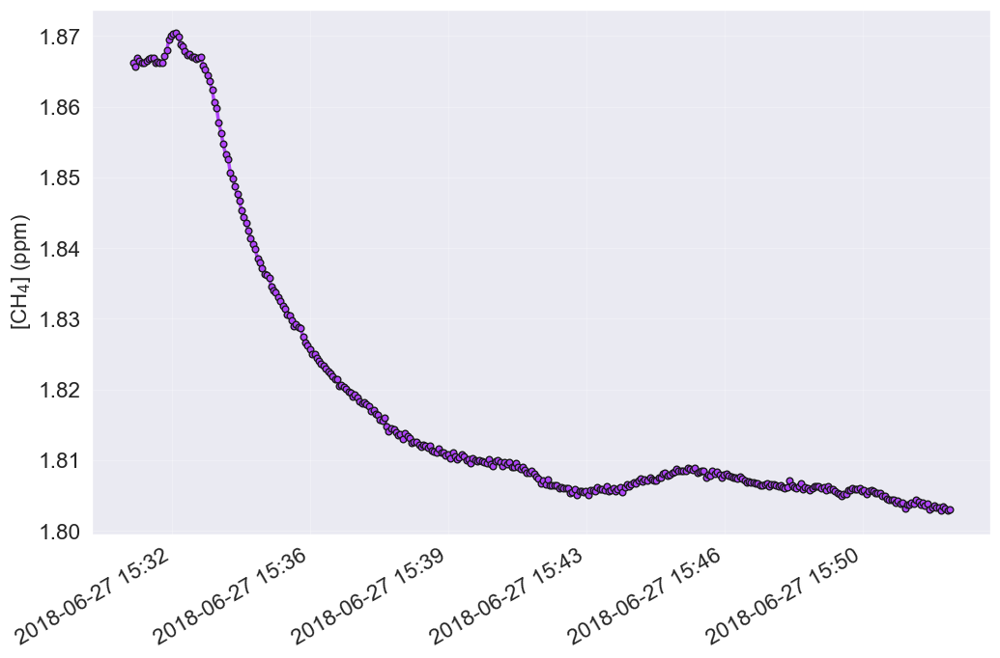

In [294]:
# quantify the decrease in CH4
fig, ax = plt.subplots(figsize=(12,8))
clpd_pt141_df.plot(
    x="date_chamon",
    y="hp_ch4_dry_chamon",
    linewidth=2.5,
    linestyle="-",
    marker="o",
    markeredgecolor="k",
    ax=ax
)
fmt = mdates.DateFormatter("%Y-%m-%d %H:%M")
ax.xaxis.set_major_locator(MaxNLocator(nbins=8))
ax.xaxis.set_major_formatter(fmt)
ax.get_legend().remove()
ax.set_xlabel("")
ax.set_ylabel("[CH$_{4}$] (ppm)", fontsize=16)
plt.show()

In [295]:
# quantify the percent difference from the maximum value to the minimum value
perc_diff = percent_difference(
    np.max(clpd_pt141_df.hp_ch4_dry_chamon),
    np.min(clpd_pt141_df.hp_ch4_dry_chamon)
)

print(
    "At {}, the percent difference of the accumalated CH4 in the chamber is {}%".format("CLPD", perc_diff)
)

At CLPD, the percent difference of the accumalated CH4 in the chamber is -3.67%


Process the chamber enclosures with the custom function.

In [296]:
clpd_sheet_name_list = [
    "CLPD_1.1",
    "CLPD_1.2",
    "CLPD_1.3",
    "CLPD_1.4.1",
    "CLPD_1.4.2",
    "CLPD_1.4.3"
]

  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:01,  3.79it/s]

 33%|███▎      | 2/6 [00:00<00:01,  3.42it/s]

 50%|█████     | 3/6 [00:00<00:00,  3.08it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  3.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  3.48it/s]

100%|██████████| 6/6 [00:01<00:00,  3.06it/s]

100%|██████████| 6/6 [00:01<00:00,  3.20it/s]

,location,percent_diff_num,percent_diff_str
0,CLPD_1.1,-2.37,"At CLPD_1.1, the percent difference of the acc..."
1,CLPD_1.2,-3.18,"At CLPD_1.2, the percent difference of the acc..."
2,CLPD_1.3,-2.84,"At CLPD_1.3, the percent difference of the acc..."
3,CLPD_1.4.1,-3.45,"At CLPD_1.4.1, the percent difference of the a..."
4,CLPD_1.4.2,-3.14,"At CLPD_1.4.2, the percent difference of the a..."
5,CLPD_1.4.3,-3.02,"At CLPD_1.4.3, the percent difference of the a..."


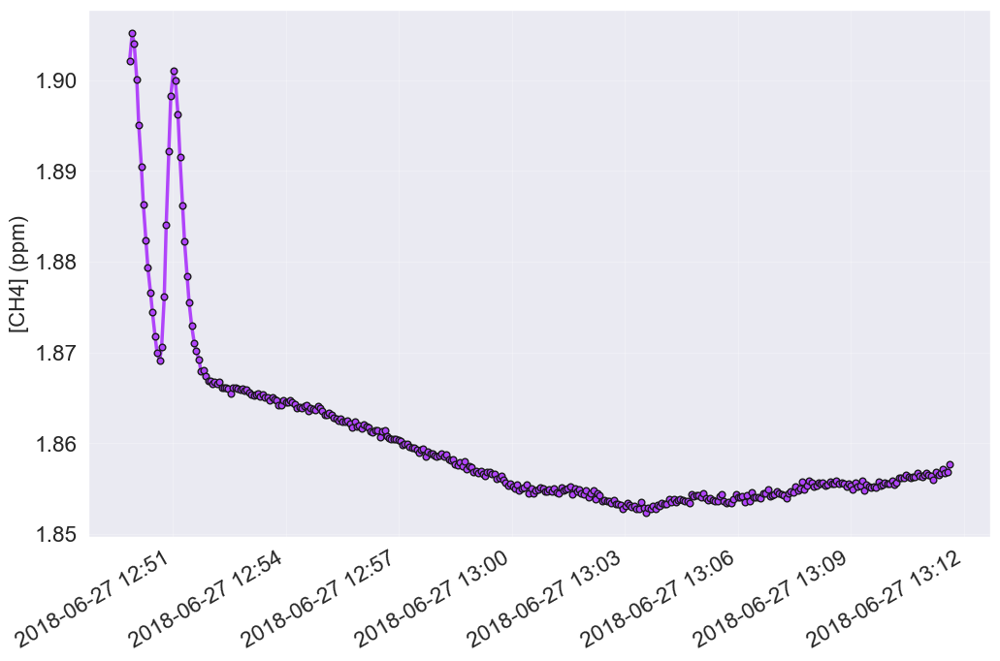

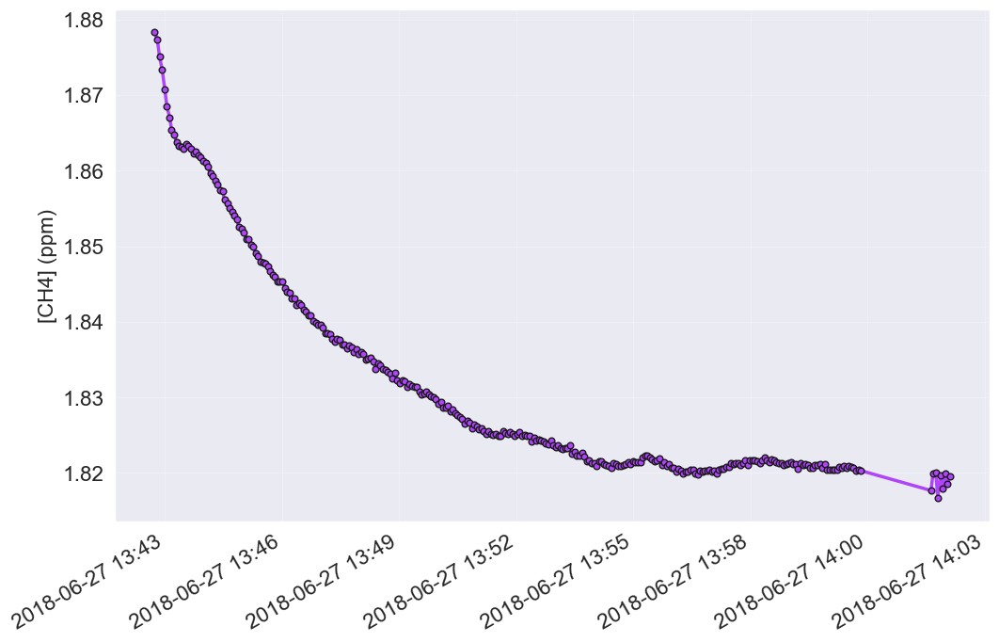

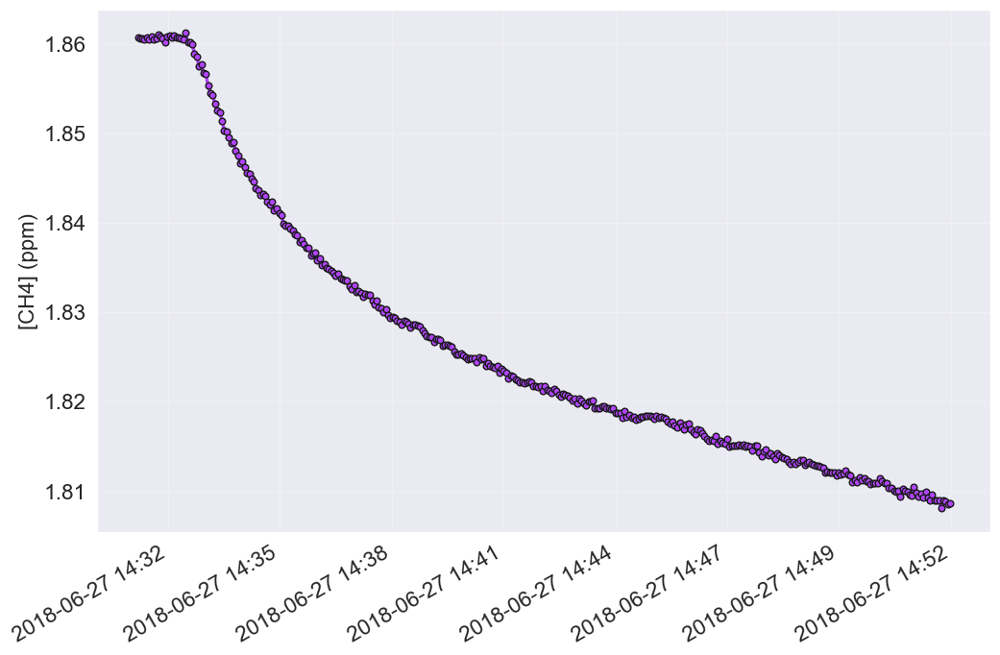

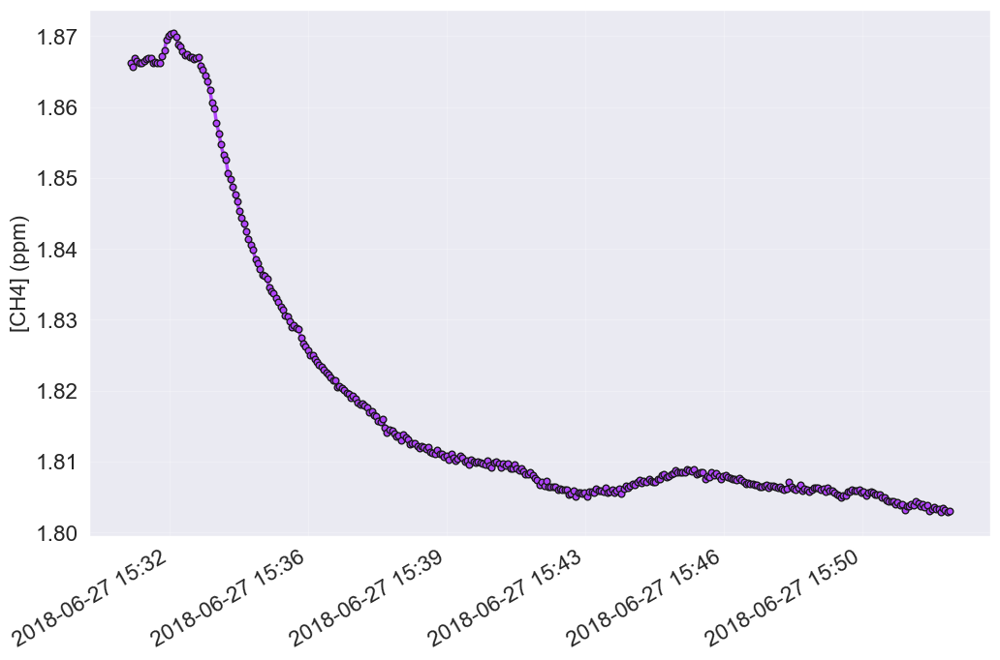

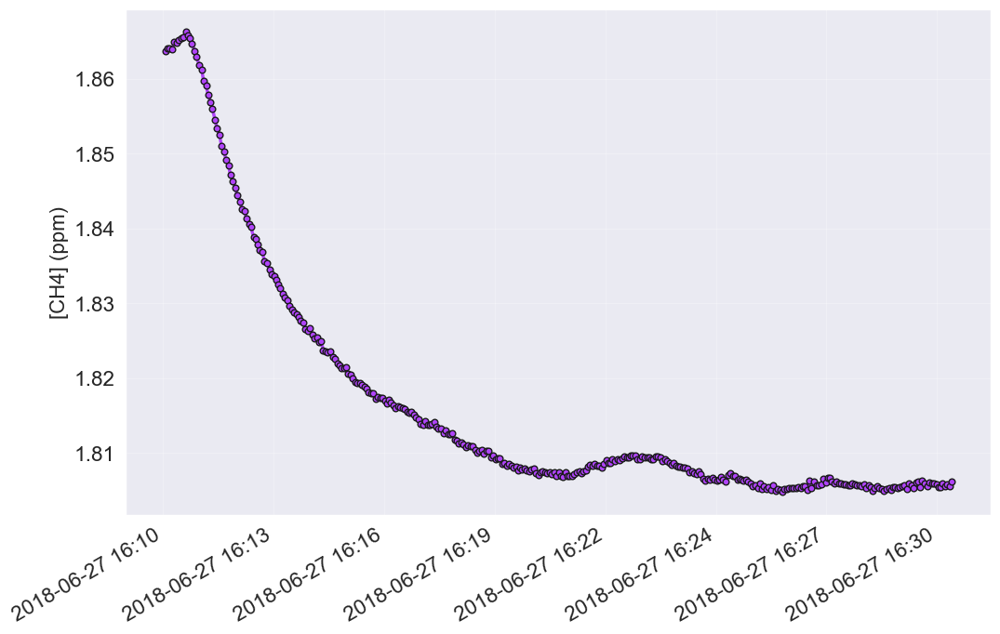

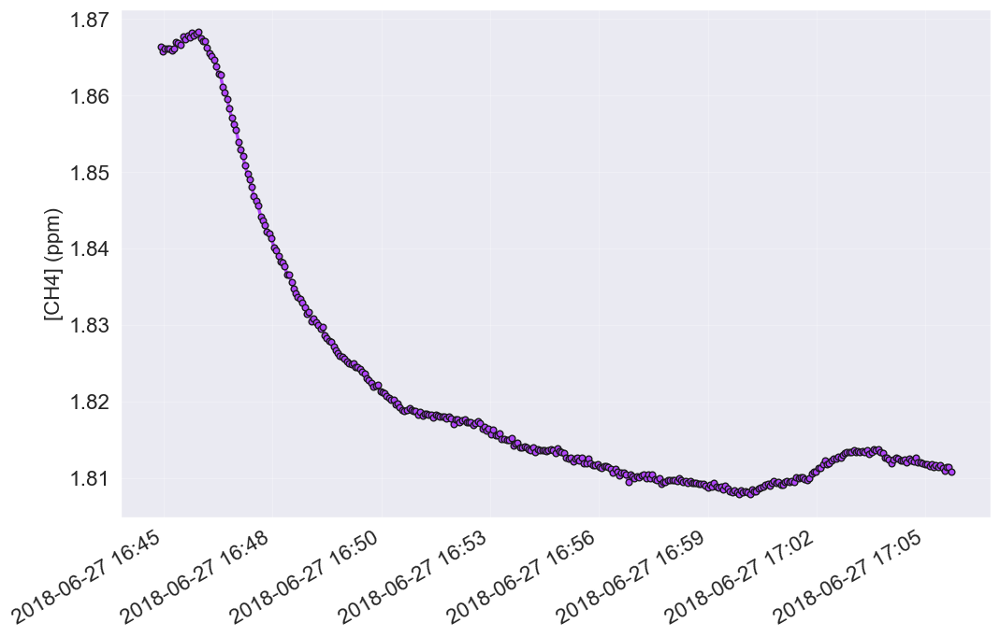

In [297]:
clpd_conc_time_df = quantify_enclosure_perc_diff(
    clpd_path,
    clpd_sheet_name_list,
    save_output=True
)

clpd_conc_time_df

  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:01,  4.30it/s]

 33%|███▎      | 2/6 [00:00<00:00,  4.32it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.16it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.63it/s]

100%|██████████| 6/6 [00:02<00:00,  2.63it/s]

,location,percent_diff_num,percent_diff_str
0,CLPD_1.1,49.21,"At CLPD_1.1, the percent difference of the acc..."
1,CLPD_1.2,20.16,"At CLPD_1.2, the percent difference of the acc..."
2,CLPD_1.3,7.69,"At CLPD_1.3, the percent difference of the acc..."
3,CLPD_1.4.1,20.70,"At CLPD_1.4.1, the percent difference of the a..."
4,CLPD_1.4.2,39.12,"At CLPD_1.4.2, the percent difference of the a..."
5,CLPD_1.4.3,29.69,"At CLPD_1.4.3, the percent difference of the a..."


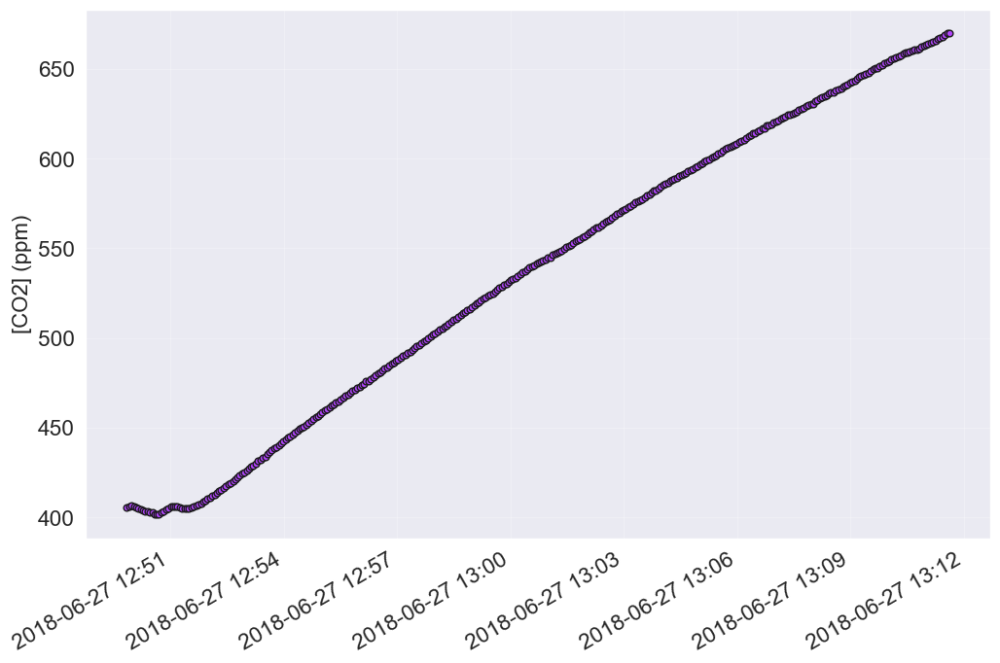

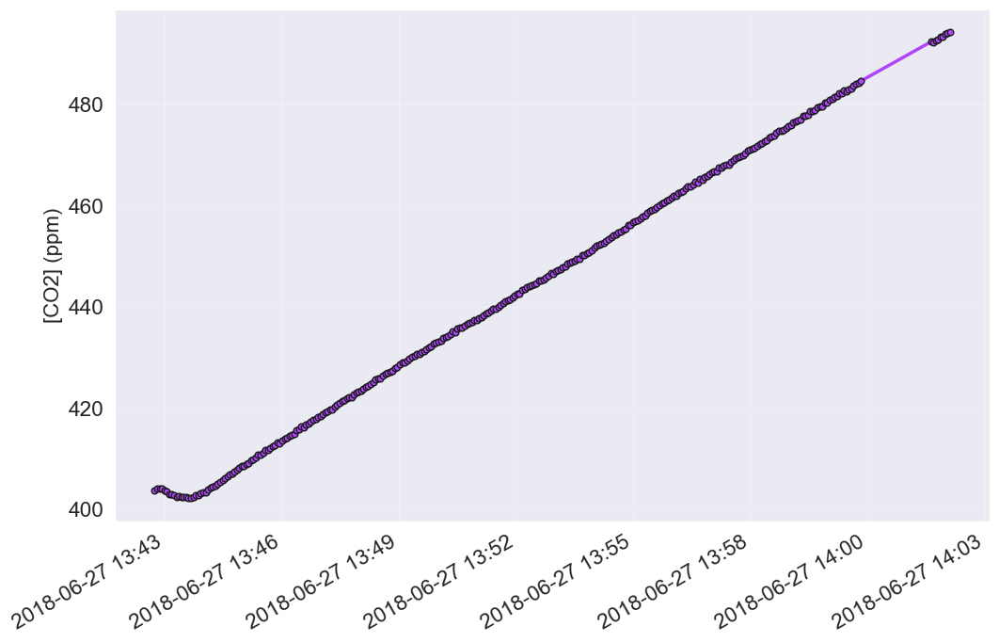

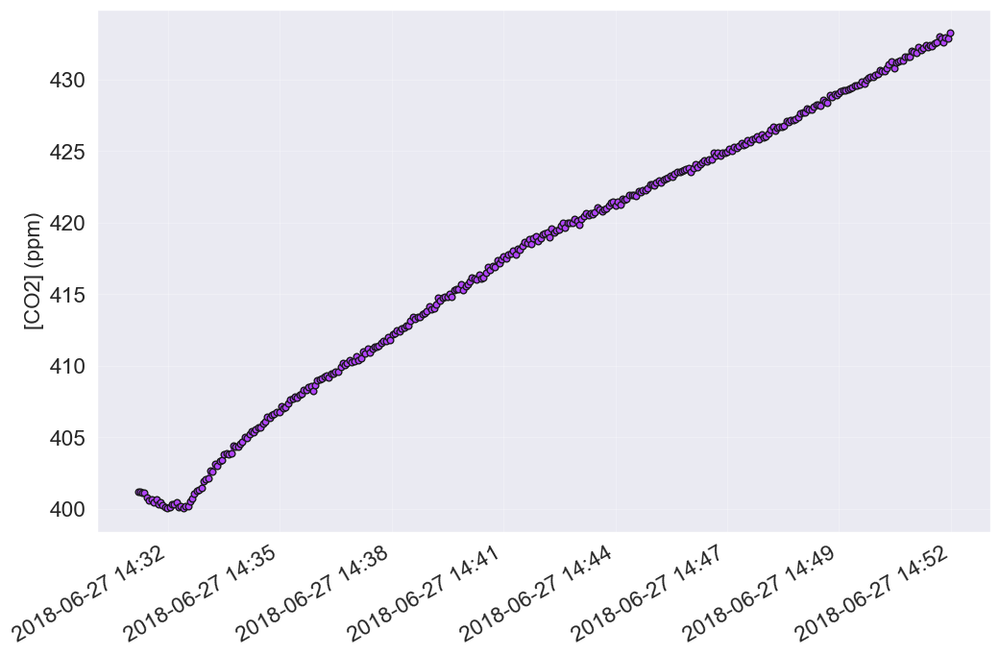

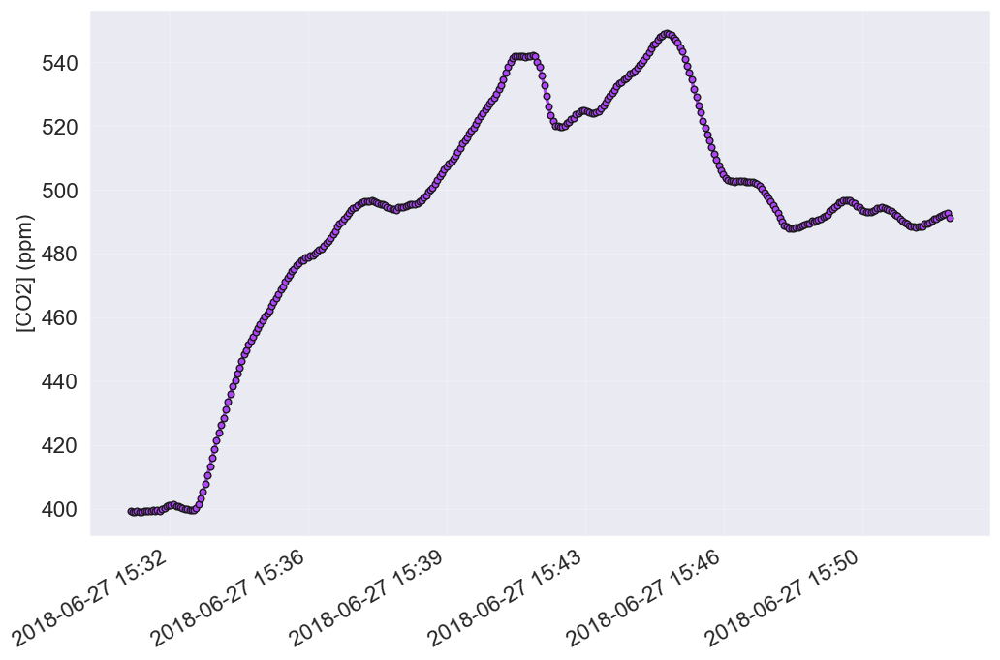

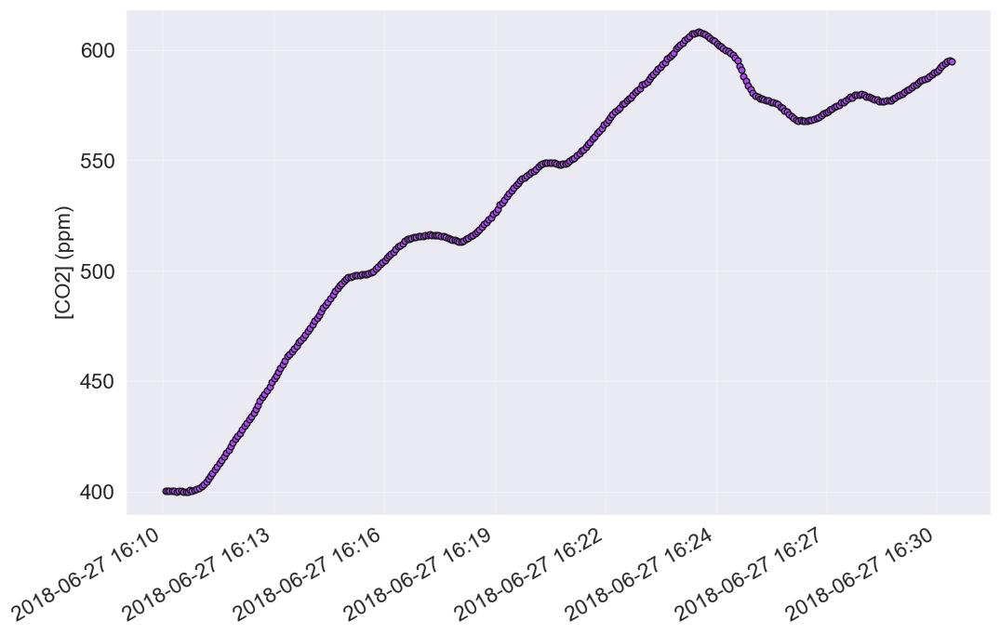

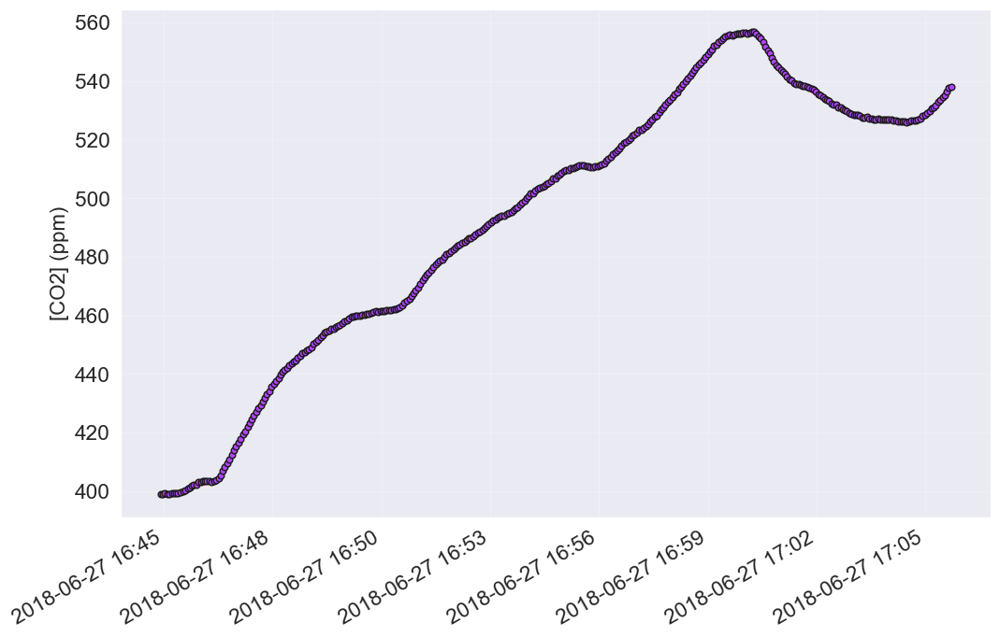

In [298]:
clpd_co2_conc_time_df = quantify_enclosure_perc_diff(
    clpd_path,
    clpd_sheet_name_list,
    col_name="co2_dry_chamon",
    gas_type="CO2",
    save_output=True
)

clpd_co2_conc_time_df

#### Gas Vents (2018-06-22)

In [299]:
# establish path to the .xlsx file
gvnt_path = "../../pertinent-data/xlsx-files/gvnt/GVNT_22Jun2018_Measurements.xlsx"

In [300]:
gvnt_sheet_name_list = [
    "GVNT_1.1",
    "GVNT_1.2",
    "GVNT_1.3",
    "GVNT_1.4",
    "GVNT_2.1",
    "GVNT_2.2",
    "GVNT_2.3",
    "GVNT_2.4"
]

  0%|          | 0/8 [00:00<?, ?it/s]

 12%|█▎        | 1/8 [00:00<00:01,  3.98it/s]

 25%|██▌       | 2/8 [00:00<00:01,  4.16it/s]

 38%|███▊      | 3/8 [00:00<00:01,  4.18it/s]

 50%|█████     | 4/8 [00:00<00:00,  4.17it/s]

 62%|██████▎   | 5/8 [00:01<00:00,  4.06it/s]

 75%|███████▌  | 6/8 [00:01<00:00,  4.05it/s]

 88%|████████▊ | 7/8 [00:01<00:00,  4.10it/s]

100%|██████████| 8/8 [00:02<00:00,  3.78it/s]

100%|██████████| 8/8 [00:02<00:00,  3.97it/s]

,location,percent_diff_num,percent_diff_str
0,GVNT_1.1,121.18,"At GVNT_1.1, the percent difference of the acc..."
1,GVNT_1.2,44.81,"At GVNT_1.2, the percent difference of the acc..."
2,GVNT_1.3,3.69,"At GVNT_1.3, the percent difference of the acc..."
3,GVNT_1.4,5.63,"At GVNT_1.4, the percent difference of the acc..."
4,GVNT_2.1,32.62,"At GVNT_2.1, the percent difference of the acc..."
5,GVNT_2.2,92.03,"At GVNT_2.2, the percent difference of the acc..."
6,GVNT_2.3,131.57,"At GVNT_2.3, the percent difference of the acc..."
7,GVNT_2.4,24.96,"At GVNT_2.4, the percent difference of the acc..."


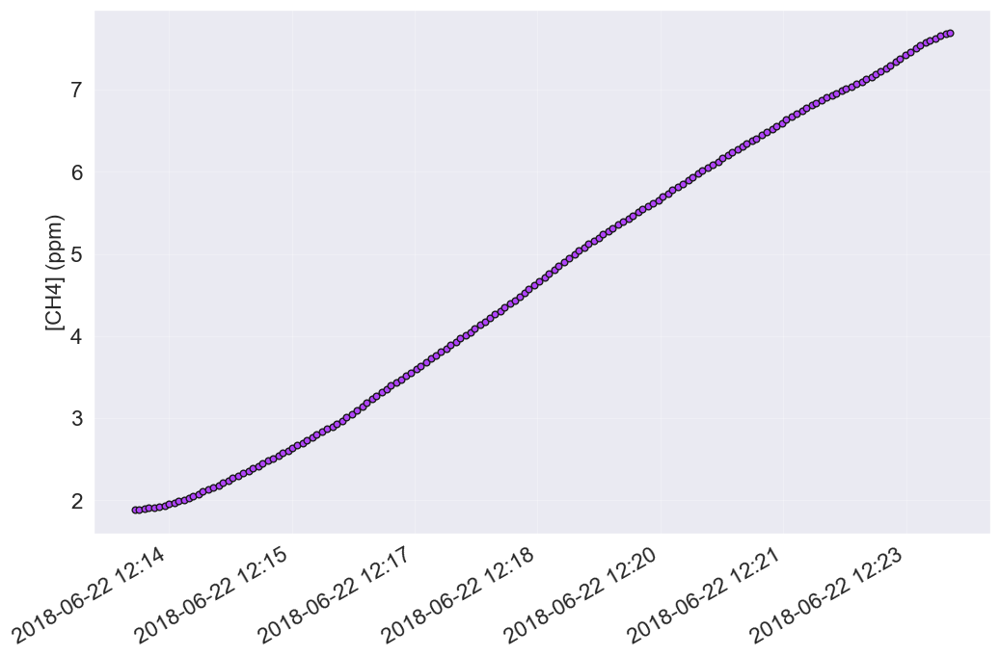

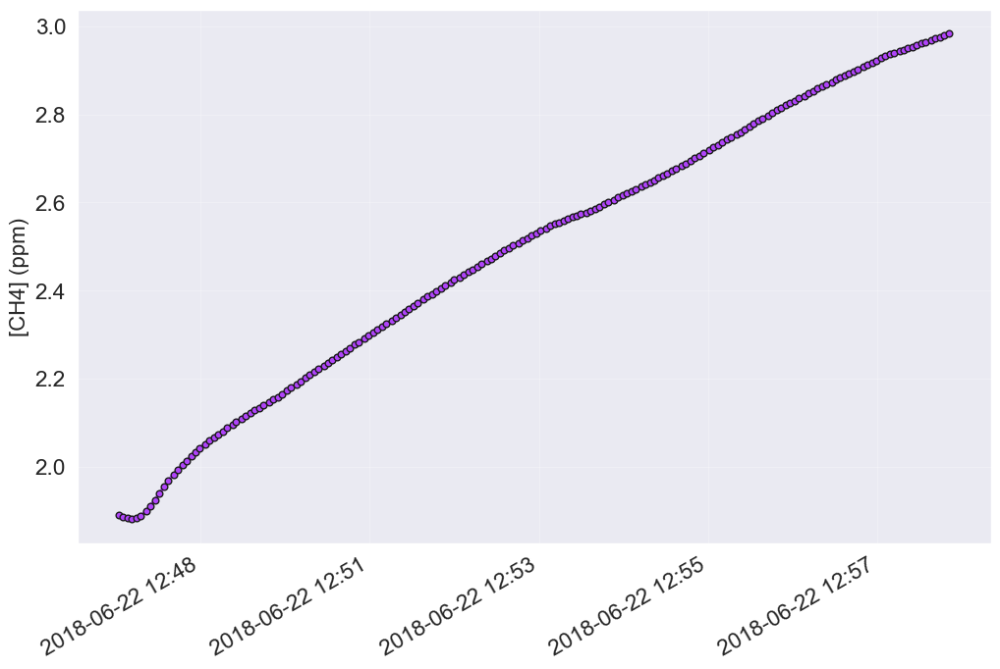

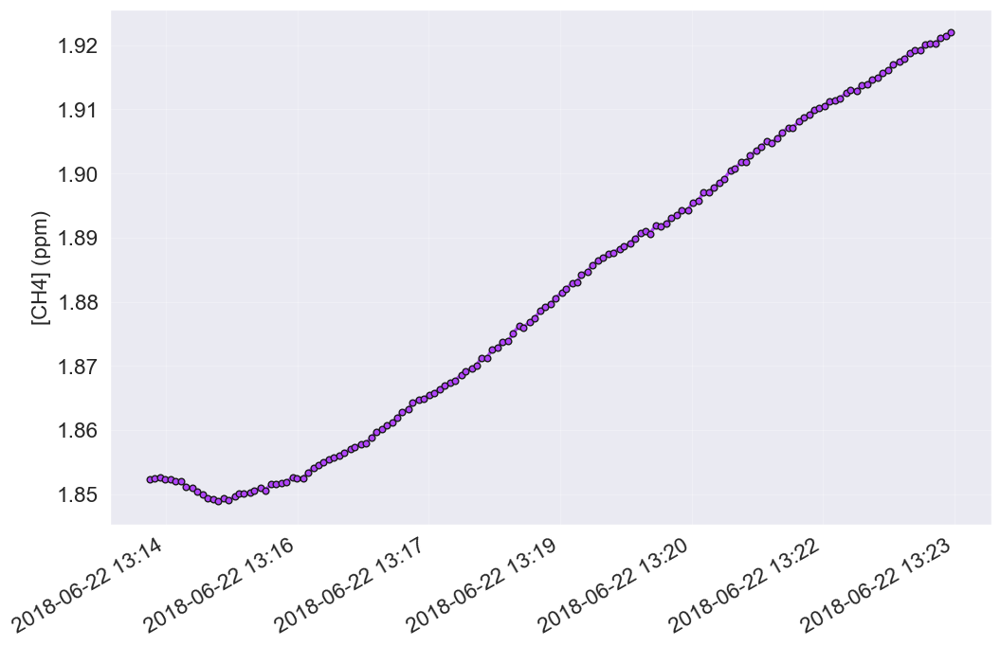

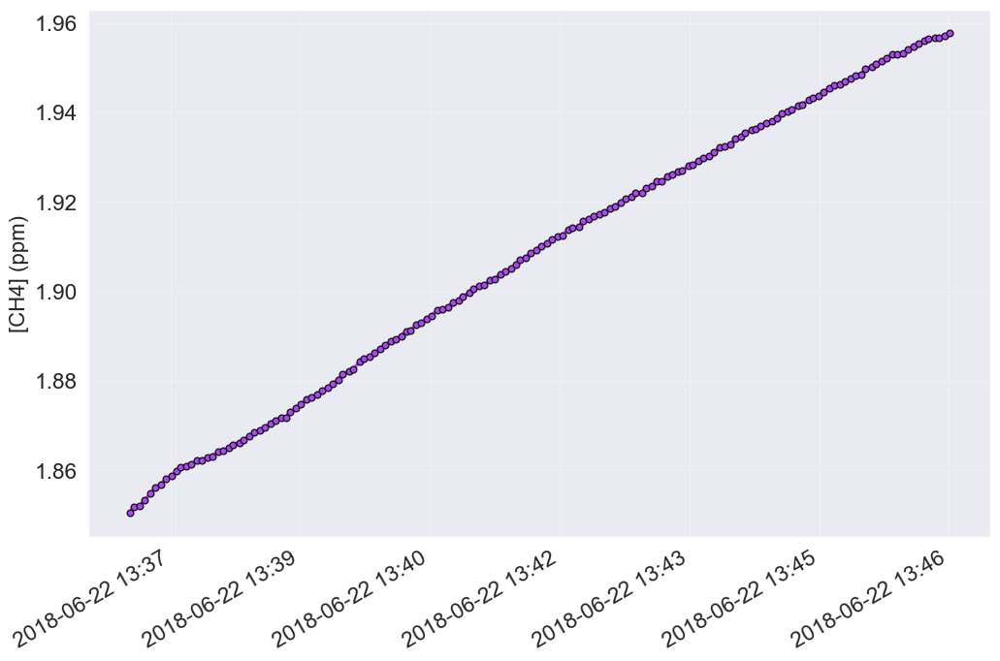

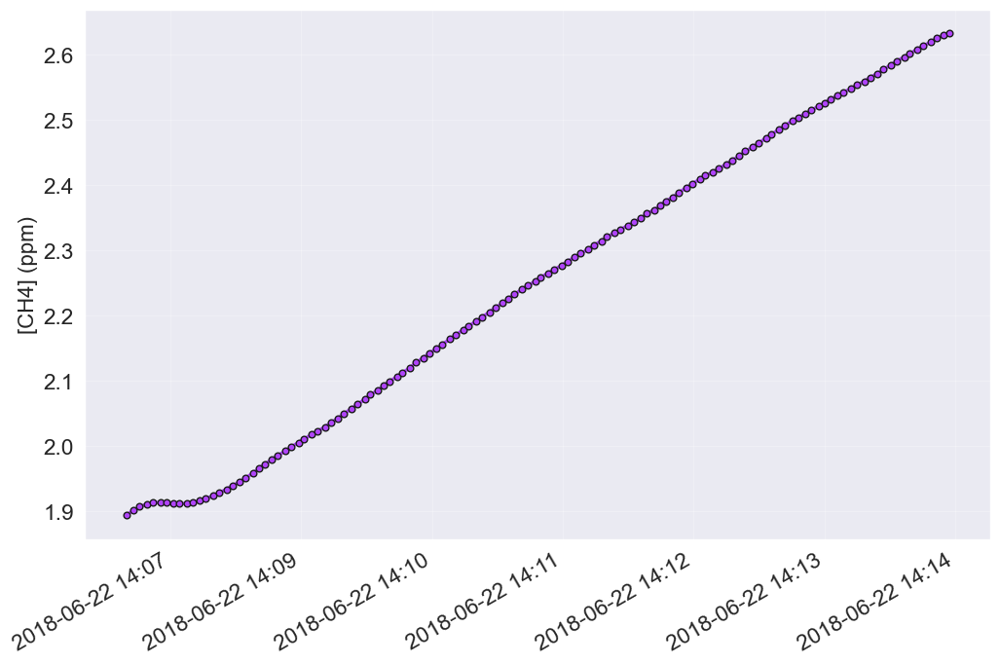

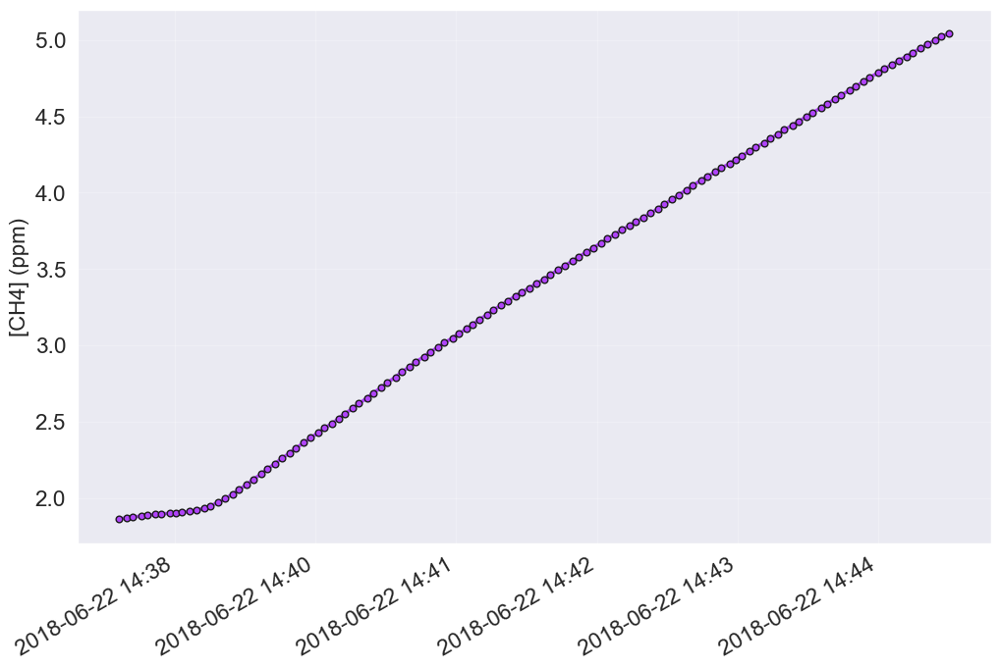

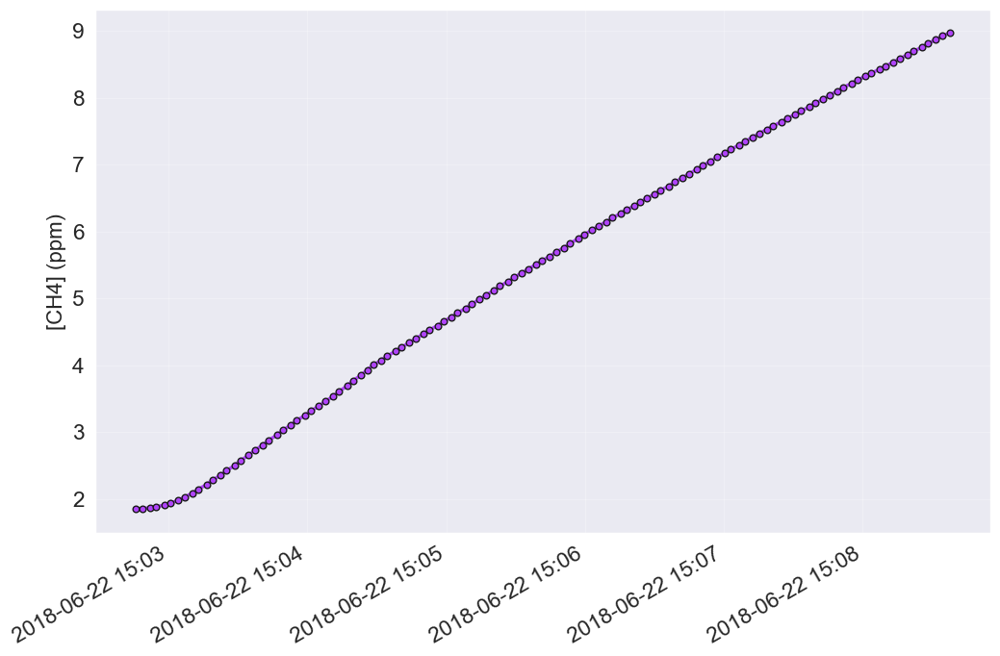

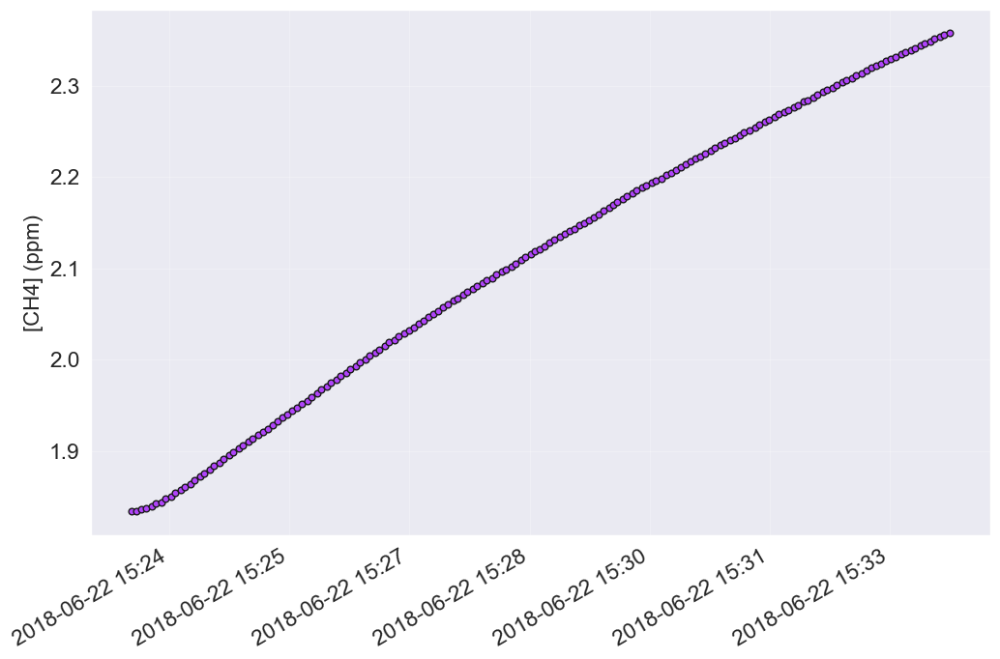

In [301]:
gvnt_conc_time_df = quantify_enclosure_perc_diff(
    gvnt_path,
    gvnt_sheet_name_list,
    save_output=True
)

gvnt_conc_time_df

## Calibration Gases

The Picarro (CRDS) was assessed several times before, during, and after this project. This subsection contains some of those results. The analysis completed in this section has been streamlined to be added to publications.

### Import calibration gas data

Some of this data has been preprocessed by legacy MATLAB files.

##### Zero Air

In [302]:
# zero air data collected 25 Aug 2015
"""These data were collected across two .xlsx files"""
# page 1
zair_2015_pg01 = pd.read_excel(
    "../../pertinent-data/calibration-data/CFIDS2136-20150825-1.xlsx",
    parse_dates={"datetime" : ["DATE", "TIME CST"]}
)
# page 2
zair_2015_pg02 = pd.read_excel(
    "../../pertinent-data/calibration-data/CFIDS2136-20150825-2.xlsx",
    parse_dates={"datetime" : ["DATE", "TIME CST"]}
)

# vertically concatenate pages
df_zair_2015_raw = pd.concat(
    [zair_2015_pg01, zair_2015_pg02]
)

df_zair_2015_raw.head()

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/989509468.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  zair_2015_pg01 = pd.read_excel(


/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/989509468.py:9: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  zair_2015_pg02 = pd.read_excel(


,datetime,FRAC_DAYS_SINCE_JAN1,FRAC_HRS_SINCE_JAN1,EPOCH_TIME,ALARM_STATUS,INST_STATUS,CavityPressure,CavityTemp,WarmBoxTemp,EtalonTemp,...,PPF_base_offset,PPF_slope_offset,PPF_shift,PPF_CH4_conc,PPF_H2O_conc,PPF_C2H6_conc,PPF_C2H4_conc,PPF_NH3_conc,PPF_H2S_conc,TIME
0,2015-08-25 11:31:38.303,236.438638,5674.527307,1.440520e+09,0,963,148.008724,44.895134,44.757439,44.528618,...,1.006612,0.203088,0.000792,1.851142,1.249788,-0.432444,0.004154,0.028523,-7.471180,16:31:38.303000
1,2015-08-25 11:31:39.624,236.438653,5674.527673,1.440520e+09,0,963,147.986718,44.894430,44.757079,44.527311,...,1.006612,0.203088,0.000792,1.851142,1.249788,-0.432444,0.004154,0.028523,-7.471180,16:31:39.624000
2,2015-08-25 11:31:40.114,236.438659,5674.527809,1.440520e+09,0,963,147.998566,44.892387,44.756035,44.523521,...,1.006612,0.203088,0.000792,1.851142,1.249788,-0.432444,0.004154,0.028523,-7.471180,16:31:40.114000
3,2015-08-25 11:31:40.608,236.438664,5674.527947,1.440520e+09,0,963,148.023238,44.892387,44.756035,44.523521,...,1.006612,0.203088,0.000792,1.851142,1.249788,-0.432444,0.004154,0.028523,-7.471180,16:31:40.608000
4,2015-08-25 11:31:41.894,236.438679,5674.528304,1.440520e+09,0,963,148.005508,44.892387,44.756035,44.523521,...,1.074970,0.220191,0.000752,1.855506,1.249576,-0.587432,0.001453,0.031922,-8.557252,16:31:41.894000


In [303]:
# select only the pertinent columns
df_zair_2015 = df_zair_2015_raw[[
    "datetime",
    "ALARM_STATUS",
    "HP_12CH4_dry",
    "HP_Delta_iCH4_Raw",
    "Delta_Raw_iCO2",
    "12CO2_dry"
  ]]

# set the index to datetime
df_zair_2015.set_index("datetime", drop=True, inplace=True)

df_zair_2015.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6691 entries, 2015-08-25 11:31:38.303000 to 2015-08-25 13:10:50.755000
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ALARM_STATUS       6691 non-null   int64  
 1   HP_12CH4_dry       6691 non-null   float64
 2   HP_Delta_iCH4_Raw  6691 non-null   float64
 3   Delta_Raw_iCO2     6691 non-null   float64
 4   12CO2_dry          6691 non-null   float64
dtypes: float64(4), int64(1)
memory usage: 313.6 KB


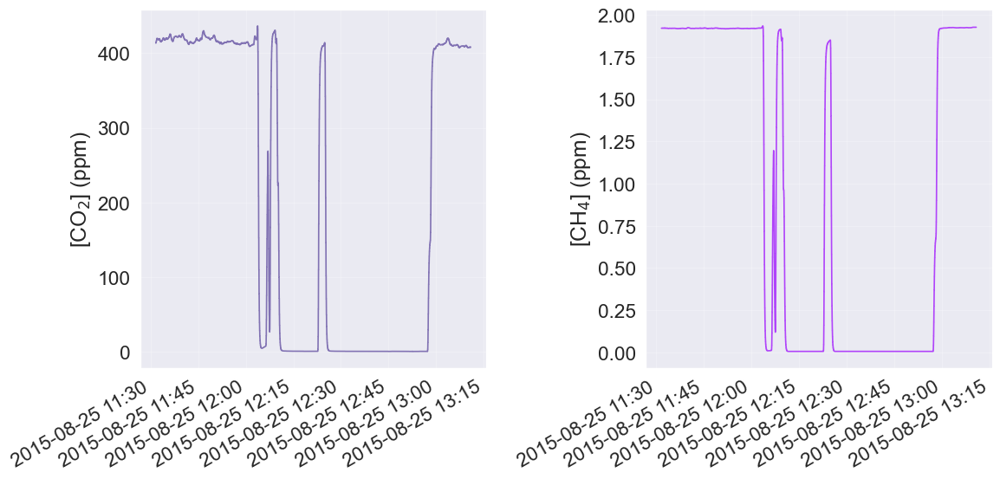

In [304]:
fig, ax = plt.subplots(1,2, figsize=(12,6))
matplotlib.rcParams.update({'font.size':22})

# co2
df_zair_2015.plot(y="12CO2_dry", color="m", ax=ax[0])
ax[0].xaxis.set_major_formatter(_datetick_format)
ax[0].set_xlabel("")
ax[0].set_ylabel("[CO$_{2}$] (ppm)")
ax[0].get_legend().remove()

# ch4
df_zair_2015.plot(y="HP_12CH4_dry", ax=ax[1])
ax[1].xaxis.set_major_formatter(_datetick_format)
ax[1].set_xlabel("")
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].get_legend().remove()

plt.tight_layout()
plt.show()

The chart above highlights at least two periods (longer than 10 minutes) where the zero air was hooked up to the CRDS. The longest period will be isolated and used to assess the sensitivity of the instrument. This period begins ~12:30 and is completed just before 13:00.


This section will be isolated as a new dataframe and the index will be the `datetime` column.

#### T-Iso 3 (Aug 2015)

In [305]:
# gather the 2015 T-iso data
tiso_2015_raw = pd.read_excel(
    "../../pertinent-data/calibration-data/CFIDS2136-20150819-ALL.xlsx",
    parse_dates={"datetime" : ["DATE", "TIME CST"]}
)

tiso_2015_raw.head()

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1629122133.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  tiso_2015_raw = pd.read_excel(


,datetime,FRAC_DAYS_SINCE_JAN1,FRAC_HRS_SINCE_JAN1,EPOCH_TIME,ALARM_STATUS,INST_STATUS,CavityPressure,CavityTemp,WarmBoxTemp,EtalonTemp,...,PPF_res,PPF_base_offset,PPF_slope_offset,PPF_shift,PPF_CH4_conc,PPF_H2O_conc,PPF_C2H6_conc,PPF_C2H4_conc,PPF_NH3_conc,PPF_H2S_conc
0,2015-08-19 14:02:44.059,230.543566,5533.045572,1.440011e+09,0,963,148.000202,44.844170,45.037895,44.775505,...,0.145703,0.965287,0.243023,0.001871,1.770598,1.334238,-0.570065,0.002868,0.036573,-9.118347
1,2015-08-19 14:02:45.375,230.543581,5533.045938,1.440011e+09,0,963,147.979561,44.851289,45.037050,44.774714,...,0.145703,0.965287,0.243023,0.001871,1.770598,1.334238,-0.570065,0.002868,0.036573,-9.118347
2,2015-08-19 14:02:45.861,230.543586,5533.046073,1.440011e+09,0,963,147.974686,44.852135,45.036949,44.774620,...,0.145703,0.965287,0.243023,0.001871,1.770598,1.334238,-0.570065,0.002868,0.036573,-9.118347
3,2015-08-19 14:02:46.348,230.543592,5533.046208,1.440011e+09,0,963,148.026702,44.852135,45.036949,44.774620,...,0.145703,0.965287,0.243023,0.001871,1.770598,1.334238,-0.570065,0.002868,0.036573,-9.118347
4,2015-08-19 14:02:47.757,230.543608,5533.046599,1.440011e+09,0,963,147.995234,44.852135,45.036949,44.774620,...,0.143207,1.006894,0.267561,0.001904,1.769560,1.333764,-0.655899,0.001295,0.037114,-9.609655


In [306]:
# select only the pertinent columns
df_tiso_raw_2015 = tiso_2015_raw[[
    "datetime",
    "ALARM_STATUS",
    "HP_12CH4_dry",
    "HR_12CH4_dry",
    "HP_Delta_iCH4_Raw",
    "HR_Delta_iCH4_Raw",
    "Delta_Raw_iCO2",
    "12CO2_dry"
  ]]

# set the index to datetime
df_tiso_raw_2015.set_index("datetime", drop=True, inplace=True)

df_tiso_raw_2015.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5664 entries, 2015-08-19 14:02:44.059000 to 2015-08-19 15:32:41.076000
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ALARM_STATUS       5664 non-null   int64  
 1   HP_12CH4_dry       5664 non-null   float64
 2   HR_12CH4_dry       5664 non-null   float64
 3   HP_Delta_iCH4_Raw  5664 non-null   float64
 4   HR_Delta_iCH4_Raw  5664 non-null   float64
 5   Delta_Raw_iCO2     5664 non-null   float64
 6   12CO2_dry          5664 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 354.0 KB


Simple plot of the raw T-Iso 3 data

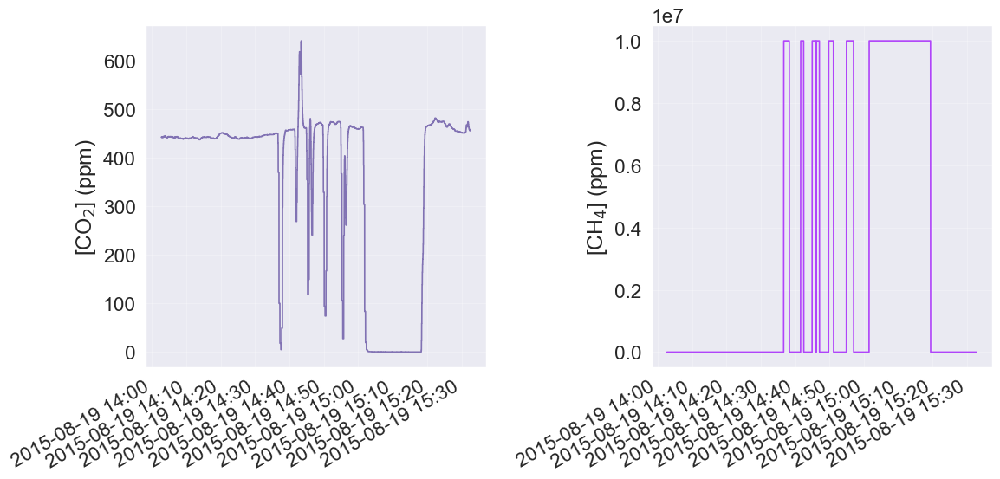

In [307]:
fig, ax = plt.subplots(1,2, figsize=(12,6))
matplotlib.rcParams.update({'font.size':22})

# co2
df_tiso_raw_2015.plot(y="12CO2_dry", color="m", ax=ax[0])
ax[0].xaxis.set_major_formatter(_datetick_format)
ax[0].set_xlabel("")
ax[0].set_ylabel("[CO$_{2}$] (ppm)")
ax[0].get_legend().remove()

# ch4
df_tiso_raw_2015.plot(y="HP_12CH4_dry", ax=ax[1])
ax[1].xaxis.set_major_formatter(_datetick_format)
ax[1].set_xlabel("")
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].get_legend().remove()

plt.tight_layout()
plt.show()

#### Calibration Session (April 2018)


In [308]:
# print the files in the .zip folder
with zipfile.ZipFile("../../pertinent-data/calibration-data/20180420-dat/20180420_crds_data_dat-files.zip", mode="r") as calib_datFile_2018:

  # get list of filenames and other ancillary information
  calib_datFile_2018.printdir()

File Name                                             Modified             Size
CFIDS2136-20180420-155045Z-DataLog_User.dat    2018-04-20 10:50:56      6599646
__MACOSX/._CFIDS2136-20180420-155045Z-DataLog_User.dat 2018-04-20 10:50:56          276
CFIDS2136-20180420-165055Z-DataLog_User.dat    2018-04-20 11:51:04      6578664
__MACOSX/._CFIDS2136-20180420-165055Z-DataLog_User.dat 2018-04-20 11:51:04          220
CFIDS2136-20180420-175102Z-DataLog_User.dat    2018-04-20 12:51:12      6562524
__MACOSX/._CFIDS2136-20180420-175102Z-DataLog_User.dat 2018-04-20 12:51:12          220
CFIDS2136-20180420-185110Z-DataLog_User.dat    2018-04-20 13:51:20      6568980
__MACOSX/._CFIDS2136-20180420-185110Z-DataLog_User.dat 2018-04-20 13:51:20          220
CFIDS2136-20180420-195118Z-DataLog_User.dat    2018-04-20 14:51:26      6581892
__MACOSX/._CFIDS2136-20180420-195118Z-DataLog_User.dat 2018-04-20 14:51:26          220
CFIDS2136-20180420-205125Z-DataLog_User.dat    2018-04-20 15:51:34      6589962


In [309]:
with zipfile.ZipFile("../../pertinent-data/calibration-data/20180420-dat/20180420_crds_data_dat-files.zip", mode="r") as calib_datFile_2018:

  # organize the filenames of .dat files into a list
  calib_files_lst = calib_datFile_2018.namelist()

  # filter for .dat files
  calib_datFiles = fnmatch.filter(calib_files_lst, "*.dat")

  try:
    # calib_datFile_2018.open
    # read the .dat files into dataframes
    data = [
        pd.read_fwf(calib_datFile_2018.open(file_name), encoding='latin-1') for file_name in calib_datFiles
      ]
  except Exception as e:
    print("The following error has occured:\n{}".format(e))

# concatenate files
df_calib_2018 = pd.concat(data)

# reset the index
df_calib_2018.reset_index(drop=True, inplace=True)

# drop the columns that were encoded incorrectly (see comment)
df_calib_2018.drop(
    df_calib_2018.columns[61:],
    axis=1,
    inplace=True
)
# drop the one missing row (observed through visual inspection - row 4088)
df_calib_2018.dropna(inplace=True)

# convert `DATE` to a datetime type
df_calib_2018["DATE"] = pd.to_datetime(df_calib_2018.DATE)
# convert `TIME` to a datetime type
df_calib_2018["TIME"] = pd.to_datetime(df_calib_2018.TIME)
# explicitly label the time as GMT (this is how it is read in the Picarro)
df_calib_2018["TIME"] = df_calib_2018.TIME.dt.tz_localize("GMT+0", nonexistent="NaT")
# convert time label into eastern timezon (calibration took place outside of Oak Ridge)
df_calib_2018["TIME"] = df_calib_2018.TIME.dt.tz_convert("US/Eastern")
# remove the deafult date so only time remains
df_calib_2018["TIME"] = df_calib_2018.TIME.dt.time
# combine `DATE` and `TIME` into a new series
_datetime = pd.to_datetime(df_calib_2018.DATE.astype(str) + " " + df_calib_2018.TIME.astype(str))
# insert series into dataframe after TIME
df_calib_2018.insert(2, "datetime", _datetime)

df_calib_2018["datetime"] = pd.to_datetime(
    df_calib_2018.datetime,
    format="%Y-%m-%d %H:%M:%S"
  )

df_calib_2018.set_index("datetime", drop=True, inplace=True)

# preview the data quality (i.e., non-null values and data types)
df_calib_2018.info()

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/3885308455.py:36: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_calib_2018["TIME"] = pd.to_datetime(df_calib_2018.TIME)


ValueError: time data "2018-04-20 10:58:45" doesn't match format "%Y-%m-%d %H:%M:%S.%f", at position 552. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

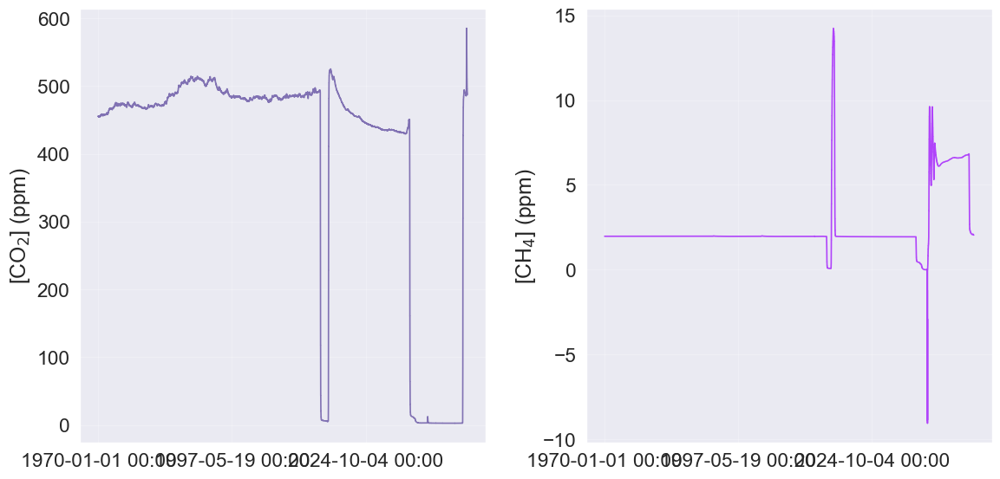

In [310]:
fig, ax = plt.subplots(1,2, figsize=(12,6))
matplotlib.rcParams.update({"font.size":22})

# co2
df_calib_2018.plot(y="12CO2_dry", color="m", ax=ax[0])
ax[0].xaxis.set_major_formatter(_datetick_format)
ax[0].set_xlabel("")
ax[0].set_ylabel("[CO$_{2}$] (ppm)")
ax[0].get_legend().remove()

# ch4
df_calib_2018.plot(y="HP_12CH4_dry", ax=ax[1])
ax[1].xaxis.set_major_formatter(_datetick_format)
ax[1].set_xlabel("")
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].get_legend().remove()

plt.tight_layout()
plt.show()

##### Field Prep Session (04 Apr 2018)

The machine was turned on to assess its readiness for the Summer 2018 field season.

The chart below shows that the machine was just turned on to measure laboratory air and nothing else. Therefore, it was not evaluated in the ["Analyze calibration data"](#analyze-calibration-data) section.

In [311]:
# print the files in the .zip folder
with zipfile.ZipFile("../../pertinent-data/calibration-data/20180404-dat/20180404_crds_data_dat-files.zip", mode="r") as calib_datFile_20180404:

  # get list of filenames and other ancillary information
  calib_datFile_20180404.printdir()

File Name                                             Modified             Size
CFIDS2136-20180404-144830Z-DataLog_User.dat    2018-04-04 08:54:08       611833
__MACOSX/._CFIDS2136-20180404-144830Z-DataLog_User.dat 2018-04-04 08:54:08          120
CFIDS2136-20180404-154021Z-DataLog_User.dat    2018-04-04 10:40:30      6588348
__MACOSX/._CFIDS2136-20180404-154021Z-DataLog_User.dat 2018-04-04 10:40:30          120
CFIDS2136-20180404-164029Z-DataLog_User.dat    2018-04-04 11:40:38      6549612
__MACOSX/._CFIDS2136-20180404-164029Z-DataLog_User.dat 2018-04-04 11:40:38          120
CFIDS2136-20180404-174036Z-DataLog_User.dat    2018-04-04 12:40:46      6551226
__MACOSX/._CFIDS2136-20180404-174036Z-DataLog_User.dat 2018-04-04 12:40:46          120
CFIDS2136-20180404-184044Z-DataLog_User.dat    2018-04-04 13:21:18      3828662
__MACOSX/._CFIDS2136-20180404-184044Z-DataLog_User.dat 2018-04-04 13:21:18          120


In [312]:
with zipfile.ZipFile("../../pertinent-data/calibration-data/20180404-dat/20180404_crds_data_dat-files.zip", mode="r") as calib_datFile_20180404:

  # organize the filenames of .dat files into a list
  calib_files_lst = calib_datFile_20180404.namelist()

  # filter for .dat files
  calib_datFiles = fnmatch.filter(calib_files_lst, "*.dat")

  # read the .dat files into dataframes
  data = [
      pd.read_fwf(calib_datFile_20180404.open(file_name), encoding='latin-1') for file_name in calib_datFiles
    ]

# concatenate files
df_calib_20180404 = pd.concat(data)

# reset the index
df_calib_20180404.reset_index(drop=True, inplace=True)

# drop the columns that were encoded incorrectly (see comment)
df_calib_20180404.drop(
    df_calib_20180404.columns[61:],
    axis=1,
    inplace=True
)
# drop the one missing row (observed through visual inspection - row 4088)
df_calib_20180404.dropna(inplace=True)

# convert `DATE` to a datetime type
df_calib_20180404["DATE"] = pd.to_datetime(df_calib_20180404.DATE)
# convert `TIME` to a datetime type
df_calib_20180404["TIME"] = pd.to_datetime(df_calib_20180404.TIME)
# explicitly label the time as GMT (this is how it is read in the Picarro)
df_calib_20180404["TIME"] = df_calib_20180404.TIME.dt.tz_localize("GMT+0", nonexistent="NaT")
# convert time label into eastern timezon (calibration took place outside of Oak Ridge)
df_calib_20180404["TIME"] = df_calib_20180404.TIME.dt.tz_convert("US/Eastern")
# remove the deafult date so only time remains
df_calib_20180404["TIME"] = df_calib_20180404.TIME.dt.time
# combine `DATE` and `TIME` into a new series
_datetime = pd.to_datetime(df_calib_20180404.DATE.astype(str) + " " + df_calib_20180404.TIME.astype(str))
# insert series into dataframe after TIME
df_calib_20180404.insert(2, "datetime", _datetime)

df_calib_20180404["datetime"] = pd.to_datetime(
    df_calib_20180404.datetime,
    format="%Y-%m-%d %H:%M:%S"
  )

df_calib_20180404.set_index("datetime", drop=True, inplace=True)

# preview the data quality (i.e., non-null values and data types)
df_calib_20180404.info()

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1596565354.py:32: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_calib_20180404["TIME"] = pd.to_datetime(df_calib_20180404.TIME)


ValueError: time data "2018-04-04 10:41:19" doesn't match format "%Y-%m-%d %H:%M:%S.%f", at position 449. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

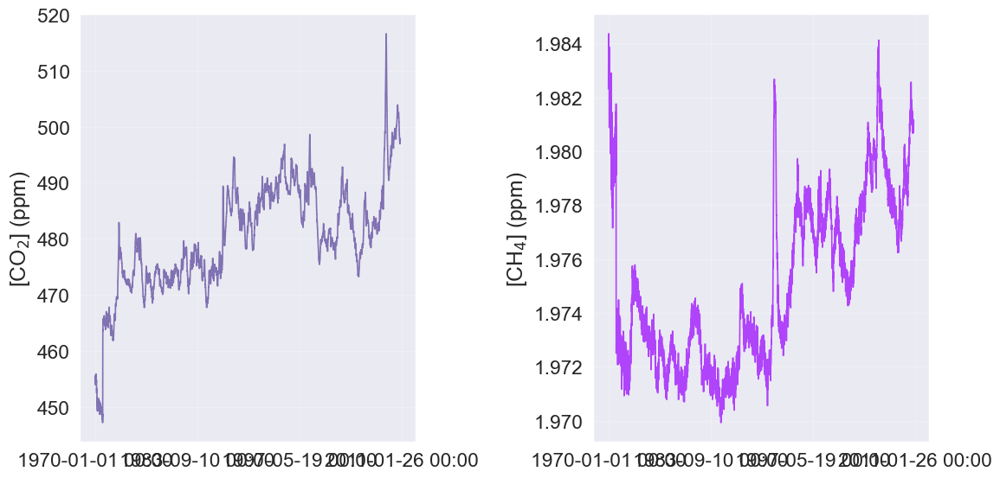

In [313]:
fig, ax = plt.subplots(1,2, figsize=(12,6))
matplotlib.rcParams.update({"font.size":22})

# co2
df_calib_20180404.plot(y="12CO2_dry", color="m", ax=ax[0])
ax[0].xaxis.set_major_formatter(_datetick_format)
ax[0].set_xlabel("")
ax[0].set_ylabel("[CO$_{2}$] (ppm)")
ax[0].get_legend().remove()

# ch4
df_calib_20180404.plot(y="HP_12CH4_dry", ax=ax[1])
ax[1].xaxis.set_major_formatter(_datetick_format)
ax[1].set_xlabel("")
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].get_legend().remove()

plt.tight_layout()
plt.show()

##### Field Prep Session (12 Apr 2018)

The machine was turned on to assess its readiness for the Summer 2018 field season.

Just as observed with the 04 Apr 2018 data, the chart below shows that the machine was just turned on to measure laboratory air. However, a brief attempt was made to measure what appears to be the diluted large CH4 cylinder. Therefore, it was not evaluated in the ["Analyze calibration data"](#analyze-calibration-data) section.

In [314]:
# print the files in the .zip folder
with zipfile.ZipFile("../../pertinent-data/calibration-data/20180412-dat/20180412_crds_data_dat-files.zip", mode="r") as calib_datFile_20180412:

  # get list of filenames and other ancillary information
  calib_datFile_20180412.printdir()

File Name                                             Modified             Size
CFIDS2136-20180412-160951Z-DataLog_User.dat    2018-04-12 11:10:00      6586734
__MACOSX/._CFIDS2136-20180412-160951Z-DataLog_User.dat 2018-04-12 11:10:00          120
CFIDS2136-20180412-170959Z-DataLog_User.dat    2018-04-12 12:10:08      6585120
__MACOSX/._CFIDS2136-20180412-170959Z-DataLog_User.dat 2018-04-12 12:10:08          120
CFIDS2136-20180412-181007Z-DataLog_User.dat    2018-04-12 13:10:16      6589962
__MACOSX/._CFIDS2136-20180412-181007Z-DataLog_User.dat 2018-04-12 13:10:16          120
CFIDS2136-20180412-191015Z-DataLog_User.dat    2018-04-12 14:10:24      6593190
__MACOSX/._CFIDS2136-20180412-191015Z-DataLog_User.dat 2018-04-12 14:10:24          120
CFIDS2136-20180412-201023Z-DataLog_User.dat    2018-04-12 15:10:32      6354318
__MACOSX/._CFIDS2136-20180412-201023Z-DataLog_User.dat 2018-04-12 15:10:32          120
CFIDS2136-20180412-211031Z-DataLog_User.dat    2018-04-12 15:26:02      1092061


In [315]:
with zipfile.ZipFile("../../pertinent-data/calibration-data/20180412-dat/20180412_crds_data_dat-files.zip", mode="r") as calib_datFile_20180412:

  # organize the filenames of .dat files into a list
  calib_files_lst = calib_datFile_20180412.namelist()

  # filter for .dat files
  calib_datFiles = fnmatch.filter(calib_files_lst, "*.dat")

  # read the .dat files into dataframes
  data = [
      pd.read_fwf(calib_datFile_20180412.open(file_name), encoding='latin-1') for file_name in calib_datFiles
    ]

# concatenate files
df_calib_20180412 = pd.concat(data)

# reset the index
df_calib_20180412.reset_index(drop=True, inplace=True)

# drop the columns that were encoded incorrectly (see comment)
df_calib_20180412.drop(
    df_calib_20180412.columns[61:],
    axis=1,
    inplace=True
)
# drop the one missing row (observed through visual inspection - row 4088)
df_calib_20180412.dropna(inplace=True)

# convert `DATE` to a datetime type
df_calib_20180412["DATE"] = pd.to_datetime(df_calib_20180412.DATE)
# convert `TIME` to a datetime type
df_calib_20180412["TIME"] = pd.to_datetime(df_calib_20180412.TIME)
# explicitly label the time as GMT (this is how it is read in the Picarro)
df_calib_20180412["TIME"] = df_calib_20180412.TIME.dt.tz_localize("GMT+0", nonexistent="NaT")
# convert time label into eastern timezon (calibration took place outside of Oak Ridge)
df_calib_20180412["TIME"] = df_calib_20180412.TIME.dt.tz_convert("US/Eastern")
# remove the deafult date so only time remains
df_calib_20180412["TIME"] = df_calib_20180412.TIME.dt.time
# combine `DATE` and `TIME` into a new series
_datetime = pd.to_datetime(df_calib_20180412.DATE.astype(str) + " " + df_calib_20180412.TIME.astype(str))
# insert series into dataframe after TIME
df_calib_20180412.insert(2, "datetime", _datetime)

df_calib_20180412["datetime"] = pd.to_datetime(
    df_calib_20180412.datetime,
    format="%Y-%m-%d %H:%M:%S"
  )

df_calib_20180412.set_index("datetime", drop=True, inplace=True)

# preview the data quality (i.e., non-null values and data types)
df_calib_20180412.info()

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2965414435.py:32: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_calib_20180412["TIME"] = pd.to_datetime(df_calib_20180412.TIME)


ValueError: time data "2018-04-12 11:17:37" doesn't match format "%Y-%m-%d %H:%M:%S.%f", at position 531. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

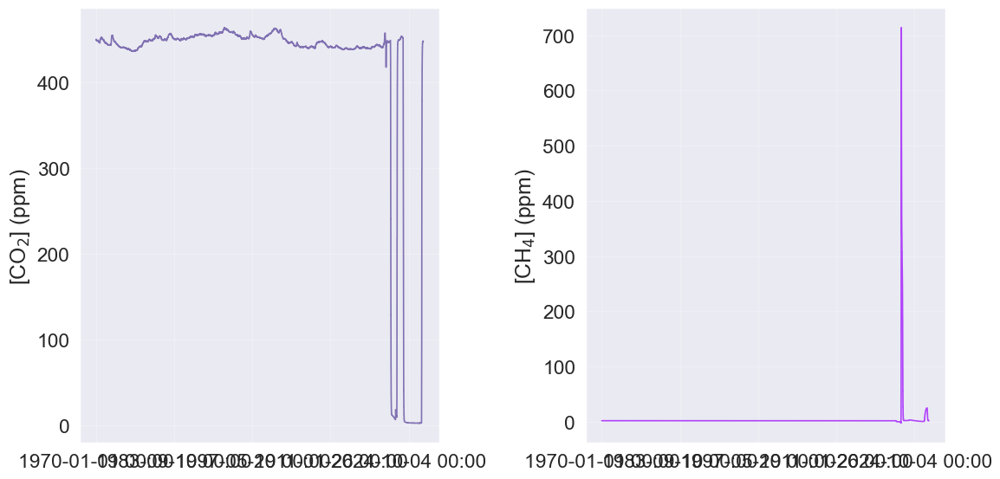

In [316]:
fig, ax = plt.subplots(1,2, figsize=(12,6))
matplotlib.rcParams.update({"font.size":22})

# co2
df_calib_20180412.plot(y="12CO2_dry", color="m", ax=ax[0])
ax[0].xaxis.set_major_formatter(_datetick_format)
ax[0].set_xlabel("")
ax[0].set_ylabel("[CO$_{2}$] (ppm)")
ax[0].get_legend().remove()

# ch4
df_calib_20180412.plot(y="HR_12CH4_dry", ax=ax[1])
ax[1].xaxis.set_major_formatter(_datetick_format)
ax[1].set_xlabel("")
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].get_legend().remove()

plt.tight_layout()
plt.show()

#### Calibration Session (May 2019)

Extract the May 2019 calibration data. This data was not stored as a [flat file](https://www.pcmag.com/encyclopedia/term/flat-file). Instead, the data collected in this session was store in a [HDF](https://asdc.larc.nasa.gov/documents/tools/hdf.pdf) file. Thus, the extraction process is different than others.

In [317]:
# print the files in the .zip folder
with zipfile.ZipFile("../../pertinent-data/calibration-data/DataLog_Private_20190523_223822.zip", mode="r") as calib_datFile_2019:

  # get list of filenames and other ancillary information
  calib_datFile_2019.printdir()

File Name                                             Modified             Size
Picarro/G2000/Log/DataLogger/DataLog_Private/CFIDS2136-20180706-211156Z-DataLog_Private.h5 2018-07-06 16:37:10       522260
Picarro/G2000/Log/DataLogger/DataLog_Private/CFIDS2136-20190523-173753Z-DataLog_Private.h5 2019-05-23 13:37:58      1453335
Picarro/G2000/Log/DataLogger/DataLog_Private/CFIDS2136-20190523-183759Z-DataLog_Private.h5 2019-05-23 14:38:04      1455926
Picarro/G2000/Log/DataLogger/DataLog_Private/CFIDS2136-20190523-193804Z-DataLog_Private.h5 2019-05-23 15:38:10      1428461
Picarro/G2000/Log/DataLogger/DataLog_Private/CFIDS2136-20190523-203811Z-DataLog_Private.h5 2019-05-23 16:38:16      1430886
Picarro/G2000/Log/DataLogger/DataLog_Private/CFIDS2136-20190523-213817Z-DataLog_Private.h5 2019-05-23 17:38:22      1433222


This list comprehension will get every subdirectory in the directory down to the one holding the data. Thus indexing by `-1` will get the full path to the subdirectory holding the `.h5` files with the relevant data.

In [318]:
subdirs_h5 = [x[0] for x in os.walk("../../pertinent-data/calibration-data/20190523-h5")]
path_to_h5_data = subdirs_h5[-1]

In [319]:
lst_h5_paths = glob.glob(os.path.join(path_to_h5_data, "*.h5"))

In [320]:
# establish an empty list to hold the concatenated data
calib_raw_may2019 = pd.DataFrame([])

for h5 in lst_h5_paths:
  if "-2019" in h5:
    with h5py.File(h5, "r") as f:
      print("Keys: {}".format(f.keys()))
      ar = np.array(f["results"])
      df = pd.DataFrame(ar)

      # concatenate to the output dataframe
      calib_raw_may2019 = pd.concat([calib_raw_may2019, df])

calib_raw_may2019.shape

Keys: <KeysViewHDF5 ['results']>
Keys: <KeysViewHDF5 ['results']>
Keys: <KeysViewHDF5 ['results']>
Keys: <KeysViewHDF5 ['results']>
Keys: <KeysViewHDF5 ['results']>


(20462, 245)

In [321]:
# convert epoch time to a readable datetime
_datetime = calib_raw_may2019.time.map(
  lambda x: time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(x))
)

# insert into the dataframe on the far left
calib_raw_may2019.insert(
    0, "datetime", _datetime
)

# rename columns to match others dataframes
# calib_raw_may2019 = (
#     calib_raw_may2019
#     # .rename_column("12CH4_raw_dry","HP_12CH4_dry")
#     # .rename_column("12CH4_high_range","HR_12CH4_dry")
#     # .rename_column("HP_Delta_iCH4_Raw","HP_Delta_iCH4_Raw")
#     # .rename_column("HR_Delta_iCH4_Raw","HR_Delta_iCH4_Raw")
#     # .rename_column("12CO2_dry","12CO2_dry")
#     # .rename_column("Delta_Raw_iCO2","Delta_Raw_iCO2")
#     # .rename_column("ALARM_STATUS","ALARM_STATUS")
# )

calib_raw_may2019.head()

,datetime,12CH4_high_range,12CH4_raw,12CH4_raw_dry,12CO2,12CO2_dry,12CO2_ppm_dry,12CO2_ppm_wet,13CH4_raw,13CH4_raw_dry,...,wlm7_offset,wlm8_offset,y87_ave,y88,y_0,y_30,y_5,y_87,z87_ave,z88
0,2019-05-23 11:37:47,2.091470,2.324511,2.349506,452.963593,458.328796,470.817261,465.310181,0.024927,0.0,...,0.0,-0.037788,1.721676,1.918208,1.163182,1.403278,1.123634,1.717464,0.553519,0.616704
1,2019-05-23 11:37:48,2.091470,2.324511,2.349506,452.963593,458.328796,470.817261,465.310181,0.024927,0.0,...,0.0,-0.037788,1.721676,1.918062,1.163182,1.403278,1.123634,1.717464,0.553519,0.616657
2,2019-05-23 11:37:48,2.091470,2.324511,2.349506,453.066223,458.423584,470.914581,465.415527,0.024927,0.0,...,0.0,-0.037788,1.724164,1.918062,1.163182,1.403278,1.123634,1.731627,0.554319,0.616657
3,2019-05-23 11:37:49,2.091470,2.324511,2.349506,453.066223,458.423584,470.914581,465.415527,0.024927,0.0,...,0.0,-0.037788,1.724164,1.921034,1.163182,1.403278,1.123634,1.731627,0.554319,0.617612
4,2019-05-23 11:37:50,2.095109,2.328548,2.353544,453.066223,458.423584,470.914581,465.415527,0.024946,0.0,...,0.0,-0.037778,1.724164,1.921034,1.160758,1.389068,1.121292,1.731627,0.554319,0.617612


In [322]:
# select only the pertinent columns
df_calib_raw_may2019 = calib_raw_may2019[[
    "datetime",
    "ALARM_STATUS",
    "HP_12CH4_dry",
    "HR_12CH4_dry",
    "HP_Delta_iCH4_Raw",
    "HR_Delta_iCH4_Raw",
    "Delta_Raw_iCO2",
    "12CO2_dry"
  ]]

# set datetime to a datetime object
df_calib_raw_may2019["datetime"] = pd.to_datetime(
    df_calib_raw_may2019.datetime,
    format="%Y-%m-%d %H:%M:%S"
  )

# set the index to datetime
df_calib_raw_may2019.set_index("datetime", drop=True, inplace=True)

df_calib_raw_may2019.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 20462 entries, 2019-05-23 11:37:47 to 2019-05-23 16:38:16
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ALARM_STATUS       20462 non-null  float32
 1   HP_12CH4_dry       20462 non-null  float32
 2   HR_12CH4_dry       20462 non-null  float32
 3   HP_Delta_iCH4_Raw  20462 non-null  float32
 4   HR_Delta_iCH4_Raw  20462 non-null  float32
 5   Delta_Raw_iCO2     20462 non-null  float32
 6   12CO2_dry          20462 non-null  float32
dtypes: float32(7)
memory usage: 719.4 KB


/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2964451078.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_calib_raw_may2019["datetime"] = pd.to_datetime(


Simple plot of calibration session

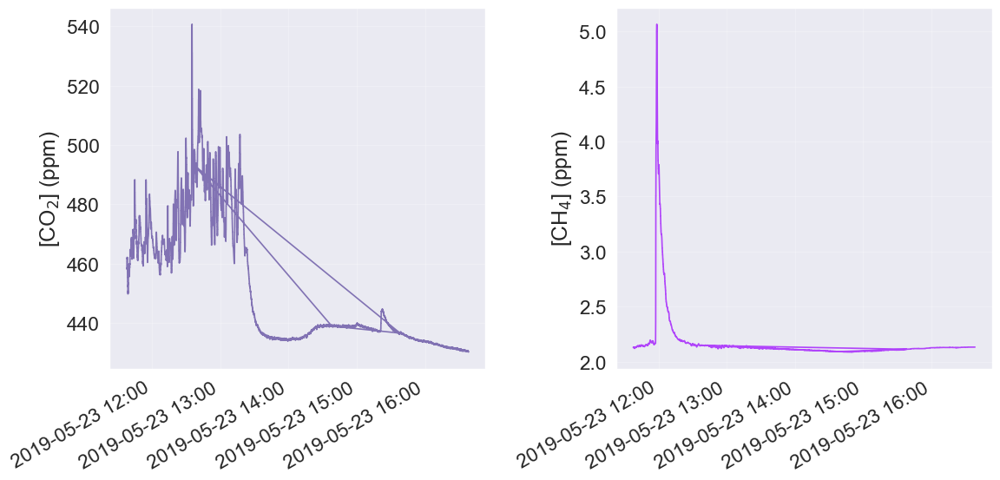

In [323]:
fig, ax = plt.subplots(1,2, figsize=(12,6))
matplotlib.rcParams.update({'font.size':22})

# co2
df_calib_raw_may2019.plot(y="12CO2_dry", color="m", ax=ax[0])
ax[0].xaxis.set_major_formatter(_datetick_format)
ax[0].set_xlabel("")
ax[0].set_ylabel("[CO$_{2}$] (ppm)")
ax[0].get_legend().remove()

# ch4
df_calib_raw_may2019.plot(y="HP_12CH4_dry", ax=ax[1])
ax[1].xaxis.set_major_formatter(_datetick_format)
ax[1].set_xlabel("")
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].get_legend().remove()

plt.tight_layout()
plt.show()

#### Calibration Session (Aug 2019)

In [324]:
# calibration session (Aug 2019)
calib_data_aug2019_raw = (
    pd.read_csv(
    "../../pertinent-data/calibration-data/CALB_21Aug2019.csv"
  )
  .rename_column("Time","datetime")
  .rename_column("HP_CH4_dry","HP_12CH4_dry")
  .rename_column("HR_CH4_dry","HR_12CH4_dry")
  .rename_column("HP_d13_CH4","HP_Delta_iCH4_Raw")
  .rename_column("HR_d13_CH4","HR_Delta_iCH4_Raw")
  .rename_column("CO2_dry","12CO2_dry")
  .rename_column("d13_CO2","Delta_Raw_iCO2")
  .rename_column("Alarm_Status","ALARM_STATUS")
)

calib_data_aug2019_raw.head()

/Users/moyoajayi/Documents/projects/environmental-science/caldera-gases/.venv/lib/python3.12/site-packages/pandas_flavor/register.py:161: FutureWarning: This function will be deprecated in a 1.x release. Please use `pd.DataFrame.rename` instead.
  return method(self._obj, *args, **kwargs)


,datetime,Rel_Sec,HP_12CH4_dry,HR_12CH4_dry,HP_Delta_iCH4_Raw,HR_Delta_iCH4_Raw,12CO2_dry,Delta_Raw_iCO2,ALARM_STATUS
0,21-Aug-2019 15:05:18,0.000,1.956742,1.986554,-158.359148,-158.359148,593.464351,-169.361805,0
1,21-Aug-2019 15:05:22,3.745,1.957195,1.987020,-158.176069,-158.176069,596.560140,-171.214172,0
2,21-Aug-2019 15:05:26,7.506,1.956247,1.986128,-157.622903,-157.622903,595.850652,-168.224238,0
3,21-Aug-2019 15:05:29,11.251,1.957495,1.987391,-157.744035,-157.744035,596.482923,-167.872452,0
4,21-Aug-2019 15:05:33,15.063,1.957596,1.987626,-154.232839,-154.232839,596.479245,-168.028950,0


In [325]:
# select only the pertinent columns
df_calib_raw_aug2019 = calib_data_aug2019_raw[[
    "datetime",
    "ALARM_STATUS",
    "HP_12CH4_dry",
    "HR_12CH4_dry",
    "HP_Delta_iCH4_Raw",
    "HR_Delta_iCH4_Raw",
    "Delta_Raw_iCO2",
    "12CO2_dry"
  ]]

df_calib_raw_aug2019["datetime"] = pd.to_datetime(
    df_calib_raw_aug2019.datetime
  )

# set the index to datetime
df_calib_raw_aug2019.set_index("datetime", drop=True, inplace=True)

df_calib_raw_aug2019.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3069 entries, 2019-08-21 15:05:18 to 2019-08-21 18:22:13
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ALARM_STATUS       3069 non-null   int64  
 1   HP_12CH4_dry       3069 non-null   float64
 2   HR_12CH4_dry       3069 non-null   float64
 3   HP_Delta_iCH4_Raw  3069 non-null   float64
 4   HR_Delta_iCH4_Raw  3069 non-null   float64
 5   Delta_Raw_iCO2     3069 non-null   float64
 6   12CO2_dry          3069 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 191.8 KB


/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/2562336157.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_calib_raw_aug2019["datetime"] = pd.to_datetime(


Simple plot of calibration session

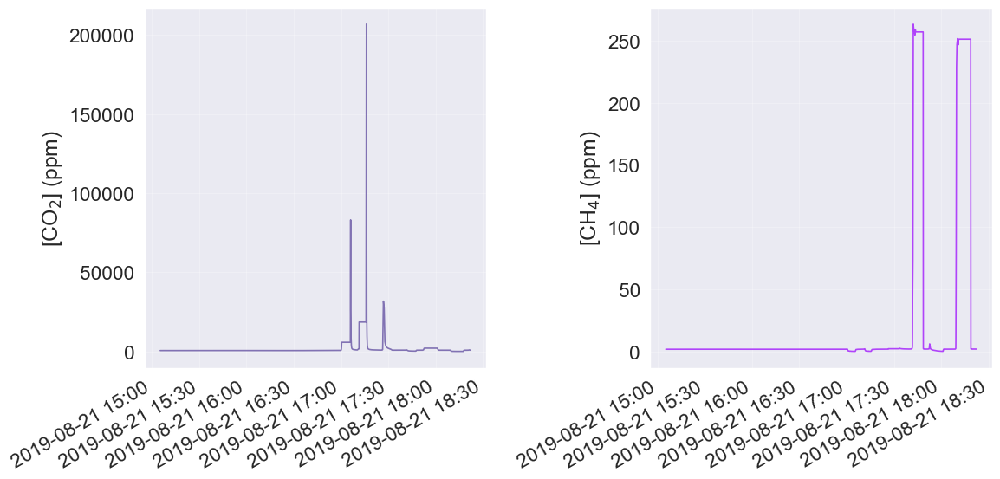

In [326]:
fig, ax = plt.subplots(1,2, figsize=(12,6))
matplotlib.rcParams.update({"font.size":22})

# co2
df_calib_raw_aug2019.plot(y="12CO2_dry", color="m", ax=ax[0])
ax[0].xaxis.set_major_formatter(_datetick_format)
ax[0].set_xlabel("")
ax[0].set_ylabel("[CO$_{2}$] (ppm)")
ax[0].get_legend().remove()

# ch4
df_calib_raw_aug2019.plot(y="HP_12CH4_dry", ax=ax[1])
ax[1].xaxis.set_major_formatter(_datetick_format)
ax[1].set_xlabel("")
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].get_legend().remove()

plt.tight_layout()
plt.show()

#### Calibration Session (Jun 2020)

The import process for this subset of data is more complex than those above because a series of `.dat` files (pulled directly from the machine as opposed to having been manually copied and pasted into a `.xlsx` file) needs to be ingested from a `.zip` folder. Once ingested, a short set of steps are required to prepare the data for analysis.

In [327]:
# print the files in the .zip folder
with zipfile.ZipFile("../../pertinent-data/calibration-data/15Jun.zip", mode="r") as calib_datFile_2020:

  # get list of filenames and other ancillary information
  calib_datFile_2020.printdir()

File Name                                             Modified             Size
15/CFIDS2136-20200615-004041Z-DataLog_User.dat 2020-06-14 21:40:50      4630572
15/CFIDS2136-20200615-014049Z-DataLog_User.dat 2020-06-14 22:40:58      4617680
15/CFIDS2136-20200615-024057Z-DataLog_User.dat 2020-06-14 23:41:08      4609476
15/CFIDS2136-20200615-034106Z-DataLog_User.dat 2020-06-15 00:41:16      4601272
15/CFIDS2136-20200615-044115Z-DataLog_User.dat 2020-06-15 01:41:24      4614164
15/CFIDS2136-20200615-054122Z-DataLog_User.dat 2020-06-15 02:41:32      4623540
15/CFIDS2136-20200615-064130Z-DataLog_User.dat 2020-06-15 03:41:40      4598928
15/CFIDS2136-20200615-074139Z-DataLog_User.dat 2020-06-15 04:41:48      4596584
15/CFIDS2136-20200615-084146Z-DataLog_User.dat 2020-06-15 05:41:56      4638776
15/CFIDS2136-20200615-094154Z-DataLog_User.dat 2020-06-15 06:42:02      4586036
15/CFIDS2136-20200615-104200Z-DataLog_User.dat 2020-06-15 07:42:10      4635260
15/CFIDS2136-20200615-114211Z-DataLog_Us

The compressed folder contains a secondary folder (`15/`) and beneath that are 21 `.dat` files containing data from the calibration session. The instrument was running continuously during this time. Thus, list all of the filenames and extract the `.dat` files into a dataframe

In [328]:
with zipfile.ZipFile("../../pertinent-data/calibration-data/15Jun.zip", mode="r") as calib_datFile_2020:

  # organize the filenames of .dat files into a list
  calib_files_lst = calib_datFile_2020.namelist()

  # filter for .dat files
  calib_datFiles = fnmatch.filter(calib_files_lst, "*.dat")

  # read the .dat files into dataframes
  data = [
      pd.read_fwf(calib_datFile_2020.open(file_name)) for file_name in calib_datFiles
    ]

# concatenate files
df_calib_2020 = pd.concat(data)

# reset the index
df_calib_2020.reset_index(drop=True, inplace=True)

# convert `DATE` to a datetime type
df_calib_2020["DATE"] = pd.to_datetime(df_calib_2020.DATE)
# convert `TIME` to a datetime type
df_calib_2020["TIME"] = pd.to_datetime(df_calib_2020.TIME)
# explicitly label the time as GMT (this is how it is read in the Picarro)
df_calib_2020["TIME"] = df_calib_2020.TIME.dt.tz_localize("GMT+0", nonexistent="NaT")
# convert time label into eastern timezon (calibration took place outside of Oak Ridge)
df_calib_2020["TIME"] = df_calib_2020.TIME.dt.tz_convert("US/Eastern")
# remove the deafult date so only time remains
df_calib_2020["TIME"] = df_calib_2020.TIME.dt.time
# combine `DATE` and `TIME` into a new series
_datetime = pd.to_datetime(df_calib_2020.DATE.astype(str) + " " + df_calib_2020.TIME.astype(str))
# insert series into dataframe after TIME
df_calib_2020.insert(2, "datetime", _datetime)

df_calib_2020["datetime"] = pd.to_datetime(
    df_calib_2020.datetime,
    format="%Y-%m-%d %H:%M:%S"
  )

df_calib_2020.set_index("datetime", drop=True, inplace=True)

# preview the data quality (i.e., non-null values and data types)
df_calib_2020.info()

/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/703344093.py:23: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_calib_2020["TIME"] = pd.to_datetime(df_calib_2020.TIME)


ValueError: time data "2020-06-15 19:50:02" doesn't match format "%Y-%m-%d %H:%M:%S.%f", at position 628. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

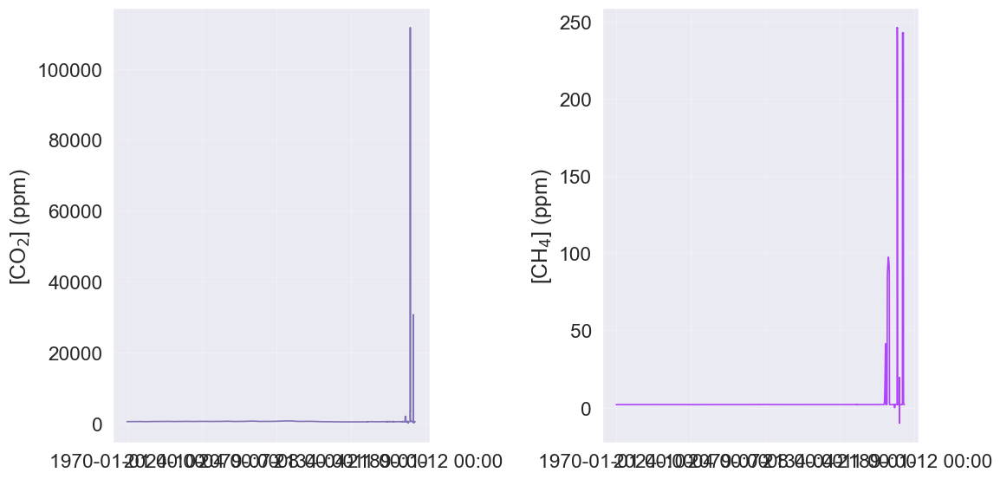

In [329]:
fig, ax = plt.subplots(1,2, figsize=(12,6))
matplotlib.rcParams.update({"font.size":22})

# co2
df_calib_2020.plot(y="12CO2_dry", color="m", ax=ax[0])
ax[0].xaxis.set_major_formatter(_datetick_format)
ax[0].set_xlabel("")
ax[0].set_ylabel("[CO$_{2}$] (ppm)")
ax[0].get_legend().remove()

# ch4
df_calib_2020.plot(y="HR_12CH4_dry", ax=ax[1])
ax[1].xaxis.set_major_formatter(_datetick_format)
ax[1].set_xlabel("")
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].get_legend().remove()

plt.tight_layout()
plt.show()

### Analyze calibration data

#### Zero Air

<>:36: SyntaxWarning: invalid escape sequence '\d'
<>:45: SyntaxWarning: invalid escape sequence '\d'
<>:36: SyntaxWarning: invalid escape sequence '\d'
<>:45: SyntaxWarning: invalid escape sequence '\d'
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1319964500.py:36: SyntaxWarning: invalid escape sequence '\d'
  ax[1,0].set_ylabel("$\delta^{13}$CO$_{2}$ (per mil)")
/var/folders/p9/0q1lfs6j4kv_1cjl81bz74b40000gn/T/ipykernel_2775/1319964500.py:45: SyntaxWarning: invalid escape sequence '\d'
  ax[1,1].set_ylabel("$\delta^{13}$CH$_{4}$ (per mil)")


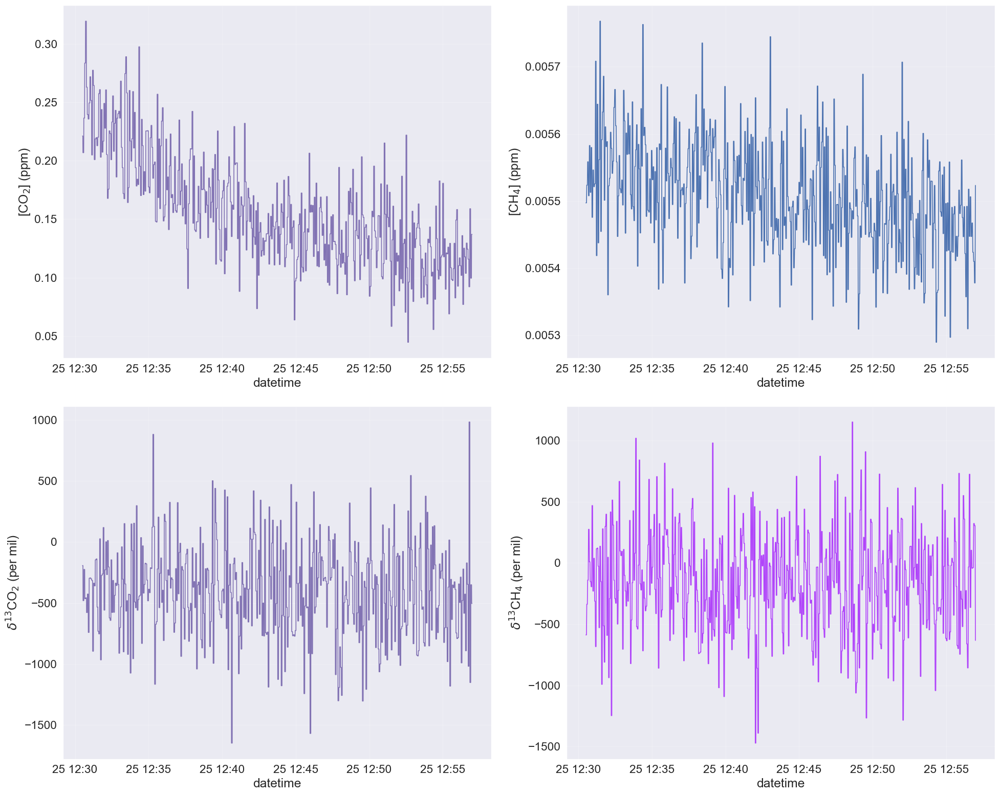

In [330]:
# isolate the calibaration section
df_zair_calib_2015 = df_zair_2015.between_time(
    "12:30:30",
    "12:57:00"
)

fig, ax = plt.subplots(2,2, figsize=(20,16), sharey=False)
# co2
sns.lineplot(
    data=df_zair_calib_2015,
    x=df_zair_calib_2015.index,
    y="12CO2_dry",
    color="m",
    ax=ax[0,0]
  )
ax[0,0].set_ylabel("[CO$_{2}$] (ppm)")

# ch4
sns.lineplot(
    data=df_zair_calib_2015,
    x=df_zair_calib_2015.index,
    y="HP_12CH4_dry",
    color="b",
    ax=ax[0,1]
  )
ax[0,1].set_ylabel("[CH$_{4}$] (ppm)")

# co2
sns.lineplot(
    data=df_zair_calib_2015,
    x=df_zair_calib_2015.index,
    y="Delta_Raw_iCO2",
    color="m",
    ax=ax[1,0]
  )
ax[1,0].set_ylabel("$\delta^{13}$CO$_{2}$ (per mil)")

# ch4
sns.lineplot(
    data=df_zair_calib_2015,
    x=df_zair_calib_2015.index,
    y="HP_Delta_iCH4_Raw",
    ax=ax[1,1]
  )
ax[1,1].set_ylabel("$\delta^{13}$CH$_{4}$ (per mil)")

plt.tight_layout()
plt.show()

The chart above will account represents the calibration period. The descriptive stats for this period are shown below.

In [331]:
"""get descriptive statistics for the calibration period"""
df_zair_calib_2015_descrip = df_zair_calib_2015.describe()

df_zair_calib_2015_descrip

,ALARM_STATUS,HP_12CH4_dry,HP_Delta_iCH4_Raw,Delta_Raw_iCO2,12CO2_dry
count,1785.0,1785.000000,1785.000000,1785.000000,1785.000000
mean,0.0,0.005508,-153.125988,-402.374306,0.157071
std,0.0,0.000082,432.070249,381.424868,0.047474
min,0.0,0.005289,-1471.959348,-1648.426173,0.044575
25%,0.0,0.005452,-456.192341,-663.371353,0.120998
50%,0.0,0.005507,-167.640272,-387.132346,0.151698
75%,0.0,0.005565,118.712410,-174.525516,0.183490
max,0.0,0.005768,1151.788338,983.735895,0.319511


The lower bound of detecttion ($3 * \sigma$, where $\sigma$ = standard deviation)

In [332]:
# co2
print(
    "The lower level of quantification for the CRDS when measuring the concentration of CO2 is: {:.3f}\n".format(df_zair_calib_2015_descrip["12CO2_dry"].loc["std"] * 3),
    "The lower level of quantification for the CRDS when measuring the concentration of CH4 is: {:.6f}\n".format(df_zair_calib_2015_descrip["HP_12CH4_dry"].loc["std"] * 3)
)

The lower level of quantification for the CRDS when measuring the concentration of CO2 is: 0.142
 The lower level of quantification for the CRDS when measuring the concentration of CH4 is: 0.000245



#### T-Iso 3 (Aug 2015)

Plot the T-iso CH$_{4}$ calibration data (2015)

In [333]:
# consolidate the pertinent columns
df_tiso_2015 = tiso_2015_raw[[
    "datetime",
    "ALARM_STATUS",
    "HP_12CH4_dry",
    "HR_12CH4_dry",
    "HP_Delta_iCH4_Raw",
    "HR_Delta_iCH4_Raw",
    "Delta_Raw_iCO2",
    "12CO2_dry"
  ]]

# set the index to datetime
df_tiso_2015.set_index("datetime", drop=True, inplace=True)

df_tiso_2015.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5664 entries, 2015-08-19 14:02:44.059000 to 2015-08-19 15:32:41.076000
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ALARM_STATUS       5664 non-null   int64  
 1   HP_12CH4_dry       5664 non-null   float64
 2   HR_12CH4_dry       5664 non-null   float64
 3   HP_Delta_iCH4_Raw  5664 non-null   float64
 4   HR_Delta_iCH4_Raw  5664 non-null   float64
 5   Delta_Raw_iCO2     5664 non-null   float64
 6   12CO2_dry          5664 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 354.0 KB


<Axes: xlabel='datetime'>

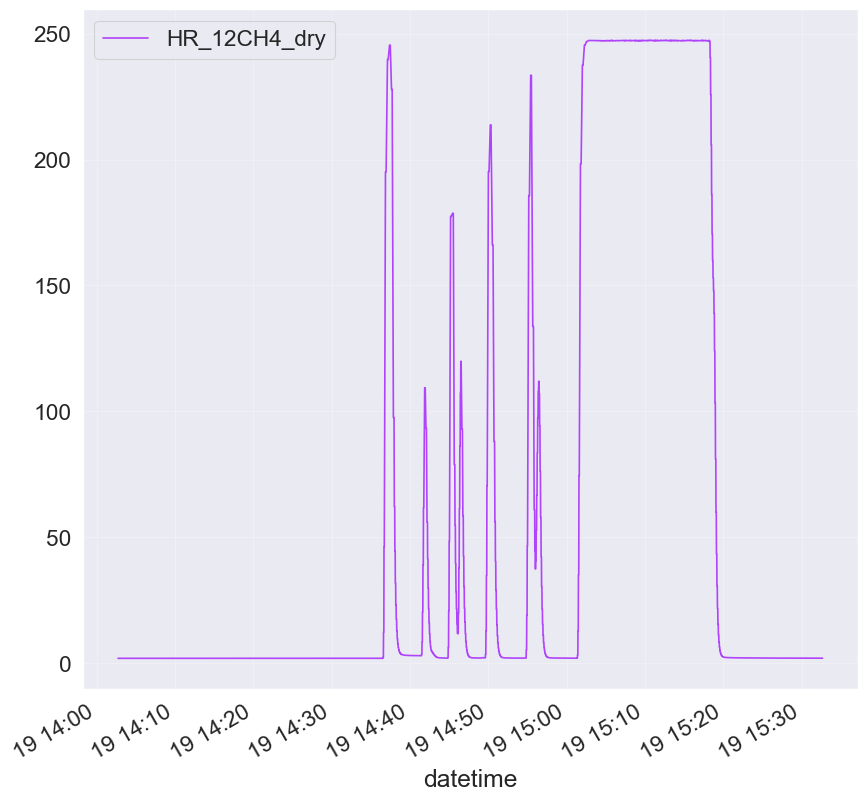

In [334]:
df_tiso_2015.plot(y="HR_12CH4_dry")

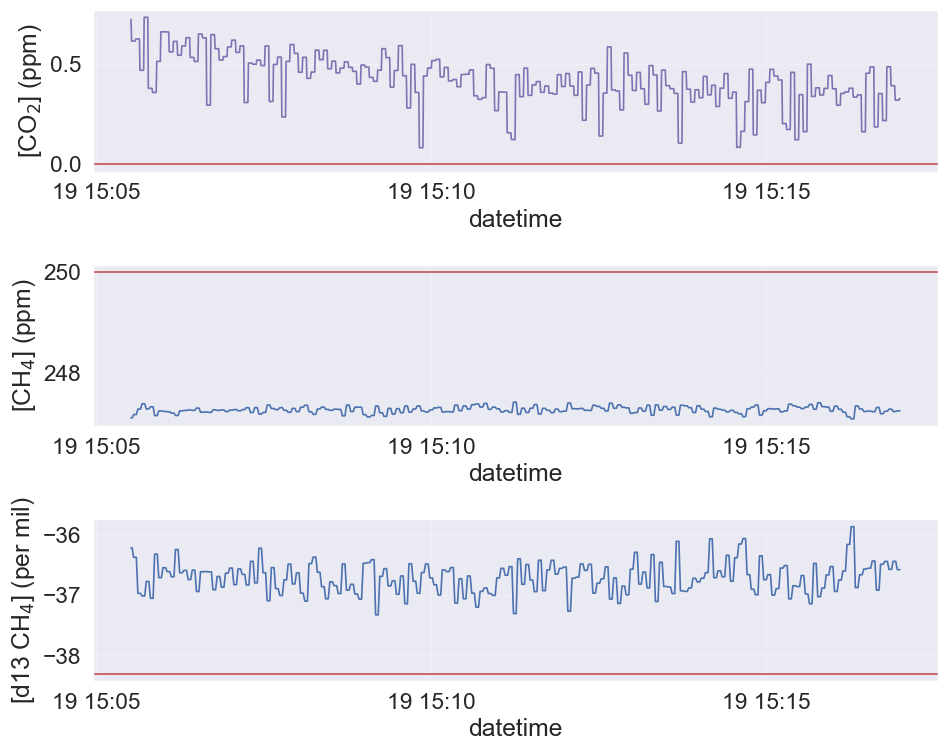

In [335]:
# isolate the calibaration section
df_tiso_2015 = df_tiso_2015.between_time(
    "15:05:30",
    "15:17:00"
)

fig, ax = plt.subplots(3,1, figsize=(10,8), sharey=False)
# co2
sns.lineplot(
    data=df_tiso_2015,
    x=df_tiso_2015.index,
    y="12CO2_dry",
    color="m",
    ax=ax[0]
  )
ax[0].set_ylabel("[CO$_{2}$] (ppm)")
ax[0].axhline(y=0, color="r")

# ch4
sns.lineplot(
    data=df_tiso_2015,
    x=df_tiso_2015.index,
    y="HR_12CH4_dry",
    color="b",
    ax=ax[1]
  )
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].axhline(y=250, color="r")

# # ch4
sns.lineplot(
    data=df_tiso_2015,
    x=df_tiso_2015.index,
    y="HR_Delta_iCH4_Raw",
    color="b",
    ax=ax[2]
  )
ax[2].set_ylabel("[d13 CH$_{4}$] (per mil)")
ax[2].axhline(y=-38.3, color="r")

plt.tight_layout()
plt.show()

In [336]:
"""get descriptive statistics for the calibration period"""
df_tiso_calib_2015_descrip = df_tiso_2015.describe()

df_tiso_calib_2015_descrip

,ALARM_STATUS,HP_12CH4_dry,HR_12CH4_dry,HP_Delta_iCH4_Raw,HR_Delta_iCH4_Raw,Delta_Raw_iCO2,12CO2_dry
count,739.0,739.0,739.000000,739.0,739.000000,739.000000,739.000000
mean,1.0,9999999.0,247.266394,9999999.0,-36.708111,246.550234,0.420531
std,0.0,0.0,0.064745,0.0,0.255767,750.398628,0.125411
min,1.0,9999999.0,247.084557,9999999.0,-37.325278,-1807.985702,0.082354
25%,1.0,9999999.0,247.225139,9999999.0,-36.900637,-299.346777,0.350964
50%,1.0,9999999.0,247.269717,9999999.0,-36.707324,199.965162,0.437080
75%,1.0,9999999.0,247.312844,9999999.0,-36.548850,800.448497,0.499839
max,1.0,9999999.0,247.416784,9999999.0,-35.861532,2475.300552,0.735887


The lower bound of detecttion ($3 * \sigma$, where $\sigma$ = standard deviation)

In [337]:
# ch4
print(
  "The lower level of quantification for the CRDS when measuring the concentration of CH4 is: {:.3f}\n".format(df_tiso_calib_2015_descrip["HR_12CH4_dry"].loc["std"] * 3)
)
print(
    "The lower level of quantification for the CRDS when measuring the d13C composition of CH4 is: {:.3f}\n".format(df_tiso_calib_2015_descrip["HR_Delta_iCH4_Raw"].loc["std"] * 3)
)

The lower level of quantification for the CRDS when measuring the concentration of CH4 is: 0.194

The lower level of quantification for the CRDS when measuring the d13C composition of CH4 is: 0.767



#### Calibration Session (Apr 2018)

This data was collected on 20 Apr 2018. However, it looks like the gas collected was associated with a diluted verison of the large CH4 tank because the data does not match any of the standards.

In [338]:
# consolidate the pertinent columns
df_calib_20Apr2018 = df_calib_2018[[
    "ALARM_STATUS",
    "HP_12CH4_dry",
    "HR_12CH4_dry",
    "HP_Delta_iCH4_Raw",
    "HR_Delta_iCH4_Raw",
    "Delta_Raw_iCO2",
    "12CO2_dry"
  ]]

# set the index to datetime
# df_calib_2018.set_index("DATETIME", drop=True, inplace=True)

df_calib_20Apr2018.info()

<class 'pandas.core.frame.DataFrame'>
Index: 27620 entries, 0 to 27620
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ALARM_STATUS       27620 non-null  float64
 1   HP_12CH4_dry       27620 non-null  float64
 2   HR_12CH4_dry       27620 non-null  float64
 3   HP_Delta_iCH4_Raw  27620 non-null  float64
 4   HR_Delta_iCH4_Raw  27620 non-null  float64
 5   Delta_Raw_iCO2     27620 non-null  float64
 6   12CO2_dry          27620 non-null  float64
dtypes: float64(7)
memory usage: 1.7 MB


<Axes: >

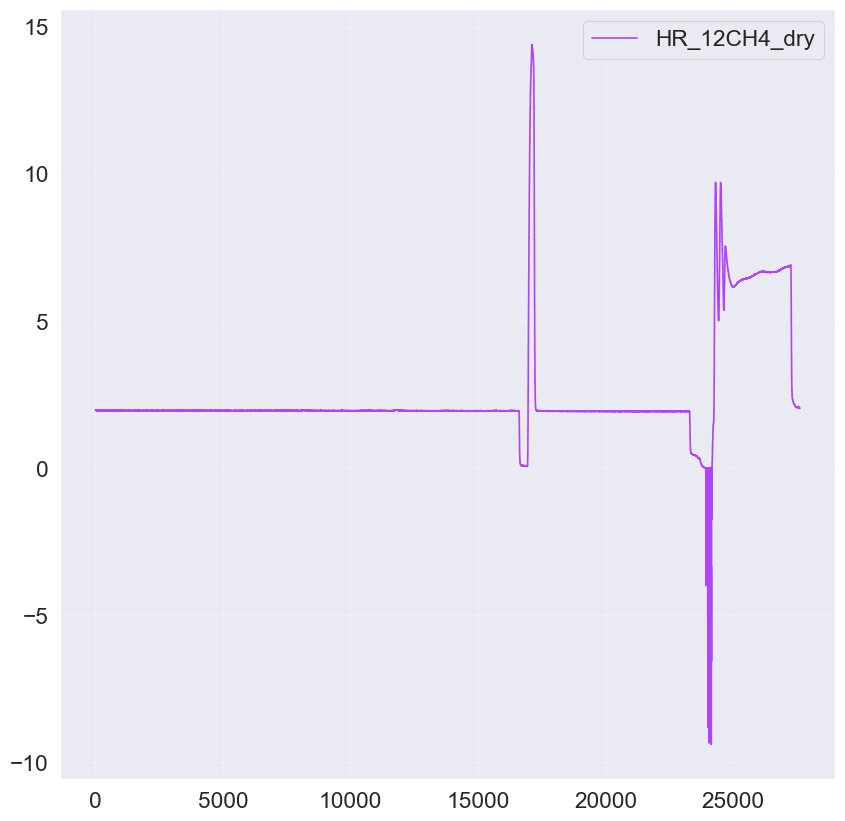

In [339]:
df_calib_20Apr2018.plot(y="HR_12CH4_dry")

<Axes: >

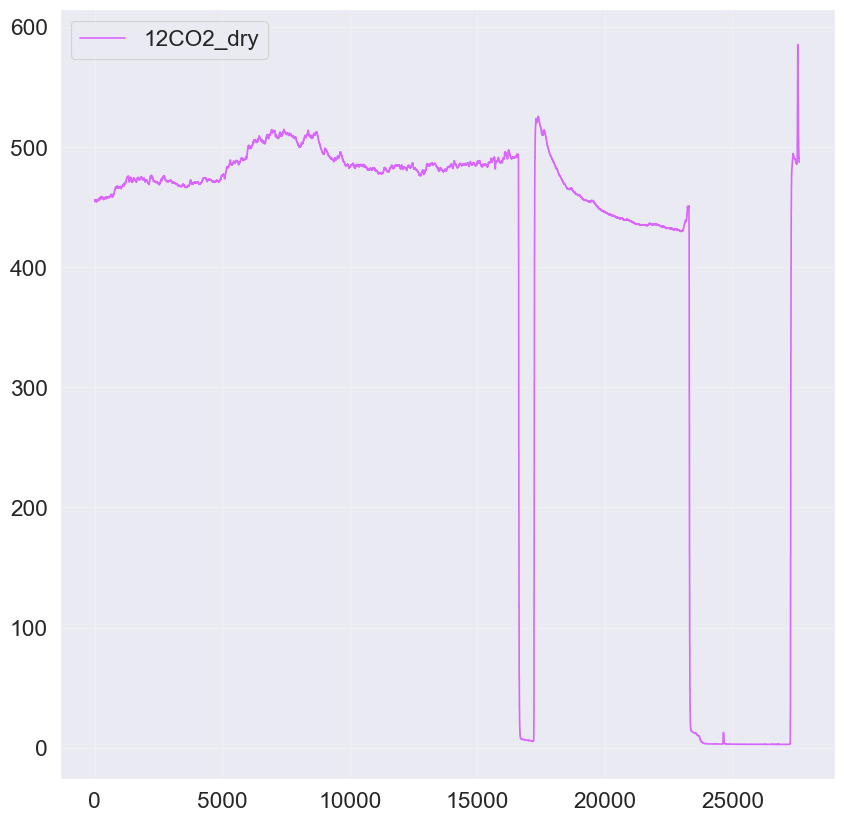

In [340]:
df_calib_20Apr2018.plot(y="12CO2_dry", color=CO2_color1)

Unkown Gas 01

In [341]:
# isolate the calibaration section
df_gas01 = df_calib_20Apr2018.between_time(
    "15:59:30",
    "16:04:35"
)

fig, ax = plt.subplots(4,1, figsize=(10,8), sharey=False)
# co2
sns.lineplot(
    data=df_gas01,
    x=df_gas01.index,
    y="12CO2_dry",
    color=CO2_color1,
    ax=ax[0]
  )
ax[0].set_ylabel("[CO$_{2}$] (ppm)")

# ch4
sns.lineplot(
    data=df_gas01,
    x=df_gas01.index,
    y="HR_12CH4_dry",
    color="b",
    ax=ax[1]
  )
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
# ax[1].axhline(y=10, color="r")

# d13 co2
sns.lineplot(
    data=df_gas01,
    x=df_gas01.index,
    y="Delta_Raw_iCO2",
    color=CO2_color1,
    ax=ax[2]
  )
ax[2].set_ylabel("d13 CO$_{2}$ (per mil)")

# d13 ch4
sns.lineplot(
    data=df_gas01,
    x=df_gas01.index,
    y="HR_Delta_iCH4_Raw",
    color="b",
    ax=ax[3]
  )
ax[3].set_ylabel("d13 CH$_{4}$ (per mil)")
# ax[2].axhline(y=-25, color="r")

plt.tight_layout()
plt.show()

TypeError: Index must be DatetimeIndex

In [342]:
"""get descriptive statistics for the calibration period"""
df_gas01_descrip = df_gas01.describe()

df_gas01_descrip

NameError: name 'df_gas01' is not defined

Unknown Gas 02

In [343]:
# isolate the calibaration section
df_gas02 = df_calib_20Apr2018.between_time(
    "17:55:30",
    "18:32:35"
)

fig, ax = plt.subplots(4,1, figsize=(10,8), sharey=False)
# co2
sns.lineplot(
    data=df_gas02,
    x=df_gas02.index,
    y="12CO2_dry",
    color=CO2_color1,
    ax=ax[0]
  )
ax[0].set_ylabel("[CO$_{2}$] (ppm)")

# ch4
sns.lineplot(
    data=df_gas02,
    x=df_gas02.index,
    y="HR_12CH4_dry",
    color="b",
    ax=ax[1]
  )
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
# ax[1].axhline(y=10, color="r")

# d13 co2
sns.lineplot(
    data=df_gas02,
    x=df_gas02.index,
    y="Delta_Raw_iCO2",
    color=CO2_color1,
    ax=ax[2]
  )
ax[2].set_ylabel("d13 CO$_{2}$ (per mil)")

# d13 ch4
sns.lineplot(
    data=df_gas02,
    x=df_gas02.index,
    y="HR_Delta_iCH4_Raw",
    color="b",
    ax=ax[3]
  )
ax[3].set_ylabel("d13 CH$_{4}$ (per mil)")
# ax[2].axhline(y=-25, color="r")

plt.tight_layout()
plt.show()

TypeError: Index must be DatetimeIndex

#### Calibration Session (Aug 2019)

Biogenic CH4 Standard

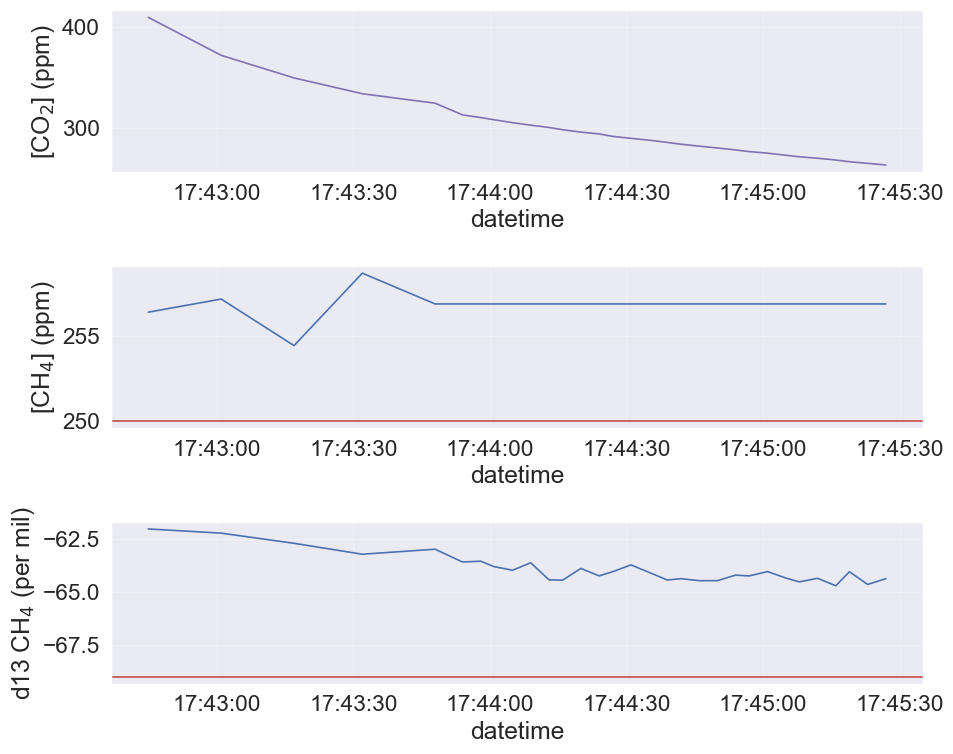

In [344]:
# isolate the calibaration section
df_calib_bio_aug2019 = df_calib_raw_aug2019.between_time(
    "17:42:45",
    "17:45:30"
)

fig, ax = plt.subplots(3,1, figsize=(10,8), sharey=False)
# co2
sns.lineplot(
    data=df_calib_bio_aug2019,
    x=df_calib_bio_aug2019.index,
    y="12CO2_dry",
    color="m",
    ax=ax[0]
  )
ax[0].set_ylabel("[CO$_{2}$] (ppm)")

# ch4
sns.lineplot(
    data=df_calib_bio_aug2019,
    x=df_calib_bio_aug2019.index,
    y="HP_12CH4_dry",
    color="b",
    ax=ax[1]
  )
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].axhline(y=250, color="r")

# # ch4
sns.lineplot(
    data=df_calib_bio_aug2019,
    x=df_calib_bio_aug2019.index,
    y="HP_Delta_iCH4_Raw",
    color="b",
    ax=ax[2]
  )
ax[2].set_ylabel("d13 CH$_{4}$ (per mil)")
ax[2].axhline(y=-69, color="r")

plt.tight_layout()
plt.show()

In [345]:
"""get descriptive statistics for the calibration period"""
df_calib_bio_aug2019_descrip = df_calib_bio_aug2019.describe()

df_calib_bio_aug2019_descrip

,ALARM_STATUS,HP_12CH4_dry,HR_12CH4_dry,HP_Delta_iCH4_Raw,HR_Delta_iCH4_Raw,Delta_Raw_iCO2,12CO2_dry
count,31.000000,31.000000,31.0,31.000000,31.0,31.000000,31.000000
mean,0.258065,256.889864,9999999.0,-63.928952,9999999.0,-29.377039,297.503363
std,0.444803,0.568719,0.0,0.677863,0.0,0.727766,32.587912
min,0.000000,254.450800,9999999.0,-64.709229,9999999.0,-30.893124,263.271088
25%,0.000000,256.916946,9999999.0,-64.401777,9999999.0,-29.872746,275.731824
50%,0.000000,256.916946,9999999.0,-64.079985,9999999.0,-29.433817,289.625466
75%,0.500000,256.916946,9999999.0,-63.672649,9999999.0,-28.885432,306.539247
max,1.000000,258.739946,9999999.0,-62.024840,9999999.0,-28.015604,409.302607


The lower bound of detecttion ($3 * \sigma$, where $\sigma$ = standard deviation)

In [346]:
# ch4
print(
  "The lower level of quantification for the CRDS when measuring the concentration of CH4 is: {:.3f}\n".format(df_calib_bio_aug2019_descrip["HP_12CH4_dry"].loc["std"] * 3)
)
print(
    "The lower level of quantification for the CRDS when measuring the d13C composition of CH4 is: {:.3f}\n".format(df_calib_bio_aug2019_descrip["HP_Delta_iCH4_Raw"].loc["std"] * 3)
)

The lower level of quantification for the CRDS when measuring the concentration of CH4 is: 1.706

The lower level of quantification for the CRDS when measuring the d13C composition of CH4 is: 2.034



Thermogenic CH4 Standard

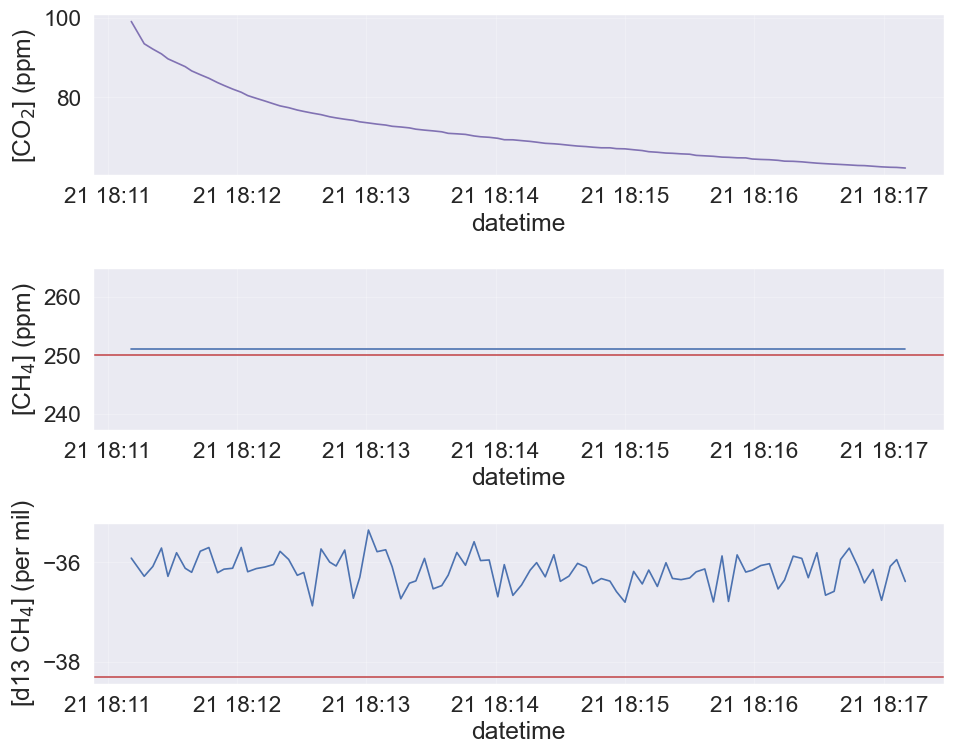

In [347]:
# isolate the calibaration section
df_calib_therm_aug2019 = df_calib_raw_aug2019.between_time(
    "18:11:00",
    "18:17:10"
)

fig, ax = plt.subplots(3,1, figsize=(10,8), sharey=False)
# co2
sns.lineplot(
    data=df_calib_therm_aug2019,
    x=df_calib_therm_aug2019.index,
    y="12CO2_dry",
    color="m",
    ax=ax[0]
  )
ax[0].set_ylabel("[CO$_{2}$] (ppm)")

# ch4
sns.lineplot(
    data=df_calib_therm_aug2019,
    x=df_calib_therm_aug2019.index,
    y="HP_12CH4_dry",
    color="b",
    ax=ax[1]
  )
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].axhline(y=250, color="r")

# # ch4
sns.lineplot(
    data=df_calib_therm_aug2019,
    x=df_calib_therm_aug2019.index,
    y="HP_Delta_iCH4_Raw",
    color="b",
    ax=ax[2]
  )
ax[2].set_ylabel("[d13 CH$_{4}$] (per mil)")
ax[2].axhline(y=-38.3, color="r")

plt.tight_layout()
plt.show()

In [348]:
"""get descriptive statistics for the calibration period"""
df_calib_therm_aug2019_descrip = df_calib_therm_aug2019.describe()

df_calib_therm_aug2019_descrip

,ALARM_STATUS,HP_12CH4_dry,HR_12CH4_dry,HP_Delta_iCH4_Raw,HR_Delta_iCH4_Raw,Delta_Raw_iCO2,12CO2_dry
count,97.000000,9.700000e+01,97.0,97.000000,97.0,97.000000,97.000000
mean,0.041237,2.510835e+02,9999999.0,-36.170092,9999999.0,-23.150550,71.538257
std,0.199871,5.713871e-14,0.0,0.311293,0.0,3.229258,8.254370
min,0.000000,2.510835e+02,9999999.0,-36.875034,9999999.0,-33.245207,62.274882
25%,0.000000,2.510835e+02,9999999.0,-36.374150,9999999.0,-24.750043,65.212335
50%,0.000000,2.510835e+02,9999999.0,-36.144153,9999999.0,-22.927098,69.144891
75%,0.000000,2.510835e+02,9999999.0,-35.944823,9999999.0,-21.019197,75.132236
max,1.000000,2.510835e+02,9999999.0,-35.350074,9999999.0,-16.031152,99.023055


The lower bound of detecttion ($3 * \sigma$, where $\sigma$ = standard deviation)

In [349]:
# ch4
print(
  "The lower level of quantification for the CRDS when measuring the concentration of CH4 is: {:.3e}\n".format(df_calib_therm_aug2019_descrip["HP_12CH4_dry"].loc["std"] * 3)
)
print(
    "The lower level of quantification for the CRDS when measuring the d13C composition of CH4 is: {:.3f}\n".format(df_calib_therm_aug2019_descrip["HP_Delta_iCH4_Raw"].loc["std"] * 3)
)

The lower level of quantification for the CRDS when measuring the concentration of CH4 is: 1.714e-13

The lower level of quantification for the CRDS when measuring the d13C composition of CH4 is: 0.934



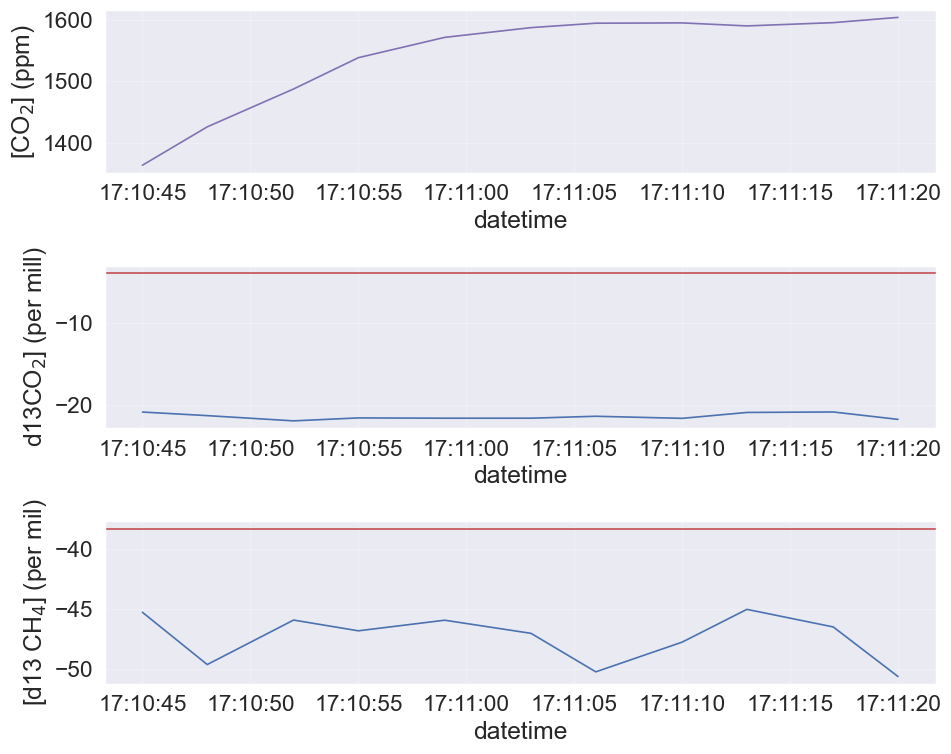

In [350]:
# isolate the calibaration section
df_calib_aug2019_co2 = df_calib_raw_aug2019.between_time(
    "17:10:45",
    "17:11:20"
)

fig, ax = plt.subplots(3,1, figsize=(10,8), sharey=False)
# co2
sns.lineplot(
    data=df_calib_aug2019_co2,
    x=df_calib_aug2019_co2.index,
    y="12CO2_dry",
    color="m",
    ax=ax[0]
  )
ax[0].set_ylabel("[CO$_{2}$] (ppm)")

# d13Co2
sns.lineplot(
    data=df_calib_aug2019_co2,
    x=df_calib_aug2019_co2.index,
    y="Delta_Raw_iCO2",
    color="b",
    ax=ax[1]
  )
ax[1].set_ylabel("d13CO$_{2}$] (per mill)")
ax[1].axhline(y=-4, color="r")

# # ch4
sns.lineplot(
    data=df_calib_aug2019_co2,
    x=df_calib_aug2019_co2.index,
    y="HP_Delta_iCH4_Raw",
    color="b",
    ax=ax[2]
  )
ax[2].set_ylabel("[d13 CH$_{4}$] (per mil)")
ax[2].axhline(y=-38.3, color="r")

plt.tight_layout()
plt.show()

#### Calibration Session (Jun 2020)

Get the relevant columns and set the new dataframe with the index of `DATETIME`.

In [351]:
# consolidate the pertinent columns
df_tiso_2020 = df_calib_2020[[
    "ALARM_STATUS",
    "HP_12CH4_dry",
    "HR_12CH4_dry",
    "HP_Delta_iCH4_Raw",
    "HR_Delta_iCH4_Raw",
    "Delta_Raw_iCO2",
    "12CO2_dry"
  ]]

# set the index to datetime
# df_tiso_2020.set_index("DATETIME", drop=True, inplace=True)

df_tiso_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77341 entries, 0 to 77340
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ALARM_STATUS       77341 non-null  int64  
 1   HP_12CH4_dry       77341 non-null  float64
 2   HR_12CH4_dry       77340 non-null  float64
 3   HP_Delta_iCH4_Raw  77341 non-null  float64
 4   HR_Delta_iCH4_Raw  77340 non-null  float64
 5   Delta_Raw_iCO2     77340 non-null  float64
 6   12CO2_dry          77340 non-null  float64
dtypes: float64(6), int64(1)
memory usage: 4.1 MB


<Axes: >

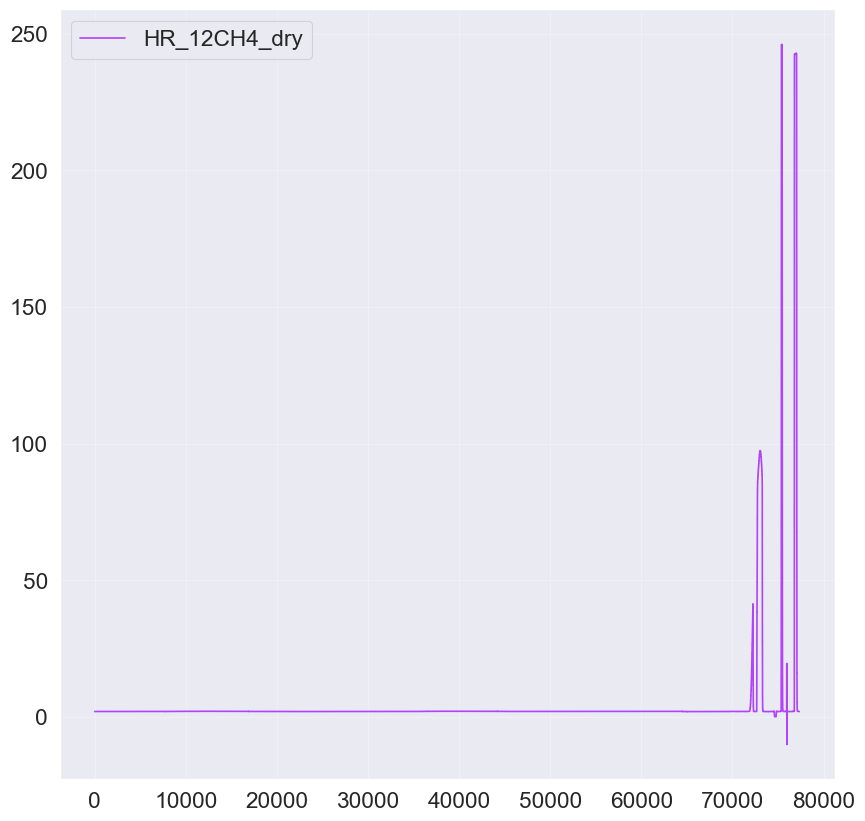

In [352]:
df_tiso_2020.plot(y="HR_12CH4_dry")

In [353]:
# isolate the calibaration section
df_tiso_bio_jun2020 = df_tiso_2020.between_time(
    "18:09:30",
    "18:14:30"
)

fig, ax = plt.subplots(3,1, figsize=(10,8), sharey=False)
# co2
sns.lineplot(
    data=df_tiso_bio_jun2020,
    x=df_tiso_bio_jun2020.index,
    y="12CO2_dry",
    color="m",
    ax=ax[0]
  )
ax[0].set_ylabel("[CO$_{2}$] (ppm)")

# ch4
sns.lineplot(
    data=df_tiso_bio_jun2020,
    x=df_tiso_bio_jun2020.index,
    y="HR_12CH4_dry",
    color="b",
    ax=ax[1]
  )
ax[1].set_ylabel("[CH$_{4}$] (ppm)")
ax[1].axhline(y=250, color="r")

# # ch4
sns.lineplot(
    data=df_tiso_bio_jun2020,
    x=df_tiso_bio_jun2020.index,
    y="HR_Delta_iCH4_Raw",
    color="b",
    ax=ax[2]
  )
ax[2].set_ylabel("d13 CH$_{4}$ (per mil)")
ax[2].axhline(y=-69, color="r")

plt.tight_layout()
plt.show()

TypeError: Index must be DatetimeIndex

In [354]:
"""get descriptive statistics for the calibration period"""
df_tiso_bio_jun2020_descrip = df_tiso_bio_jun2020.describe()

df_tiso_bio_jun2020_descrip

NameError: name 'df_tiso_bio_jun2020' is not defined

In [355]:
# ch4
print(
  "The lower level of quantification for the CRDS when measuring the concentration of CH4 is: {:.3f}\n".format(df_tiso_bio_jun2020_descrip["HR_12CH4_dry"].loc["std"] * 3)
)
print(
    "The lower level of quantification for the CRDS when measuring the d13C composition of CH4 is: {:.3f}\n".format(df_tiso_bio_jun2020_descrip["HR_Delta_iCH4_Raw"].loc["std"] * 3)
)

NameError: name 'df_tiso_bio_jun2020_descrip' is not defined

Calibration Session 2020 - CO$_{2}$

<Axes: >

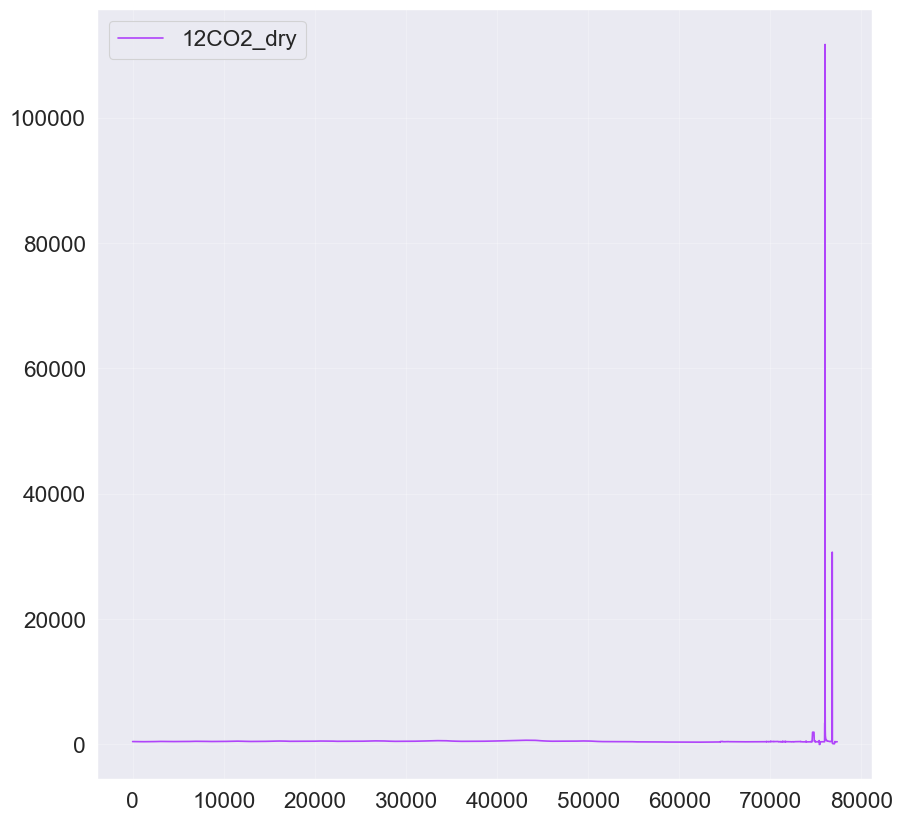

In [356]:
df_tiso_2020.plot(y="12CO2_dry")

In [357]:
# isolate the calibaration section
df_tiso_2020_co2 = df_tiso_2020.between_time(
    "17:31:45",
    "17:33:30"
)

fig, ax = plt.subplots(3,1, figsize=(10,8), sharey=False)
# co2
sns.lineplot(
    data=df_tiso_2020_co2,
    x=df_tiso_2020_co2.index,
    y="12CO2_dry",
    color="m",
    ax=ax[0]
  )
ax[0].set_ylabel("[CO$_{2}$] (ppm)")

# ch4
sns.lineplot(
    data=df_tiso_2020_co2,
    x=df_tiso_2020_co2.index,
    y="HR_12CH4_dry",
    color="b",
    ax=ax[1]
  )
ax[1].set_ylabel("[CH$_{4}$] (ppm)")

# # ch4
sns.lineplot(
    data=df_tiso_2020_co2,
    x=df_tiso_2020_co2.index,
    y="Delta_Raw_iCO2",
    color="m",
    ax=ax[2]
  )
ax[2].set_ylabel("d13 CO$_{2}$ (per mil)")

plt.tight_layout()
plt.show()

TypeError: Index must be DatetimeIndex

In [358]:
"""get descriptive statistics for the calibration period"""
df_tiso_2020_co2_descrip = df_tiso_2020_co2.describe()

df_tiso_2020_co2_descrip

NameError: name 'df_tiso_2020_co2' is not defined

In [359]:
# print the descriptive statsistics
print(
  "The lower level of quantification for the CRDS when measuring the concentration of CO2 is: {:.3f}\n".format(df_tiso_2020_co2_descrip["12CO2_dry"].loc["std"] * 3)
)
print(
    "The lower level of quantification for the CRDS when measuring the d13C composition of CO2 is: {:.3f}\n".format(df_tiso_2020_co2_descrip["Delta_Raw_iCO2"].loc["std"] * 3)
)

NameError: name 'df_tiso_2020_co2_descrip' is not defined

In [360]:
# isolate the calibaration section
df_tiso_2020_ch4 = df_tiso_2020.between_time(
    "17:43:30",
    "17:45:05"
)

fig, ax = plt.subplots(3,1, figsize=(10,8), sharey=False)
# co2
sns.lineplot(
    data=df_tiso_2020_ch4,
    x=df_tiso_2020_ch4.index,
    y="12CO2_dry",
    color="m",
    ax=ax[0]
  )
ax[0].set_ylabel("[CO$_{2}$] (ppm)")

# ch4
sns.lineplot(
    data=df_tiso_2020_ch4,
    x=df_tiso_2020_ch4.index,
    y="HR_12CH4_dry",
    color="b",
    ax=ax[1]
  )
ax[1].set_ylabel("[CH$_{4}$] (ppm)")

# ch4
sns.lineplot(
    data=df_tiso_2020_ch4,
    x=df_tiso_2020_ch4.index,
    y="HR_Delta_iCH4_Raw",
    color="m",
    ax=ax[2]
  )
ax[2].set_ylabel("d13 CH$_{4}$ (per mil)")

plt.tight_layout()
plt.show()

TypeError: Index must be DatetimeIndex

In [361]:
"""get descriptive statistics for the calibration period"""
df_tiso_2020_ch4_descrip = df_tiso_2020_ch4.describe()

df_tiso_2020_ch4_descrip

NameError: name 'df_tiso_2020_ch4' is not defined

In [362]:
# print the descriptive statsistics
print(
  "The lower level of quantification for the CRDS when measuring the concentration of CH4 is: {:.3f}\n".format(df_tiso_2020_ch4_descrip["HR_12CH4_dry"].loc["std"] * 3)
)
print(
    "The lower level of quantification for the CRDS when measuring the d13C composition of CH4 is: {:.3f}\n".format(df_tiso_2020_ch4_descrip["HR_Delta_iCH4_Raw"].loc["std"] * 3)
)

NameError: name 'df_tiso_2020_ch4_descrip' is not defined